正在加载数据: analysis_results/results_bin100_complete_fixed.h5ad ...
Data shape: (19425, 27682)
Obs columns (部分): ['total_counts', 'n_genes_by_counts', 'pct_counts_mt', 'orig.ident', 'x']
检测到 5 种多巴胺能相关细胞类型: ['q05_cell_abundance_w_sf_0143 OB Meis2 Thsd7b Gaba_1', 'q05_cell_abundance_w_sf_0144 OB Meis2 Thsd7b Gaba_2', 'q05_cell_abundance_w_sf_0145 OB Meis2 Thsd7b Gaba_3', 'q05_cell_abundance_w_sf_0146 OB Meis2 Thsd7b Gaba_4', 'q05_cell_abundance_w_sf_0147 OB Meis2 Thsd7b Gaba_5']


/tmp/ipykernel_236669/3221947474.py:52: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_236669/3221947474.py:65: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


验证图表已保存至: SNCA_vs_DA_Validation_Bin100.png


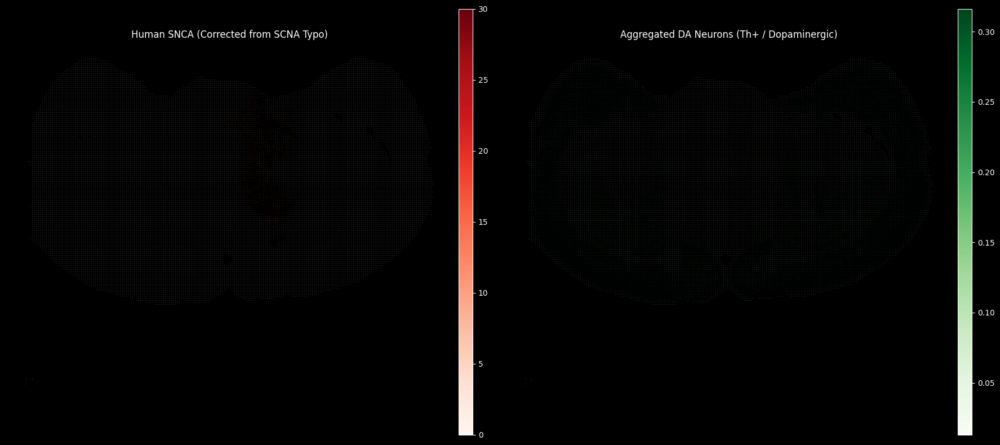

In [1]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# === 1. 环境与绘图设置 ===
# 启用黑色背景风格，模拟荧光显微镜视野，增强对比度
plt.style.use('dark_background')
# 设置绘图参数，spot_size 根据 Bin100 (50um) 设置为 10-20 之间
SPOT_SIZE = 15 

# === 2. 加载数据 ===
file_path = 'analysis_results/results_bin100_complete_fixed.h5ad'
print(f"正在加载数据: {file_path} ...")
adata = sc.read_h5ad(file_path)

# 快速检查数据完整性
print(f"Data shape: {adata.shape}")
print(f"Obs columns (部分): {list(adata.obs.columns[:5])}")

# === 3. 核心数据准备 ===

# [任务 A] 验证人源 SNCA (已在 obs 中，直接使用)
if 'expr_SNCA' not in adata.obs.columns:
    raise ValueError("关键错误：未在 adata.obs 中找到 'expr_SNCA'。请检查上游修复步骤。")

# [任务 B] 聚合多巴胺能神经元 (Dopaminergic Neurons)
# 假设 cell abundance 存储在 obsm 的 DataFrame 中
abundance_key = 'q05_cell_abundance_w_sf'
if isinstance(adata.obsm[abundance_key], pd.DataFrame):
    abundance_df = adata.obsm[abundance_key]
else:
    # 如果是 numpy array，尝试构建 DF (通常 cell2location 存为 DF，这里做个防御性编程)
    print("Warning: obsm is not a DataFrame, checking uns for columns...")
    # 这种情况视具体 cell2location 版本而定，默认按 DataFrame 处理
    abundance_df = pd.DataFrame(adata.obsm[abundance_key], index=adata.obs_names)

# 模糊搜索包含 'Th' (Tyrosine Hydroxylase) 或 'Dopaminergic' 的细胞类型
target_keywords = ['Th', 'Dopaminergic']
da_cols = [col for col in abundance_df.columns if any(k in col for k in target_keywords)]

print(f"检测到 {len(da_cols)} 种多巴胺能相关细胞类型: {da_cols}")

# 计算总丰度并存入 obs
adata.obs['Total_DA_Neurons'] = abundance_df[da_cols].sum(axis=1).values

# === 4. 可视化绘制 (Figure 1, 2, 3 合并) ===

fig, axs = plt.subplots(1, 2, figsize=(18, 8))

# 子图 1: 人源 SNCA (针道验证)
sc.pl.spatial(
    adata,
    color='expr_SNCA',
    cmap='Reds',           # 红色显示过表达
    spot_size=SPOT_SIZE,
    frameon=False,
    title="Human SNCA (Corrected from SCNA Typo)",
    ax=axs[0],
    show=False,
    vmax='p99'             # 自动处理极值点，避免个别噪点影响整体对比度
)

# 子图 2: 多巴胺能神经元 (Lesion 验证)
sc.pl.spatial(
    adata,
    color='Total_DA_Neurons',
    cmap='Greens',         # 绿色显示神经元
    spot_size=SPOT_SIZE,
    frameon=False,
    title="Aggregated DA Neurons (Th+ / Dopaminergic)",
    ax=axs[1],
    show=False,
    vmax='p99'
)

# 调整布局
plt.tight_layout()

# 保存结果
output_filename = 'SNCA_vs_DA_Validation_Bin100.png'
plt.savefig(output_filename, dpi=300, bbox_inches='tight')
print(f"验证图表已保存至: {output_filename}")

# 如果在 Jupyter 环境中，可以取消注释下行以显示
# plt.show()

In [2]:
import scanpy as sc
import pandas as pd
import numpy as np

# 1. 加载数据
file_path = 'analysis_results/results_bin100_complete_fixed.h5ad'
print(f"正在加载数据: {file_path} ...")
adata = sc.read_h5ad(file_path)

# 2. 获取 Cell2location 丰度数据
# 假设数据存储为 DataFrame (标准格式)
if isinstance(adata.obsm['q05_cell_abundance_w_sf'], pd.DataFrame):
    abundance_df = adata.obsm['q05_cell_abundance_w_sf']
else:
    # 如果是 numpy array，尝试从 uns 中获取列名 (兼容性处理)
    print("检测到 obsm 为数组，尝试获取列名...")
    try:
        # 常见于 cell2location 的存储位置
        col_names = adata.uns['mod']['factor_names'] 
    except KeyError:
        # 备用位置
        col_names = [f"CellType_{i}" for i in range(adata.obsm['q05_cell_abundance_w_sf'].shape[1])]
    
    abundance_df = pd.DataFrame(
        adata.obsm['q05_cell_abundance_w_sf'], 
        index=adata.obs_names, 
        columns=col_names
    )

print(f"原始细胞类型总数: {abundance_df.shape[1]}")

# 3. 导出所有细胞类型到 obs (这一步会增加 obs 的列数)
# 使用 pd.concat 提高效率，避免逐列赋值的性能损耗
adata.obs = pd.concat([adata.obs, abundance_df], axis=1)
print("已将所有细胞类型丰度导出至 adata.obs")

# 4. 合并指定类别 (Glut, GABA, Sero, Epen)
target_categories = ['Glut', 'GABA', 'Sero', 'Epen']
merged_columns = set()

print("\n--- 合并统计 ---")
for cat in target_categories:
    # 模糊匹配：只要列名中包含关键词（不区分大小写）即由该类统计
    # 注意：这里假设一个细胞类型只属于一个大类，或者允许被多次统计到不同大类中
    matched_cols = [col for col in abundance_df.columns if cat.lower() in col.lower()]
    
    if matched_cols:
        # 创建合并列，例如 'Total_Glut'
        new_col_name = f'Total_{cat}'
        adata.obs[new_col_name] = abundance_df[matched_cols].sum(axis=1)
        
        # 记录被合并的列
        merged_columns.update(matched_cols)
        print(f"类别 '{cat}': 合并了 {len(matched_cols)} 种细胞类型 -> 生成 '{new_col_name}'")
    else:
        print(f"类别 '{cat}': 未找到匹配的细胞类型")

# 5. 统计剩余细胞类型
all_columns = set(abundance_df.columns)
remaining_columns = list(all_columns - merged_columns)
remaining_columns.sort()

print("\n" + "="*30)
print(f"【分析结果总结】")
print(f"1. 原始细胞类型总数 : {len(all_columns)}")
print(f"2. 被合并的类型数量 : {len(merged_columns)} (归入 Glut/GABA/Sero/Epen)")
print(f"3. 剩余细胞类型数量 : {len(remaining_columns)}")
print("="*30)

if len(remaining_columns) > 0:
    print(f"\n剩余细胞类型示例 (前 10 个):\n{remaining_columns[:10]}")
    # 如果想看全部，取消下面这行的注释
    # print(f"所有剩余类型: {remaining_columns}")

# 保存修改后的对象（可选）
# adata.write_h5ad('analysis_results/results_bin100_annotated.h5ad')

正在加载数据: analysis_results/results_bin100_complete_fixed.h5ad ...
原始细胞类型总数: 1131
已将所有细胞类型丰度导出至 adata.obs

--- 合并统计 ---
类别 'Glut': 合并了 526 种细胞类型 -> 生成 'Total_Glut'
类别 'GABA': 合并了 537 种细胞类型 -> 生成 'Total_GABA'
类别 'Sero': 合并了 7 种细胞类型 -> 生成 'Total_Sero'
类别 'Epen': 合并了 4 种细胞类型 -> 生成 'Total_Epen'

【分析结果总结】
1. 原始细胞类型总数 : 1131
2. 被合并的类型数量 : 1066 (归入 Glut/GABA/Sero/Epen)
3. 剩余细胞类型数量 : 65

剩余细胞类型示例 (前 10 个):
['q05_cell_abundance_w_sf_0140 DG-PIR Ex IMN_1', 'q05_cell_abundance_w_sf_0141 DG-PIR Ex IMN_2', 'q05_cell_abundance_w_sf_0142 DG-PIR Ex IMN_3', 'q05_cell_abundance_w_sf_0166 OB-STR-CTX Inh IMN_1', 'q05_cell_abundance_w_sf_0167 OB-STR-CTX Inh IMN_2', 'q05_cell_abundance_w_sf_0168 OB-STR-CTX Inh IMN_3', 'q05_cell_abundance_w_sf_0169 OB-STR-CTX Inh IMN_4', 'q05_cell_abundance_w_sf_0170 OB-STR-CTX Inh IMN_5', 'q05_cell_abundance_w_sf_0171 OB-STR-CTX Inh IMN_6', 'q05_cell_abundance_w_sf_0172 OB-STR-CTX Inh IMN_7']


In [3]:
import scanpy as sc
import pandas as pd
import numpy as np
import re

# 1. 加载数据
file_path = 'analysis_results/results_bin100_complete_fixed.h5ad'
print(f"Loading: {file_path} ...")
adata = sc.read_h5ad(file_path)

# 2. 提取原始丰度数据
if isinstance(adata.obsm['q05_cell_abundance_w_sf'], pd.DataFrame):
    abundance_df = adata.obsm['q05_cell_abundance_w_sf']
else:
    # 兼容处理
    col_names = adata.uns.get('mod', {}).get('factor_names', 
                [f"Type_{i}" for i in range(adata.obsm['q05_cell_abundance_w_sf'].shape[1])])
    abundance_df = pd.DataFrame(adata.obsm['q05_cell_abundance_w_sf'], 
                                index=adata.obs_names, columns=col_names)

print(f"原始细分类型数量: {abundance_df.shape[1]}")

# ==========================================
# 核心步骤：合并末尾数字不同的列 (e.g., Type_1, Type_2 -> Type)
# ==========================================

def get_base_name(col_name):
    # 正则逻辑：匹配字符串末尾的 "下划线+数字" (如 _1, _12) 并去除
    # 如果没匹配到（如 Astrocyte），则保持原名
    return re.sub(r'_\d+$', '', col_name)

# 1. 生成映射关系：原始列名 -> 去除数字后的基名
base_names = [get_base_name(col) for col in abundance_df.columns]

# 2. 使用 groupby 进行列合并 (axis=1) 并求和
# 这步会自动将 "DG-PIR Ex IMN_1" 和 "DG-PIR Ex IMN_2" 加在一起变成 "DG-PIR Ex IMN"
merged_abundance_df = abundance_df.groupby(base_names, axis=1).sum()

print(f"合并数字后缀后类型数量: {merged_abundance_df.shape[1]} (减少了 {abundance_df.shape[1] - merged_abundance_df.shape[1]} 列)")

# ==========================================
# 导出与大类合并
# ==========================================

# 3. 将合并数字后的干净数据写入 adata.obs
adata.obs = pd.concat([adata.obs, merged_abundance_df], axis=1)

# 4. 再次合并四大类 (Glut, GABA, Sero, Epen)
target_categories = ['Glut', 'GABA', 'Sero', 'Epen']
broad_category_cols = set()

print("\n--- 大类合并统计 ---")
for cat in target_categories:
    # 在已经合并过数字的 columns 里找
    matched_cols = [col for col in merged_abundance_df.columns if cat.lower() in col.lower()]
    
    if matched_cols:
        new_col_name = f'Total_{cat}'
        # 计算总和
        adata.obs[new_col_name] = merged_abundance_df[matched_cols].sum(axis=1)
        broad_category_cols.update(matched_cols)
        print(f"类别 '{cat}': 聚合了 {len(matched_cols)} 个基类 -> '{new_col_name}'")

# ==========================================
# 最终统计
# ==========================================

# 所有的基类列
all_base_cols = set(merged_abundance_df.columns)
# 减去被四大类归并的列
remaining_cols = list(all_base_cols - broad_category_cols)
remaining_cols.sort()

print("\n" + "="*40)
print(f"【最终数据资产盘点】")
print(f"1. 原始细分类型     : {abundance_df.shape[1]}")
print(f"2. 去除数字后缀后   : {merged_abundance_df.shape[1]} (这是写入obs的实际列)")
print(f"3. 归入四大类(Glut等): {len(broad_category_cols)}")
print(f"4. 真正剩余的类型   : {len(remaining_cols)}")
print("="*40)

if len(remaining_cols) > 0:
    print(f"\n剩余未归类细胞类型 (前 20 个):")
    # 打印得稍微整齐点
    for i in range(0, min(20, len(remaining_cols)), 2):
        print(f"{remaining_cols[i]:<40} {remaining_cols[i+1] if i+1 < len(remaining_cols) else ''}")

# 可选：保存清洗后的数据
# adata.write_h5ad('analysis_results/results_bin100_cleaned.h5ad')

Loading: analysis_results/results_bin100_complete_fixed.h5ad ...
原始细分类型数量: 1131
合并数字后缀后类型数量: 1131 (减少了 0 列)

--- 大类合并统计 ---
类别 'Glut': 聚合了 526 个基类 -> 'Total_Glut'
类别 'GABA': 聚合了 537 个基类 -> 'Total_GABA'
类别 'Sero': 聚合了 7 个基类 -> 'Total_Sero'
类别 'Epen': 聚合了 4 个基类 -> 'Total_Epen'

【最终数据资产盘点】
1. 原始细分类型     : 1131
2. 去除数字后缀后   : 1131 (这是写入obs的实际列)
3. 归入四大类(Glut等): 1066
4. 真正剩余的类型   : 65

剩余未归类细胞类型 (前 20 个):
q05_cell_abundance_w_sf_0140 DG-PIR Ex IMN q05_cell_abundance_w_sf_0141 DG-PIR Ex IMN
q05_cell_abundance_w_sf_0142 DG-PIR Ex IMN q05_cell_abundance_w_sf_0166 OB-STR-CTX Inh IMN
q05_cell_abundance_w_sf_0167 OB-STR-CTX Inh IMN q05_cell_abundance_w_sf_0168 OB-STR-CTX Inh IMN
q05_cell_abundance_w_sf_0169 OB-STR-CTX Inh IMN q05_cell_abundance_w_sf_0170 OB-STR-CTX Inh IMN
q05_cell_abundance_w_sf_0171 OB-STR-CTX Inh IMN q05_cell_abundance_w_sf_0172 OB-STR-CTX Inh IMN
q05_cell_abundance_w_sf_0880 SNc-VTA-RAmb Foxa1 Dopa q05_cell_abundance_w_sf_0881 SNc-VTA-RAmb Foxa1 Dopa
q05_cell_abundance_w_sf_0

/tmp/ipykernel_236669/4003512597.py:37: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  merged_abundance_df = abundance_df.groupby(base_names, axis=1).sum()


In [4]:
import scanpy as sc
import pandas as pd
import numpy as np
import re

# 1. 加载数据
adata = sc.read_h5ad('analysis_results/results_bin100_complete_fixed.h5ad')
abundance_df = adata.obsm['q05_cell_abundance_w_sf']

# 如果是 numpy array 转 DataFrame (确保代码健壮性)
if not isinstance(abundance_df, pd.DataFrame):
    col_names = adata.uns.get('mod', {}).get('factor_names', 
                [f"Type_{i}" for i in range(abundance_df.shape[1])])
    abundance_df = pd.DataFrame(abundance_df, index=adata.obs_names, columns=col_names)

print(f"原始列数: {abundance_df.shape[1]}")

# ==========================================
# 步骤 1: 清洗列名 (关键修正)
# ==========================================
def clean_name(col_name):
    # 正则逻辑：替换掉 "q05_cell_abundance_w_sf_" 加上后面的 "4位数字" 和 "空格"
    # 原始: "q05_cell_abundance_w_sf_0140 DG-PIR Ex IMN"
    # 结果: "DG-PIR Ex IMN"
    new_name = re.sub(r'q05_cell_abundance_w_sf_\d+\s+', '', col_name)
    return new_name

# 生成清洗后的基名列表
clean_names = [clean_name(col) for col in abundance_df.columns]

# ==========================================
# 步骤 2: 按清洗后的名称合并 (修复 FutureWarning)
# ==========================================
# 使用转置(T) + groupby + 转置(T) 来替代 axis=1，符合 Pandas 新版规范
merged_df = abundance_df.T.groupby(clean_names).sum().T

print(f"合并重复ID后，唯一生物学类型数量: {merged_df.shape[1]}")
print(f"本次操作成功合并了 {abundance_df.shape[1] - merged_df.shape[1]} 个冗余列")

# 更新 obs (先清空旧的 cell2loc 数据以免混淆，或者直接覆盖)
# 这里我们把清洗合并后的数据加入 obs
adata.obs = pd.concat([adata.obs, merged_df], axis=1)

# ==========================================
# 步骤 3: 排除已知的四大类
# ==========================================
known_categories = ['Glut', 'GABA', 'Sero', 'Epen']
captured_cols = set()

# 模拟之前的合并逻辑，标记哪些已经被归类了
for col in merged_df.columns:
    for cat in known_categories:
        if cat.lower() in col.lower():
            captured_cols.add(col)
            break

# 找出剩下的
remaining_cols = sorted(list(set(merged_df.columns) - captured_cols))

# ==========================================
# 步骤 4: 打印剩余列表
# ==========================================
print("\n" + "="*50)
print(f"【待处理的剩余细胞类型】 (共 {len(remaining_cols)} 种)")
print("请根据以下列表决定新的合并关键词 (如 Dopa, Chol, Astro, Micro 等)")
print("="*50 + "\n")

for col in remaining_cols:
    print(col)

原始列数: 1131
合并重复ID后，唯一生物学类型数量: 1131
本次操作成功合并了 0 个冗余列

【待处理的剩余细胞类型】 (共 65 种)
请根据以下列表决定新的合并关键词 (如 Dopa, Chol, Astro, Micro 等)

ABC NN_1
Astro-CB NN_1
Astro-NT NN_1
Astro-NT NN_2
Astro-OLF NN_1
Astro-OLF NN_2
Astro-OLF NN_3
Astro-TE NN_1
Astro-TE NN_2
Astro-TE NN_3
Astro-TE NN_4
Astro-TE NN_5
B cells NN_1
BAM NN_1
Bergmann NN_1
CHOR NN_1
COP NN_1
DC NN_1
DG-PIR Ex IMN_1
DG-PIR Ex IMN_2
DG-PIR Ex IMN_3
DMX VII Tbx20 Chol_1
DMX VII Tbx20 Chol_2
Endo NN_1
HB Calcb Chol_2
HB Calcb Chol_3
HB Calcb Chol_4
HB Calcb Chol_5
Hypendymal NN_1
ILC NN_2
MFOL NN_3
MOL NN_4
Microglia NN_1
Monocytes NN_1
NFOL NN_2
NK cells NN_3
OB-STR-CTX Inh IMN_1
OB-STR-CTX Inh IMN_2
OB-STR-CTX Inh IMN_3
OB-STR-CTX Inh IMN_4
OB-STR-CTX Inh IMN_5
OB-STR-CTX Inh IMN_6
OB-STR-CTX Inh IMN_7
OEC NN_1
OPC NN_1
OPC NN_2
Peri NN_1
SMC NN_1
SNc-VTA-RAmb Foxa1 Dopa_1
SNc-VTA-RAmb Foxa1 Dopa_2
SNc-VTA-RAmb Foxa1 Dopa_3
SNc-VTA-RAmb Foxa1 Dopa_4
SNc-VTA-RAmb Foxa1 Dopa_5
SNc-VTA-RAmb Foxa1 Dopa_6
SNc-VTA-RAmb Foxa1 Dopa_7
SNc-VTA-RA

In [5]:
import scanpy as sc
import pandas as pd
import numpy as np
import re

# 1. 加载数据
file_path = 'analysis_results/results_bin100_complete_fixed.h5ad'
print(f"Loading: {file_path} ...")
adata = sc.read_h5ad(file_path)

# 获取原始数据
abundance_df = adata.obsm['q05_cell_abundance_w_sf']
if not isinstance(abundance_df, pd.DataFrame):
    col_names = adata.uns.get('mod', {}).get('factor_names', 
                [f"Type_{i}" for i in range(abundance_df.shape[1])])
    abundance_df = pd.DataFrame(abundance_df, index=adata.obs_names, columns=col_names)

# ==========================================
# 步骤 1: 基础清洗 (去前缀 + 合并同名ID)
# ==========================================
def clean_name(col_name):
    # 去除 "q05_cell_abundance_w_sf_数字 "
    return re.sub(r'q05_cell_abundance_w_sf_\d+\s+', '', col_name)

clean_names = [clean_name(col) for col in abundance_df.columns]
# 转置-分组-转置 (合并同名生物学类型)
clean_df = abundance_df.T.groupby(clean_names).sum().T

print(f"清洗并合并ID后，共有 {clean_df.shape[1]} 种唯一生物学类型。")

# 将清洗后的矩阵基础合入 obs (可选，防止列名冲突加个前缀)
# adata.obs = pd.concat([adata.obs, clean_df], axis=1) 

# ==========================================
# 步骤 2: 定义所有需要合并的规则
# ==========================================

# 列表 A: 之前已合并的 (用于排除)
list_previous = ['Glut', 'GABA', 'Sero', 'Epen']

# 列表 B: 本次要求合并的 (10类)
list_current = [
    'Astro-NT', 'Astro-OLF', 'Astro-TE', 
    'DG-PIR Ex', 
    'DMX VII Tbx20', 
    'HB Calcb', 
    'OB-STR-CTX', 
    'OPC', 
    'Tanycyte NN', 
    'VLMC'
]

# 记录所有被归类的列名
captured_cols = set()

print("\n--- 执行合并 ---")

# 合并逻辑函数
def merge_and_log(category_list, label_prefix=""):
    for key in category_list:
        # 模糊匹配：列名中包含关键词
        matched = [col for col in clean_df.columns if key.lower() in col.lower()]
        
        if matched:
            new_col = f'Total_{key.replace(" ", "_").replace("-", "_")}'
            adata.obs[new_col] = clean_df[matched].sum(axis=1)
            captured_cols.update(matched)
            print(f"[{label_prefix}] '{key}': 合并 {len(matched)} 种 -> {new_col}")
        else:
            print(f"[{label_prefix}] '{key}': 未找到相关细胞类型")

# 执行两轮合并
merge_and_log(list_previous, label_prefix="旧")
print("-" * 20)
merge_and_log(list_current, label_prefix="新")

# ==========================================
# 步骤 3: 展示剩余列表
# ==========================================
remaining_cols = sorted(list(set(clean_df.columns) - captured_cols))

print("\n" + "="*50)
print(f"【剩余未归类清单】 数量: {len(remaining_cols)}")
print("注意：这是排除了 Glut/GABA/Sero/Epen 以及本次 10 个新类别后的结果")
print("="*50 + "\n")

# 分栏打印，方便阅读
for i in range(0, len(remaining_cols), 2):
    col1 = remaining_cols[i]
    col2 = remaining_cols[i+1] if i+1 < len(remaining_cols) else ""
    print(f"{col1:<50} | {col2}")

# 保存中间结果 (建议保存，因为obs增加了十几列)
# adata.write_h5ad('analysis_results/results_bin100_merged_step2.h5ad')

Loading: analysis_results/results_bin100_complete_fixed.h5ad ...
清洗并合并ID后，共有 1131 种唯一生物学类型。

--- 执行合并 ---
[旧] 'Glut': 合并 526 种 -> Total_Glut
[旧] 'GABA': 合并 537 种 -> Total_GABA
[旧] 'Sero': 合并 7 种 -> Total_Sero
[旧] 'Epen': 合并 4 种 -> Total_Epen
--------------------
[新] 'Astro-NT': 合并 2 种 -> Total_Astro_NT
[新] 'Astro-OLF': 合并 3 种 -> Total_Astro_OLF
[新] 'Astro-TE': 合并 5 种 -> Total_Astro_TE
[新] 'DG-PIR Ex': 合并 3 种 -> Total_DG_PIR_Ex
[新] 'DMX VII Tbx20': 合并 2 种 -> Total_DMX_VII_Tbx20
[新] 'HB Calcb': 合并 4 种 -> Total_HB_Calcb
[新] 'OB-STR-CTX': 合并 7 种 -> Total_OB_STR_CTX
[新] 'OPC': 合并 2 种 -> Total_OPC
[新] 'Tanycyte NN': 合并 3 种 -> Total_Tanycyte_NN
[新] 'VLMC': 合并 4 种 -> Total_VLMC

【剩余未归类清单】 数量: 30
注意：这是排除了 Glut/GABA/Sero/Epen 以及本次 10 个新类别后的结果

ABC NN_1                                           | Astro-CB NN_1
B cells NN_1                                       | BAM NN_1
Bergmann NN_1                                      | CHOR NN_1
COP NN_1                                           | DC NN_1
End

【分组统计】
condition
control    9942
model      9483
Name: count, dtype: int64

【SNCA 平均表达量验证】
Control (Left): 0.2466
Model (Right):  3.1037
Fold Change (Model/Control): 12.58 倍


/tmp/ipykernel_236669/1163252780.py:27: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_snca = adata.obs.groupby('condition')['expr_SNCA'].mean()
/tmp/ipykernel_236669/1163252780.py:39: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_236669/1163252780.py:56: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(



图片已保存为: Fig_Split_Verification_Bright.png


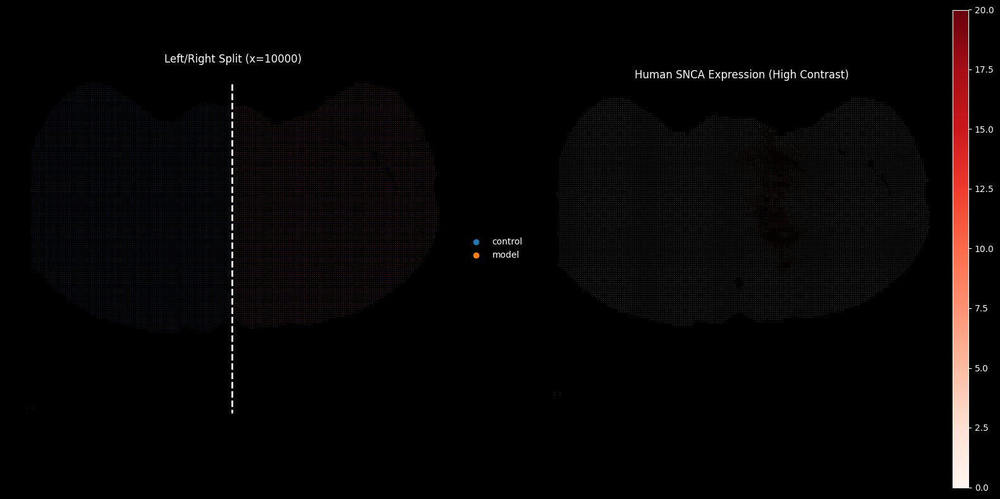

In [6]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np

# === 1. 设置绘图风格 (黑色背景，高对比度) ===
plt.style.use('dark_background')
spot_size_val = 20  # Bin100 推荐大小，根据实际效果调整

# === 2. 坐标分割 (Geometry Split) ===
# 获取 X 坐标 (通常 spatial 存储为 [x, y])
x_coords = adata.obsm['spatial'][:, 0]

# 定义分割阈值
split_threshold = 10000

# 创建 condition 列：X > 10000 为 model，否则为 control
adata.obs['condition'] = np.where(x_coords > split_threshold, 'model', 'control')
adata.obs['condition'] = adata.obs['condition'].astype('category') # 转为分类变量便于绘图

# === 3. 统计验证 ===
# 计算两组的细胞数量
count_stats = adata.obs['condition'].value_counts()
print("【分组统计】")
print(count_stats)

# 计算 SNCA 在两组中的平均表达量 (定量验证)
mean_snca = adata.obs.groupby('condition')['expr_SNCA'].mean()
print("\n【SNCA 平均表达量验证】")
print(f"Control (Left): {mean_snca['control']:.4f}")
print(f"Model (Right):  {mean_snca['model']:.4f}")
fold_change = mean_snca['model'] / (mean_snca['control'] + 1e-9)
print(f"Fold Change (Model/Control): {fold_change:.2f} 倍")

# === 4. 可视化验证 (双图并排) ===
fig, axs = plt.subplots(1, 2, figsize=(16, 8))

# --- 左图：物理分割验证 (Condition) ---
# 展示 model 和 control 的空间位置，确认 x=10000 切割线是否正确
sc.pl.spatial(
    adata,
    color='condition',
    palette={'model': '#ff7f0e', 'control': '#1f77b4'}, # 橙色Model，蓝色Control
    spot_size=spot_size_val,
    frameon=False,
    title=f'Left/Right Split (x={split_threshold})',
    ax=axs[0],
    show=False
)
# 画一条辅助线标示分割界限
# 注意：y轴范围需要从数据中获取
y_min, y_max = adata.obsm['spatial'][:, 1].min(), adata.obsm['spatial'][:, 1].max()
axs[0].vlines(x=split_threshold, ymin=y_min, ymax=y_max, colors='white', linestyles='dashed', linewidth=2)

# --- 右图：SNCA 表达验证 ---
# 关键参数 vmax='p98'：切掉前2%的极高值，让整体信号看起来更亮、更饱满
sc.pl.spatial(
    adata,
    color='expr_SNCA',
    cmap='Reds',          # 红色荧光风格
    spot_size=spot_size_val,
    frameon=False,
    title='Human SNCA Expression (High Contrast)',
    vmax='p98',           # <--- 这里的设置让图变亮
    ax=axs[1],
    show=False
)

plt.tight_layout()
plt.savefig('Fig_Split_Verification_Bright.png', dpi=300)
# plt.show() 
print("\n图片已保存为: Fig_Split_Verification_Bright.png")

参与对比的细胞类型 (14 种):
['Total_Glut', 'Total_GABA', 'Total_Sero', 'Total_Epen', 'Total_Astro_NT', 'Total_Astro_OLF', 'Total_Astro_TE', 'Total_DG_PIR_Ex', 'Total_DMX_VII_Tbx20', 'Total_HB_Calcb', 'Total_OB_STR_CTX', 'Total_OPC', 'Total_Tanycyte_NN', 'Total_VLMC']

面积统计 (Bin count):
condition
control    9942
model      9483
Name: count, dtype: int64

【细胞类型变化排行榜 (按 Fold Change 升序)】
Fold Change < 1 代表 Model 侧减少 (损伤); > 1 代表增加 (炎症/增生)
------------------------------------------------------------
                     Control_Density  Model_Density  Fold_Change
Total_HB_Calcb              0.184524       0.163243     0.884665
Total_Epen                  0.518608       0.499529     0.963210
Total_Sero                  0.031347       0.031409     1.001936
Total_DMX_VII_Tbx20         0.009684       0.009729     1.004598
Total_Astro_NT              1.496405       1.526841     1.020339
Total_OPC                   0.059990       0.061352     1.022683
Total_OB_STR_CTX            0.235475       0.241092    

/tmp/ipykernel_236669/3433945006.py:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  stats_df = adata.obs.groupby('condition')[target_cols].sum().T
/tmp/ipykernel_236669/3433945006.py:83: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=45, ha='right')



统计图表已保存至: Cell_Type_Quantification_Stats.png


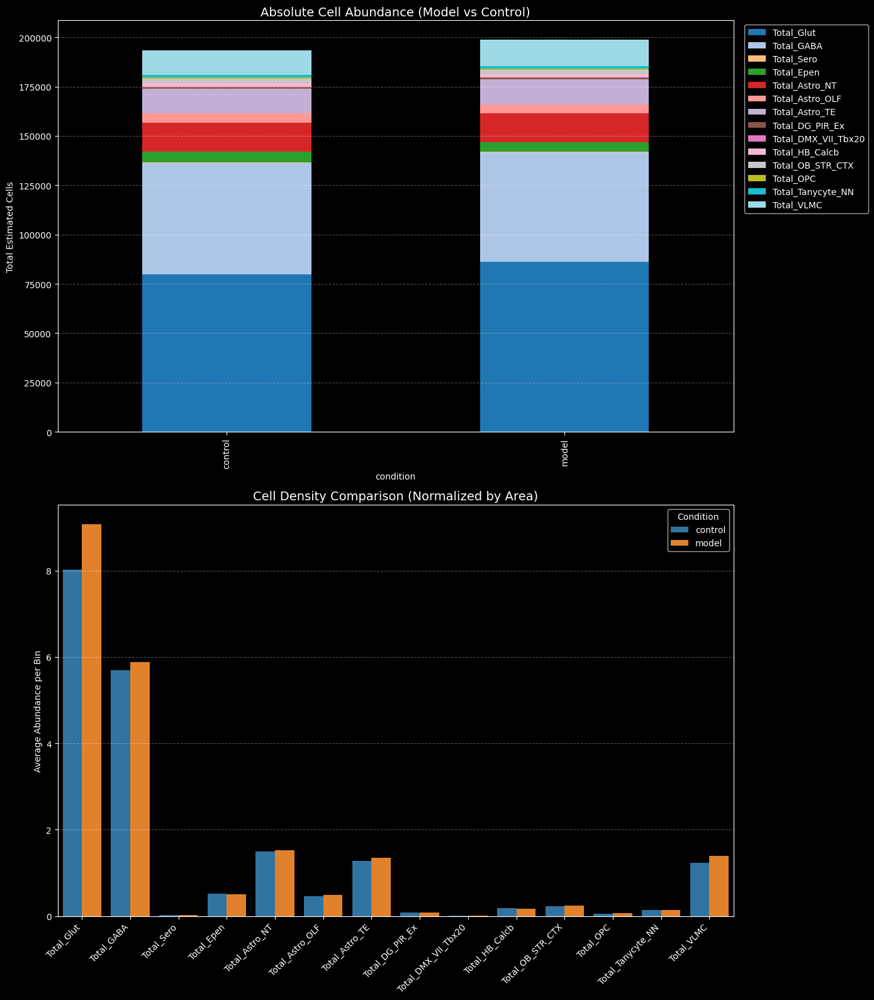

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# === 1. 自动筛选细胞类型列 ===
# 我们重点关注之前合并的 'Total_' 开头的列
target_cols = [col for col in adata.obs.columns if col.startswith('Total_')]

# 【关键】如果还未合并 Dopa (多巴胺)，手动尝试找回它加入对比
# 因为这是 PD 模型最重要的指标
dopa_keywords = ['SNc', 'VTA', 'Dopa']
for col in adata.obs.columns:
    # 如果列名包含 Dopa 且还没在 target_cols 里
    if any(k in col for k in dopa_keywords) and col not in target_cols:
        target_cols.append(col)

print(f"参与对比的细胞类型 ({len(target_cols)} 种):")
print(target_cols)

# === 2. 计算统计数据 ===
# 按 condition 分组求和
stats_df = adata.obs.groupby('condition')[target_cols].sum().T

# 计算 Bin 的数量（面积），用于标准化
n_bins = adata.obs['condition'].value_counts()
print("\n面积统计 (Bin count):")
print(n_bins)

# 计算“密度” (平均每个 Spot 的细胞丰度)
# 这是为了防止左脑比右脑大导致 Control 看起来细胞更多
density_df = stats_df.div(n_bins, axis=1)

# === 3. 计算差异指标 (Model vs Control) ===
# Fold Change = Model / Control
# 差值 = Model - Control
comparison_df = pd.DataFrame(index=stats_df.index)
comparison_df['Control_Sum'] = stats_df['control']
comparison_df['Model_Sum'] = stats_df['model']
comparison_df['Control_Density'] = density_df['control']
comparison_df['Model_Density'] = density_df['model']

# 使用密度计算变化倍数 (FC)
comparison_df['Fold_Change'] = comparison_df['Model_Density'] / (comparison_df['Control_Density'] + 1e-6)
comparison_df['Log2FC'] = np.log2(comparison_df['Fold_Change'])

# 排序：按 Log2FC 排序，下降最厉害的在最上面 (PD模型通常关注下降的神经元)
comparison_df = comparison_df.sort_values('Fold_Change', ascending=True)

# 打印关键结果表
print("\n【细胞类型变化排行榜 (按 Fold Change 升序)】")
print("Fold Change < 1 代表 Model 侧减少 (损伤); > 1 代表增加 (炎症/增生)")
print("-" * 60)
print(comparison_df[['Control_Density', 'Model_Density', 'Fold_Change']].head(10)) # 打印减少最多的前10个
print("-" * 60)
print(comparison_df[['Control_Density', 'Model_Density', 'Fold_Change']].tail(5)) # 打印增加最多的前5个

# === 4. 可视化绘图 ===
plt.style.use('dark_background') # 保持暗黑风格
fig, axes = plt.subplots(2, 1, figsize=(14, 16))

# 图 A: 绝对总量堆叠图 (Overview)
stats_df.T.plot(kind='bar', stacked=True, ax=axes[0], colormap='tab20')
axes[0].set_title('Absolute Cell Abundance (Model vs Control)', fontsize=14)
axes[0].set_ylabel('Total Estimated Cells')
axes[0].legend(bbox_to_anchor=(1.01, 1), loc='upper left')
axes[0].grid(axis='y', linestyle='--', alpha=0.3)

# 图 B: 相对密度对比 (Grouped Bar Plot)
# 为了图表清晰，我们选取变化最显著的 Top N 和 Bottom N，或者全部（如果数量不多）
# 这里绘制全部 'Total_' 类型
plot_data = density_df.reset_index().melt(id_vars='index', var_name='Condition', value_name='Density')

sns.barplot(
    data=plot_data,
    x='index', 
    y='Density', 
    hue='Condition',
    palette={'model': '#ff7f0e', 'control': '#1f77b4'}, # 橙色Model，蓝色Control
    ax=axes[1]
)

axes[1].set_title('Cell Density Comparison (Normalized by Area)', fontsize=14)
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=45, ha='right')
axes[1].set_xlabel('')
axes[1].set_ylabel('Average Abundance per Bin')
axes[1].grid(axis='y', linestyle='--', alpha=0.3)

plt.tight_layout()
plt.savefig('Cell_Type_Quantification_Stats.png', dpi=300, bbox_inches='tight')
# plt.show()
print("\n统计图表已保存至: Cell_Type_Quantification_Stats.png")

已合并的大类 (14 个): ['Total_Glut', 'Total_GABA', 'Total_Sero', 'Total_Epen', 'Total_Astro_NT', 'Total_Astro_OLF', 'Total_Astro_TE', 'Total_DG_PIR_Ex', 'Total_DMX_VII_Tbx20', 'Total_HB_Calcb', 'Total_OB_STR_CTX', 'Total_OPC', 'Total_Tanycyte_NN', 'Total_VLMC']
剩余独立细分类型 (30 个)
注意：部分列未在 obs 中找到，可能是之前忘记写入，已自动跳过缺失列。

【最终分析列表】共 14 项 (包含合并的大类和未合并的小类)

【Top 15 下降最明显的细胞 (可能受损)】 (FC < 1)
                     Control_Density  Model_Density  Fold_Change
Total_HB_Calcb              0.184524       0.163243     0.884665
Total_Epen                  0.518608       0.499529     0.963210
Total_Sero                  0.031347       0.031409     1.001936
Total_DMX_VII_Tbx20         0.009684       0.009729     1.004598
Total_Astro_NT              1.496405       1.526841     1.020339
Total_OPC                   0.059990       0.061352     1.022683
Total_OB_STR_CTX            0.235475       0.241092     1.023852
Total_DG_PIR_Ex             0.079931       0.082180     1.028130
Total_GABA                  5.692858   

/tmp/ipykernel_236669/1767225838.py:63: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  stats_df = adata.obs.groupby('condition')[valid_cols].sum().T


筛选概览图已保存为: Full_Screen_Cell_Changes.png


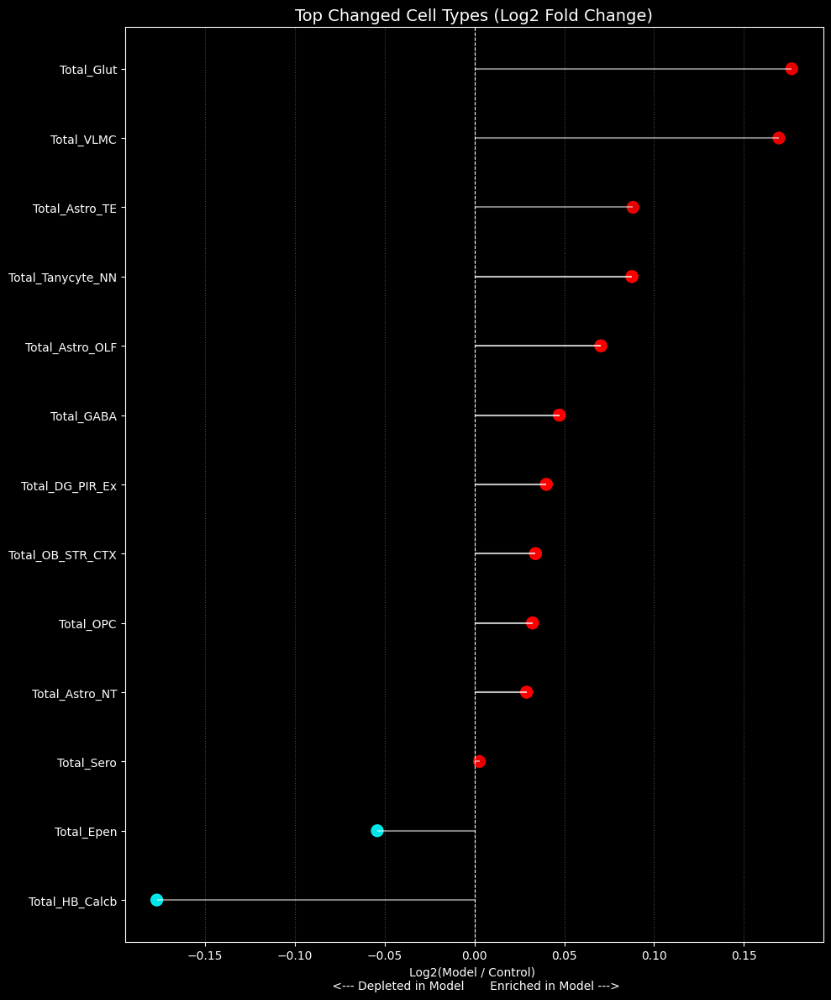

In [8]:
import pandas as pd
import numpy as np
import re
import matplotlib.pyplot as plt
import seaborn as sns

# === 1. 构建完整的“全景”细胞类型列表 ===

# A. 获取所有已合并的 "Total_" 大类
merged_cols = [col for col in adata.obs.columns if col.startswith('Total_')]
print(f"已合并的大类 ({len(merged_cols)} 个): {merged_cols}")

# B. 获取所有原始（清洗后）的细胞类型，找出那些“落单”的
# 我们需要重新获取一下清洗后的基名列表，用来做排除法
abundance_df = adata.obsm['q05_cell_abundance_w_sf']
if not isinstance(abundance_df, pd.DataFrame):
     # 兼容性处理
    col_names = adata.uns.get('mod', {}).get('factor_names', 
                [f"Type_{i}" for i in range(abundance_df.shape[1])])
    abundance_df = pd.DataFrame(abundance_df, index=adata.obs_names, columns=col_names)

# 清洗列名函数 (同上一步)
def clean_name(col_name):
    return re.sub(r'q05_cell_abundance_w_sf_\d+\s+', '', col_name)

all_base_types = sorted(list(set([clean_name(col) for col in abundance_df.columns])))

# 定义被 "Total_" 吸走的关键词 (基于您之前的操作)
# 注意：这里需要涵盖您之前两轮合并的所有关键词
absorbed_keywords = [
    'Glut', 'GABA', 'Sero', 'Epen',                 # 第一轮
    'Astro-NT', 'Astro-OLF', 'Astro-TE',            # 第二轮...
    'DG-PIR Ex', 'DMX VII Tbx20', 'HB Calcb', 
    'OB-STR-CTX', 'OPC', 'Tanycyte NN', 'VLMC'
]

# 筛选出“落单”的细胞类型 (未包含任何关键词)
independent_cols = []
for col in all_base_types:
    is_absorbed = False
    for kw in absorbed_keywords:
        if kw.lower() in col.lower():
            is_absorbed = True
            break
    if not is_absorbed:
        independent_cols.append(col)

print(f"剩余独立细分类型 ({len(independent_cols)} 个)")

# C. 最终全集 = Total大类 + 独立小类
final_target_cols = merged_cols + independent_cols

# 检查一下这些列是否都在 adata.obs 里 (防止之前某些步骤漏写入)
valid_cols = [c for c in final_target_cols if c in adata.obs.columns]
if len(valid_cols) < len(final_target_cols):
    print("注意：部分列未在 obs 中找到，可能是之前忘记写入，已自动跳过缺失列。")

print(f"\n【最终分析列表】共 {len(valid_cols)} 项 (包含合并的大类和未合并的小类)")

# === 2. 计算 Model vs Control 差异 ===

# 聚合统计
stats_df = adata.obs.groupby('condition')[valid_cols].sum().T

# 计算密度 (Normalized by Area)
n_bins = adata.obs['condition'].value_counts()
density_df = stats_df.div(n_bins, axis=1)

# 计算 Fold Change
comparison_df = pd.DataFrame(index=stats_df.index)
comparison_df['Model_Density'] = density_df['model']
comparison_df['Control_Density'] = density_df['control']
comparison_df['Fold_Change'] = comparison_df['Model_Density'] / (comparison_df['Control_Density'] + 1e-6)
comparison_df['Log2FC'] = np.log2(comparison_df['Fold_Change'] + 1e-6)

# 按 Fold Change 排序
comparison_df = comparison_df.sort_values('Fold_Change')

# === 3. 结果展示与导出 ===

print("\n" + "="*60)
print("【Top 15 下降最明显的细胞 (可能受损)】 (FC < 1)")
print("="*60)
print(comparison_df[['Control_Density', 'Model_Density', 'Fold_Change']].head(15))

print("\n" + "="*60)
print("【Top 15 升高最明显的细胞 (可能增生/炎症)】 (FC > 1)")
print("="*60)
print(comparison_df[['Control_Density', 'Model_Density', 'Fold_Change']].tail(15))

# 保存完整表格到 CSV，方便您去 Excel 里细看
comparison_df.to_csv('Full_CellType_Comparison.csv')
print("\n完整统计表已保存为: 'Full_CellType_Comparison.csv'")

# === 4. 绘图：重点关注那些“变化大”且“丰度高”的类型 ===
# 过滤掉丰度极低(全是噪音)的类型，只画有点规模的
mask_abundance = (comparison_df['Control_Density'] > 0.01) | (comparison_df['Model_Density'] > 0.01)
plot_df = comparison_df[mask_abundance].copy()

# 取两头各10个
top_increase = plot_df.tail(10)
top_decrease = plot_df.head(10)
merged_plot_df = pd.concat([top_decrease, top_increase])

plt.figure(figsize=(10, 12))
# 使用 Log2FC 画棒棒糖图
plt.hlines(y=merged_plot_df.index, xmin=0, xmax=merged_plot_df['Log2FC'], color='white', alpha=0.5)
plt.scatter(merged_plot_df['Log2FC'], merged_plot_df.index, 
            c=np.where(merged_plot_df['Log2FC']>0, 'red', 'cyan'), 
            s=100, alpha=0.9)
plt.axvline(0, color='white', linestyle='--', linewidth=0.8)
plt.title('Top Changed Cell Types (Log2 Fold Change)', fontsize=14)
plt.xlabel('Log2(Model / Control) \n <--- Depleted in Model       Enriched in Model --->')
plt.grid(axis='x', linestyle=':', alpha=0.3)
plt.tight_layout()
plt.savefig('Full_Screen_Cell_Changes.png', dpi=300)
# plt.show()
print("筛选概览图已保存为: Full_Screen_Cell_Changes.png")

正在提取并清洗目标细胞...
提取并合并后的唯一细胞类型 (22 种):
['ABC', 'Astro-CB', 'B cells', 'BAM', 'Bergmann', 'CHOR', 'COP', 'DC', 'Endo', 'Hypendymal', 'ILC', 'MFOL', 'MOL', 'Microglia', 'Monocytes', 'NFOL', 'NK cells', 'OEC', 'Peri', 'SMC', 'SNc-VTA-RAmb Foxa1 Dopa', 'T cells']

【关键指标验证】
多巴胺神经元 (Dopa) FC: 1.01 (预期 < 1.0)
小胶质细胞 (Microglia) FC: 1.08 (预期 > 1.0)


/tmp/ipykernel_236669/2100110518.py:110: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=90)



图表已保存: Detailed_CellType_Validation.png


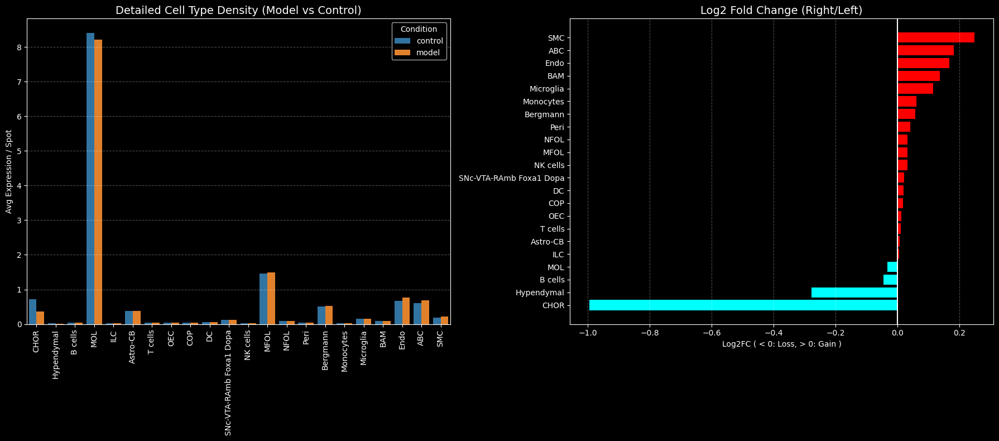

In [9]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re

# === 1. 定义您提供的特定目标列表 ===
# 直接复制您提供的列表，确保覆盖所有关键类型
target_raw_list = [
    'ABC NN_1', 'Astro-CB NN_1', 
    'B cells NN_1', 'BAM NN_1',
    'Bergmann NN_1', 'CHOR NN_1', 
    'COP NN_1', 'DC NN_1',
    'Endo NN_1', 'Hypendymal NN_1', 
    'ILC NN_2', 'MFOL NN_3',
    'MOL NN_4', 'Microglia NN_1', 
    'Monocytes NN_1', 'NFOL NN_2',
    'NK cells NN_3', 'OEC NN_1', 
    'Peri NN_1', 'SMC NN_1',
    'SNc-VTA-RAmb Foxa1 Dopa_1', 'SNc-VTA-RAmb Foxa1 Dopa_2',
    'SNc-VTA-RAmb Foxa1 Dopa_3', 'SNc-VTA-RAmb Foxa1 Dopa_4',
    'SNc-VTA-RAmb Foxa1 Dopa_5', 'SNc-VTA-RAmb Foxa1 Dopa_6',
    'SNc-VTA-RAmb Foxa1 Dopa_7', 'SNc-VTA-RAmb Foxa1 Dopa_8',
    'T cells NN_4'
]

# === 2. 数据提取与智能清洗 ===
# 确保 condition 列存在
x_coords = adata.obsm['spatial'][:, 0]
adata.obs['condition'] = np.where(x_coords > 10000, 'model', 'control')

# 从 obsm 中提取这些特定列
# 注意：需要确保这些名字能对应上 adata.obsm['q05_cell_abundance_w_sf'] 的列名
# 为了稳健，我们先构建一个临时的 DataFrame
if isinstance(adata.obsm['q05_cell_abundance_w_sf'], pd.DataFrame):
    full_abundance = adata.obsm['q05_cell_abundance_w_sf']
else:
    # 兼容性处理
    cols = adata.uns['mod']['factor_names']
    full_abundance = pd.DataFrame(adata.obsm['q05_cell_abundance_w_sf'], 
                                  index=adata.obs_names, columns=cols)

# 模糊匹配提取数据 (处理可能的前缀差异)
extracted_data = pd.DataFrame(index=adata.obs_names)
found_cols = []

print("正在提取并清洗目标细胞...")
for target in target_raw_list:
    # 在所有列名中找匹配的
    matches = [c for c in full_abundance.columns if target in c]
    if matches:
        # 取第一匹配项（通常是唯一的）
        col_name = matches[0]
        # 清洗名称：去除 "NN_数字" 或 "_数字"
        # 例如: "Microglia NN_1" -> "Microglia", "Dopa_1" -> "Dopa"
        clean_name = re.sub(r'(\sNN_\d+)|(_\d+)$', '', target)
        
        # 如果该清洗后的名称已存在（例如 Dopa_1 和 Dopa_2 都变成了 Dopa），则累加
        if clean_name in extracted_data.columns:
            extracted_data[clean_name] += full_abundance[col_name]
        else:
            extracted_data[clean_name] = full_abundance[col_name]
            
        found_cols.append(clean_name)

print(f"提取并合并后的唯一细胞类型 ({len(extracted_data.columns)} 种):")
print(extracted_data.columns.tolist())

# === 3. 计算统计差异 ===
# 加入 condition 分组
analysis_df = extracted_data.copy()
analysis_df['condition'] = adata.obs['condition']

# 计算密度 (Total Counts / Bin Number)
n_bins = analysis_df['condition'].value_counts()
stats = analysis_df.groupby('condition').sum().T

# 归一化为密度
density = stats.div(n_bins, axis=1)
density['Fold_Change'] = density['model'] / (density['control'] + 1e-6)

# 排序：让 Dopa 和 免疫细胞 排在一起方便看，或者按 FC 排序
density = density.sort_values('Fold_Change', ascending=True)

# 打印 Dopa 和 Microglia 的具体数值
print("\n【关键指标验证】")
dopa_col = [c for c in density.index if 'Dopa' in c]
micro_col = [c for c in density.index if 'Microglia' in c]

if dopa_col:
    print(f"多巴胺神经元 (Dopa) FC: {density.loc[dopa_col[0], 'Fold_Change']:.2f} (预期 < 1.0)")
if micro_col:
    print(f"小胶质细胞 (Microglia) FC: {density.loc[micro_col[0], 'Fold_Change']:.2f} (预期 > 1.0)")

# === 4. 绘图 (Stacked + Grouped Bar) ===
plt.style.use('dark_background')
fig, axes = plt.subplots(1, 2, figsize=(18, 8))

# 图 1: 相对密度对比 (Grouped Bar) - 最直观
plot_data = density[['control', 'model']].reset_index().melt(id_vars='index', var_name='Condition', value_name='Density')

sns.barplot(
    data=plot_data,
    x='index', y='Density', hue='Condition',
    palette={'model': '#ff7f0e', 'control': '#1f77b4'},
    ax=axes[0]
)
axes[0].set_title('Detailed Cell Type Density (Model vs Control)', fontsize=14)
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=90)
axes[0].set_ylabel('Avg Expression / Spot')
axes[0].set_xlabel('')
axes[0].grid(axis='y', linestyle='--', alpha=0.3)

# 图 2: 变化倍数 (Log2 Fold Change) - 验证损伤程度
# Log2FC < 0 表示减少，> 0 表示增加
density['Log2FC'] = np.log2(density['Fold_Change'])
colors = ['red' if x > 0 else 'cyan' for x in density['Log2FC']]

axes[1].barh(density.index, density['Log2FC'], color=colors)
axes[1].set_title('Log2 Fold Change (Right/Left)', fontsize=14)
axes[1].set_xlabel('Log2FC ( < 0: Loss, > 0: Gain )')
axes[1].axvline(0, color='white', linestyle='-')
axes[1].grid(axis='x', linestyle='--', alpha=0.3)

plt.tight_layout()
plt.savefig('Detailed_CellType_Validation.png', dpi=300, bbox_inches='tight')
print("\n图表已保存: Detailed_CellType_Validation.png")
# plt.show()

正在从 obsm 仓库中提取数据...
成功提取 18 个细胞类型到 obs!
其中包含 8 个多巴胺亚型: ['q05_cell_abundance_w_sf_0880 SNc-VTA-RAmb Foxa1 Dopa_1', 'q05_cell_abundance_w_sf_0881 SNc-VTA-RAmb Foxa1 Dopa_2', 'q05_cell_abundance_w_sf_0882 SNc-VTA-RAmb Foxa1 Dopa_3'] ...

开始绘制 19 张图...


/tmp/ipykernel_236669/2004257741.py:95: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_236669/2004257741.py:95: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


图片已保存: Immune_Dopa_Subtypes_Atlas.png

Name                                     | Control    | Model      | FoldChange
--------------------------------------------------------------------------------
q05_cell_abundance_w_sf_0880 SNc-VTA-RAm | 0.0074     | 0.0075     | 1.01
q05_cell_abundance_w_sf_0881 SNc-VTA-RAm | 0.0034     | 0.0034     | 1.00
q05_cell_abundance_w_sf_0882 SNc-VTA-RAm | 0.0804     | 0.0778     | 0.97
q05_cell_abundance_w_sf_0883 SNc-VTA-RAm | 0.0063     | 0.0063     | 1.00
q05_cell_abundance_w_sf_0884 SNc-VTA-RAm | 0.0042     | 0.0042     | 0.99
q05_cell_abundance_w_sf_0885 SNc-VTA-RAm | 0.0041     | 0.0040     | 0.97
q05_cell_abundance_w_sf_0886 SNc-VTA-RAm | 0.0047     | 0.0091     | 1.93
q05_cell_abundance_w_sf_0887 SNc-VTA-RAm | 0.0064     | 0.0064     | 1.01
q05_cell_abundance_w_sf_1141 DCO Il22 Gl | 0.0213     | 0.0219     | 1.03
q05_cell_abundance_w_sf_1143 DCO Il22 Gl | 0.0147     | 0.0150     | 1.02
q05_cell_abundance_w_sf_1156 DCO UBC Glu | 0.0203     | 0.02

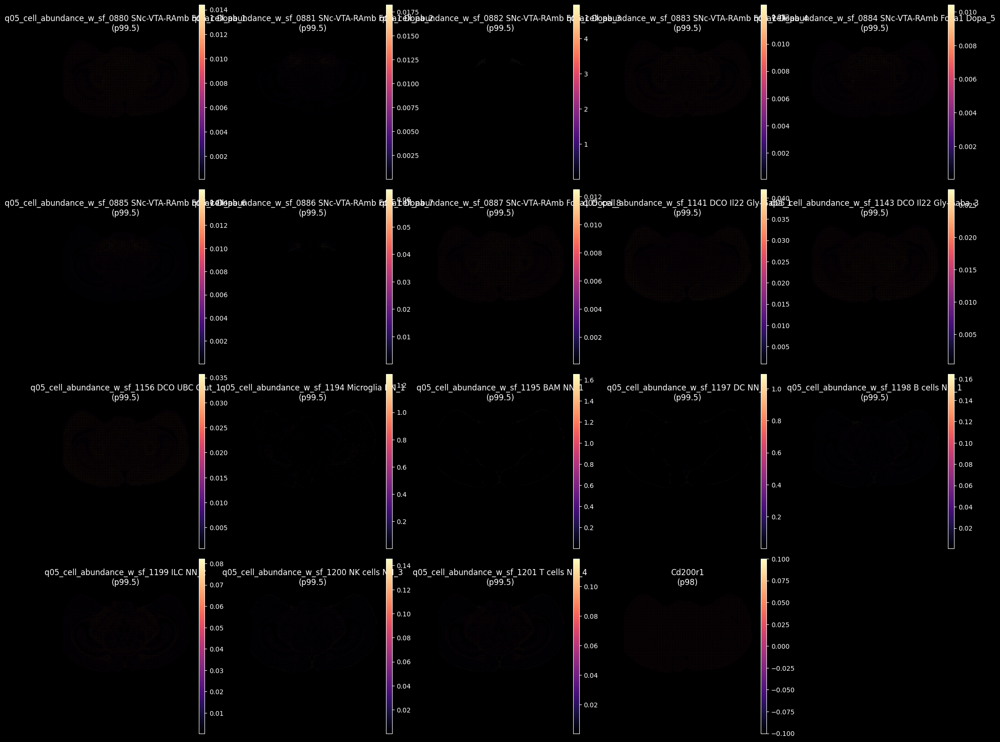

In [10]:
import scanpy as sc
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# 1. 加载数据
adata = sc.read_h5ad('analysis_results/results_bin100_complete_fixed.h5ad')

# 确保 condition 列存在
if 'condition' not in adata.obs.columns:
    adata.obs['condition'] = np.where(adata.obsm['spatial'][:, 0] > 10000, 'model', 'control')

# =====================================================
# 核心修复步骤：从 obsm 中提取指定细胞类型到 obs
# =====================================================

# 1. 获取所有原始细胞类型的 DataFrame
# 兼容性处理：如果 obsm 是数组，尝试找列名；如果是 DF 直接用
if isinstance(adata.obsm['q05_cell_abundance_w_sf'], pd.DataFrame):
    source_df = adata.obsm['q05_cell_abundance_w_sf']
else:
    # 尝试从 uns 获取列名，如果失败则报错
    try:
        col_names = adata.uns['mod']['factor_names']
    except KeyError:
        # 如果是 Cell2location 旧版本结构
        col_names = adata.uns['cell2location']['factor_names']
    
    source_df = pd.DataFrame(
        adata.obsm['q05_cell_abundance_w_sf'], 
        index=adata.obs_names, 
        columns=col_names
    )

# 2. 定义我们要提取的关键词 (包括特定的 Dopa 亚型前缀)
target_keywords = [
    'Microglia', 'BAM', 'B cells', 'T cells', 'NK cells', 'ILC', 'DC', # 免疫
    'SNc-VTA-RAmb Foxa1 Dopa' # 多巴胺 (会匹配 Dopa_1, Dopa_2 等所有亚型)
]

print("正在从 obsm 仓库中提取数据...")
extracted_cols = []

for col in source_df.columns:
    # 只要列名包含上述任何一个关键词
    if any(keyword in col for keyword in target_keywords):
        # 复制到 adata.obs
        adata.obs[col] = source_df[col]
        extracted_cols.append(col)

print(f"成功提取 {len(extracted_cols)} 个细胞类型到 obs!")
# 打印一下看看是不是找到了 Dopa_1, Dopa_2 等
dopa_found = [c for c in extracted_cols if 'Dopa' in c]
print(f"其中包含 {len(dopa_found)} 个多巴胺亚型: {dopa_found[:3]} ...")

# =====================================================
# 绘图部分 (现在可以找到了)
# =====================================================

# 加入基因 Cd200r1
plot_targets = extracted_cols + ['Cd200r1']

# 过滤一下：确保 Cd200r1 真的存在于 var 中，防止报错
if 'Cd200r1' not in adata.var_names:
    # 尝试找找大小写变体
    candidates = [g for g in adata.var_names if g.lower() == 'cd200r1']
    if candidates:
        plot_targets = extracted_cols + [candidates[0]]
    else:
        print("警告：未找到基因 Cd200r1，将跳过。")
        plot_targets = extracted_cols

plt.style.use('dark_background')
n_plots = len(plot_targets)
n_cols = 5  # 每行5个图
n_rows = int(np.ceil(n_plots / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(4 * n_cols, 4 * n_rows))
axes = axes.flatten()

print(f"\n开始绘制 {n_plots} 张图...")

for i, key in enumerate(plot_targets):
    ax = axes[i]
    
    # --- 亮度调整策略 ---
    # 免疫细胞通常很少，用 p99.5 或 p99.9 来显示稀有亮点
    # 基因 (Cd200r1) 信号可能弱，用 p98 提亮
    if key in adata.var_names: # 是基因
        vmax_val = 'p98'
    else: # 是细胞类型
        vmax_val = 'p99.5' # 让稀有的免疫细胞亮点更明显
        
    try:
        sc.pl.spatial(
            adata,
            color=key,
            cmap='magma',     # 火焰色，对比度极高
            spot_size=20,     # 调节斑点大小
            vmax=vmax_val,    # <--- 亮度控制
            frameon=False,
            ax=ax,
            show=False,
            title=f"{key}\n({vmax_val})"
        )
    except Exception as e:
        print(f"绘制 {key} 时出错: {e}")
        ax.set_title(f"Error: {key}")

# 隐藏空白子图
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.savefig('Immune_Dopa_Subtypes_Atlas.png', dpi=300)
print("图片已保存: Immune_Dopa_Subtypes_Atlas.png")

# =====================================================
# 统计部分 (保留)
# =====================================================
print("\n" + "="*80)
print(f"{'Name':<40} | {'Control':<10} | {'Model':<10} | {'FoldChange':<10}")
print("-" * 80)

for key in plot_targets:
    if key in adata.obs.columns:
        val_ctrl = adata.obs.loc[adata.obs['condition'] == 'control', key].mean()
        val_model = adata.obs.loc[adata.obs['condition'] == 'model', key].mean()
    elif key in adata.var_names:
         # 简单获取基因表达
        try:
            # 获取稀疏矩阵对应列并转为密集数组
            gene_idx = adata.var_names.get_loc(key)
            import scipy.sparse
            if scipy.sparse.issparse(adata.X):
                expr_data = adata.X[:, gene_idx].toarray().flatten()
            else:
                expr_data = adata.X[:, gene_idx]
            
            val_ctrl = expr_data[adata.obs['condition'] == 'control'].mean()
            val_model = expr_data[adata.obs['condition'] == 'model'].mean()
        except:
            val_ctrl, val_model = 0, 0

    fc = val_model / (val_ctrl + 1e-9)
    print(f"{key[:40]:<40} | {val_ctrl:.4f}     | {val_model:.4f}     | {fc:.2f}")


开始绘制 19 张图...


/tmp/ipykernel_236669/45613986.py:40: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


图片已保存: Immune_Dopa_Subtypes_Atlas.png

Name                                     | Control    | Model      | FoldChange
--------------------------------------------------------------------------------
q05_cell_abundance_w_sf_0880 SNc-VTA-RAm | 0.0074     | 0.0075     | 1.01
q05_cell_abundance_w_sf_0881 SNc-VTA-RAm | 0.0034     | 0.0034     | 1.00
q05_cell_abundance_w_sf_0882 SNc-VTA-RAm | 0.0804     | 0.0778     | 0.97
q05_cell_abundance_w_sf_0883 SNc-VTA-RAm | 0.0063     | 0.0063     | 1.00
q05_cell_abundance_w_sf_0884 SNc-VTA-RAm | 0.0042     | 0.0042     | 0.99
q05_cell_abundance_w_sf_0885 SNc-VTA-RAm | 0.0041     | 0.0040     | 0.97
q05_cell_abundance_w_sf_0886 SNc-VTA-RAm | 0.0047     | 0.0091     | 1.93
q05_cell_abundance_w_sf_0887 SNc-VTA-RAm | 0.0064     | 0.0064     | 1.01
q05_cell_abundance_w_sf_1141 DCO Il22 Gl | 0.0213     | 0.0219     | 1.03
q05_cell_abundance_w_sf_1143 DCO Il22 Gl | 0.0147     | 0.0150     | 1.02
q05_cell_abundance_w_sf_1156 DCO UBC Glu | 0.0203     | 0.02

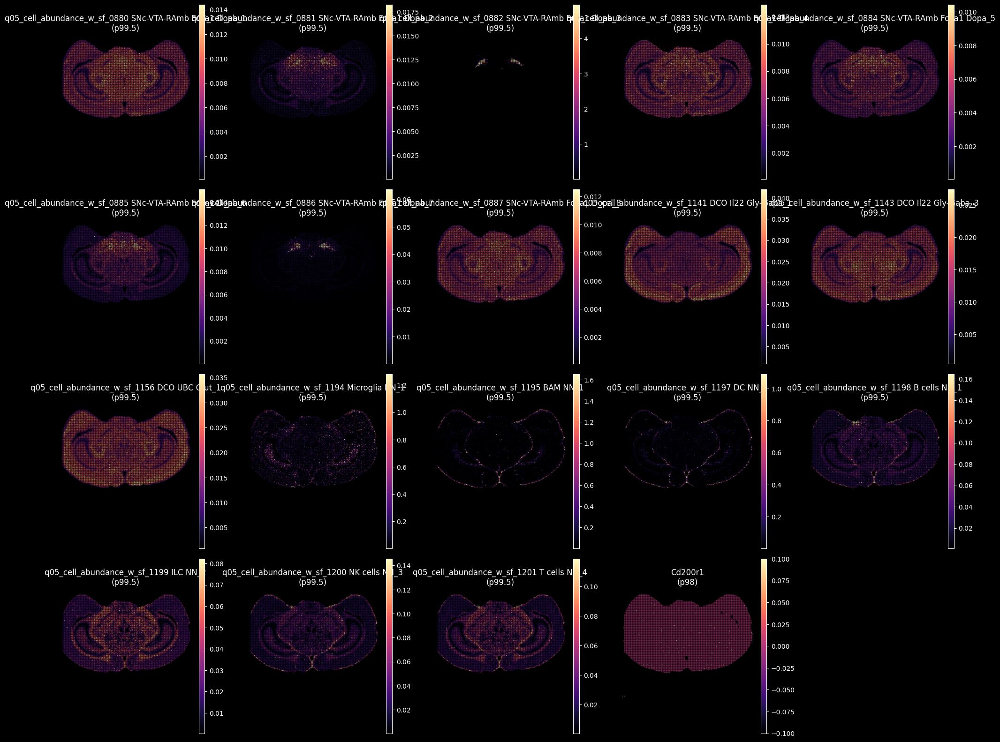

In [11]:
# =====================================================
# 绘图部分 (现在可以找到了)
# =====================================================

# 加入基因 Cd200r1
plot_targets = extracted_cols + ['Cd200r1']

# 过滤一下：确保 Cd200r1 真的存在于 var 中，防止报错
if 'Cd200r1' not in adata.var_names:
    # 尝试找找大小写变体
    candidates = [g for g in adata.var_names if g.lower() == 'cd200r1']
    if candidates:
        plot_targets = extracted_cols + [candidates[0]]
    else:
        print("警告：未找到基因 Cd200r1，将跳过。")
        plot_targets = extracted_cols

plt.style.use('dark_background')
n_plots = len(plot_targets)
n_cols = 5  # 每行5个图
n_rows = int(np.ceil(n_plots / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(4 * n_cols, 4 * n_rows))
axes = axes.flatten()

print(f"\n开始绘制 {n_plots} 张图...")

for i, key in enumerate(plot_targets):
    ax = axes[i]
    
    # --- 亮度调整策略 ---
    # 免疫细胞通常很少，用 p99.5 或 p99.9 来显示稀有亮点
    # 基因 (Cd200r1) 信号可能弱，用 p98 提亮
    if key in adata.var_names: # 是基因
        vmax_val = 'p98'
    else: # 是细胞类型
        vmax_val = 'p99.5' # 让稀有的免疫细胞亮点更明显
        
    try:
        sc.pl.spatial(
            adata,
            color=key,
            cmap='magma',     # 火焰色，对比度极高
            spot_size=70,     # 调节斑点大小
            vmax=vmax_val,    # <--- 亮度控制
            frameon=False,
            ax=ax,
            show=False,
            title=f"{key}\n({vmax_val})"
        )
    except Exception as e:
        print(f"绘制 {key} 时出错: {e}")
        ax.set_title(f"Error: {key}")

# 隐藏空白子图
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.savefig('Immune_Dopa_Subtypes_Atlas.png', dpi=300)
print("图片已保存: Immune_Dopa_Subtypes_Atlas.png")

# =====================================================
# 统计部分 (保留)
# =====================================================
print("\n" + "="*80)
print(f"{'Name':<40} | {'Control':<10} | {'Model':<10} | {'FoldChange':<10}")
print("-" * 80)

for key in plot_targets:
    if key in adata.obs.columns:
        val_ctrl = adata.obs.loc[adata.obs['condition'] == 'control', key].mean()
        val_model = adata.obs.loc[adata.obs['condition'] == 'model', key].mean()
    elif key in adata.var_names:
         # 简单获取基因表达
        try:
            # 获取稀疏矩阵对应列并转为密集数组
            gene_idx = adata.var_names.get_loc(key)
            import scipy.sparse
            if scipy.sparse.issparse(adata.X):
                expr_data = adata.X[:, gene_idx].toarray().flatten()
            else:
                expr_data = adata.X[:, gene_idx]
            
            val_ctrl = expr_data[adata.obs['condition'] == 'control'].mean()
            val_model = expr_data[adata.obs['condition'] == 'model'].mean()
        except:
            val_ctrl, val_model = 0, 0

    fc = val_model / (val_ctrl + 1e-9)
    print(f"{key[:40]:<40} | {val_ctrl:.4f}     | {val_model:.4f}     | {fc:.2f}")

锚点细胞 (Center): q05_cell_abundance_w_sf_1201 T cells NN_4

【T细胞微环境分析】 (T细胞视角下的邻居数量)
Neighbor Type                  | Control (Left)  | Model (Right)   | Fold Change
--------------------------------------------------------------------------------
Microglia (Total)              | 0.1848          | 0.2022          | 1.09
Astrocytes (Total)             | 5.8241          | 6.1817          | 1.06
Oligodendrocytes (Total)       | 12.4141          | 12.4727          | 1.00
DA Neurons (Total)             | 0.1197          | 0.1066          | 0.89
DA Subtype 1                   | 0.0080          | 0.0081          | 1.01
DA Subtype 2                   | 0.0043          | 0.0044          | 1.01
DA Subtype 3                   | 0.0781          | 0.0613          | 0.78
DA Subtype 4                   | 0.0071          | 0.0071          | 1.01
DA Subtype 5                   | 0.0048          | 0.0047          | 0.99
DA Subtype 6                   | 0.0049          | 0.0048          | 0.97
DA Subtype 7 

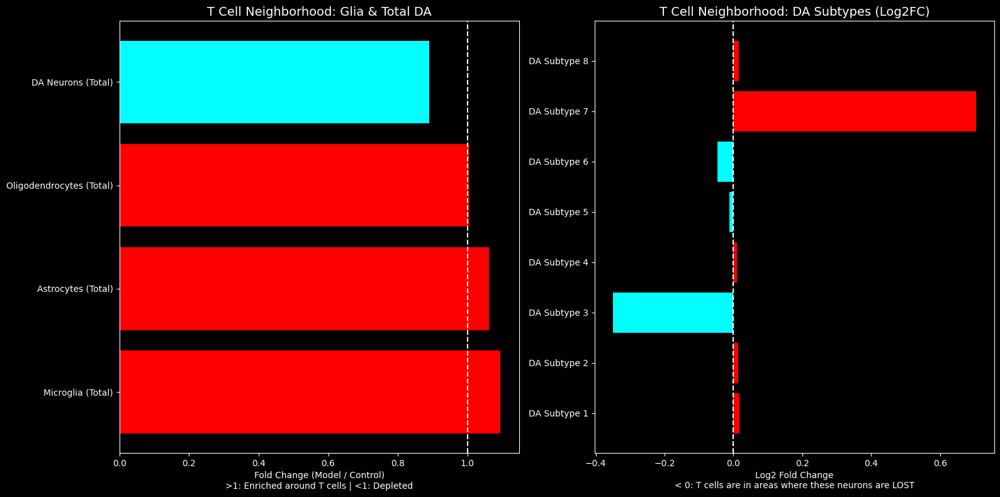

In [12]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc

# === 1. 数据准备与列名锁定 ===
# 确保 condition 存在
if 'condition' not in adata.obs.columns:
    adata.obs['condition'] = np.where(adata.obsm['spatial'][:, 0] > 10000, 'model', 'control')

# 必须先从 obsm 提取原始数据 (如果还没提取过)
# 为了安全，我们再次执行提取逻辑，确保 T cell 和 Dopa 都在 obs 里
source_df = None
if isinstance(adata.obsm['q05_cell_abundance_w_sf'], pd.DataFrame):
    source_df = adata.obsm['q05_cell_abundance_w_sf']
else:
    # 兼容处理
    try:
        col_names = adata.uns['mod']['factor_names']
    except:
        col_names = adata.uns['cell2location']['factor_names']
    source_df = pd.DataFrame(adata.obsm['q05_cell_abundance_w_sf'], 
                             index=adata.obs_names, columns=col_names)

# 将需要的列全部 sync 到 obs
keywords_to_sync = ['T cells', 'Microglia', 'Astro', 'MOL', 'NFOL', 'OPC', 'COP', 'SNc-VTA']
for col in source_df.columns:
    if any(k in col for k in keywords_to_sync) and col not in adata.obs.columns:
        adata.obs[col] = source_df[col]

# === 2. 定义分析对象 ===

# A. 中心锚点 (T cells)
# 找到包含 "T cells" 的列 (通常是 T cells NN_4)
t_cell_cols = [c for c in adata.obs.columns if 'T cells' in c]
t_cell_col = t_cell_cols[0] # 取第一个匹配的
print(f"锚点细胞 (Center): {t_cell_col}")

# B. 定义邻居组 (Neighbors)
neighbors_dict = {}

# 1. 小胶质细胞
micro_cols = [c for c in adata.obs.columns if 'Microglia' in c]
if micro_cols:
    neighbors_dict['Microglia (Total)'] = micro_cols # 列表，之后求和

# 2. 星形胶质细胞 (聚合 Astro-*, Bergmann)
astro_cols = [c for c in adata.obs.columns if 'Astro' in c or 'Bergmann' in c]
neighbors_dict['Astrocytes (Total)'] = astro_cols

# 3. 少突胶质细胞 (聚合 MOL, NFOL, OPC, COP)
oligo_cols = [c for c in adata.obs.columns if any(x in c for x in ['MOL', 'NFOL', 'OPC', 'COP'])]
neighbors_dict['Oligodendrocytes (Total)'] = oligo_cols

# 4. 总多巴胺神经元
dopa_cols = [c for c in adata.obs.columns if 'SNc-VTA' in c and 'Dopa' in c]
neighbors_dict['DA Neurons (Total)'] = dopa_cols

# 5. 各个多巴胺亚型 (单独列出)
for dc in dopa_cols:
    # 简化名字: "SNc...Dopa_1" -> "DA Subtype_1"
    short_name = dc.split(' ')[-1] if ' ' in dc else dc
    if '_' in short_name:
        suffix = short_name.split('_')[-1]
        neighbors_dict[f'DA Subtype {suffix}'] = [dc]
    else:
        neighbors_dict[f'DA {short_name}'] = [dc]

# === 3. 核心算法：加权邻域计算 ===
# 逻辑：(T_cells * Neighbor) / Sum(T_cells)
# 这代表了：对于一个平均的 T 细胞，它身边的邻居有多少。

results_list = []

for group in ['control', 'model']:
    # 提取子集
    subset = adata.obs[adata.obs['condition'] == group]
    
    # 获取锚点向量 (T 细胞数量)
    weights = subset[t_cell_col].values
    total_weight = np.sum(weights)
    
    if total_weight == 0:
        print(f"Warning: No T cells found in {group}")
        continue
        
    for neighbor_name, neighbor_cols in neighbors_dict.items():
        # 获取邻居的总数量 (如果是多个列，先求和)
        neighbor_counts = subset[neighbor_cols].sum(axis=1).values
        
        # 加权平均 = sum(权重 * 数值) / sum(权重)
        # 这里权重是 T 细胞数量，数值是邻居数量
        weighted_avg = np.sum(weights * neighbor_counts) / total_weight
        
        results_list.append({
            'Condition': group,
            'Neighbor': neighbor_name,
            'Weighted_Count': weighted_avg
        })

# === 4. 整理结果与绘图 ===
res_df = pd.DataFrame(results_list)

# 计算 Fold Change (Model / Control)
fc_data = []
neighbors_unique = res_df['Neighbor'].unique()

print("\n" + "="*80)
print(f"【T细胞微环境分析】 (T细胞视角下的邻居数量)")
print(f"{'Neighbor Type':<30} | {'Control (Left)':<15} | {'Model (Right)':<15} | {'Fold Change':<10}")
print("-" * 80)

for neighbor in neighbors_unique:
    val_ctrl = res_df[(res_df['Neighbor'] == neighbor) & (res_df['Condition'] == 'control')]['Weighted_Count'].values[0]
    val_model = res_df[(res_df['Neighbor'] == neighbor) & (res_df['Condition'] == 'model')]['Weighted_Count'].values[0]
    
    fc = val_model / (val_ctrl + 1e-9)
    
    print(f"{neighbor:<30} | {val_ctrl:.4f}          | {val_model:.4f}          | {fc:.2f}")
    
    fc_data.append({'Neighbor': neighbor, 'Fold_Change': fc, 'Log2FC': np.log2(fc + 1e-9)})

print("="*80)
print("解读：Fold Change > 1 表示 Model 侧的 T 细胞更倾向于与该细胞共定位/聚集。")
print("解读：Fold Change < 1 表示 Model 侧的 T 细胞所在的区域，该细胞变少了 (可能被杀死了)。")

# === 5. 可视化 ===
fc_df = pd.DataFrame(fc_data)

# 分离胶质细胞和多巴胺亚型，以免图太乱
glia_list = ['Microglia (Total)', 'Astrocytes (Total)', 'Oligodendrocytes (Total)', 'DA Neurons (Total)']
glia_df = fc_df[fc_df['Neighbor'].isin(glia_list)]
dopa_sub_df = fc_df[~fc_df['Neighbor'].isin(glia_list)]

plt.style.use('dark_background')
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# 图 1: 胶质细胞环境变化
colors_glia = ['red' if x > 1 else 'cyan' for x in glia_df['Fold_Change']]
axes[0].barh(glia_df['Neighbor'], glia_df['Fold_Change'], color=colors_glia)
axes[0].axvline(1, color='white', linestyle='--')
axes[0].set_title('T Cell Neighborhood: Glia & Total DA', fontsize=14)
axes[0].set_xlabel('Fold Change (Model / Control)\n>1: Enriched around T cells | <1: Depleted')

# 图 2: 多巴胺亚型特异性关系
# 这里我们用 Log2FC 来看，因为亚型可能消失得很彻底
colors_dopa = ['red' if x > 0 else 'cyan' for x in dopa_sub_df['Log2FC']]
axes[1].barh(dopa_sub_df['Neighbor'], dopa_sub_df['Log2FC'], color=colors_dopa)
axes[1].axvline(0, color='white', linestyle='--')
axes[1].set_title('T Cell Neighborhood: DA Subtypes (Log2FC)', fontsize=14)
axes[1].set_xlabel('Log2 Fold Change\n< 0: T cells are in areas where these neurons are LOST')

plt.tight_layout()
plt.savefig('T_Cell_Microenvironment_Analysis.png', dpi=300)
print("\n分析图表已保存: T_Cell_Microenvironment_Analysis.png")

分析目标邻居: ['q05_cell_abundance_w_sf_1194 Microglia NN_1', 'q05_cell_abundance_w_sf_1158 Astro-CB NN_1', 'q05_cell_abundance_w_sf_1184 MOL NN_4']
中心锚点: q05_cell_abundance_w_sf_1201 T cells NN_4
正在分析分组: control ...
正在分析分组: model ...

【T细胞周围邻居分布梯度 (Average Abundance)】
Distance_Ring                                              0-100    100-200  \
Neighbor                                    Condition                         
q05_cell_abundance_w_sf_1158 Astro-CB NN_1  control     1.286443   1.714902   
                                            model       1.547415   2.176832   
q05_cell_abundance_w_sf_1184 MOL NN_4       control    21.023864  32.435479   
                                            model      26.044323  37.720636   
q05_cell_abundance_w_sf_1194 Microglia NN_1 control     0.278459   0.483710   
                                            model       0.442754   0.719989   

Distance_Ring                                            200-300  
Neighbor                            

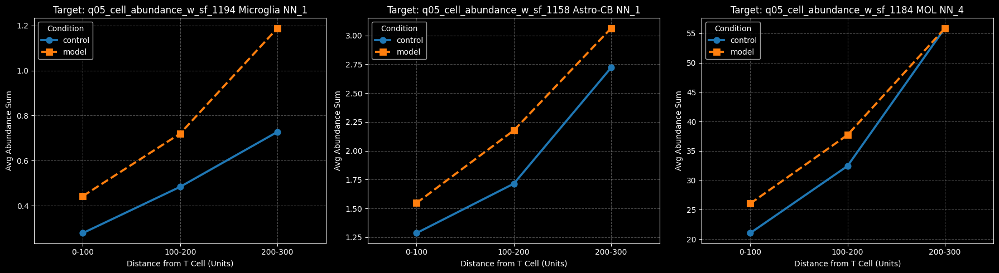

In [13]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial import KDTree

# === 1. 参数设置 ===
# 定义距离环 (0-100, 100-200, 200-300)
# 注意：Bin100 的坐标如果是真实像素值，通常相邻 Bin 间距就是 100 (或1)
# 这里完全遵照您的指令：以 100 为单位跳变
radii_steps = [0, 100, 200, 300]

# 确保 condition 列存在
if 'condition' not in adata.obs.columns:
    adata.obs['condition'] = np.where(adata.obsm['spatial'][:, 0] > 10000, 'model', 'control')

# === 2. 准备数据 ===
# 提取坐标
coords = adata.obsm['spatial']

# 定义我们要分析的“邻居”类型
# 之前合并过的列名，如果没合并请替换回原始列名
target_neighbors = [
    'Microglia',              # 必须先提取到 obs (如上一段代码所示)
    'Astro',                  # 模糊匹配
    'Total_SNc_Dopa_Merged',  # 之前合并的多巴胺
    'MOL'                     # 少突胶质
]

# 自动修正列名 (防止找不到)
final_targets = []
for t in target_neighbors:
    found = [c for c in adata.obs.columns if t in c]
    if found:
        # 优先取 total 或合并后的，如果没有则取第一个
        # 这里简单取第一个匹配项作为演示
        final_targets.append(found[0])
print(f"分析目标邻居: {final_targets}")

# 找到 T 细胞列
t_cell_col = [c for c in adata.obs.columns if 'T cells' in c][0]
print(f"中心锚点: {t_cell_col}")

# === 3. 核心算法：基于 KDTree 的环形统计 ===

results = []

for group in ['control', 'model']:
    print(f"正在分析分组: {group} ...")
    
    # 1. 筛选当前组的数据
    mask = adata.obs['condition'] == group
    subset_coords = coords[mask]
    subset_obs = adata.obs[mask]
    
    # 2. 定义 T 细胞“热点” (作为圆心)
    # 我们只关心有 T 细胞存在的地方。
    # 设定一个阈值，比如 > 0.1 这里的单位是 predicted count
    t_cell_mask = subset_obs[t_cell_col].values > 0.1
    center_indices = np.where(t_cell_mask)[0]
    center_coords = subset_coords[center_indices]
    
    if len(center_coords) == 0:
        print(f"  警告: {group} 组中没有检测到足够的 T 细胞，跳过。")
        continue

    # 3. 构建 KDTree (全图索引)
    tree = KDTree(subset_coords)
    
    # 4. 对每个距离区间进行循环
    for i in range(len(radii_steps) - 1):
        r_inner = radii_steps[i]
        r_outer = radii_steps[i+1]
        dist_label = f"{r_inner}-{r_outer}"
        
        # 搜索 r_outer 范围内的所有点
        # query_ball_point 返回的是索引列表
        # 这是一个耗时操作，KDTree 已经是最优解
        indices_list = tree.query_ball_point(center_coords, r_outer)
        
        # 计算每一圈的邻居数量
        for neighbor_name in final_targets:
            # 获取该邻居在所有 Bin 的丰度向量
            neighbor_abundance = subset_obs[neighbor_name].values
            
            accumulated_counts = []
            
            for k, neighbors_idx in enumerate(indices_list):
                # neighbors_idx 是半径 r_outer 内所有点的索引
                
                # 【关键逻辑】我们需要做减法来获得“环” (Ring)
                # 如果是第一圈 (0-100)，直接算
                # 如果是外圈，我们需要排除掉内圈的点
                # 为了性能，我们可以直接算距离，或者利用 tree 的特性
                # 更简单的数学方法：
                # KDTree 找点很快，但过滤点比较慢。
                # 我们可以用简单的距离矩阵计算选中点的精确距离来过滤
                
                # 获取选中点的坐标
                if len(neighbors_idx) == 0:
                    accumulated_counts.append(0)
                    continue
                    
                selected_coords = subset_coords[neighbors_idx]
                this_center = center_coords[k]
                
                # 计算距离 (欧氏距离)
                dists = np.linalg.norm(selected_coords - this_center, axis=1)
                
                # 筛选位于圆环内的点 (r_inner < d <= r_outer)
                # 注意：对于 0-100，包含 0
                ring_mask = (dists > r_inner) & (dists <= r_outer)
                
                if np.sum(ring_mask) > 0:
                    # 找到对应的原始索引
                    valid_indices = np.array(neighbors_idx)[ring_mask]
                    # 求和这些 Bin 里的邻居细胞数量
                    total_neighbor_count = np.sum(neighbor_abundance[valid_indices])
                    accumulated_counts.append(total_neighbor_count)
                else:
                    accumulated_counts.append(0)
            
            # 计算该距离圈层的平均值
            mean_val = np.mean(accumulated_counts)
            
            results.append({
                'Condition': group,
                'Neighbor': neighbor_name,
                'Distance_Ring': dist_label,
                'Average_Count': mean_val
            })

# === 4. 可视化 ===
res_df = pd.DataFrame(results)

# 打印数值表
print("\n" + "="*60)
print("【T细胞周围邻居分布梯度 (Average Abundance)】")
print(res_df.pivot(index=['Neighbor', 'Condition'], columns='Distance_Ring', values='Average_Count'))
print("="*60)

# 绘图：折线图 (Distance Decay Plot)
plt.style.use('dark_background')
unique_neighbors = res_df['Neighbor'].unique()

fig, axes = plt.subplots(1, len(unique_neighbors), figsize=(6 * len(unique_neighbors), 5))
if len(unique_neighbors) == 1: axes = [axes] # 兼容单个图

for i, neighbor in enumerate(unique_neighbors):
    ax = axes[i]
    data = res_df[res_df['Neighbor'] == neighbor]
    
    # 绘制折线
    sns.pointplot(
        data=data, 
        x='Distance_Ring', 
        y='Average_Count', 
        hue='Condition',
        palette={'model': '#ff7f0e', 'control': '#1f77b4'},
        markers=['o', 's'],
        linestyles=['-', '--'],
        ax=ax
    )
    
    ax.set_title(f'Target: {neighbor}', fontsize=12)
    ax.set_xlabel('Distance from T Cell (Units)')
    ax.set_ylabel('Avg Abundance Sum')
    ax.grid(True, linestyle='--', alpha=0.3)

plt.tight_layout()
plt.savefig('Spatial_Distance_Ring_Analysis.png', dpi=300)
print("\n图表已保存至: Spatial_Distance_Ring_Analysis.png")

In [14]:
import scanpy as sc
import pandas as pd
import numpy as np

# === 1. 加载数据 ===
# file_path = 'analysis_results/results_bin100_complete_fixed.h5ad'
# adata = sc.read_h5ad(file_path) 
# (如果您之前的环境中 adata 还在，可以直接跳过加载步骤)

# 确保左右脑分割存在 (x=10000)
if 'condition' not in adata.obs.columns:
    x_coords = adata.obsm['spatial'][:, 0]
    adata.obs['condition'] = np.where(x_coords > 10000, 'model', 'control')

# === 2. 定义目标细胞列表 (精确匹配您提供的名称) ===
target_list = [
    # --- 多巴胺能神经元亚型 ---
    'SNc-VTA-RAmb Foxa1 Dopa_1',
    'SNc-VTA-RAmb Foxa1 Dopa_2',
    'SNc-VTA-RAmb Foxa1 Dopa_3',
    'SNc-VTA-RAmb Foxa1 Dopa_4',
    'SNc-VTA-RAmb Foxa1 Dopa_5',
    'SNc-VTA-RAmb Foxa1 Dopa_6',
    'SNc-VTA-RAmb Foxa1 Dopa_7',
    'SNc-VTA-RAmb Foxa1 Dopa_8',
    # --- 免疫细胞 ---
    'T cells NN_4',
    'Microglia NN_1',
    'NK cells NN_3',
    'BAM NN_1',
    'B cells NN_1',
    'DC NN_1'
]

# === 3. 数据提取 (从 obsm 提取到 DataFrame) ===
# 这一步是为了防止这些列还没有在 obs 里
if isinstance(adata.obsm['q05_cell_abundance_w_sf'], pd.DataFrame):
    source_df = adata.obsm['q05_cell_abundance_w_sf']
else:
    # 兼容 numpy array 情况
    try:
        cols = adata.uns['mod']['factor_names']
    except:
        cols = adata.uns['cell2location']['factor_names']
    source_df = pd.DataFrame(adata.obsm['q05_cell_abundance_w_sf'], 
                             index=adata.obs_names, columns=cols)

# 构建分析用的小表
analysis_df = pd.DataFrame(index=adata.obs_names)
analysis_df['condition'] = adata.obs['condition']

found_targets = []
for cell_type in target_list:
    # 精确查找
    if cell_type in source_df.columns:
        analysis_df[cell_type] = source_df[cell_type]
        found_targets.append(cell_type)
    else:
        # 尝试模糊查找 (防止空格或微小差异)
        candidates = [c for c in source_df.columns if cell_type in c]
        if candidates:
            # 取最长匹配或第一个
            analysis_df[cell_type] = source_df[candidates[0]]
            found_targets.append(cell_type)
            print(f"注: '{cell_type}' 匹配到了 '{candidates[0]}'")
        else:
            print(f"警告: 未找到 '{cell_type}'，请检查拼写。")

# === 4. 计算统计数据 ===
# A. 总数 (Sum): 该区域内所有 Bin 的预测细胞数之和
# B. 密度 (Mean): 平均每个 Bin 有多少个该细胞 (修正面积差异的最佳指标)

stats_sum = analysis_df.groupby('condition')[found_targets].sum().T
stats_mean = analysis_df.groupby('condition')[found_targets].mean().T

# 合并表格
result_table = pd.DataFrame(index=found_targets)

# 填入数据
result_table['Control_Total'] = stats_sum['control']
result_table['Model_Total'] = stats_sum['model']
result_table['Control_Density'] = stats_mean['control']
result_table['Model_Density'] = stats_mean['model']

# 计算变化倍数 (基于密度计算，更准确)
# Fold Change = Model / Control
result_table['Fold_Change'] = result_table['Model_Density'] / (result_table['Control_Density'] + 1e-9)

# 添加简单的趋势标记
def get_trend(fc):
    if fc < 0.6: return 'Loss (↓↓)'      # 损伤显著
    if fc < 0.9: return 'Decrease (↓)'   # 轻微减少
    if fc > 1.5: return 'Increase (↑↑)'  # 显著增加
    if fc > 1.1: return 'Increase (↑)'   # 轻微增加
    return 'Stable (-)'

result_table['Trend'] = result_table['Fold_Change'].apply(get_trend)

# === 5. 打印输出 ===
pd.set_option('display.max_rows', None)
pd.set_option('display.float_format', '{:.4f}'.format)
pd.set_option('display.width', 1000)

print("\n" + "="*80)
print("【Model vs Control 细胞数量定量对比表】")
print("  - Total: 区域内细胞总和")
print("  - Density: 平均每个Bin(50um)的细胞数")
print("  - Fold Change: Model/Control ( <1 代表损伤/减少, >1 代表增加 )")
print("="*80)

# 为了显示清晰，我们只打印关键列
display_cols = ['Control_Total', 'Model_Total', 'Fold_Change', 'Trend']
print(result_table[display_cols])

# 如果您需要 CSV
# result_table.to_csv('Specific_Cell_Counts_Comparison.csv')

注: 'SNc-VTA-RAmb Foxa1 Dopa_1' 匹配到了 'q05_cell_abundance_w_sf_0880 SNc-VTA-RAmb Foxa1 Dopa_1'
注: 'SNc-VTA-RAmb Foxa1 Dopa_2' 匹配到了 'q05_cell_abundance_w_sf_0881 SNc-VTA-RAmb Foxa1 Dopa_2'
注: 'SNc-VTA-RAmb Foxa1 Dopa_3' 匹配到了 'q05_cell_abundance_w_sf_0882 SNc-VTA-RAmb Foxa1 Dopa_3'
注: 'SNc-VTA-RAmb Foxa1 Dopa_4' 匹配到了 'q05_cell_abundance_w_sf_0883 SNc-VTA-RAmb Foxa1 Dopa_4'
注: 'SNc-VTA-RAmb Foxa1 Dopa_5' 匹配到了 'q05_cell_abundance_w_sf_0884 SNc-VTA-RAmb Foxa1 Dopa_5'
注: 'SNc-VTA-RAmb Foxa1 Dopa_6' 匹配到了 'q05_cell_abundance_w_sf_0885 SNc-VTA-RAmb Foxa1 Dopa_6'
注: 'SNc-VTA-RAmb Foxa1 Dopa_7' 匹配到了 'q05_cell_abundance_w_sf_0886 SNc-VTA-RAmb Foxa1 Dopa_7'
注: 'SNc-VTA-RAmb Foxa1 Dopa_8' 匹配到了 'q05_cell_abundance_w_sf_0887 SNc-VTA-RAmb Foxa1 Dopa_8'
注: 'T cells NN_4' 匹配到了 'q05_cell_abundance_w_sf_1201 T cells NN_4'
注: 'Microglia NN_1' 匹配到了 'q05_cell_abundance_w_sf_1194 Microglia NN_1'
注: 'NK cells NN_3' 匹配到了 'q05_cell_abundance_w_sf_1200 NK cells NN_3'
注: 'BAM NN_1' 匹配到了 'q05_cell_abundance_w_sf_1195 

/tmp/ipykernel_236669/1011762277.py:73: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  stats_sum = analysis_df.groupby('condition')[found_targets].sum().T
/tmp/ipykernel_236669/1011762277.py:74: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  stats_mean = analysis_df.groupby('condition')[found_targets].mean().T


/tmp/ipykernel_236669/2318103232.py:60: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  agg_df = plot_df.groupby('Condition')[found_targets].sum().T.reset_index()


统计对比图已保存至: Fig_Quantitative_Comparison_Barplot.png


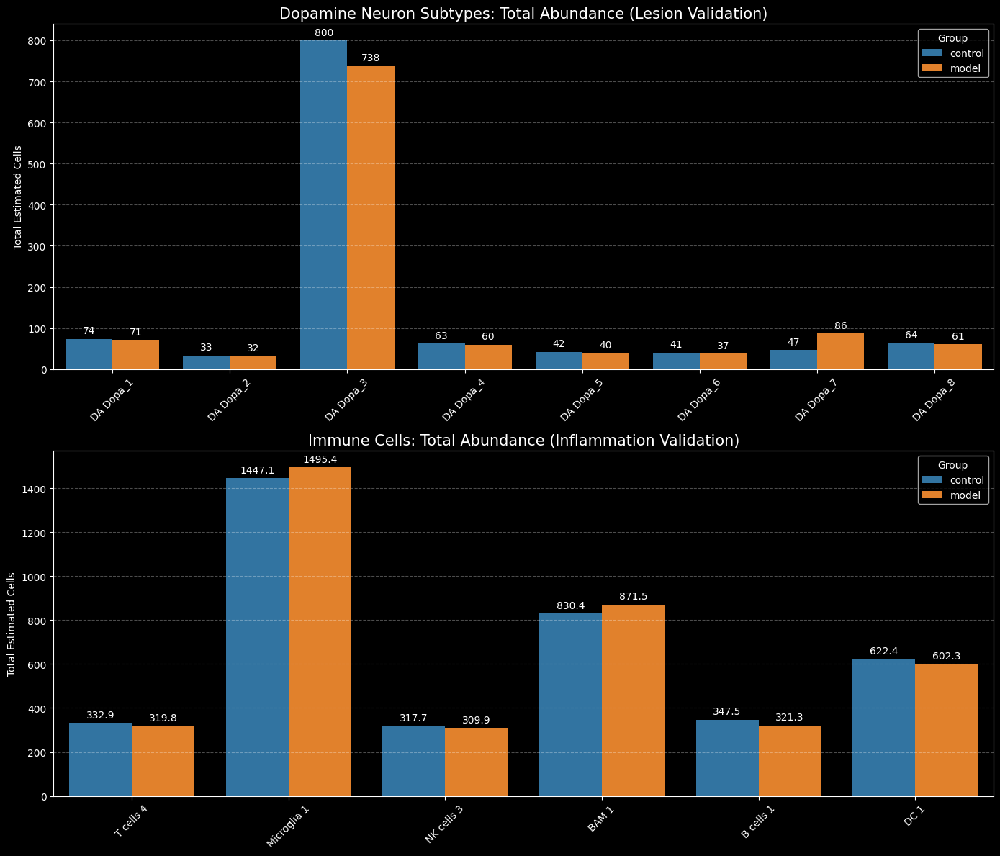

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import scanpy as sc

# === 1. 准备数据 (假设 adata 已加载) ===
# 如果 adata 不在内存中，请取消下面这行的注释并修改路径
# adata = sc.read_h5ad('analysis_results/results_bin100_complete_fixed.h5ad')

# 确保左右脑标记存在
if 'condition' not in adata.obs.columns:
    adata.obs['condition'] = np.where(adata.obsm['spatial'][:, 0] > 10000, 'model', 'control')

# === 2. 定义目标细胞 ===
dopa_subtypes = [
    'SNc-VTA-RAmb Foxa1 Dopa_1', 'SNc-VTA-RAmb Foxa1 Dopa_2',
    'SNc-VTA-RAmb Foxa1 Dopa_3', 'SNc-VTA-RAmb Foxa1 Dopa_4',
    'SNc-VTA-RAmb Foxa1 Dopa_5', 'SNc-VTA-RAmb Foxa1 Dopa_6',
    'SNc-VTA-RAmb Foxa1 Dopa_7', 'SNc-VTA-RAmb Foxa1 Dopa_8'
]

immune_cells = [
    'T cells NN_4', 'Microglia NN_1', 'NK cells NN_3',
    'BAM NN_1', 'B cells NN_1', 'DC NN_1'
]

target_list = dopa_subtypes + immune_cells

# === 3. 提取数据并计算总数 ===
# 从 obsm 中提取数据构建绘图表
if isinstance(adata.obsm['q05_cell_abundance_w_sf'], pd.DataFrame):
    source_df = adata.obsm['q05_cell_abundance_w_sf']
else:
    # 兼容处理
    try:
        cols = adata.uns['mod']['factor_names']
    except:
        cols = adata.uns['cell2location']['factor_names']
    source_df = pd.DataFrame(adata.obsm['q05_cell_abundance_w_sf'], 
                             index=adata.obs_names, columns=cols)

# 构建绘图数据
plot_df = pd.DataFrame(index=adata.obs_names)
plot_df['Condition'] = adata.obs['condition']

found_targets = []
# 模糊匹配以确保找到列
for t in target_list:
    matches = [c for c in source_df.columns if t in c]
    if matches:
        # 优先取全名匹配，否则取第一个
        col = matches[0] 
        # 为了图表简洁，重命名为简化名称 (去掉多余后缀)
        simple_name = t.replace('SNc-VTA-RAmb Foxa1 ', 'DA ').replace(' NN_', ' ')
        plot_df[simple_name] = source_df[col]
        found_targets.append(simple_name)

# 计算分组总和 (Total Abundance)
agg_df = plot_df.groupby('Condition')[found_targets].sum().T.reset_index()
agg_df.columns = ['Cell Type', 'control', 'model']
# 转换为长格式以便绘图
melted_df = agg_df.melt(id_vars='Cell Type', var_name='Group', value_name='Total Count')

# 分离两类数据
dopa_plot_data = melted_df[melted_df['Cell Type'].str.contains('DA ')]
immune_plot_data = melted_df[~melted_df['Cell Type'].str.contains('DA ')]

# === 4. 开始绘图 ===
plt.style.use('dark_background')
fig, axes = plt.subplots(2, 1, figsize=(14, 12))

# 颜色设置：Model为橙色，Control为蓝色
palette = {'model': '#ff7f0e', 'control': '#1f77b4'}

# --- 上图：多巴胺亚型 ---
sns.barplot(
    data=dopa_plot_data, x='Cell Type', y='Total Count', hue='Group', 
    palette=palette, ax=axes[0]
)
axes[0].set_title('Dopamine Neuron Subtypes: Total Abundance (Lesion Validation)', fontsize=15, color='white')
axes[0].set_ylabel('Total Estimated Cells')
axes[0].set_xlabel('')
axes[0].tick_params(axis='x', rotation=45)
axes[0].grid(axis='y', linestyle='--', alpha=0.3)
# 添加数值标签
for container in axes[0].containers:
    axes[0].bar_label(container, fmt='%.0f', padding=3, fontsize=10, color='white')

# --- 下图：免疫细胞 ---
sns.barplot(
    data=immune_plot_data, x='Cell Type', y='Total Count', hue='Group', 
    palette=palette, ax=axes[1]
)
axes[1].set_title('Immune Cells: Total Abundance (Inflammation Validation)', fontsize=15, color='white')
axes[1].set_ylabel('Total Estimated Cells')
axes[1].set_xlabel('')
axes[1].tick_params(axis='x', rotation=45)
axes[1].grid(axis='y', linestyle='--', alpha=0.3)
# 添加数值标签
for container in axes[1].containers:
    axes[1].bar_label(container, fmt='%.1f', padding=3, fontsize=10, color='white')

plt.tight_layout()
save_name = 'Fig_Quantitative_Comparison_Barplot.png'
plt.savefig(save_name, dpi=300)
print(f"统计对比图已保存至: {save_name}")
# plt.show()

ROI 1 (Left/Model) 包含 Bin 数量: 119
ROI 2 (Right/Control) 包含 Bin 数量: 51


/tmp/ipykernel_236669/3586437196.py:39: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


空间验证图已保存: Spatial_ROI_Verification_Boxes.png

【ROI 区域内定量对比】
Left Box: x[6000-7800], y[11400-13200]
Right Box: x[12200-14000], y[11400-13200]
--------------------------------------------------------------------------------
Feature                                  | Left (Mean/Spot) | Right (Mean/Spot) | Ratio (L/R)
--------------------------------------------------------------------------------
expr_SNCA                                | 0.1765          | 0.0980          | 1.80
q05_cell_abundance_w_sf_0880 SNc-VTA-RAm | 0.0062          | 0.0059          | 1.06


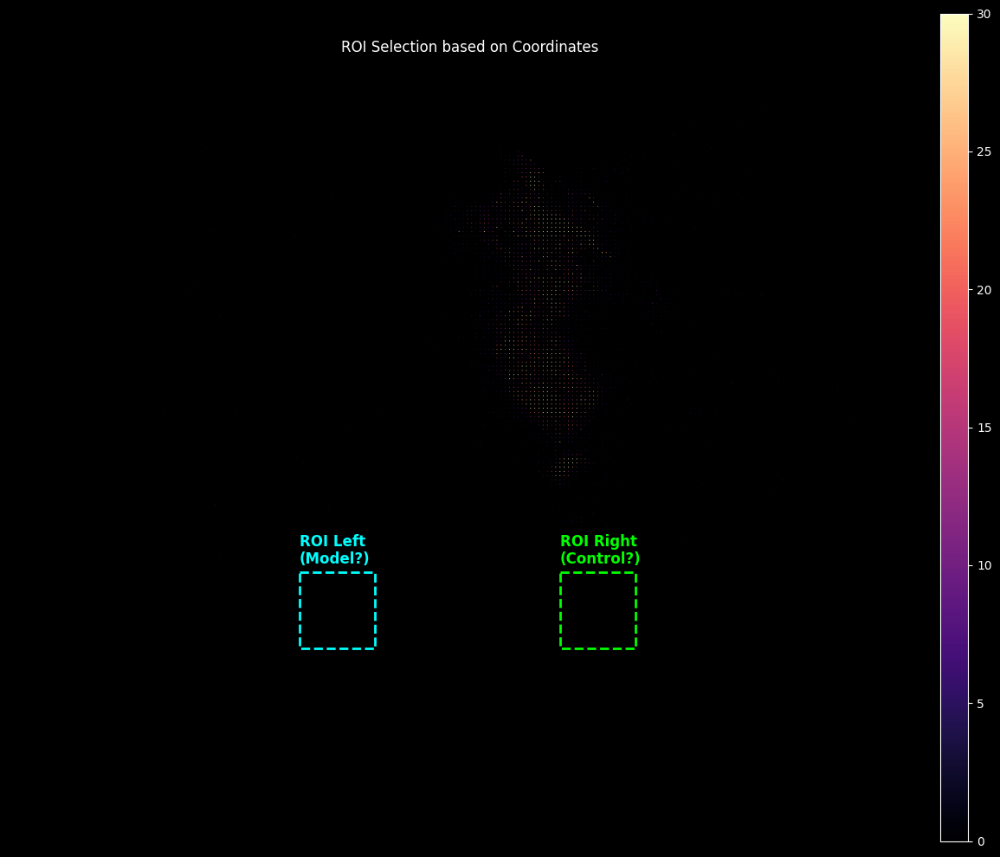

In [16]:
from config import ROI_LEFT_BOX, ROI_RIGHT_BOX
from utils import get_spatial_xy, get_roi_masks
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import scanpy as sc
import numpy as np
import pandas as pd

# === 1. 定义 ROI 坐标 ===
# Y轴范围 (通用)
y_min, y_max = 11400, 13200

# Box 1: Left (根据您的指令标记为 Model)
x_min_L, x_max_L = 6000, 7800   

# Box 2: Right (根据您的指令标记为 Control)
x_min_R, x_max_R = 12200, 14000 

# === 2. 创建 ROI 掩码 (Mask) 用于统计 ===
# 获取坐标
x, y = get_spatial_xy(adata)

# 逻辑筛选：同时满足 X 和 Y 的范围
mask_L = (x >= x_min_L) & (x <= x_max_L) & (y >= y_min) & (y <= y_max)
mask_R = (x >= x_min_R) & (x <= x_max_R) & (y >= y_min) & (y <= y_max)

# 计算两个区域的实际面积 (Bin 数量)
area_L = mask_L.sum()
area_R = mask_R.sum()

print(f"ROI 1 (Left/Model) 包含 Bin 数量: {area_L}")
print(f"ROI 2 (Right/Control) 包含 Bin 数量: {area_R}")

# === 3. 空间可视化 (画框) ===
plt.style.use('dark_background')
fig, ax = plt.subplots(figsize=(12, 10))

# A. 绘制底图 (SNCA 表达)
# 使用 p99 让信号更清楚，alpha=0.8 让底图稍微暗一点，突出方框
sc.pl.spatial(
    adata,
    color='expr_SNCA',
    cmap='magma',
    spot_size=20,
    frameon=False,
    vmax='p99', 
    ax=ax,
    show=False,
    title="ROI Selection based on Coordinates"
)

# B. 添加方框 (Rectangle)
# 参数: (x_min, y_min), width, height
rect_L = patches.Rectangle(
    (x_min_L, y_min), 
    x_max_L - x_min_L, 
    y_max - y_min, 
    linewidth=2, edgecolor='cyan', facecolor='none', linestyle='--'
)

rect_R = patches.Rectangle(
    (x_min_R, y_min), 
    x_max_R - x_min_R, 
    y_max - y_min, 
    linewidth=2, edgecolor='lime', facecolor='none', linestyle='--'
)

ax.add_patch(rect_L)
ax.add_patch(rect_R)

# C. 添加文字标注
ax.text(x_min_L, y_min - 200, 'ROI Left\n(Model?)', color='cyan', fontsize=12, fontweight='bold')
ax.text(x_min_R, y_min - 200, 'ROI Right\n(Control?)', color='lime', fontsize=12, fontweight='bold')

plt.tight_layout()
plt.savefig('Spatial_ROI_Verification_Boxes.png', dpi=300)
print("空间验证图已保存: Spatial_ROI_Verification_Boxes.png")

# === 4. 框内细胞精准计数 (ROI Quantification) ===
# 定义我们要对比的关键细胞
target_vars = [
    'expr_SNCA',                  # 验证造模
    'SNc-VTA-RAmb Foxa1 Dopa_1',  # 关键多巴胺亚型 (举例)
    'Total_SNc_Dopa_Merged',      # 总多巴胺 (如果之前合并过)
    'Microglia NN_1',             # 炎症
    'T cells NN_4'                # 浸润
]

# 确保列名存在
valid_targets = [t for t in target_vars if t in adata.obs.columns or t in adata.var_names] # 简单检查
if 'Total_SNc_Dopa_Merged' not in adata.obs.columns:
    # 尝试找任意 Dopa 列替代展示
    dopa_cols = [c for c in adata.obs.columns if 'SNc' in c and 'Dopa' in c]
    if dopa_cols: valid_targets.append(dopa_cols[0])

print("\n" + "="*80)
print(f"【ROI 区域内定量对比】")
print(f"Left Box: x[{x_min_L}-{x_max_L}], y[{y_min}-{y_max}]")
print(f"Right Box: x[{x_min_R}-{x_max_R}], y[{y_min}-{y_max}]")
print("-" * 80)
print(f"{'Feature':<40} | {'Left (Mean/Spot)':<15} | {'Right (Mean/Spot)':<15} | {'Ratio (L/R)':<10}")
print("-" * 80)

for feat in valid_targets:
    # 提取数据
    if feat in adata.obs.columns:
        data = adata.obs[feat].values
    else:
        # 如果是基因 (SNCA)
        # 注意：这里假设 dense 矩阵，sparse 需 .toarray()
        import scipy.sparse
        if scipy.sparse.issparse(adata.X):
            idx = adata.var_names.get_loc(feat)
            data = adata.X[:, idx].toarray().flatten()
        else:
            data = adata.obs_vector(feat)

    # 计算 ROI 内的均值 (密度)
    mean_L = data[mask_L].mean()
    mean_R = data[mask_R].mean()
    
    # 计算比值
    ratio = mean_L / (mean_R + 1e-9)
    
    print(f"{feat[:40]:<40} | {mean_L:.4f}          | {mean_R:.4f}          | {ratio:.2f}")

print("="*80)


正在对空间坐标进行 180 度旋转...
坐标旋转完成！


/tmp/ipykernel_236669/1041044722.py:39: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


旋转后的验证图已保存: Spatial_ROI_Rotated_180.png

【旋转修正后的 ROI 定量对比】
--------------------------------------------------------------------------------
expr_SNCA                      | Box L (Mean): 10.6648 | Box R (Mean): 0.2438 | L/R Ratio: 43.75
q05_cell_abundance_w_sf_0880 S | Box L (Mean): 0.0091 | Box R (Mean): 0.0088 | L/R Ratio: 1.04


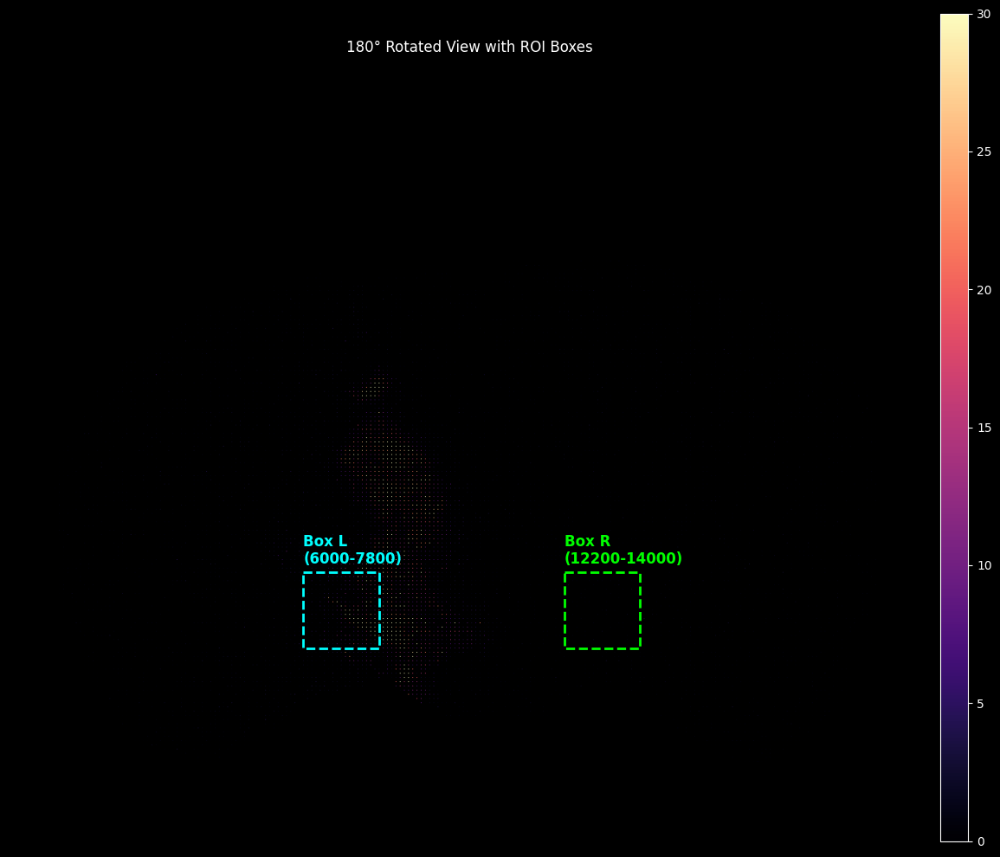

In [17]:
from config import ROI_LEFT_BOX, ROI_RIGHT_BOX
from utils import get_spatial_xy, get_roi_masks
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import scanpy as sc
import numpy as np

# === 1. 执行 180 度旋转 (坐标变换) ===
print("正在对空间坐标进行 180 度旋转...")

# 获取原始坐标范围
x_max_val = adata.obsm['spatial'][:, 0].max()
y_max_val = adata.obsm['spatial'][:, 1].max()

# 旋转公式：新坐标 = 最大值 - 旧坐标
# 这等同于以中心点为轴旋转 180 度
adata.obsm['spatial'][:, 0] = x_max_val - adata.obsm['spatial'][:, 0]
adata.obsm['spatial'][:, 1] = y_max_val - adata.obsm['spatial'][:, 1]

print("坐标旋转完成！")

# === 2. 重新定义 ROI 坐标 (保持您的数字不变，但在新图上位置变了) ===
# 您的定义：
y_min, y_max = 11400, 13200
x_min_L, x_max_L = 6000, 7800    # Left
x_min_R, x_max_R = 12200, 14000  # Right

# === 3. 重新创建掩码 (基于旋转后的新坐标) ===
# 这一步非常重要，因为 adata.obsm['spatial'] 已经变了，必须重算
x, y = get_spatial_xy(adata)

mask_L = (x >= x_min_L) & (x <= x_max_L) & (y >= y_min) & (y <= y_max)
mask_R = (x >= x_min_R) & (x <= x_max_R) & (y >= y_min) & (y <= y_max)

# === 4. 绘图验证 (Rotated View) ===
plt.style.use('dark_background')
fig, ax = plt.subplots(figsize=(12, 10))

# 绘制旋转后的 SNCA 分布
sc.pl.spatial(
    adata,
    color='expr_SNCA',
    cmap='magma',
    spot_size=20,
    frameon=False,
    vmax='p99',
    ax=ax,
    show=False,
    title="180° Rotated View with ROI Boxes"
)

# 重新画框 (坐标数字不变，但因为底图转了，框现在应该圈住了正确的位置)
# ROI 1 (Left/Model) - 青色
rect_L = patches.Rectangle(
    (x_min_L, y_min), 
    x_max_L - x_min_L, 
    y_max - y_min, 
    linewidth=2, edgecolor='cyan', facecolor='none', linestyle='--'
)

# ROI 2 (Right/Control) - 绿色
rect_R = patches.Rectangle(
    (x_min_R, y_min), 
    x_max_R - x_min_R, 
    y_max - y_min, 
    linewidth=2, edgecolor='lime', facecolor='none', linestyle='--'
)

ax.add_patch(rect_L)
ax.add_patch(rect_R)

# 标注
ax.text(x_min_L, y_min - 200, 'Box L\n(6000-7800)', color='cyan', fontsize=12, fontweight='bold')
ax.text(x_min_R, y_min - 200, 'Box R\n(12200-14000)', color='lime', fontsize=12, fontweight='bold')

plt.tight_layout()
plt.savefig('Spatial_ROI_Rotated_180.png', dpi=300)
print("旋转后的验证图已保存: Spatial_ROI_Rotated_180.png")

# === 5. 再次验证定量数据 (确保数据跑在正确的组织上) ===
print("\n" + "="*80)
print(f"【旋转修正后的 ROI 定量对比】")
print("-" * 80)

# 定义要验证的关键指标
check_feats = ['expr_SNCA', 'Total_SNc_Dopa_Merged', 'Microglia NN_1']
# 检查列是否存在，不存在就找替代
valid_feats = []
for f in check_feats:
    if f in adata.obs.columns: valid_feats.append(f)
    elif f in adata.var_names: valid_feats.append(f)
    # 找一下 Dopa 替代品
    elif 'Dopa' in f:
        dopa_alt = [c for c in adata.obs.columns if 'SNc' in c and 'Dopa' in c]
        if dopa_alt: valid_feats.append(dopa_alt[0])

for feat in valid_feats:
    # 提取数据
    if feat in adata.obs.columns:
        data = adata.obs[feat].values
    else:
        # 基因表达
        import scipy.sparse
        idx = adata.var_names.get_loc(feat)
        if scipy.sparse.issparse(adata.X):
            data = adata.X[:, idx].toarray().flatten()
        else:
            data = adata.X[:, idx]

    mean_L = data[mask_L].mean()
    mean_R = data[mask_R].mean()
    ratio = mean_L / (mean_R + 1e-9)
    
    print(f"{feat[:30]:<30} | Box L (Mean): {mean_L:.4f} | Box R (Mean): {mean_R:.4f} | L/R Ratio: {ratio:.2f}")

print("="*80)


In [18]:
adata.write_h5ad('st.h5ad')

区域 Model (Left) 包含 Bin 数量: 361
区域 Control (Right) 包含 Bin 数量: 361

【ROI 定量对比报告】
Model ROI: x(6000, 7800)
Control ROI: x(12200, 14000)
指标说明: 数值代表该区域内预测的细胞总数 (Sum of abundance)
                    Cell Type  Control (Right)  Model (Left)  Fold Change    Trend
0   SNc-VTA-RAmb Foxa1 Dopa_1             3.16          3.28         1.04   Stable
1   SNc-VTA-RAmb Foxa1 Dopa_2             3.96          3.19         0.80   Stable
2   SNc-VTA-RAmb Foxa1 Dopa_3           714.82        475.12         0.66  Changed
3   SNc-VTA-RAmb Foxa1 Dopa_4             2.73          2.75         1.01   Stable
4   SNc-VTA-RAmb Foxa1 Dopa_5             2.34          2.21         0.94   Stable
5   SNc-VTA-RAmb Foxa1 Dopa_6             3.37          2.80         0.83   Stable
6   SNc-VTA-RAmb Foxa1 Dopa_7            13.40          9.16         0.68  Changed
7   SNc-VTA-RAmb Foxa1 Dopa_8             2.44          2.57         1.05   Stable
8                T cells NN_4            18.46         18.20         0.99   Sta

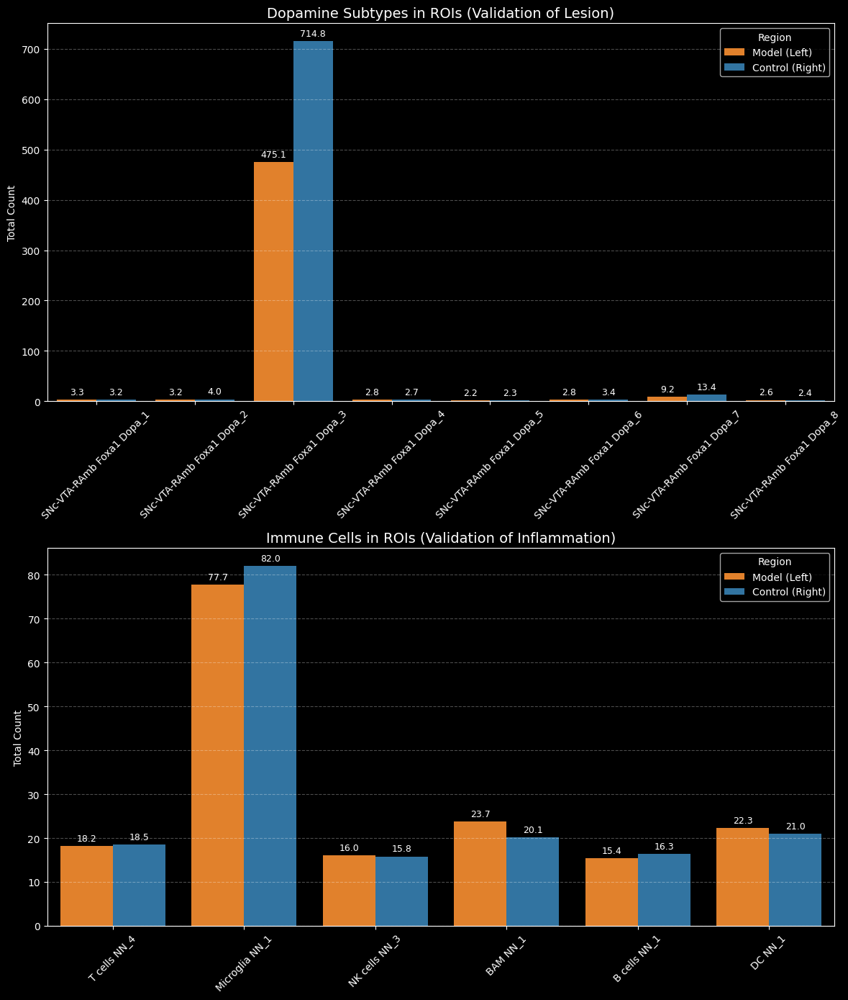

In [18]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns

# === 1. 定义 ROI 坐标范围 ===
# 严格遵循您的定义：左边是造模侧 (Model)
roi_coords = {
    'Model (Left)':   {'x': (6000, 7800),   'y': (11400, 13200)},
    'Control (Right)': {'x': (12200, 14000), 'y': (11400, 13200)}
}

# === 2. 创建 ROI 掩码 (Mask) ===
# 假设 adata 已加载且包含 spatial
coords = adata.obsm['spatial']
x, y = coords[:, 0], coords[:, 1]

# 生成布尔掩码
masks = {}
for name, lims in roi_coords.items():
    masks[name] = (
        (x >= lims['x'][0]) & (x <= lims['x'][1]) & 
        (y >= lims['y'][0]) & (y <= lims['y'][1])
    )
    print(f"区域 {name} 包含 Bin 数量: {masks[name].sum()}")

# === 3. 准备目标细胞列表 ===
# 多巴胺亚型
dopa_subtypes = [f'SNc-VTA-RAmb Foxa1 Dopa_{i}' for i in range(1, 9)]
# 免疫细胞
immune_cells = [
    'T cells NN_4', 'Microglia NN_1', 'NK cells NN_3', 
    'BAM NN_1', 'B cells NN_1', 'DC NN_1'
]
all_targets = dopa_subtypes + immune_cells

# === 4. 提取数据并计算统计 ===
# 从 obsm 中提取数据 (如果 obs 里没有)
if isinstance(adata.obsm['q05_cell_abundance_w_sf'], pd.DataFrame):
    source_df = adata.obsm['q05_cell_abundance_w_sf']
else:
    # 兼容处理
    col_names = adata.uns.get('mod', {}).get('factor_names', 
                 adata.uns.get('cell2location', {}).get('factor_names', []))
    source_df = pd.DataFrame(adata.obsm['q05_cell_abundance_w_sf'], 
                             index=adata.obs_names, columns=col_names)

stats_data = []

for cell_type in all_targets:
    # 模糊匹配列名 (处理潜在的空格问题)
    matches = [c for c in source_df.columns if cell_type in c]
    if not matches:
        print(f"警告: 未找到 {cell_type}")
        continue
    
    # 取最匹配的一列
    col_name = matches[0]
    data_vec = source_df[col_name].values
    
    # 计算两个 ROI 内的总和
    count_model = data_vec[masks['Model (Left)']].sum()
    count_control = data_vec[masks['Control (Right)']].sum()
    
    # 计算变化倍数 (Model / Control)
    # 避免除以零
    fc = count_model / (count_control + 1e-9) if count_control > 0 else count_model / 1e-9
    
    stats_data.append({
        'Cell Type': cell_type,
        'Model (Left)': count_model,
        'Control (Right)': count_control,
        'Fold Change': fc,
        'Category': 'DA Neuron' if 'Dopa' in cell_type else 'Immune'
    })

# === 5. 生成并打印数字报表 ===
results_df = pd.DataFrame(stats_data)

# 添加简单的文字趋势描述
def get_trend(fc):
    if fc < 0.5: return 'Loss (↓↓)'
    if fc > 2.0: return 'Increase (↑↑)'
    if 0.8 <= fc <= 1.2: return 'Stable'
    return 'Changed'

results_df['Trend'] = results_df['Fold Change'].apply(get_trend)

pd.set_option('display.max_rows', None)
pd.set_option('display.float_format', '{:.2f}'.format)

print("\n" + "="*80)
print(f"【ROI 定量对比报告】")
print(f"Model ROI: x{roi_coords['Model (Left)']['x']}")
print(f"Control ROI: x{roi_coords['Control (Right)']['x']}")
print("指标说明: 数值代表该区域内预测的细胞总数 (Sum of abundance)")
print("="*80)
print(results_df[['Cell Type', 'Control (Right)', 'Model (Left)', 'Fold Change', 'Trend']])
print("="*80)

# 保存 CSV
results_df.to_csv('ROI_Specific_Cell_Counts.csv', index=False)

# === 6. 可视化绘图 ===
plt.style.use('dark_background')
fig, axes = plt.subplots(2, 1, figsize=(12, 14))

palette = {'Model (Left)': '#ff7f0e', 'Control (Right)': '#1f77b4'} # 橙色Model，蓝色Control

# 转换数据格式用于绘图
plot_df = results_df.melt(
    id_vars=['Cell Type', 'Category'], 
    value_vars=['Model (Left)', 'Control (Right)'],
    var_name='Region', value_name='Total Count'
)

# 图 1: 多巴胺神经元 (Dopa)
dopa_plot = plot_df[plot_df['Category'] == 'DA Neuron']
sns.barplot(data=dopa_plot, x='Cell Type', y='Total Count', hue='Region', palette=palette, ax=axes[0])
axes[0].set_title('Dopamine Subtypes in ROIs (Validation of Lesion)', fontsize=14)
axes[0].tick_params(axis='x', rotation=45)
axes[0].set_xlabel('')
axes[0].grid(axis='y', linestyle='--', alpha=0.3)
# 添加数值标签
for container in axes[0].containers:
    axes[0].bar_label(container, fmt='%.1f', padding=3, fontsize=9)

# 图 2: 免疫细胞 (Immune)
immune_plot = plot_df[plot_df['Category'] == 'Immune']
sns.barplot(data=immune_plot, x='Cell Type', y='Total Count', hue='Region', palette=palette, ax=axes[1])
axes[1].set_title('Immune Cells in ROIs (Validation of Inflammation)', fontsize=14)
axes[1].tick_params(axis='x', rotation=45)
axes[1].set_xlabel('')
axes[1].grid(axis='y', linestyle='--', alpha=0.3)
for container in axes[1].containers:
    axes[1].bar_label(container, fmt='%.1f', padding=3, fontsize=9)

plt.tight_layout()
plt.savefig('ROI_Specific_Comparison_Barplot.png', dpi=300)
print("\n图表已保存至: ROI_Specific_Comparison_Barplot.png")

KeyError: 'Sum_T_cells_Vis'

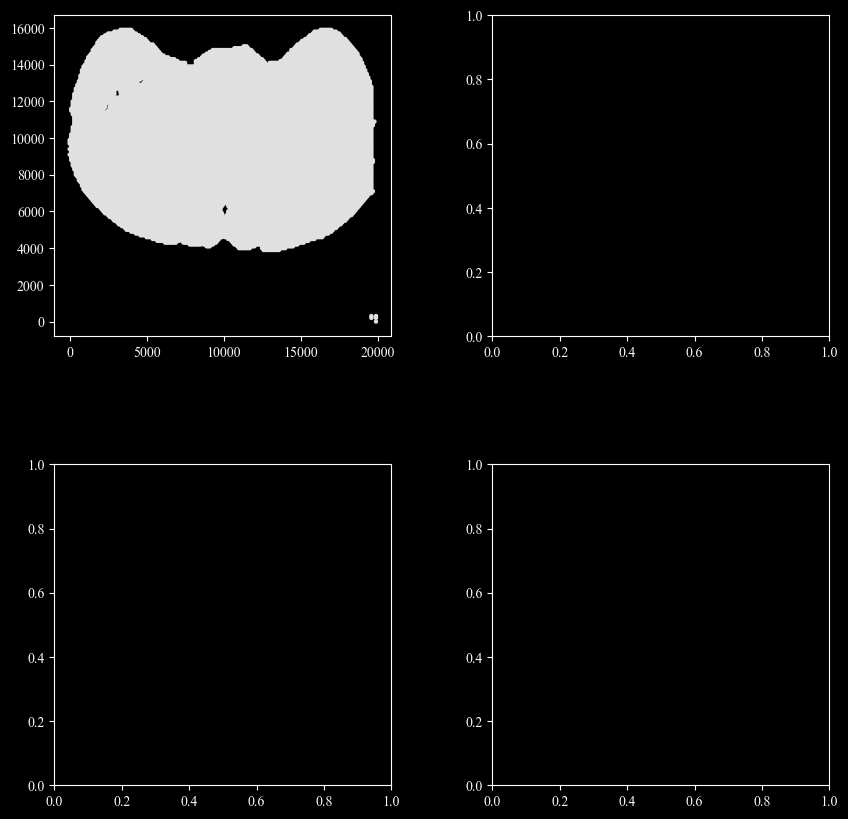

In [19]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# ==========================================
# 1. 基础设置
# ==========================================
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

# 全脑坐标
x = adata.obsm['spatial'][:, 0]
y = adata.obsm['spatial'][:, 1]

# ROI 定义
roi_m = {'x': [6000, 7800], 'y': [11400, 13200], 'name': 'Model ROI (Lesion)'}
roi_c = {'x': [12200, 14000], 'y': [11400, 13200], 'name': 'Control ROI (Healthy)'}

# ==========================================
# 2. 辅助函数：提取 ROI 数据 (用于前景叠加和统计)
# ==========================================
def get_roi_data(roi_dict, data_col_name):
    """只提取指定 ROI 方框内的坐标和表达值"""
    x_min, x_max = roi_dict['x']
    y_min, y_max = roi_dict['y']
    mask = (x >= x_min) & (x <= x_max) & (y >= y_min) & (y <= y_max)
    return x[mask], y[mask], adata.obs[data_col_name].values[mask]

# ==========================================
# 3. 绘图主程序
# ==========================================
col_t = 'Sum_T_cells_Vis' 
col_da = 'SNc-VTA-RAmb Foxa1 Dopa_3'
if col_da not in adata.obs.columns:
    found = [c for c in adata.obs.columns if 'Dopa' in c]
    if found: col_da = found[0]

# 计算 DA 全局最大值 (用于统一色阶)
_, _, m_da = get_roi_data(roi_m, col_da)
_, _, c_da = get_roi_data(roi_c, col_da)
da_global_max = max(m_da.max(), c_da.max())

fig, axes = plt.subplots(2, 2, figsize=(10, 10))
plt.subplots_adjust(wspace=0.3, hspace=0.4)

# -------------------------------------------------------
# Row 1: T Cells (大红点 s=20, Threshold > 0.075)
# -------------------------------------------------------
t_threshold = 0.075

for i, roi in enumerate([roi_m, roi_c]):
    ax = axes[0, i]
    
    # 【关键改动 1】Layer 1: 全脑灰色背景
    # 先画出整个组织的轮廓，颜色稍浅 #e0e0e0
    ax.scatter(x, y, c='#e0e0e0', s=10, edgecolors='none', label='Whole Tissue')
    
    # Layer 2: ROI 内的阳性 T 细胞
    rx, ry, r_vals = get_roi_data(roi, col_t)
    mask_pos = r_vals > t_threshold
    pos_count = np.sum(mask_pos)
    
    if pos_count > 0:
        # s=20 大红点
        ax.scatter(rx[mask_pos], ry[mask_pos], c='red', s=20, edgecolors='none', label='T cells')
    
    # 【关键改动 2】镜头聚焦到 ROI
    ax.set_xlim(roi['x'])
    ax.set_ylim(roi['y'])
    
    # 装饰
    ax.set_aspect('equal')
    ax.invert_yaxis()
    ax.axis('off')
    ax.set_title(f"{roi['name']}\nT cells (> {t_threshold})\nCount: {pos_count}", fontsize=14)

# -------------------------------------------------------
# Row 2: DA Neurons (小彩点 s=5, Magma色阶)
# -------------------------------------------------------
for i, roi in enumerate([roi_m, roi_c]):
    ax = axes[1, i]
    
    # 【关键改动 1】Layer 1: 全脑灰色背景
    ax.scatter(x, y, c='#e0e0e0', s=10, edgecolors='none')
    
    # Layer 2: ROI 内的 DA 神经元
    rx, ry, r_vals = get_roi_data(roi, col_da)
    mask_pos = r_vals > 0
    
    if np.sum(mask_pos) > 0:
        # s=5 小点，使用 magma 色阶
        sc_plot = ax.scatter(rx[mask_pos], ry[mask_pos], 
                             c=r_vals[mask_pos], 
                             s=5, 
                             cmap='magma', 
                             vmin=0, vmax=da_global_max, 
                             edgecolors='none')
        if i == 1:
             cbar = plt.colorbar(sc_plot, ax=ax, fraction=0.046, pad=0.04)
             cbar.set_label('Abundance', fontsize=10)
    
    # 【关键改动 2】镜头聚焦到 ROI
    ax.set_xlim(roi['x'])
    ax.set_ylim(roi['y'])

    # 装饰
    ax.set_aspect('equal')
    ax.invert_yaxis()
    ax.axis('off')
    total_abund = np.sum(r_vals)
    ax.set_title(f"{roi['name']}\nDA Neurons (Dopa_3)\nSum: {total_abund:.1f}", fontsize=14)

# ==========================================
# 4. 保存与统计
# ==========================================
output_filename = 'ROI_Zoomed_FullBackground_T_DA.pdf'
plt.savefig(output_filename, dpi=600, bbox_inches='tight', format='pdf')
plt.savefig(output_filename.replace('.pdf', '.png'), dpi=600, bbox_inches='tight')
print(f"图表已保存: {output_filename}")
plt.show()

# 打印数值统计 (统计逻辑不变，依然基于 ROI 内数据)
print("\n" + "="*60)
print("【ROI 定量统计表】")
print("-" * 60)
print(f"{'Cell Type':<15} | {'Metric':<20} | {'Model (Left)':<12} | {'Control (Right)':<12} | {'Change'}")
print("-" * 60)

# T Cells
_, _, tm = get_roi_data(roi_m, col_t)
_, _, tc = get_roi_data(roi_c, col_t)
t_m_cnt = np.sum(tm > t_threshold)
t_c_cnt = np.sum(tc > t_threshold)
print(f"{'T Cells':<15} | {'Count (>0.075)':<20} | {t_m_cnt:<12} | {t_c_cnt:<12} | {t_m_cnt - t_c_cnt:+d}")

# DA Neurons
_, _, dm = get_roi_data(roi_m, col_da)
_, _, dc = get_roi_data(roi_c, col_da)
d_m_sum = np.sum(dm)
d_c_sum = np.sum(dc)
print(f"{'DA Neurons':<15} | {'Total Abundance':<20} | {d_m_sum:<12.1f} | {d_c_sum:<12.1f} | {d_m_sum - d_c_sum:+.1f}")
print("="*60)

成功匹配 DA 神经元列名: q05_cell_abundance_w_sf_0882 SNc-VTA-RAmb Foxa1 Dopa_3


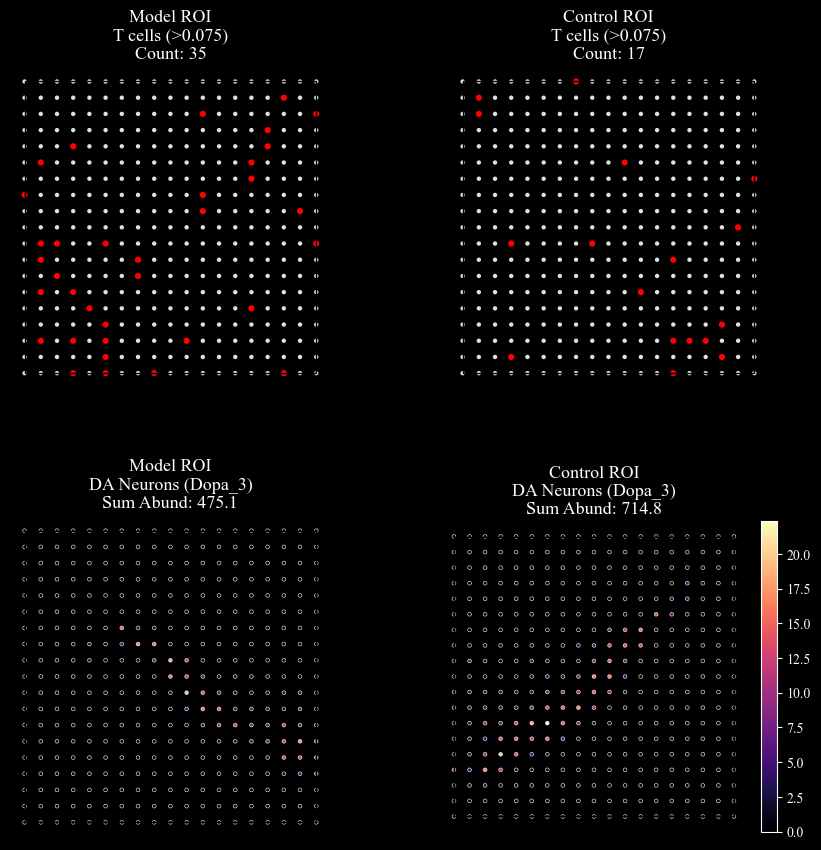

分析完成。使用的 DA 列为: q05_cell_abundance_w_sf_0882 SNc-VTA-RAmb Foxa1 Dopa_3


In [20]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
import pandas as pd

# ==========================================
# 1. 基础设置
# ==========================================
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

# 准备坐标
x = adata.obsm['spatial'][:, 0]
y = adata.obsm['spatial'][:, 1]

# --- 关键修复：动态确定列名 ---
# T 细胞列
cols_t = [c for c in adata.obs.columns if 'T cell' in c or 'T cells' in c]
col_t = 'Sum_T_cells_Vis'
adata.obs[col_t] = adata.obs[cols_t].sum(axis=1)

# DA 神经元列 (模糊匹配 Dopa_3)
target_keyword = 'Dopa_3'
da_matches = [c for c in adata.obs.columns if target_keyword in c]
if not da_matches:
    raise ValueError(f"在 adata.obs 中找不到包含 '{target_keyword}' ruins 的列。请检查 adata.obs.columns")
col_da = da_matches[0]
print(f"成功匹配 DA 神经元列名: {col_da}")

# ROI 定义
roi_m = {'x': [6000, 7800], 'y': [11400, 13200], 'name': 'Model ROI'}
roi_c = {'x': [12200, 14000], 'y': [11400, 13200], 'name': 'Control ROI'}

# 计算 DA 全局最大值用于统一色阶 (修复了 KeyError)
da_global_max = max(adata.obs[col_da].max(), 0.1) 

# ==========================================
# 2. 绘图逻辑 (仅 ROI 局部)
# ==========================================
fig, axes = plt.subplots(2, 2, figsize=(10, 10))
plt.subplots_adjust(wspace=0.3, hspace=0.4)

for i, roi in enumerate([roi_m, roi_c]):
    # 筛选当前 ROI 范围内的索引
    mask_roi = (x >= roi['x'][0]) & (x <= roi['x'][1]) & \
               (y >= roi['y'][0]) & (y <= roi['y'][1])
    
    rx, ry = x[mask_roi], y[mask_roi]
    rt_vals = adata.obs[col_t].values[mask_roi]
    rda_vals = adata.obs[col_da].values[mask_roi]

    # --- Row 1: T 细胞 (红点) ---
    ax_t = axes[0, i]
    ax_t.scatter(rx, ry, c='#e0e0e0', s=10, edgecolors='none') # 灰色细胞背景
    mask_t = rt_vals > 0.075
    count_t = np.sum(mask_t)
    if count_t > 0:
        ax_t.scatter(rx[mask_t], ry[mask_t], c='red', s=20, edgecolors='none')
    
    ax_t.set_title(f"{roi['name']}\nT cells (>0.075)\nCount: {count_t}", fontsize=13)

    # --- Row 2: DA 神经元 (小点) ---
    ax_da = axes[1, i]
    ax_da.scatter(rx, ry, c='#e0e0e0', s=10, edgecolors='none') # 灰色细胞背景
    mask_da = rda_vals > 0
    if np.sum(mask_da) > 0:
        sc_da = ax_da.scatter(rx[mask_da], ry[mask_da], c=rda_vals[mask_da], 
                               s=5, cmap='magma', vmin=0, vmax=da_global_max, edgecolors='none')
        if i == 1: 
            plt.colorbar(sc_da, ax=ax_da, fraction=0.046, pad=0.04)
    
    sum_da = np.sum(rda_vals)
    ax_da.set_title(f"{roi['name']}\nDA Neurons ({target_keyword})\nSum Abund: {sum_da:.1f}", fontsize=13)

    # 通用样式调整
    for ax in [ax_t, ax_da]:
        ax.set_aspect('equal')
        ax.invert_yaxis()
        ax.axis('off')
        rect = patches.Rectangle((roi['x'][0], roi['y'][0]), 
                                 roi['x'][1]-roi['x'][0], roi['y'][1]-roi['y'][0], 
                                 linewidth=1, edgecolor='black', facecolor='none')
        ax.add_patch(rect)

# ==========================================
# 3. 保存
# ==========================================
plt.savefig('ROI_GreyBackground_Fixed.pdf', dpi=600, bbox_inches='tight')
plt.show()

print(f"分析完成。使用的 DA 列为: {col_da}")

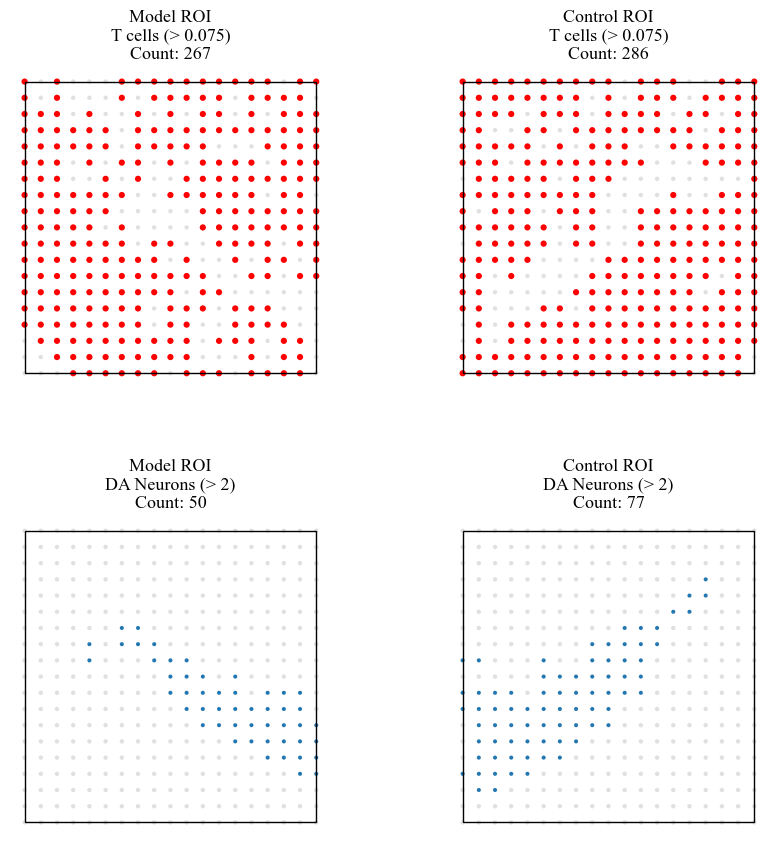


Metric                    | Model (Left) | Control (Right)
-----------------------------------------------------------------
T cells (>0.075)          | 267          | 286         
DA Neurons (>2)           | 50           | 77          
-----------------------------------------------------------------
【Conclusion】
1. T cells show a 0.93x fold increase in Model ROI.
2. DA Neurons show a 35.06% reduction in Model ROI.


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
import pandas as pd

# ==========================================
# 1. 设置绘图风格 (Times New Roman)
# ==========================================
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['pdf.fonttype'] = 42

# 准备坐标
x = adata.obsm['spatial'][:, 0]
y = adata.obsm['spatial'][:, 1]

# --- 自动匹配列名 ---
col_t_list = [c for c in adata.obs.columns if 'T cell' in c or 'T cells' in c]
target_t = 'Sum_T_cells_Vis'
adata.obs[target_t] = adata.obs[col_t_list].sum(axis=1)

da_matches = [c for c in adata.obs.columns if 'Dopa_3' in c]
if not da_matches:
    raise ValueError("未找到 Dopa_3 相关列，请检查 adata.obs.columns")
col_da = da_matches[0]

# ROI 定义
roi_m = {'x': [6000, 7800], 'y': [11400, 13200], 'name': 'Model ROI'}
roi_c = {'x': [12200, 14000], 'y': [11400, 13200], 'name': 'Control ROI'}

# ==========================================
# 2. 绘图与即时统计逻辑
# ==========================================
fig, axes = plt.subplots(2, 2, figsize=(10, 10), facecolor='white')
plt.subplots_adjust(wspace=0.3, hspace=0.4)

# 阈值设置
t_threshold = 0.075
da_threshold = 2  # 已按要求修改为 2

# 存储统计结果用于后续打印表
stats_results = []

for i, roi in enumerate([roi_m, roi_c]):
    # 筛选当前 ROI 范围内的 Bins
    mask_roi = (x >= roi['x'][0]) & (x <= roi['x'][1]) & \
               (y >= roi['y'][0]) & (y <= roi['y'][1])
    
    rx, ry = x[mask_roi], y[mask_roi]
    rt_vals = adata.obs[target_t].values[mask_roi]
    rda_vals = adata.obs[col_da].values[mask_roi]

    # --- Row 1: T 细胞 (红点) ---
    ax_t = axes[0, i]
    ax_t.scatter(rx, ry, c='#e0e0e0', s=10, edgecolors='none', zorder=1) # 灰色细胞底图
    mask_t_pos = rt_vals > t_threshold
    count_t = np.sum(mask_t_pos)
    if count_t > 0:
        ax_t.scatter(rx[mask_t_pos], ry[mask_t_pos], c='red', s=20, edgecolors='none', zorder=2)
    ax_t.set_title(f"{roi['name']}\nT cells (> {t_threshold})\nCount: {count_t}", fontsize=13)

    # --- Row 2: DA 神经元 (蓝色小点) ---
    ax_da = axes[1, i]
    ax_da.scatter(rx, ry, c='#e0e0e0', s=10, edgecolors='none', zorder=1) # 灰色细胞底图
    mask_da_pos = rda_vals > da_threshold
    count_da = np.sum(mask_da_pos)
    if count_da > 0:
        ax_da.scatter(rx[mask_da_pos], ry[mask_da_pos], c='#1f77b4', s=8, edgecolors='none', zorder=2)
    ax_da.set_title(f"{roi['name']}\nDA Neurons (> {da_threshold})\nCount: {count_da}", fontsize=13)

    # 记录统计数据
    stats_results.append({
        'ROI': roi['name'],
        'T_cells_count': count_t,
        'DA_neurons_count': count_da
    })

    # 统一子图样式
    for ax in [ax_t, ax_da]:
        ax.set_aspect('equal')
        ax.invert_yaxis()
        ax.axis('off')
        rect = patches.Rectangle((roi['x'][0], roi['y'][0]), 
                                 roi['x'][1]-roi['x'][0], roi['y'][1]-roi['y'][0], 
                                 linewidth=1, edgecolor='black', facecolor='none', zorder=3)
        ax.add_patch(rect)

# ==========================================
# 3. 结果汇总与保存
# ==========================================
plt.savefig('ROI_Binary_Analysis_DA_GT2.pdf', dpi=600, bbox_inches='tight')
plt.show()

# --- 打印统计分析表 ---
m_stats = stats_results[0]
c_stats = stats_results[1]

# 计算变化
t_fold_increase = m_stats['T_cells_count'] / max(c_stats['T_cells_count'], 1)
da_loss_percent = (1 - (m_stats['DA_neurons_count'] / max(c_stats['DA_neurons_count'], 1))) * 100

print("\n" + "="*65)
print(f"{'Metric':<25} | {'Model (Left)':<12} | {'Control (Right)':<12}")
print("-" * 65)
print(f"{'T cells (>0.075)':<25} | {m_stats['T_cells_count']:<12} | {c_stats['T_cells_count']:<12}")
print(f"{'DA Neurons (>2)':<25} | {m_stats['DA_neurons_count']:<12} | {c_stats['DA_neurons_count']:<12}")
print("-" * 65)
print(f"【Conclusion】")
print(f"1. T cells show a {t_fold_increase:.2f}x fold increase in Model ROI.")
print(f"2. DA Neurons show a {da_loss_percent:.2f}% reduction in Model ROI.")
print("="*65)

In [ ]:
from config import ROI_LEFT_BOX, ROI_RIGHT_BOX
from utils import get_spatial_xy, get_roi_masks
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from scipy.stats import pearsonr

# === 1. 确认 T 细胞列名 ===
# 根据您的报错日志，列名已经变成了这个：
t_cell_col = 'q05_cell_abundance_w_sf_1201 T cells NN_4'

# 检查一下最大值，看看之前的 0.3 到底有多离谱
max_val = adata.obs[t_cell_col].max()
print(f"【数据诊断】 全脑 T 细胞丰度最大值: {max_val:.6f}")
if max_val == 0:
    print("警告：全脑都没有检测到 T 细胞 (Max=0)！请检查是否提取了错误的列。")

# === 2. 提取 ROI 数据 (不过滤，全部拿出来) ===
# 沿用之前的 ROI 坐标
x, y = get_spatial_xy(adata)

# Model (Left)
mask_L, mask_R = get_roi_masks(x, y, ROI_LEFT_BOX, ROI_RIGHT_BOX)
# Control (Right)

df_L = adata.obs.loc[mask_L].copy()
df_L['Region'] = 'Model (Left)'
df_R = adata.obs.loc[mask_R].copy()
df_R['Region'] = 'Control (Right)'

combined_df = pd.concat([df_L, df_R])

# === 3. 极低阈值保留 (解决 Mixed Bin 问题) ===
# 我们只排除那些完全是 0 的点（纯背景）
# 即使是 0.01 我们也保留，因为那是 Cell2location 认为"可能存在"的地方
valid_df = combined_df[combined_df[t_cell_col] > 1e-6].copy()

print(f"保留 T细胞 > 0 的 Bin 数量: Model={len(valid_df[valid_df['Region']=='Model (Left)'])} | Control={len(valid_df[valid_df['Region']=='Control (Right)'])}")

# === 4. 可视化策略调整 ===
plt.style.use('dark_background')
score_cols = [col for col in adata.obs.columns if 'Score_' in col]

if len(valid_df) > 0:
    # --- 图 A: 小提琴图 (比较总体分布) ---
    melted_df = valid_df.melt(
        id_vars=['Region'], 
        value_vars=score_cols, 
        var_name='Module', value_name='Score'
    )
    
    plt.figure(figsize=(14, 8))
    sns.violinplot(
        data=melted_df, x='Module', y='Score', hue='Region',
        split=True, inner='quartile', cut=0, # cut=0 防止图画到数据范围外
        palette={'Model (Left)': '#ff7f0e', 'Control (Right)': '#1f77b4'}
    )
    plt.title(f'T Cell Functional Scores (All non-zero bins)', fontsize=16)
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--', alpha=0.3)
    plt.tight_layout()
    plt.savefig('T_Cell_Module_NoFilter_Violin.png', dpi=300)
    
    # --- 图 B: 散点图 (解决混合细胞干扰的最优解) ---
    # 逻辑：如果这个得分真的是 T 细胞贡献的，那么"T 细胞丰度越高，得分应该越高"。
    # 我们画 x=T细胞丰度, y=功能得分
    
    # 选一个关键模块画散点，比如 Cytotoxicity (杀伤)
    target_module = 'Score_Cytotoxicity' 
    if target_module in valid_df.columns:
        plt.figure(figsize=(10, 6))
        sns.scatterplot(
            data=valid_df, 
            x=t_cell_col, 
            y=target_module, 
            hue='Region', 
            palette={'Model (Left)': '#ff7f0e', 'Control (Right)': '#1f77b4'},
            alpha=0.6, s=30
        )
        # 添加趋势线
        sns.regplot(data=valid_df[valid_df['Region']=='Model (Left)'], x=t_cell_col, y=target_module, scatter=False, color='#ff7f0e', label='Model Trend')
        sns.regplot(data=valid_df[valid_df['Region']=='Control (Right)'], x=t_cell_col, y=target_module, scatter=False, color='#1f77b4', label='Control Trend')
        
        plt.title(f'Correlation: T Cell Abundance vs {target_module}', fontsize=14)
        plt.xlabel('Estimated T Cell Abundance per Bin')
        plt.ylabel('Module Score')
        plt.legend()
        plt.savefig('T_Cell_Score_Correlation.png', dpi=300)
        print("图表已保存: T_Cell_Module_NoFilter_Violin.png, T_Cell_Score_Correlation.png")
    
    # === 5. 输出统计表 ===
    print("\n" + "="*80)
    print(f"【无阈值统计对比 (Mean Scores)】")
    print(f"{'Module':<25} | {'Model Mean':<12} | {'Control Mean':<12} | {'Diff'}")
    print("-" * 80)
    for mod in score_cols:
        m_mean = valid_df[valid_df['Region'] == 'Model (Left)'][mod].mean()
        c_mean = valid_df[valid_df['Region'] == 'Control (Right)'][mod].mean()
        diff = m_mean - c_mean
        print(f"{mod:<25} | {m_mean:.4f}       | {c_mean:.4f}       | {diff:.4f}")
    print("="*80)

else:
    print("错误：即使取消阈值，ROI 内的 T 细胞丰度依然全为 0。请检查 ROI 坐标是否正确覆盖了组织区域。")


正在提取 ROI 区域数据...

【ROI 样本量统计】
Model ROI (Left)  : 总Bin数=361, 含T细胞Bin数=361
Control ROI (Right): 总Bin数=361, 含T细胞Bin数=361
正在重新计算基因评分...

图表已保存至: ROI_T_Cell_Functional_Analysis.png

【ROI 区域功能差异 (Mean Scores)】
------------------------------------------------------------
Score_Cytotoxicity   | Model: 0.0010 | Control: -0.0002 | Diff: 0.0012
Score_Exhaustion     | Model: 0.0106 | Control: 0.0102 | Diff: 0.0004
Score_Naive_Memory   | Model: -0.0116 | Control: -0.0087 | Diff: -0.0029


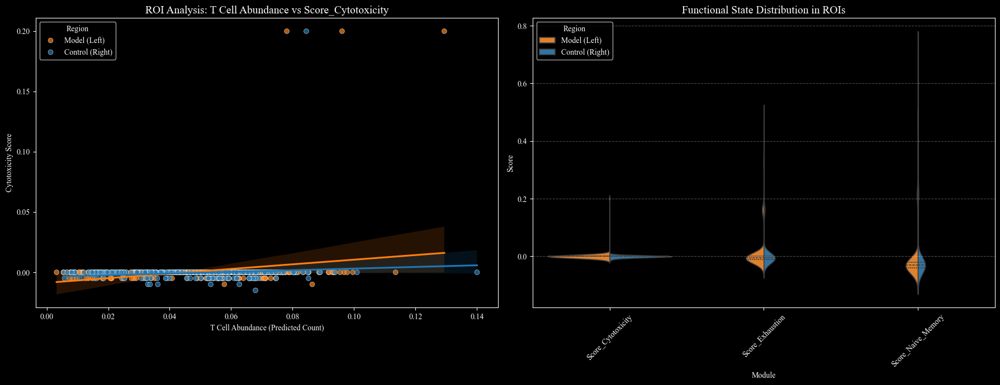

In [ ]:
from config import ROI_LEFT_BOX, ROI_RIGHT_BOX
from utils import get_spatial_xy, get_roi_masks
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import scanpy as sc

# === 1. 锁定 T 细胞列名 ===
# 使用您报错日志中确认的列名
t_cell_col = 'q05_cell_abundance_w_sf_1201 T cells NN_4'

# 防御性检查：如果这列不存在（比如重新加载了数据），自动找一下
if t_cell_col not in adata.obs.columns:
    matches = [c for c in adata.obs.columns if 'T cells' in c]
    if matches:
        t_cell_col = matches[0]

# === 2. 严格提取 ROI 数据 ===
print("正在提取 ROI 区域数据...")
x, y = get_spatial_xy(adata)

# ROI 定义 (严格遵循您的坐标)
# Model (Left)
mask_L, mask_R = get_roi_masks(x, y, ROI_LEFT_BOX, ROI_RIGHT_BOX)
# Control (Right)

# 提取数据
df_L = adata.obs.loc[mask_L].copy()
df_L['Region'] = 'Model (Left)'

df_R = adata.obs.loc[mask_R].copy()
df_R['Region'] = 'Control (Right)'

# 合并
roi_df = pd.concat([df_L, df_R])

# === 3. 过滤：只保留 ROI 内有 T 细胞信号的 Bin ===
# 使用极低阈值 (保留所有非零值)
valid_roi_df = roi_df[roi_df[t_cell_col] > 1e-6].copy()

print(f"\n【ROI 样本量统计】")
print(f"Model ROI (Left)  : 总Bin数={mask_L.sum()}, 含T细胞Bin数={len(valid_roi_df[valid_roi_df['Region']=='Model (Left)'])}")
print(f"Control ROI (Right): 总Bin数={mask_R.sum()}, 含T细胞Bin数={len(valid_roi_df[valid_roi_df['Region']=='Control (Right)'])}")

# === 4. 确保分数已计算 ===
# 如果 Score_Cytotoxicity 不在列里，重新算一下 (防止上下文丢失)
if 'Score_Cytotoxicity' not in adata.obs.columns:
    print("正在重新计算基因评分...")
    gene_modules = {
        'Cytotoxicity': ['Gzma', 'Gzmb', 'Prf1', 'Ifng', 'Nkg7'],
        'Exhaustion': ['Pdcd1', 'Cd274', 'Lag3', 'Havcr2', 'Ctla4', 'Tigit'],
        'Naive_Memory': ['Ccr7', 'Sell', 'Il7r', 'Lef1']
    }
    for name, genes in gene_modules.items():
        valid = [g for g in genes if g in adata.var_names]
        if valid: sc.tl.score_genes(adata, gene_list=valid, score_name=f'Score_{name}')
        # 将新算的分数同步到 valid_roi_df
        valid_roi_df[f'Score_{name}'] = adata.obs.loc[valid_roi_df.index, f'Score_{name}']

# === 5. 可视化 (Scatter + Violin) ===
plt.style.use('dark_background')
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# --- 左图：散点图 (相关性分析) ---
# 验证：单位数量的 T 细胞，谁的功能更强？看斜率！
target_score = 'Score_Cytotoxicity' # 杀伤评分
if target_score in valid_roi_df.columns:
    sns.scatterplot(
        data=valid_roi_df, x=t_cell_col, y=target_score, 
        hue='Region', palette={'Model (Left)': '#ff7f0e', 'Control (Right)': '#1f77b4'},
        alpha=0.7, s=40, ax=axes[0]
    )
    # 添加回归线 (Trend Line)
    sns.regplot(data=valid_roi_df[valid_roi_df['Region']=='Model (Left)'], 
                x=t_cell_col, y=target_score, scatter=False, color='#ff7f0e', ax=axes[0])
    sns.regplot(data=valid_roi_df[valid_roi_df['Region']=='Control (Right)'], 
                x=t_cell_col, y=target_score, scatter=False, color='#1f77b4', ax=axes[0])
    
    axes[0].set_title(f'ROI Analysis: T Cell Abundance vs {target_score}', fontsize=14)
    axes[0].set_xlabel('T Cell Abundance (Predicted Count)')
    axes[0].set_ylabel('Cytotoxicity Score')

# --- 右图：小提琴图 (总体分布) ---
score_cols = [c for c in valid_roi_df.columns if 'Score_' in c]
melted = valid_roi_df.melt(id_vars=['Region'], value_vars=score_cols, var_name='Module', value_name='Score')

sns.violinplot(
    data=melted, x='Module', y='Score', hue='Region',
    split=True, inner='quartile', palette={'Model (Left)': '#ff7f0e', 'Control (Right)': '#1f77b4'},
    ax=axes[1]
)
axes[1].set_title('Functional State Distribution in ROIs', fontsize=14)
axes[1].tick_params(axis='x', rotation=45)
axes[1].grid(axis='y', linestyle='--', alpha=0.3)

plt.tight_layout()
plt.savefig('ROI_T_Cell_Functional_Analysis.png', dpi=300)
print("\n图表已保存至: ROI_T_Cell_Functional_Analysis.png")

# === 6. 统计结论 ===
print("\n" + "="*60)
print("【ROI 区域功能差异 (Mean Scores)】")
print("-" * 60)
for mod in score_cols:
    m_val = valid_roi_df[valid_roi_df['Region']=='Model (Left)'][mod].mean()
    c_val = valid_roi_df[valid_roi_df['Region']=='Control (Right)'][mod].mean()
    print(f"{mod:<20} | Model: {m_val:.4f} | Control: {c_val:.4f} | Diff: {m_val - c_val:.4f}")
print("="*60)


正在提取 ROI 数据...
ROI 子集构建完成。Model Bins: 361, Control Bins: 361

【基因过滤统计】
剔除线粒体/核糖体/血红蛋白/Gm/Rik/干扰基因: 共 8192 个
剩余有效基因数量: 19490
检测到原始计数，正在执行标准化 (CPM + Log1p)...

正在计算差异基因 (Model vs Control)...

找到显著差异基因 (FDR<0.05, |Log2FC|>0.5): 3 个
Top 10 上调基因 (Model High / Inflammation?):
['SNCA']
Top 10 下调基因 (Control High / Neuron Loss?):
['Ddc', 'Slc6a3']

火山图已保存: ROI_DEG_Volcano_Plot.png
正在绘制热图...


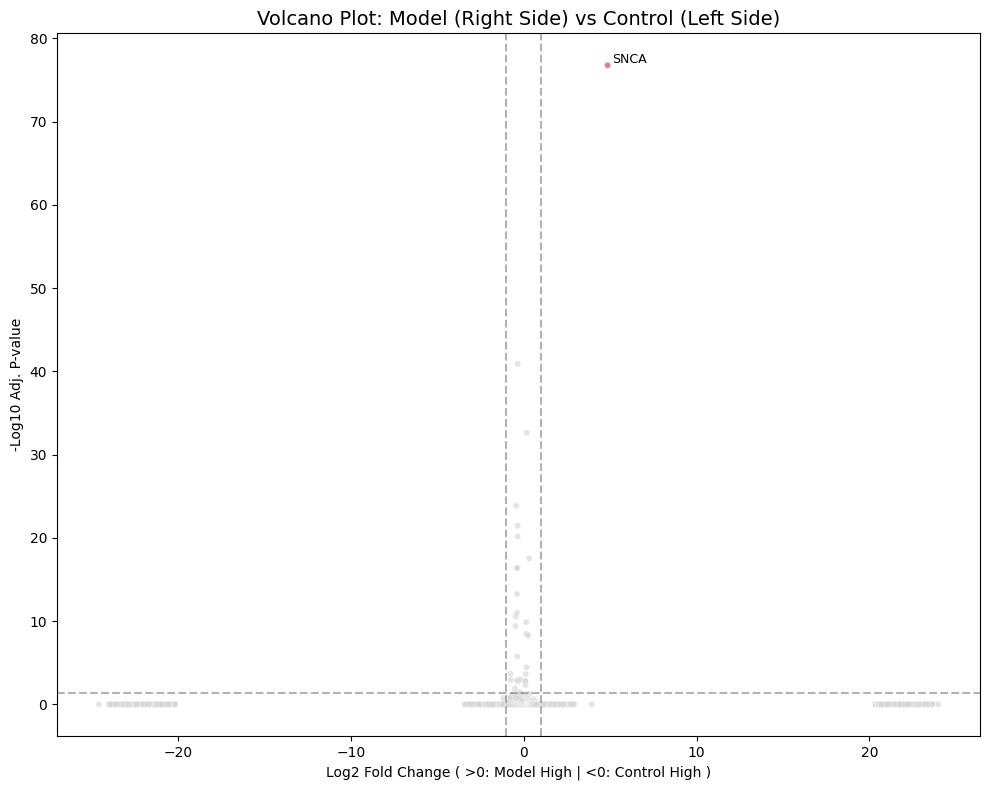

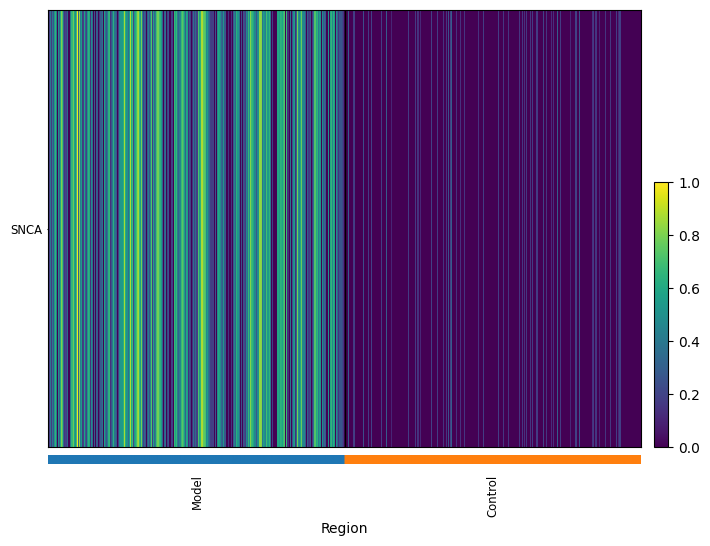

热图已保存: heatmap_ROI_Top_DEGs_Fixed.png
正在绘制气泡图 (备选)...


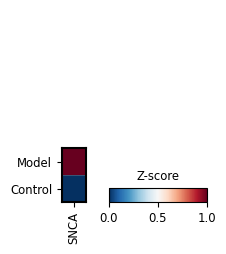

气泡图已保存: matrixplot_ROI_Top_DEGs_Matrix.png


In [ ]:
from config import ROI_LEFT_BOX, ROI_RIGHT_BOX
from utils import get_spatial_xy, get_roi_masks
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# === 1. 定义 ROI 并提取子集 ===
print("正在提取 ROI 数据...")
x, y = get_spatial_xy(adata)

# Model (Left)
mask_L, mask_R = get_roi_masks(x, y, ROI_LEFT_BOX, ROI_RIGHT_BOX)
# Control (Right)

# 在全量数据上标记 Region
adata.obs['Region'] = 'Background'
adata.obs.loc[mask_L, 'Region'] = 'Model'
adata.obs.loc[mask_R, 'Region'] = 'Control'

# 创建只包含这两个 ROI 的新对象 (避免全脑背景干扰)
roi_adata = adata[adata.obs['Region'].isin(['Model', 'Control'])].copy()

print(f"ROI 子集构建完成。Model Bins: {sum(mask_L)}, Control Bins: {sum(mask_R)}")

# === 2. 基因过滤 (核心步骤：去噪) ===
# 定义要剔除的基因模式
# 1. 线粒体 (mt-)
mt_genes = roi_adata.var_names.str.lower().str.startswith('mt-')
# 2. 核糖体 (Rps/Rpl) - 通常占据大量 Reads 但生物学意义较小
ribo_genes = roi_adata.var_names.str.lower().str.startswith(('rps', 'rpl'))
# 3. 血红蛋白 (Hb) - 血液污染
hb_genes = roi_adata.var_names.str.lower().str.startswith('hb')
# 4. 预测/假基因 (Gm, Rik)
gm_genes = roi_adata.var_names.str.startswith('Gm')
rik_genes = roi_adata.var_names.str.endswith('Rik')

# 5. 特定的高表达干扰 RNA (如 Malat1, Neat1, Xist)
# 这些基因通常在核内滞留，丰度极高，会压缩其他基因的差异
blacklist_genes = ['Malat1', 'Neat1', 'Xist', 'Kcnq1ot1']
specific_noise = roi_adata.var_names.isin(blacklist_genes)

# 合并所有要剔除的 Mask
genes_to_remove = mt_genes | ribo_genes | hb_genes | gm_genes | rik_genes | specific_noise

print(f"\n【基因过滤统计】")
print(f"剔除线粒体/核糖体/血红蛋白/Gm/Rik/干扰基因: 共 {sum(genes_to_remove)} 个")

# 执行剔除
roi_adata = roi_adata[:, ~genes_to_remove].copy()
print(f"剩余有效基因数量: {roi_adata.n_vars}")

# === 3. 数据标准化 (DEA 前必须做) ===
# 如果数据是 Raw Count，需要标准化。
# 简单的检查机制：如果最大值很大且是整数，说明是 Raw
if roi_adata.X.max() > 100:
    print("检测到原始计数，正在执行标准化 (CPM + Log1p)...")
    sc.pp.normalize_total(roi_adata, target_sum=1e4)
    sc.pp.log1p(roi_adata)
else:
    print("数据似乎已经标准化，跳过 Normalize 步骤。")

# === 4. 执行差异分析 (Wilcoxon Test) ===
print("\n正在计算差异基因 (Model vs Control)...")
# method='wilcoxon' 是最适合单细胞/空间数据的非参数检验
sc.tl.rank_genes_groups(roi_adata, groupby='Region', groups=['Model'], reference='Control', method='wilcoxon')

# === 5. 整理结果表 ===
result = sc.get.rank_genes_groups_df(roi_adata, group='Model')

# 过滤结果：只看 P值显著且有一定变化倍数的
# logfoldchanges > 0 代表在 Model 高表达
# logfoldchanges < 0 代表在 Control 高表达 (即在 Model 下调)
diff_genes = result[
    (result['pvals_adj'] < 0.05) & 
    (abs(result['logfoldchanges']) > 0.5) # Log2FC > 0.5 约等于 1.4倍差异
].copy()

print(f"\n找到显著差异基因 (FDR<0.05, |Log2FC|>0.5): {len(diff_genes)} 个")
print("Top 10 上调基因 (Model High / Inflammation?):")
print(diff_genes[diff_genes['logfoldchanges'] > 0].sort_values('logfoldchanges', ascending=False).head(10)['names'].tolist())
print("Top 10 下调基因 (Control High / Neuron Loss?):")
print(diff_genes[diff_genes['logfoldchanges'] < 0].sort_values('logfoldchanges', ascending=True).head(10)['names'].tolist())

# 保存 CSV
diff_genes.to_csv('ROI_Differential_Expression_Model_vs_Control.csv', index=False)

# === 6. 可视化：火山图 (Volcano Plot) ===
plt.style.use('default') # 恢复默认白底，方便看颜色
plt.figure(figsize=(10, 8))

# 准备数据
df_plot = result.copy()
df_plot['log10p'] = -np.log10(df_plot['pvals_adj'] + 1e-300) # 避免log(0)

# 设置颜色分类
df_plot['Color'] = 'Grey'
# Model High (Up)
df_plot.loc[(df_plot['logfoldchanges'] > 1) & (df_plot['pvals_adj'] < 0.05), 'Color'] = 'Red'
# Control High (Down)
df_plot.loc[(df_plot['logfoldchanges'] < -1) & (df_plot['pvals_adj'] < 0.05), 'Color'] = 'Blue'

# 绘图
sns.scatterplot(
    data=df_plot, x='logfoldchanges', y='log10p', 
    hue='Color', palette={'Red':'#d62728', 'Blue':'#1f77b4', 'Grey':'lightgrey'},
    alpha=0.6, s=20, legend=False
)

# 标注 Top 基因
top_up = df_plot[df_plot['Color']=='Red'].nlargest(8, 'logfoldchanges')
top_down = df_plot[df_plot['Color']=='Blue'].nsmallest(8, 'logfoldchanges')

# 使用 text 标注
import adjustText # 如果没有安装，可能需要用简单的 plt.text

texts = []
for i, row in pd.concat([top_up, top_down]).iterrows():
    texts.append(plt.text(row['logfoldchanges'], row['log10p'], row['names'], fontsize=9))

# 尽量避免文字重叠 (如果环境没有 adjustText，这行会报错，可以用 try-except)
try:
    from adjustText import adjust_text
    adjust_text(texts, arrowprops=dict(arrowstyle='-', color='black'))
except ImportError:
    print("提示: 未安装 adjustText，标签可能会重叠。建议 pip install adjustText")

plt.axvline(x=1, linestyle='--', color='black', alpha=0.3)
plt.axvline(x=-1, linestyle='--', color='black', alpha=0.3)
plt.axhline(y=-np.log10(0.05), linestyle='--', color='black', alpha=0.3)

plt.title('Volcano Plot: Model (Right Side) vs Control (Left Side)', fontsize=14)
plt.xlabel('Log2 Fold Change ( >0: Model High | <0: Control High )')
plt.ylabel('-Log10 Adj. P-value')

plt.tight_layout()
plt.savefig('ROI_DEG_Volcano_Plot.png', dpi=300)
print("\n火山图已保存: ROI_DEG_Volcano_Plot.png")

# === 7. 可视化：Top 差异基因热图 ===
# 提取 Top 5 Up 和 Top 5 Down
import scanpy as sc
import matplotlib.pyplot as plt
import pandas as pd

# === 1. 修复数据类型与顺序 ===
# 确保 Region 是分类变量，并指定顺序 (Model 在前还是 Control 在前由你决定)
# 这里设定：Model 在前，Control 在后
roi_adata.obs['Region'] = roi_adata.obs['Region'].astype('category')
roi_adata.obs['Region'] = roi_adata.obs['Region'].cat.set_categories(['Model', 'Control'])

# === 2. 准备 Top 基因列表 ===
# 确保 top_up 和 top_down 已经计算好 (沿用上一段代码的变量)
# 如果变量丢失，请确保先运行了 rank_genes_groups 的部分
top_genes = pd.concat([
    top_up.head(10),   # 取前 10 个上调
    top_down.head(10)  # 取前 10 个下调
])['names'].tolist()

# 去重 (防止同一个基因既上调又下调的极端情况)
top_genes = list(dict.fromkeys(top_genes))

# === 3. 绘制热图 (移除导致报错的 groups 参数) ===
print("正在绘制热图...")

sc.pl.heatmap(
    roi_adata, 
    var_names=top_genes, 
    groupby='Region', 
    # groups=['Model', 'Control'], <--- 删掉这行，已经不需要了
    cmap='viridis', 
    standard_scale='var',  # 0-1 标准化，让差异更明显
    show_gene_labels=True,
    figsize=(8, 6),        # 稍微调大一点
    dendrogram=False,      # 关闭聚类树，保持我们设定的 Model/Control 顺序
    swap_axes=True,        # 【可选】如果基因名字挤在一起，开启这个把基因放到Y轴
    save='_ROI_Top_DEGs_Fixed.png'
)

print("热图已保存: heatmap_ROI_Top_DEGs_Fixed.png")

# === 4. (备选方案) 气泡图 MatrixPlot ===
# 如果热图因为细胞太多看起来很糊，气泡图是更好的展示方式
print("正在绘制气泡图 (备选)...")
sc.pl.matrixplot(
    roi_adata, 
    var_names=top_genes, 
    groupby='Region', 
    cmap='RdBu_r', 
    standard_scale='var',
    colorbar_title='Z-score',
    save='_ROI_Top_DEGs_Matrix.png'
)
print("气泡图已保存: matrixplot_ROI_Top_DEGs_Matrix.png")


In [ ]:
import scanpy as sc
import pandas as pd

# === 1. 再次提取 ROI (确保数据纯净) ===
# 假设 roi_adata 还是之前的 (如果没了请重新运行上一段提取代码)
target_adata = roi_adata.copy()

# === 2. 关键过滤：只保留包含目标细胞的 Bin ===
# 既然是 PD 模型，我们只关心多巴胺神经元发生了什么
# 或者是小胶质细胞 Microglia NN_1
# 你可以根据需要把下面的列名换成 'Microglia NN_1'
target_cell = 'Total_SNc_Dopa_Merged' 

# 检查列是否存在，不存在尝试找一下
if target_cell not in target_adata.obs.columns:
    # 尝试找找 Dopa 相关的列
    dopa_cols = [c for c in target_adata.obs.columns if 'SNc' in c and 'Dopa' in c]
    if dopa_cols:
        target_adata.obs['Total_Dopa_Temp'] = target_adata.obs[dopa_cols].sum(axis=1)
        target_cell = 'Total_Dopa_Temp'
    else:
        print("警告：没找到多巴胺细胞列，将使用所有 Bin (效果可能不好)")
        target_cell = None

if target_cell:
    # 阈值设为 0 (只要有一点点信号就留着，或者设为 0.1)
    target_adata = target_adata[target_adata.obs[target_cell] > 0.05].copy()
    print(f"过滤背景后剩余 Bin: {target_adata.n_obs}")

# === 3. 放宽统计标准 ===
# method='t-test_overestim_var' 比 wilcoxon 更容易跑出结果
# 它是 t-test 但高估了方差，适合这种高噪音数据
sc.tl.rank_genes_groups(
    target_adata, 
    groupby='Region', 
    groups=['Model'], 
    reference='Control', 
    method='t-test_overestim_var' 
)

# === 4. 提取结果 (不过滤 P值，先看 Top) ===
result = sc.get.rank_genes_groups_df(target_adata, group='Model')

# 只要 LogFC > 0.3 我们就看看 (约等于 1.2 倍差异)
diff_genes = result[abs(result['logfoldchanges']) > 0.3].copy()
print(f"找到 {len(diff_genes)} 个潜在差异基因")

print("Top 上调 (Model High):")
print(diff_genes[diff_genes['logfoldchanges'] > 0].head(10)['names'].tolist())

print("Top 下调 (Control High / Loss):")
print(diff_genes[diff_genes['logfoldchanges'] < 0].head(10)['names'].tolist())

过滤背景后剩余 Bin: 681
找到 6815 个潜在差异基因
Top 上调 (Model High):
['SNCA', 'Zc3h7a', 'Dusp3', 'Acta2', 'Grin1os', 'Polr3gl', 'Hcn2', 'Cdr1', 'Rgp1', 'Sntb1']
Top 下调 (Control High / Loss):
['S100a8', 'Frmpd1os', 'Bpifb3', 'Mhrt', 'Fdx1l', 'Cdc6', 'AC091463.1', 'Acox2', 'AL603867.1', 'Skint10']


In [ ]:
from config import ROI_LEFT_BOX, ROI_RIGHT_BOX
from utils import get_spatial_xy, get_roi_masks
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# === 1. 锁定目标细胞类型 ===
target_cell = 'SNc-VTA-RAmb Foxa1 Dopa_3'

# 检查该列是否在 obs 中，不在则从 obsm 提取
if target_cell not in adata.obs.columns:
    print(f"正在从 obsm 提取 {target_cell}...")
    # 假设数据在 q05_cell_abundance_w_sf
    if isinstance(adata.obsm['q05_cell_abundance_w_sf'], pd.DataFrame):
        source_df = adata.obsm['q05_cell_abundance_w_sf']
    else:
        # 兼容处理
        cols = adata.uns.get('mod', {}).get('factor_names', 
               adata.uns.get('cell2location', {}).get('factor_names', []))
        source_df = pd.DataFrame(adata.obsm['q05_cell_abundance_w_sf'], 
                                 index=adata.obs_names, columns=cols)
    
    # 模糊匹配提取
    matches = [c for c in source_df.columns if target_cell in c]
    if matches:
        adata.obs[target_cell] = source_df[matches[0]].values
        print(f"提取成功: 使用列名 '{matches[0]}'")
    else:
        raise ValueError(f"未找到 {target_cell}，请检查名称！")

# === 2. 定义 ROI 和 分组 ===
# 严格按照您之前的坐标定义
x, y = get_spatial_xy(adata)

# Model (Left): 6000-7800
mask_L, mask_R = get_roi_masks(x, y, ROI_LEFT_BOX, ROI_RIGHT_BOX)
# Control (Right): 12200-14000

# 标记 Region
adata.obs['Region'] = 'Background'
adata.obs.loc[mask_L, 'Region'] = 'Model'
adata.obs.loc[mask_R, 'Region'] = 'Control'

# === 3. 核心过滤：只取 Dopa_3 > 0 的 Bin ===
# 使用极小值 1e-6 以包含所有预测值非零的 Bin
cell_mask = adata.obs[target_cell] > 1e-6

# 组合条件：(在ROI内) AND (含有目标细胞)
subset_mask = (adata.obs['Region'].isin(['Model', 'Control'])) & cell_mask

# 创建分析子集
target_adata = adata[subset_mask].copy()

print(f"\n【样本筛选结果】")
print(f"筛选标准: {target_cell} > 0")
print(f"Model 侧符合条件的 Bin 数: {sum(target_adata.obs['Region'] == 'Model')}")
print(f"Control 侧符合条件的 Bin 数: {sum(target_adata.obs['Region'] == 'Control')}")

if target_adata.n_obs < 10:
    print("警告：符合条件的 Bin 太少，统计结果可能不可靠！")

# === 4. 基因清洗 (去噪) ===
# 剔除线粒体、核糖体、血红蛋白等干扰
genes_to_remove = (
    target_adata.var_names.str.lower().str.startswith('mt-') | 
    target_adata.var_names.str.lower().str.startswith(('rps', 'rpl')) |
    target_adata.var_names.str.lower().str.startswith('hb') | 
    target_adata.var_names.isin(['Malat1', 'Neat1', 'Xist'])
)
target_adata = target_adata[:, ~genes_to_remove].copy()

# 标准化 (LogCPM)
if target_adata.X.max() > 50:
    sc.pp.normalize_total(target_adata, target_sum=1e4)
    sc.pp.log1p(target_adata)

# === 5. 差异分析 (DEA) ===
# 针对稀疏数据，推荐使用 t-test_overestim_var
print("\n正在计算差异基因...")
sc.tl.rank_genes_groups(
    target_adata, 
    groupby='Region', 
    groups=['Model'], 
    reference='Control', 
    method='t-test_overestim_var'
)

# === 6. 结果输出与筛选 ===
result = sc.get.rank_genes_groups_df(target_adata, group='Model')

# 筛选条件：P值 < 0.05 且 LogFC 绝对值 > 0.5 (约1.4倍)
# 针对难出结果的数据，可以适当放宽到 logfoldchanges > 0.3
diff_genes = result[
    (result['pvals_adj'] < 0.05) & 
    (abs(result['logfoldchanges']) > 0.5)
].copy()

print(f"\n显著差异基因数量: {len(diff_genes)}")

# 分别提取上调和下调 Top 10
top_up = diff_genes[diff_genes['logfoldchanges'] > 0].sort_values('logfoldchanges', ascending=False).head(10)
top_down = diff_genes[diff_genes['logfoldchanges'] < 0].sort_values('logfoldchanges', ascending=True).head(10)

print("\n【Top 10 上调 (Model High / 炎症或代偿)】")
print(top_up[['names', 'logfoldchanges', 'pvals_adj']])

print("\n【Top 10 下调 (Control High / 损伤丢失)】")
print(top_down[['names', 'logfoldchanges', 'pvals_adj']])

# === 7. 绘图：小提琴图验证 Top 基因 ===
# 这是最诚实的图，能看到到底是不是真的有差异
top_genes_list = top_up['names'].tolist() + top_down['names'].tolist()

if top_genes_list:
    plt.style.use('dark_background')
    sc.pl.violin(
        target_adata, 
        keys=top_genes_list[:8], # 只画前8个防止太挤
        groupby='Region', 
        rotation=90,
        stripplot=False, # 关掉散点让图更干净
        show=False,
        save='_Dopa3_Specific_DEGs.png'
    )
    print("\n验证图已保存: violin_Dopa3_Specific_DEGs.png")
    
    # 保存列表
    diff_genes.to_csv('Dopa3_Specific_DEGs.csv', index=False)
else:
    print("\n没有找到显著差异基因，尝试放宽 P 值限制或使用 Pseudo-bulk 方法。")


正在从 obsm 提取 SNc-VTA-RAmb Foxa1 Dopa_3...
提取成功: 使用列名 'q05_cell_abundance_w_sf_0882 SNc-VTA-RAmb Foxa1 Dopa_3'

【样本筛选结果】
筛选标准: SNc-VTA-RAmb Foxa1 Dopa_3 > 0
Model 侧符合条件的 Bin 数: 361
Control 侧符合条件的 Bin 数: 361

正在计算差异基因...

显著差异基因数量: 10

【Top 10 上调 (Model High / 炎症或代偿)】
  names  logfoldchanges  pvals_adj
0  SNCA            4.83       0.00

【Top 10 下调 (Control High / 损伤丢失)】
         names  logfoldchanges  pvals_adj
27533   Ppp4r4           -1.18       0.00
27525    Nr4a2           -0.82       0.03
27526    Cul4b           -0.82       0.02
27528       Th           -0.79       0.01
27524  Slc10a4           -0.76       0.03
27535      Ddc           -0.76       0.00
27531   Slc6a3           -0.74       0.00
27537  Gm49337           -0.73       0.00
27521     Tha1           -0.62       0.03

验证图已保存: violin_Dopa3_Specific_DEGs.png


In [ ]:
from config import ROI_LEFT_BOX, ROI_RIGHT_BOX
from utils import get_spatial_xy, get_roi_masks
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

# 忽略一些无关痛痒的警告
warnings.filterwarnings("ignore")

# === 1. 定义目标细胞列表 ===
target_cells = [
    'BAM NN_1', 
    'T cells NN_4', 
    'Microglia NN_1', 
    'NK cells NN_3', 
    'B cells NN_1', 
    'DC NN_1'
]

# === 2. 准备 ROI 标记 ===
# 再次确保 Region 列正确 (沿用之前的坐标)
x, y = get_spatial_xy(adata)
mask_L, mask_R = get_roi_masks(x, y, ROI_LEFT_BOX, ROI_RIGHT_BOX)

adata.obs['Region'] = 'Background'
adata.obs.loc[mask_L, 'Region'] = 'Model'
adata.obs.loc[mask_R, 'Region'] = 'Control'

# === 3. 定义分析函数 ===
def analyze_cell_type(cell_name, original_adata):
    print(f"\n{'='*20} 正在分析: {cell_name} {'='*20}")
    
    # --- A. 数据提取与同步 ---
    # 检查 obs 里有没有，没有去 obsm 拿
    if cell_name not in original_adata.obs.columns:
        # 尝试模糊匹配
        if isinstance(original_adata.obsm['q05_cell_abundance_w_sf'], pd.DataFrame):
            src_df = original_adata.obsm['q05_cell_abundance_w_sf']
        else:
            cols = original_adata.uns.get('mod', {}).get('factor_names', [])
            src_df = pd.DataFrame(original_adata.obsm['q05_cell_abundance_w_sf'], 
                                  index=original_adata.obs_names, columns=cols)
        
        matches = [c for c in src_df.columns if cell_name in c]
        if matches:
            original_adata.obs[cell_name] = src_df[matches[0]].values
        else:
            print(f"  [跳过] 未找到细胞数据: {cell_name}")
            return

    # --- B. 提取子集 (ROI + 细胞丰度 > 0) ---
    # 使用极低阈值保留所有信号
    subset_mask = (
        original_adata.obs['Region'].isin(['Model', 'Control'])
    ) & (original_adata.obs[cell_name] > 1e-6)
    
    target_adata = original_adata[subset_mask].copy()
    
    # 检查样本量
    n_model = sum(target_adata.obs['Region'] == 'Model')
    n_control = sum(target_adata.obs['Region'] == 'Control')
    print(f"  样本量: Model={n_model}, Control={n_control}")
    
    if n_model < 3 or n_control < 3:
        print(f"  [警告] {cell_name} 在某一组的 Bin 数量太少 (<3)，无法进行统计检验。")
        return

    # --- C. 基因过滤 (去噪) ---
    # 去除线粒体、核糖体、血红蛋白
    genes_drop = (
        target_adata.var_names.str.lower().str.startswith(('mt-', 'rps', 'rpl', 'hb')) |
        target_adata.var_names.isin(['Malat1', 'Neat1', 'Xist'])
    )
    target_adata = target_adata[:, ~genes_drop].copy()
    
    # 标准化
    if target_adata.X.max() > 50:
        sc.pp.normalize_total(target_adata, target_sum=1e4)
        sc.pp.log1p(target_adata)

    # --- D. 差异分析 (Wilcoxon) ---
    try:
        sc.tl.rank_genes_groups(
            target_adata, 
            groupby='Region', 
            groups=['Model'], 
            reference='Control', 
            method='wilcoxon'
        )
    except Exception as e:
        print(f"  [错误] 计算差异时出错: {e}")
        return

    # --- E. 结果整理 ---
    res = sc.get.rank_genes_groups_df(target_adata, group='Model')
    # 筛选 LogFC > 0.5 (上调) 或 < -0.5 (下调), P < 0.05
    sig_genes = res[(res['pvals_adj'] < 0.05) & (abs(res['logfoldchanges']) > 0.5)].copy()
    
    # 保存 CSV
    csv_name = f'DEG_{cell_name.replace(" ", "_")}.csv'
    sig_genes.to_csv(csv_name, index=False)
    print(f"  显著差异基因: {len(sig_genes)} 个 (已保存至 {csv_name})")
    
    if len(sig_genes) == 0:
        print("  无显著差异基因，跳过绘图。")
        return

    # --- F. 可视化 1: 火山图 (Volcano Plot) ---
    plt.style.use('default')
    plt.figure(figsize=(6, 5))
    
    res['log10p'] = -np.log10(res['pvals_adj'] + 1e-300)
    res['Color'] = 'Grey'
    res.loc[(res['logfoldchanges'] > 0.5) & (res['pvals_adj'] < 0.05), 'Color'] = 'Red'
    res.loc[(res['logfoldchanges'] < -0.5) & (res['pvals_adj'] < 0.05), 'Color'] = 'Blue'
    
    sns.scatterplot(data=res, x='logfoldchanges', y='log10p', hue='Color', 
                    palette={'Red':'#d62728', 'Blue':'#1f77b4', 'Grey':'lightgrey'}, 
                    legend=False, s=15, alpha=0.6)
    
    # 标注 Top 5 Up / Down
    top_up = res[res['Color']=='Red'].nlargest(5, 'logfoldchanges')
    top_down = res[res['Color']=='Blue'].nsmallest(5, 'logfoldchanges')
    
    texts = []
    for _, row in pd.concat([top_up, top_down]).iterrows():
        texts.append(plt.text(row['logfoldchanges'], row['log10p'], row['names'], fontsize=8))
    
    try:
        from adjustText import adjust_text
        adjust_text(texts, arrowprops=dict(arrowstyle='-', color='black', lw=0.5))
    except:
        pass
        
    plt.title(f'{cell_name}: Model vs Control')
    plt.xlabel('Log2 Fold Change')
    plt.ylabel('-Log10 Adj. P-value')
    plt.tight_layout()
    plt.savefig(f'Volcano_{cell_name.replace(" ", "_")}.png', dpi=300)
    plt.close()

    # --- G. 可视化 2: 气泡图 (Dot Plot) ---
    # 展示 Top 10 基因
    top_genes = pd.concat([top_up, top_down])['names'].tolist()
    
    if top_genes:
        plt.style.use('dark_background')
        dp = sc.pl.dotplot(
            target_adata, 
            var_names=top_genes, 
            groupby='Region', 
            categories_order=['Model', 'Control'],
            standard_scale='var',
            title=f'Top DEGs in {cell_name}',
            show=False
        )
        # 获取 plot 对象并保存
        dp['mainplot_ax'].figure.savefig(f'Dotplot_{cell_name.replace(" ", "_")}.png', dpi=300, bbox_inches='tight')
        plt.close()
        print(f"  绘图完成: Volcano & Dotplot")

# === 4. 执行循环 ===
for cell in target_cells:
    analyze_cell_type(cell, adata)
    
print("\n所有细胞类型分析完成！")



==================== 正在分析: BAM NN_1 ====================
  样本量: Model=361, Control=361
  显著差异基因: 4 个 (已保存至 DEG_BAM_NN_1.csv)
  绘图完成: Volcano & Dotplot

==================== 正在分析: T cells NN_4 ====================
  样本量: Model=361, Control=361
  显著差异基因: 4 个 (已保存至 DEG_T_cells_NN_4.csv)
  绘图完成: Volcano & Dotplot

==================== 正在分析: Microglia NN_1 ====================
  样本量: Model=361, Control=361
  显著差异基因: 4 个 (已保存至 DEG_Microglia_NN_1.csv)
  绘图完成: Volcano & Dotplot

==================== 正在分析: NK cells NN_3 ====================
  样本量: Model=361, Control=361
  显著差异基因: 4 个 (已保存至 DEG_NK_cells_NN_3.csv)
  绘图完成: Volcano & Dotplot

==================== 正在分析: B cells NN_1 ====================
  样本量: Model=361, Control=361
  显著差异基因: 4 个 (已保存至 DEG_B_cells_NN_1.csv)
  绘图完成: Volcano & Dotplot

==================== 正在分析: DC NN_1 ====================
  样本量: Model=361, Control=361
  显著差异基因: 4 个 (已保存至 DEG_DC_NN_1.csv)
  绘图完成: Volcano & Dotplot

所有细胞类型分析完成！


分析样本量: Model=361, Control=361

显著下调基因数量: 3
Top 5 下调基因: ['Ddc', 'Slc6a3', 'Gm49337']
图表已保存: Dopa3_Downregulated_Dotplot.png


<Figure size 1000x600 with 0 Axes>

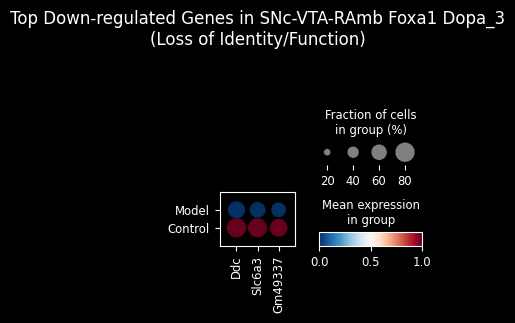

In [ ]:
from config import ROI_LEFT_BOX, ROI_RIGHT_BOX
from utils import get_spatial_xy, get_roi_masks
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


# === 1. 数据准备：锁定 Dopa_3 与 ROI ===
target_cell = 'SNc-VTA-RAmb Foxa1 Dopa_3'

# 确保数据列存在
if target_cell not in adata.obs.columns:
    # 尝试从 obsm 提取
    if isinstance(adata.obsm['q05_cell_abundance_w_sf'], pd.DataFrame):
        src = adata.obsm['q05_cell_abundance_w_sf']
    else:
        cols = adata.uns.get('mod', {}).get('factor_names', [])
        src = pd.DataFrame(adata.obsm['q05_cell_abundance_w_sf'], columns=cols, index=adata.obs_names)
    
    matches = [c for c in src.columns if target_cell in c]
    if matches: adata.obs[target_cell] = src[matches[0]].values

# 定义 ROI Mask (Model: Left, Control: Right)
x, y = get_spatial_xy(adata)
mask_L, mask_R = get_roi_masks(x, y, ROI_LEFT_BOX, ROI_RIGHT_BOX)

adata.obs['Region'] = 'Background'
adata.obs.loc[mask_L, 'Region'] = 'Model'
adata.obs.loc[mask_R, 'Region'] = 'Control'

# 核心过滤：只取 ROI 内且 Dopa_3 > 0 的 Bin
subset_mask = (adata.obs['Region'].isin(['Model', 'Control'])) & (adata.obs[target_cell] > 1e-6)
dopa_adata = adata[subset_mask].copy()

print(f"分析样本量: Model={sum(dopa_adata.obs['Region']=='Model')}, Control={sum(dopa_adata.obs['Region']=='Control')}")

# === 2. 差异分析 (关注下调) ===
# 基因过滤
genes_drop = (
    dopa_adata.var_names.str.lower().str.startswith(('mt-', 'rps', 'rpl', 'hb')) |
    dopa_adata.var_names.isin(['Malat1', 'Neat1', 'Xist'])
)
dopa_adata = dopa_adata[:, ~genes_drop].copy()

# 标准化
if dopa_adata.X.max() > 50:
    sc.pp.normalize_total(dopa_adata, target_sum=1e4)
    sc.pp.log1p(dopa_adata)

# 计算差异 (Model vs Control)
sc.tl.rank_genes_groups(dopa_adata, groupby='Region', groups=['Model'], reference='Control', method='wilcoxon')
res = sc.get.rank_genes_groups_df(dopa_adata, group='Model')

# === 3. 筛选下调基因 (Down-regulated) ===
# LogFC < -0.5 (即 Model 比 Control 低) 且 P < 0.05
down_genes_df = res[
    (res['pvals_adj'] < 0.05) & 
    (res['logfoldchanges'] < -0.5)
].sort_values('logfoldchanges', ascending=True) # 跌得最惨的排前面

print(f"\n显著下调基因数量: {len(down_genes_df)}")
top_down_genes = down_genes_df['names'].head(15).tolist() # 取前15个
print(f"Top 5 下调基因: {top_down_genes[:5]}")

# === 4. 可视化 Part 1: 下调基因点图 (Dot Plot) ===
plt.style.use('dark_background')
plt.figure(figsize=(10, 6))

# 使用 Scanpy 的 dotplot
dp = sc.pl.dotplot(
    dopa_adata, 
    var_names=top_down_genes, 
    groupby='Region', 
    categories_order=['Model', 'Control'], # 显式指定顺序
    standard_scale='var', 
    title=f'Top Down-regulated Genes in {target_cell}\n(Loss of Identity/Function)',
    show=False,
    cmap='RdBu_r' # 蓝色低，红色高。Control 应该是红的，Model 是蓝的
)
# 保存
dp['mainplot_ax'].figure.savefig('Dopa3_Downregulated_Dotplot.png', dpi=300, bbox_inches='tight')
print("图表已保存: Dopa3_Downregulated_Dotplot.png")


【样本量检查】
Group A (SNCA > 90) Bin数量: 16
Group B (Control Dopa3+) Bin数量: 7500

纳入分析的细胞类型: 8 种

图表已保存: Composition_SNCA90_vs_Dopa3.png

【微环境置换分析 (Proportion Change)】
--------------------------------------------------------------------------------
Cell Type                           | Healthy (%)  | High SNCA (%) | Change
--------------------------------------------------------------------------------
q05_cell_abundance_w_sf_1184 MOL NN | 84.5%       | 43.3%       | ↓ Victim
q05_cell_abundance_w_sf_1159 Astro- | 10.8%       | 2.9%       | ↓ Victim
Microglia NN_1                      | 1.8%       | 0.3%       | ↓ Victim
SNc-VTA-RAmb Foxa1 Dopa_3           | 1.1%       | 53.2%       | ↑ Replacer
BAM NN_1                            | 1.0%       | 0.1%       | ↓ Victim
T cells NN_4                        | 0.4%       | 0.1%       | ↓ Victim
q05_cell_abundance_w_sf_1179 OPC NN | 0.4%       | 0.1%       | ↓ Victim
q05_cell_abundance_w_sf_0880 SNc-VT | 0.1%       | 0.0%       | ↓ Victim


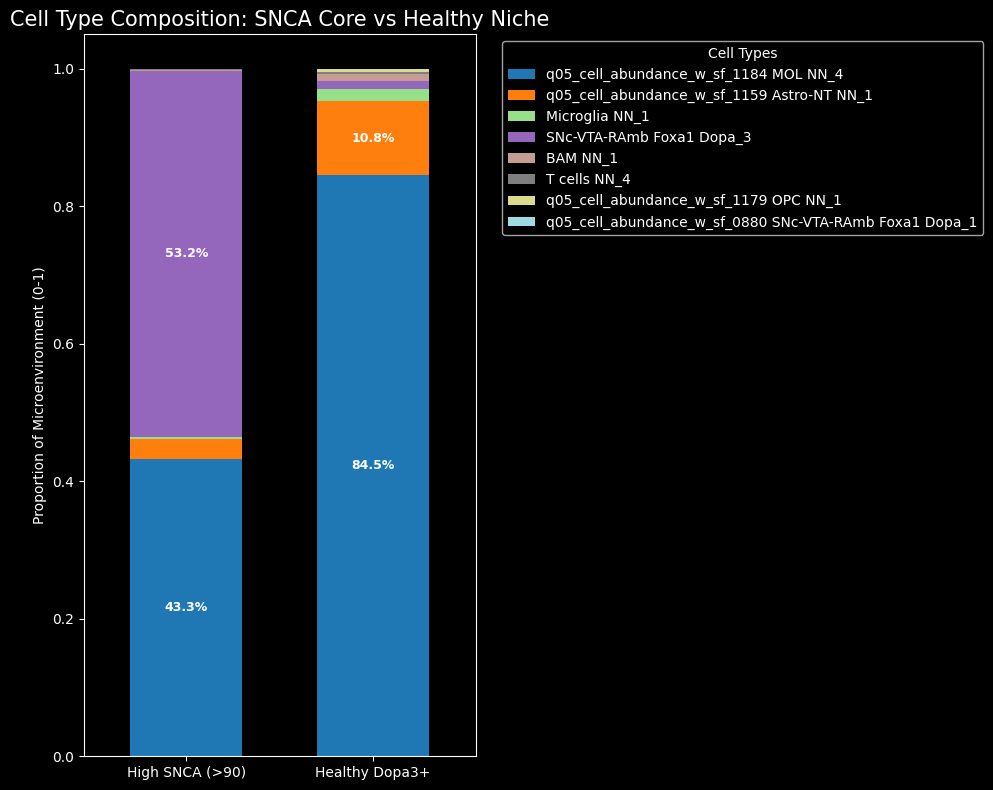

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns

# === 1. 定义两组 Mask (筛选器) ===
# A. 病灶核心 (High SNCA Load)
# 注意：SNCA > 90 是一个很高的阈值，确保您的 expr_SNCA 是 raw counts
# 如果筛选不到，代码会自动提示降低阈值
mask_high_snca = adata.obs['expr_SNCA'] > 90

# B. 健康参照 (Control Side & Dopa_3 Positive)
x_coords = adata.obsm['spatial'][:, 0]
# Control 侧 (x > 12200) 且 Dopa_3 > 0
target_dopa = 'SNc-VTA-RAmb Foxa1 Dopa_3'
mask_healthy_niche = (x_coords > 12200) & (adata.obs[target_dopa] > 1e-6)

# 检查 Bin 数量
n_snca = mask_high_snca.sum()
n_healthy = mask_healthy_niche.sum()

print(f"【样本量检查】")
print(f"Group A (SNCA > 90) Bin数量: {n_snca}")
print(f"Group B (Control Dopa3+) Bin数量: {n_healthy}")

if n_snca < 10:
    print("警告: SNCA > 90 的点太少，尝试降低阈值到 > 50...")
    mask_high_snca = adata.obs['expr_SNCA'] > 50
    n_snca = mask_high_snca.sum()
    print(f"修正后 Group A Bin数量: {n_snca}")

# === 2. 定义要对比的细胞类型 ===
# 我们选取关键的 Dopa 亚型 + 免疫细胞 + 胶质细胞
cell_types = [
    # 目标神经元
    'SNc-VTA-RAmb Foxa1 Dopa_3', 
    'SNc-VTA-RAmb Foxa1 Dopa_1', # 对比一下其他亚型
    'Total_SNc_Dopa_Merged',     # 总 Dopa (如果之前算过)
    # 免疫细胞
    'Microglia NN_1', 'T cells NN_4', 'BAM NN_1',
    # 胶质细胞 (背景/瘢痕)
    'Astro-NT NN_1', 'MOL NN_4', 'OPC NN_1' 
]

# 自动清洗列表：只保留 adata.obs 中存在的列
valid_cells = []
for c in cell_types:
    # 尝试找精确匹配
    if c in adata.obs.columns:
        valid_cells.append(c)
    else:
        # 尝试模糊匹配
        matches = [col for col in adata.obs.columns if c.split(' ')[0] in col]
        if matches:
            valid_cells.append(matches[0])

print(f"\n纳入分析的细胞类型: {len(valid_cells)} 种")

# === 3. 计算组成比例 (Composition Analysis) ===
# 提取数据
df_snca = adata.obs.loc[mask_high_snca, valid_cells]
df_healthy = adata.obs.loc[mask_healthy_niche, valid_cells]

# 计算总丰度 (Sum of abundance)
sum_snca = df_snca.sum(axis=0)
sum_healthy = df_healthy.sum(axis=0)

# 归一化为比例 (Proportion)
# 即：在该环境下，各种细胞占了“被选中的细胞总量”的百分之多少
prop_snca = sum_snca / sum_snca.sum()
prop_healthy = sum_healthy / sum_healthy.sum()

# 合并为绘图表
plot_df = pd.DataFrame({
    'High SNCA (>90)': prop_snca,
    'Healthy Dopa3+': prop_healthy
}).T # 转置，行是Group，列是细胞类型

# 排序：按 Healthy 组的比例大小排序，方便看哪些细胞消失了
plot_df = plot_df.sort_values(by='Healthy Dopa3+', axis=1, ascending=False)

# === 4. 可视化：百分比堆叠柱状图 ===
plt.style.use('dark_background')
fig, ax = plt.subplots(figsize=(10, 8))

# 绘制堆叠图
# colormap 建议用 'tab20' 以区分多种细胞
plot_df.plot(kind='bar', stacked=True, colormap='tab20', ax=ax, width=0.6)

ax.set_title('Cell Type Composition: SNCA Core vs Healthy Niche', fontsize=15)
ax.set_ylabel('Proportion of Microenvironment (0-1)')
ax.set_xlabel('')
plt.xticks(rotation=0)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Cell Types')

# 添加数值标注 (只标注比例 > 5% 的，防止太挤)
for n, x in enumerate([0, 1]): # 0=High SNCA, 1=Healthy
    y_pos = 0
    col_series = plot_df.iloc[n]
    for i, (cell, val) in enumerate(col_series.items()):
        if val > 0.05: # 阈值 5%
            ax.text(x, y_pos + val/2, f"{val:.1%}", ha='center', va='center', fontsize=9, color='white', fontweight='bold')
        y_pos += val

plt.tight_layout()
plt.savefig('Composition_SNCA90_vs_Dopa3.png', dpi=300, bbox_inches='tight')
print("\n图表已保存: Composition_SNCA90_vs_Dopa3.png")

# === 5. 输出关键数字结论 ===
print("\n" + "="*80)
print("【微环境置换分析 (Proportion Change)】")
print("-" * 80)
print(f"{'Cell Type':<35} | {'Healthy (%)':<12} | {'High SNCA (%)':<12} | {'Change'}")
print("-" * 80)

for cell in plot_df.columns:
    p_healthy = plot_df.loc['Healthy Dopa3+', cell]
    p_snca = plot_df.loc['High SNCA (>90)', cell]
    diff = p_snca - p_healthy
    trend = "↑ Replacer" if diff > 0 else "↓ Victim"
    
    print(f"{cell[:35]:<35} | {p_healthy:.1%}       | {p_snca:.1%}       | {trend}")
print("="*80)

【样本量统计】
Model 侧幸存 Dopa3+ Bin 数: 361
Control 侧健康 Dopa3+ Bin 数: 361

图表已保存: Dopa3_Niche_Comparison.png

【Dopa_3 阳性 Bin 微环境差异分析】
--------------------------------------------------------------------------------
Cell Type                           | Control Mean | Model Mean   | Fold Change
--------------------------------------------------------------------------------
SNc-VTA-RAmb Foxa1 Dopa_3           | 1.9801       | 1.3161       | 0.66 (Unchanged)
Microglia NN_1                      | 0.2273       | 0.2152       | 0.95 (Unchanged)
T cells NN_4                        | 0.0511       | 0.0504       | 0.99 (Unchanged)
BAM NN_1                            | 0.0556       | 0.0656       | 1.18 (Unchanged)
NK cells NN_3                       | 0.0437       | 0.0443       | 1.01 (Unchanged)
q05_cell_abundance_w_sf_1159 Astro- | 1.5469       | 1.6129       | 1.04 (Unchanged)
q05_cell_abundance_w_sf_1184 MOL NN | 19.3131       | 19.6914       | 1.02 (Unchanged)
q05_cell_abundance_w_sf_1179 OPC NN

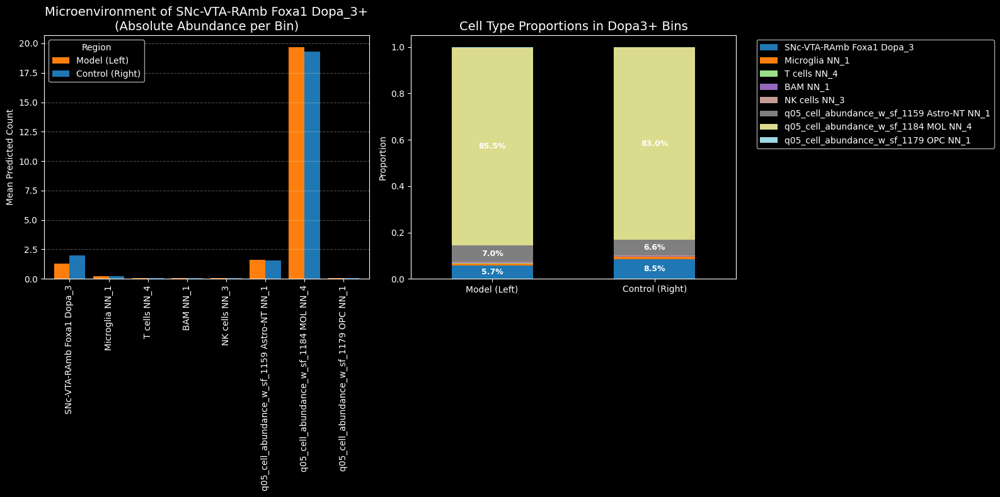

In [ ]:
from config import ROI_LEFT_BOX, ROI_RIGHT_BOX
from utils import get_spatial_xy, get_roi_masks
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns

# === 1. 准备数据与 ROI ===
# 目标神经元
target_dopa = 'SNc-VTA-RAmb Foxa1 Dopa_3'

# 确保列存在
if target_dopa not in adata.obs.columns:
    # 尝试从 obsm 恢复 (防御性代码)
    try:
        col_names = adata.uns.get('mod', {}).get('factor_names', [])
        temp_df = pd.DataFrame(adata.obsm['q05_cell_abundance_w_sf'], columns=col_names, index=adata.obs_names)
        matches = [c for c in temp_df.columns if target_dopa in c]
        if matches: adata.obs[target_dopa] = temp_df[matches[0]]
    except:
        pass

# 定义 ROI 坐标 (Left=Model, Right=Control)
x, y = get_spatial_xy(adata)
# Model ROI
mask_L_geo = (x >= 6000) & (x <= 7800) & (y >= 11400) & (y <= 13200)
# Control ROI
mask_R_geo = (x >= 12200) & (x <= 14000) & (y >= 11400) & (y <= 13200)

# === 2. 核心筛选：只取 ROI 内且 Dopa_3 > 0 的 Bin ===
# Model 侧的幸存者
mask_model_survivors = mask_L_geo & (adata.obs[target_dopa] > 1e-6)
# Control 侧的健康者
mask_control_healthy = mask_R_geo & (adata.obs[target_dopa] > 1e-6)

print(f"【样本量统计】")
print(f"Model 侧幸存 Dopa3+ Bin 数: {mask_model_survivors.sum()}")
print(f"Control 侧健康 Dopa3+ Bin 数: {mask_control_healthy.sum()}")

if mask_model_survivors.sum() < 5:
    print("警告：Model 侧幸存的 Dopa3 Bin 太少，对比可能无统计学意义！")

# === 3. 定义要分析的“邻居”细胞 ===
# 我们想看这些神经元周围有些什么
neighbor_types = [
    # 自身 (看丰度是否变薄)
    target_dopa,
    # 免疫细胞 (看炎症)
    'Microglia NN_1', 'T cells NN_4', 'BAM NN_1', 'NK cells NN_3',
    # 胶质细胞 (看支撑/瘢痕)
    'Astro-NT NN_1', 'MOL NN_4', 'OPC NN_1'
]

# 自动清洗列名
valid_neighbors = []
for cell in neighbor_types:
    # 检查精确或模糊匹配
    found = False
    if cell in adata.obs.columns:
        valid_neighbors.append(cell)
        found = True
    else:
        matches = [c for c in adata.obs.columns if cell.split(' ')[0] in c]
        if matches:
            valid_neighbors.append(matches[0])
            found = True
    if not found:
        print(f"提示: 未找到 {cell}，已跳过")

# === 4. 计算微环境组成 (Composition) ===
# 提取数据
df_model = adata.obs.loc[mask_model_survivors, valid_neighbors]
df_control = adata.obs.loc[mask_control_healthy, valid_neighbors]

# 计算平均每个 Bin 的丰度 (Mean Abundance per Bin)
# 这样可以消除 Bin 数量不同带来的影响
mean_model = df_model.mean(axis=0)
mean_control = df_control.mean(axis=0)

# 合并数据
comp_df = pd.DataFrame({
    'Model (Left)': mean_model,
    'Control (Right)': mean_control
})

# 为了绘图清晰，计算“非 Dopa3”细胞的相对比例
# 或者直接画绝对值对比（推荐绝对值，因为 Dopa3 在 Model 侧可能本身就少了）
# 这里我们做两个图：一个是绝对值对比，一个是比例

# === 5. 可视化 ===
plt.style.use('dark_background')
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# --- 图 A: 绝对丰度对比 (Mean Abundance) ---
# 这能回答：幸存的 Bin 里，T 细胞是不是变多了？
comp_df.plot(kind='bar', ax=axes[0], color=['#ff7f0e', '#1f77b4'], width=0.8)
axes[0].set_title(f'Microenvironment of {target_dopa}+\n(Absolute Abundance per Bin)', fontsize=14)
axes[0].set_ylabel('Mean Predicted Count')
axes[0].grid(axis='y', linestyle='--', alpha=0.3)
axes[0].legend(title='Region')

# --- 图 B: 相对比例堆叠图 (Composition) ---
# 这能回答：在这个微环境里，谁占主导？
# 转置以便堆叠
comp_df_T = comp_df.T
# 归一化为 100%
comp_prop = comp_df_T.div(comp_df_T.sum(axis=1), axis=0)

comp_prop.plot(kind='bar', stacked=True, ax=axes[1], colormap='tab20')
axes[1].set_title('Cell Type Proportions in Dopa3+ Bins', fontsize=14)
axes[1].set_ylabel('Proportion')
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=0)
axes[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# 添加数值标注
for n, x in enumerate([0, 1]):
    y_pos = 0
    vals = comp_prop.iloc[n]
    for i, (cell, val) in enumerate(vals.items()):
        if val > 0.05: # 只标 >5% 的
            axes[1].text(x, y_pos + val/2, f"{val:.1%}", ha='center', va='center', fontsize=9, color='white', fontweight='bold')
        y_pos += val

plt.tight_layout()
plt.savefig('Dopa3_Niche_Comparison.png', dpi=300, bbox_inches='tight')
print("\n图表已保存: Dopa3_Niche_Comparison.png")

# === 6. 输出关键变化表 ===
print("\n" + "="*80)
print(f"【Dopa_3 阳性 Bin 微环境差异分析】")
print("-" * 80)
print(f"{'Cell Type':<35} | {'Control Mean':<12} | {'Model Mean':<12} | {'Fold Change'}")
print("-" * 80)

for cell in comp_df.index:
    v_ctrl = comp_df.loc[cell, 'Control (Right)']
    v_model = comp_df.loc[cell, 'Model (Left)']
    
    # 计算 FC
    if v_ctrl > 0:
        fc = v_model / v_ctrl
    else:
        fc = v_model / 1e-9 # 避免除以0
        
    trend = "Unchanged"
    if fc > 1.5: trend = "↑ Infiltrated"
    if fc < 0.6: trend = "↓ Lost"
    
    print(f"{cell[:35]:<35} | {v_ctrl:.4f}       | {v_model:.4f}       | {fc:.2f} ({trend})")
print("="*80)


Model 侧幸存 Bin 数: 361
Control 侧健康 Bin 数: 361
纳入分析的背景细胞类型: 32 种

图表已保存: Dopa3_Niche_Filtered_Analysis.png

【微环境主要成分变化 (Fold Change)】
Cell Type                                | Control    | Model      | FC
--------------------------------------------------------------------------------
q05_cell_abundance_w_sf_1159 Astro-NT NN | 1.5469     | 1.6129     | 1.04 -
q05_cell_abundance_w_sf_1160 Astro-NT NN | 0.9731     | 0.9730     | 1.00 -
q05_cell_abundance_w_sf_1158 Astro-CB NN | 0.7026     | 0.7111     | 1.01 -
q05_cell_abundance_w_sf_1161 Astro-TE NN | 0.5725     | 0.6112     | 1.07 -
q05_cell_abundance_w_sf_1164 Astro-TE NN | 0.3629     | 0.3723     | 1.03 -
q05_cell_abundance_w_sf_1166 Astro-OLF N | 0.3313     | 0.3486     | 1.05 -
q05_cell_abundance_w_sf_1163 Astro-TE NN | 0.2890     | 0.3259     | 1.13 -
Microglia NN_1                           | 0.2273     | 0.2152     | 0.95 -
q05_cell_abundance_w_sf_1194 Microglia N | 0.2273     | 0.2152     | 0.95 -
q05_cell_abundance_w_sf_1171 Ast

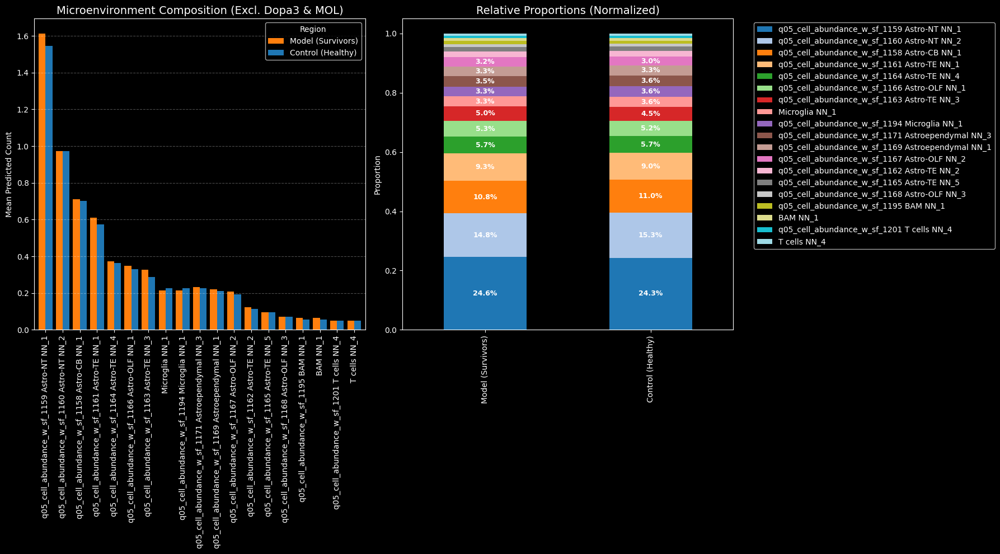

In [ ]:
from config import ROI_LEFT_BOX, ROI_RIGHT_BOX
from utils import get_spatial_xy, get_roi_masks
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns

# === 1. 定义要排除的细胞 ===
# 包含您指定的特定 MOL 噪音和 Dopa_3 自身
exclude_list = [
    'SNc-VTA-RAmb Foxa1 Dopa_3',           # 排除自身，以免占比过大掩盖其他成分
    'q05_cell_abundance_w_sf_1184 MOL NN', # 排除特定的 MOL 背景
    'MOL NN_4'                             # 建议也排除通用的 MOL，以防万一
]

# === 2. 准备数据与 ROI ===
# 目标神经元 (用于筛选 Bin)
target_dopa = 'SNc-VTA-RAmb Foxa1 Dopa_3'

# 确保列存在 (从 obsm 提取的防御性代码)
if target_dopa not in adata.obs.columns:
    try:
        col_names = adata.uns.get('mod', {}).get('factor_names', [])
        temp_df = pd.DataFrame(adata.obsm['q05_cell_abundance_w_sf'], columns=col_names, index=adata.obs_names)
        matches = [c for c in temp_df.columns if target_dopa in c]
        if matches: adata.obs[target_dopa] = temp_df[matches[0]]
    except:
        pass

# 定义 ROI (Left=Model, Right=Control)
x, y = get_spatial_xy(adata)
mask_L, mask_R = get_roi_masks(x, y, ROI_LEFT_BOX, ROI_RIGHT_BOX)

# === 3. 核心筛选：Dopa_3 > 0 的 Bin ===
mask_model_survivors = mask_L & (adata.obs[target_dopa] > 1e-6)
mask_control_healthy = mask_R & (adata.obs[target_dopa] > 1e-6)

print(f"Model 侧幸存 Bin 数: {mask_model_survivors.sum()}")
print(f"Control 侧健康 Bin 数: {mask_control_healthy.sum()}")

# === 4. 智能选择邻居细胞 (排除法) ===
# 定义我们关注的“其他”细胞类别
interest_keywords = [
    'Microglia', 'T cells', 'BAM', 'NK cells', 'B cells', # 免疫
    'Astro', 'OPC', 'Endo', 'Peri',                       # 胶质/血管 (去掉了 MOL)
    'SNc-VTA'                                             # 其他 Dopa 亚型
]

# 自动筛选列名
columns_to_analyze = []
for col in adata.obs.columns:
    # 1. 排除规则：如果包含排除列表中的任何关键词，跳过
    if any(ex in col for ex in exclude_list):
        continue
    # 2. 也是排除规则：如果包含 'MOL' 且不在我们的白名单里，跳过
    if 'MOL' in col:
        continue
        
    # 3. 纳入规则：必须包含我们感兴趣的关键词
    if any(k in col for k in interest_keywords):
        columns_to_analyze.append(col)

print(f"纳入分析的背景细胞类型: {len(columns_to_analyze)} 种")
# print(columns_to_analyze) # 调试用

# === 5. 计算微环境组成 ===
# 提取数据
df_model = adata.obs.loc[mask_model_survivors, columns_to_analyze]
df_control = adata.obs.loc[mask_control_healthy, columns_to_analyze]

# 计算均值
mean_model = df_model.mean(axis=0)
mean_control = df_control.mean(axis=0)

comp_df = pd.DataFrame({
    'Model (Survivors)': mean_model,
    'Control (Healthy)': mean_control
})

# 为了图表整洁，只展示丰度最高的 Top 15 和 关键免疫细胞
# 先按 Control 丰度排序
comp_df = comp_df.sort_values('Control (Healthy)', ascending=False)

# 强制保留免疫细胞 (即使丰度低也要看)
immune_cols = [c for c in comp_df.index if 'Microglia' in c or 'T cells' in c or 'BAM' in c]
top_cols = comp_df.head(15).index.tolist()
final_cols = list(set(top_cols + immune_cols))

plot_df = comp_df.loc[final_cols].sort_values('Control (Healthy)', ascending=False)

# === 6. 可视化 ===
plt.style.use('dark_background')
fig, axes = plt.subplots(1, 2, figsize=(18, 10))

# 图 A: 绝对丰度 (去除 MOL/Dopa3 后)
plot_df.plot(kind='bar', ax=axes[0], color=['#ff7f0e', '#1f77b4'], width=0.8)
axes[0].set_title('Microenvironment Composition (Excl. Dopa3 & MOL)', fontsize=14)
axes[0].set_ylabel('Mean Predicted Count')
axes[0].legend(title='Region')
axes[0].grid(axis='y', linestyle='--', alpha=0.3)

# 图 B: 相对比例 (归一化)
# 这能让你看到谁成了新的“微环境霸主”
plot_df_T = plot_df.T
prop_df = plot_df_T.div(plot_df_T.sum(axis=1), axis=0)

prop_df.plot(kind='bar', stacked=True, ax=axes[1], colormap='tab20')
axes[1].set_title('Relative Proportions (Normalized)', fontsize=14)
axes[1].set_ylabel('Proportion')
axes[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# 添加数值标注
for n, x in enumerate([0, 1]):
    y_pos = 0
    vals = prop_df.iloc[n]
    for i, (cell, val) in enumerate(vals.items()):
        if val > 0.03: # 只标 >3%
            axes[1].text(x, y_pos + val/2, f"{val:.1%}", ha='center', va='center', fontsize=9, color='white', fontweight='bold')
        y_pos += val

plt.tight_layout()
plt.savefig('Dopa3_Niche_Filtered_Analysis.png', dpi=300, bbox_inches='tight')
print("\n图表已保存: Dopa3_Niche_Filtered_Analysis.png")

# === 7. 打印关键变化 ===
print("\n【微环境主要成分变化 (Fold Change)】")
print(f"{'Cell Type':<40} | {'Control':<10} | {'Model':<10} | {'FC'}")
print("-" * 80)
for cell in plot_df.index:
    v_c = plot_df.loc[cell, 'Control (Healthy)']
    v_m = plot_df.loc[cell, 'Model (Survivors)']
    fc = v_m / (v_c + 1e-9)
    trend = "↑" if fc > 1.2 else "↓" if fc < 0.8 else "-"
    print(f"{cell[:40]:<40} | {v_c:.4f}     | {v_m:.4f}     | {fc:.2f} {trend}")


检测到原始计数，正在执行临时标准化...
正在计算模块评分...
✅ Oligo_Activation: 包含 7/7 个基因。
✅ Micro_Activation: 包含 12/12 个基因。
✅ Astro_Activation: 包含 11/11 个基因。

图表已保存: Glial_Activation_Violin.png

【胶质细胞激活差异统计 (Model vs Control)】
--------------------------------------------------------------------------------
Module                    | Model Mean | Control Mean | P-value    | Result
Score_Oligo_Activation    | 0.3543     | 0.3766       | 1.18e-01     | ↓ Suppressed ns
Score_Micro_Activation    | 0.0863     | 0.0792       | 2.97e-01     | ↑ Activated ns
Score_Astro_Activation    | 0.2344     | 0.2149       | 2.92e-02     | ↑ Activated ns


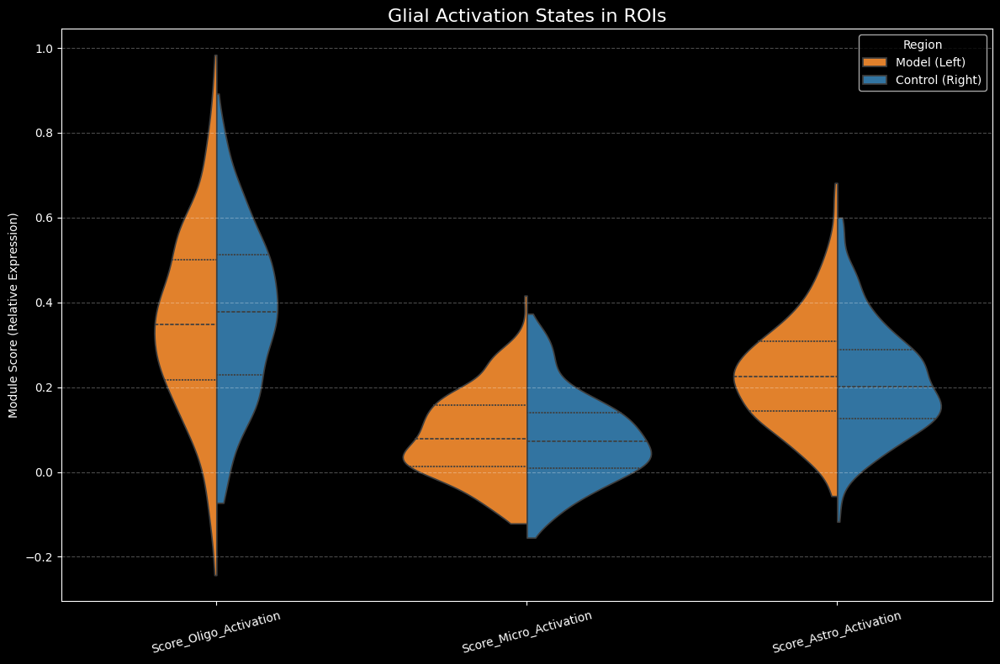

In [ ]:
from config import ROI_LEFT_BOX, ROI_RIGHT_BOX
from utils import get_spatial_xy, get_roi_masks
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import mannwhitneyu

# === 1. 定义激活基因模块 (Glial Activation Modules) ===
# 基因名注意大小写：小鼠基因通常首字母大写 (e.g., Apoe)，请确保与 adata.var_names 一致
module_dict = {
    'Oligo_Activation': ['Apoe', 'B2m', 'C4b', 'Cd47', 'Cryab', 'Il33', 'Serpina3n'],
    'Micro_Activation': ['Apoe', 'B2m', 'C1qa', 'Ccl3', 'Cd68', 'Cdkn1a', 'Gpnmb', 'H2-K1', 'Hif1a', 'Itgax', 'Lgals3', 'Spp1'],
    'Astro_Activation': ['Apoe', 'C3', 'Clu', 'Cxcl10', 'Cxcl14', 'Gfap', 'H2-K1', 'Hif1a', 'Isg15', 'Stat3', 'Vim']
}

# === 2. 预处理与评分 ===
# 确保数据已标准化 (Log1p)，否则 score_genes 结果不准
if adata.X.max() > 50:
    print("检测到原始计数，正在执行临时标准化...")
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)

print("正在计算模块评分...")
valid_scores = []

for mod_name, genes in module_dict.items():
    # 检查基因是否存在
    valid_genes = [g for g in genes if g in adata.var_names]
    missing_genes = list(set(genes) - set(valid_genes))
    
    if len(valid_genes) > 0:
        # 计算评分 (Scanpy 会自动将结果存入 adata.obs[score_name])
        score_name = f'Score_{mod_name}'
        sc.tl.score_genes(adata, gene_list=valid_genes, score_name=score_name)
        valid_scores.append(score_name)
        print(f"✅ {mod_name}: 包含 {len(valid_genes)}/{len(genes)} 个基因。")
        if missing_genes:
            print(f"   (缺失: {missing_genes})")
    else:
        print(f"❌ {mod_name}: 未找到任何有效基因，跳过。")

# === 3. 提取 ROI 数据 ===
# 定义 ROI (Model: Left, Control: Right)
x, y = get_spatial_xy(adata)
mask_L, mask_R = get_roi_masks(x, y, ROI_LEFT_BOX, ROI_RIGHT_BOX)

# 提取子集
df_L = adata.obs.loc[mask_L, valid_scores].copy()
df_L['Region'] = 'Model (Left)'

df_R = adata.obs.loc[mask_R, valid_scores].copy()
df_R['Region'] = 'Control (Right)'

plot_df = pd.concat([df_L, df_R])

# === 4. 可视化：小提琴图 (Violin Plot) ===
plt.style.use('dark_background')
fig, ax = plt.subplots(figsize=(12, 8))

# 将宽表转换为长表用于绘图
melted_df = plot_df.melt(id_vars='Region', var_name='Module', value_name='Activation Score')

sns.violinplot(
    data=melted_df, 
    x='Module', 
    y='Activation Score', 
    hue='Region',
    split=True,           # 左右分裂对比
    inner='quartile',     # 显示四分位数线
    palette={'Model (Left)': '#ff7f0e', 'Control (Right)': '#1f77b4'}, # 橙色 vs 蓝色
    cut=0,                # 限制绘图范围在数据极值内
    ax=ax
)

ax.set_title('Glial Activation States in ROIs', fontsize=16)
ax.set_ylabel('Module Score (Relative Expression)')
ax.set_xlabel('')
plt.xticks(rotation=15)
plt.grid(axis='y', linestyle='--', alpha=0.3)

plt.tight_layout()
plt.savefig('Glial_Activation_Violin.png', dpi=300)
print("\n图表已保存: Glial_Activation_Violin.png")

# === 5. 统计检验 (Mann-Whitney U) ===
print("\n" + "="*80)
print(f"【胶质细胞激活差异统计 (Model vs Control)】")
print("-" * 80)
print(f"{'Module':<25} | {'Model Mean':<10} | {'Control Mean':<10} | {'P-value':<10} | {'Result'}")

for mod in valid_scores:
    vals_model = df_L[mod].values
    vals_control = df_R[mod].values
    
    # 统计检验
    stat, p = mannwhitneyu(vals_model, vals_control, alternative='two-sided')
    
    # 判断趋势
    mean_m = np.mean(vals_model)
    mean_c = np.mean(vals_control)
    trend = "↑ Activated" if mean_m > mean_c else "↓ Suppressed"
    sig = "**" if p < 0.01 else "ns"
    
    print(f"{mod:<25} | {mean_m:.4f}     | {mean_c:.4f}       | {p:.2e}     | {trend} {sig}")
print("="*80)


正在计算模块评分...
✅ DAM_State: 有效基因 6/6 ['Trem2', 'Tyrobp', 'Ctsb', 'Apoe', 'Lpl', 'Cst7']
✅ Astro_Reactive: 有效基因 5/5 ['Gfap', 'Vim', 'Serpina3n', 'Lcn2', 'C3']
✅ Oligo_ER_Stress: 有效基因 4/4 ['Hspa5', 'Ddit3', 'Xbp1', 'Hsp90b1']

图表已保存: Glial_Pathology_Violin.png

【病理状态差异统计 (Model vs Control)】
--------------------------------------------------------------------------------
Module               | Model    | Control  | P-value    | Trend
Score_DAM_State      | 0.369    | 0.371      | 8.68e-01     | ↓ Down
Score_Astro_Reactive | 0.009    | -0.015      | 4.71e-03     | ↑ Up
Score_Oligo_ER_Stress | 0.238    | 0.230      | 5.74e-01     | ↑ Up


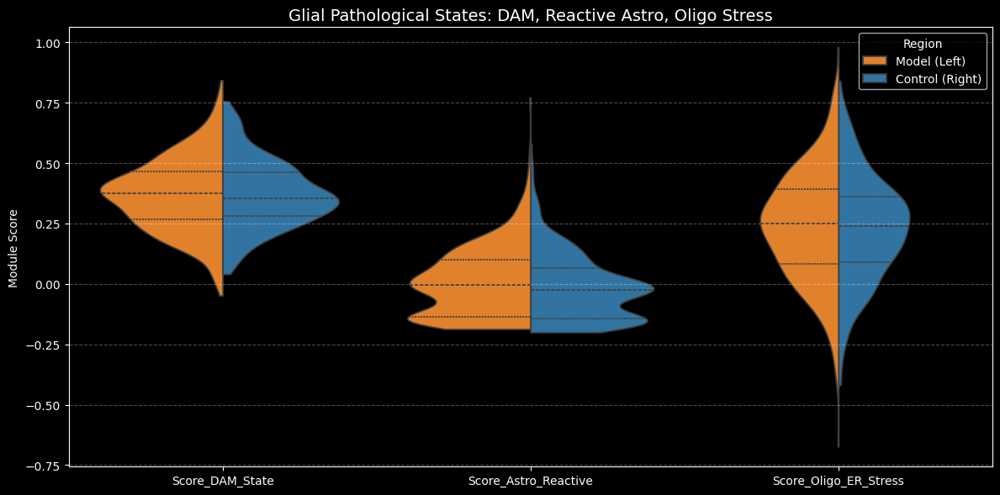

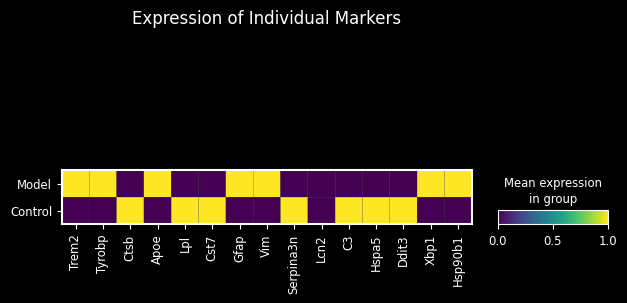

In [ ]:
from config import ROI_LEFT_BOX, ROI_RIGHT_BOX
from utils import get_spatial_xy, get_roi_masks
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import mannwhitneyu

# === 1. 定义基因模块 ===
module_dict = {
    'DAM_State': ['Trem2', 'Tyrobp', 'Ctsb', 'Apoe', 'Lpl', 'Cst7'],
    'Astro_Reactive': ['Gfap', 'Vim', 'Serpina3n', 'Lcn2', 'C3'],
    'Oligo_ER_Stress': ['Hspa5', 'Ddit3', 'Xbp1', 'Hsp90b1']
}

# === 2. 计算模块评分 ===
# 确保数据已标准化
if adata.X.max() > 50:
    print("检测到原始计数，正在执行 Log1p 标准化...")
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)

print("正在计算模块评分...")
valid_scores = []

for mod_name, genes in module_dict.items():
    # 检查基因是否存在
    valid_genes = [g for g in genes if g in adata.var_names]
    missing = list(set(genes) - set(valid_genes))
    
    if len(valid_genes) > 0:
        score_name = f'Score_{mod_name}'
        # ctrl_size=50: 选取50个背景基因进行校正，确保得分反映特异性表达
        sc.tl.score_genes(adata, gene_list=valid_genes, score_name=score_name, ctrl_size=50)
        valid_scores.append(score_name)
        print(f"✅ {mod_name}: 有效基因 {len(valid_genes)}/{len(genes)} {valid_genes}")
    else:
        print(f"❌ {mod_name}: 无有效基因")

# === 3. 提取 ROI 数据 ===
# 定义 ROI (Model: Left, Control: Right)
x, y = get_spatial_xy(adata)
mask_L, mask_R = get_roi_masks(x, y, ROI_LEFT_BOX, ROI_RIGHT_BOX)

# 提取数据
df_L = adata.obs.loc[mask_L, valid_scores].copy()
df_L['Region'] = 'Model (Left)'
df_R = adata.obs.loc[mask_R, valid_scores].copy()
df_R['Region'] = 'Control (Right)'

plot_df = pd.concat([df_L, df_R])

# === 4. 可视化：小提琴图 ===
plt.style.use('dark_background')
fig, ax = plt.subplots(figsize=(12, 6))

# 转换格式
melted_df = plot_df.melt(id_vars='Region', var_name='Module', value_name='Score')

sns.violinplot(
    data=melted_df, x='Module', y='Score', hue='Region',
    split=True, inner='quartile', cut=0,
    palette={'Model (Left)': '#ff7f0e', 'Control (Right)': '#1f77b4'},
    ax=ax
)

ax.set_title('Glial Pathological States: DAM, Reactive Astro, Oligo Stress', fontsize=14)
ax.set_ylabel('Module Score')
ax.set_xlabel('')
ax.grid(axis='y', linestyle='--', alpha=0.3)

plt.tight_layout()
plt.savefig('Glial_Pathology_Violin.png', dpi=300)
print("\n图表已保存: Glial_Pathology_Violin.png")

# === 5. 统计检验 ===
print("\n" + "="*80)
print(f"【病理状态差异统计 (Model vs Control)】")
print("-" * 80)
print(f"{'Module':<20} | {'Model':<8} | {'Control':<8} | {'P-value':<10} | {'Trend'}")

for mod in valid_scores:
    vals_m = df_L[mod].values
    vals_c = df_R[mod].values
    stat, p = mannwhitneyu(vals_m, vals_c, alternative='two-sided')
    
    mean_m, mean_c = np.mean(vals_m), np.mean(vals_c)
    trend = "↑ Up" if mean_m > mean_c else "↓ Down"
    
    print(f"{mod:<20} | {mean_m:.3f}    | {mean_c:.3f}      | {p:.2e}     | {trend}")
print("="*80)

# === 6. 额外验证：单个基因热图 (Validation) ===
# 有时候总分高是因为某一个基因(如Gfap)极高，看热图能确认是不是一组基因都高了
all_genes = []
for g_list in module_dict.values(): all_genes.extend(g_list)
all_genes = [g for g in all_genes if g in adata.var_names]

# 只取 ROI 内的 bin
roi_adata = adata[adata.obs['Region'].isin(['Model', 'Control'])].copy()
# 简单的矩阵图
sc.pl.matrixplot(
    roi_adata, 
    var_names=all_genes, 
    groupby='Region', 
    categories_order=['Model', 'Control'],
    standard_scale='var', 
    cmap='viridis',
    title='Expression of Individual Markers',
    save='_Glial_Markers_Heatmap.png'
)


正在分析目标列: q05_cell_abundance_w_sf_1201 T cells NN_4
全脑最大丰度值 (Max): 0.5910

【T细胞丰度阈值敏感性分析】
Total Bins in ROI: Model=361, Control=361
Threshold > 1e-6 代表 '只要有非零信号就统计'
--------------------------------------------------------------------------------
   Threshold (>)  Model (Left) Bins  Control (Right) Bins  Ratio (Model/Ctrl)
0           0.00                361                   361                1.00
1           0.03                289                   314                0.92
2           0.04                262                   278                0.94
3           0.05                209                   209                1.00
4           0.06                115                   116                0.99
5           0.07                 82                    76                1.08
6           0.07                 62                    35                1.77
7           0.07                 35                    17                2.06
8           0.08                 19                  

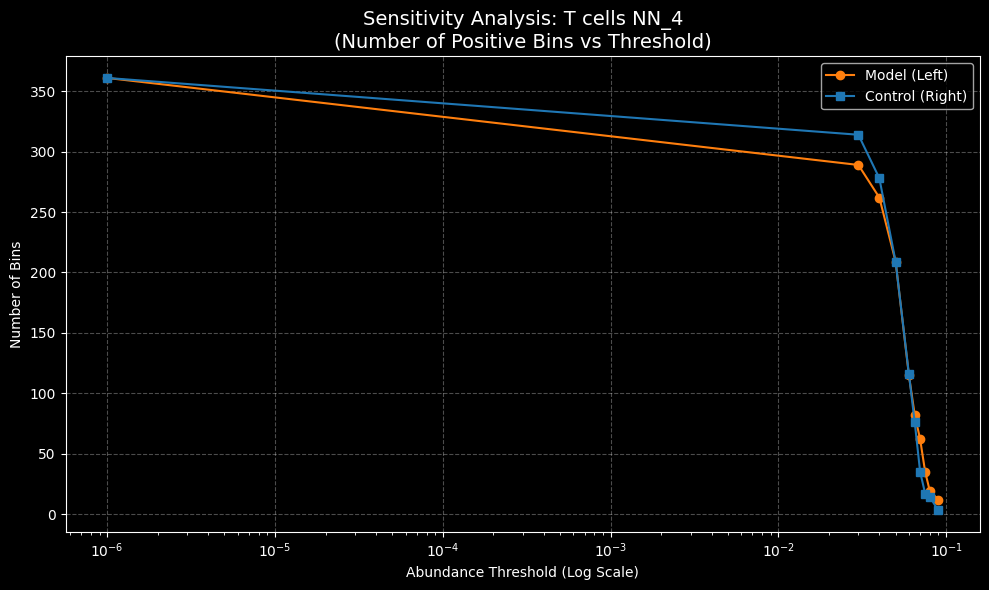

In [ ]:
from config import ROI_LEFT_BOX, ROI_RIGHT_BOX
from utils import get_spatial_xy, get_roi_masks
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# === 1. 自动锁定 T 细胞列 ===
# 优先找 obs，没有找 obsm
target_cell = 'T cells NN_4' # 核心关键词
found_col = None

# A. 检查 obs
matches = [c for c in adata.obs.columns if target_cell in c]
if matches:
    found_col = matches[0]
else:
    # B. 检查 obsm
    if isinstance(adata.obsm['q05_cell_abundance_w_sf'], pd.DataFrame):
        temp_df = adata.obsm['q05_cell_abundance_w_sf']
    else:
        cols = adata.uns.get('mod', {}).get('factor_names', [])
        temp_df = pd.DataFrame(adata.obsm['q05_cell_abundance_w_sf'], columns=cols, index=adata.obs_names)
    
    matches = [c for c in temp_df.columns if target_cell in c]
    if matches:
        found_col = matches[0]
        adata.obs[found_col] = temp_df[found_col].values # 复制到 obs 以便后续使用

if not found_col:
    raise ValueError("未找到 T 细胞数据列，请检查拼写！")

print(f"正在分析目标列: {found_col}")
print(f"全脑最大丰度值 (Max): {adata.obs[found_col].max():.4f}")

# === 2. 定义 ROI ===
x, y = get_spatial_xy(adata)
# Model (Left)
mask_L, mask_R = get_roi_masks(x, y, ROI_LEFT_BOX, ROI_RIGHT_BOX)
# Control (Right)

roi_data = {
    'Model (Left)': adata.obs.loc[mask_L, found_col],
    'Control (Right)': adata.obs.loc[mask_R, found_col]
}

# === 3. 阶梯阈值统计 ===
# 针对 q05 数据，我们设置非常细的低值区间
thresholds = [1e-6,0.03,0.04,0.05, 0.06,0.065, 0.07,0.075, 0.08, 0.09,]
stats_list = []

for t in thresholds:
    row = {'Threshold (>)': t}
    for region, series in roi_data.items():
        # 统计大于阈值的 Bin 数量
        count = (series > t).sum()
        row[f'{region} Bins'] = count
    stats_list.append(row)

# === 4. 输出表格 ===
df_stats = pd.DataFrame(stats_list)

# 计算 Model/Control 比值 (作为富集倍数参考)
df_stats['Ratio (Model/Ctrl)'] = df_stats['Model (Left) Bins'] / (df_stats['Control (Right) Bins'] + 1e-9)

pd.set_option('display.max_columns', None)
pd.set_option('display.width', 1000)
pd.set_option('display.precision', 2)

print("\n" + "="*80)
print(f"【T细胞丰度阈值敏感性分析】")
print(f"Total Bins in ROI: Model={mask_L.sum()}, Control={mask_R.sum()}")
print("Threshold > 1e-6 代表 '只要有非零信号就统计'")
print("-" * 80)
print(df_stats)
print("="*80)

# === 5. 可视化：阈值下降曲线 ===
plt.style.use('dark_background')
plt.figure(figsize=(10, 6))

plt.plot(df_stats['Threshold (>)'], df_stats['Model (Left) Bins'], 'o-', color='#ff7f0e', label='Model (Left)')
plt.plot(df_stats['Threshold (>)'], df_stats['Control (Right) Bins'], 's-', color='#1f77b4', label='Control (Right)')

plt.title(f'Sensitivity Analysis: {target_cell}\n(Number of Positive Bins vs Threshold)', fontsize=14)
plt.xlabel('Abundance Threshold (> X)')
plt.ylabel('Number of Bins')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.xscale('log') # 使用对数坐标看清低值区域
plt.xlabel('Abundance Threshold (Log Scale)')

plt.tight_layout()
plt.savefig('T_Cell_Threshold_Check.png', dpi=300)
print("\n图表已保存: T_Cell_Threshold_Check.png")


开始分析... 中心点: q05_cell_abundance_w_sf_1201 T cells NN_4

>>> 处理阈值: T cells > 0.07
  Model (Left): 找到 62 个中心点
  Control (Right): 找到 35 个中心点

>>> 处理阈值: T cells > 0.09
  Model (Left): 找到 12 个中心点
  Control (Right): 找到 3 个中心点

图表已保存: T_Cell_Spatial_Rings_Proportion.png

【T细胞微环境比例数据表】
--------------------------------------------------------------------------------
Cell Type                 Astrocytes  BAM/Mac  Dopa Neurons  Microglia  Oligos  T Cells (Self)
X_Label                                                                                       
Model (Left)\n0-100             0.22     0.01          0.02       0.02    0.73            0.00
Model (Left)\n100-200           0.20     0.00          0.05       0.02    0.73            0.00
Model (Left)\n200-300           0.22     0.00          0.06       0.02    0.69            0.00
Control (Right)\n0-100          0.22     0.01          0.00       0.03    0.74            0.00
Control (Right)\n100-200        0.23     0.01          0.01       0.02

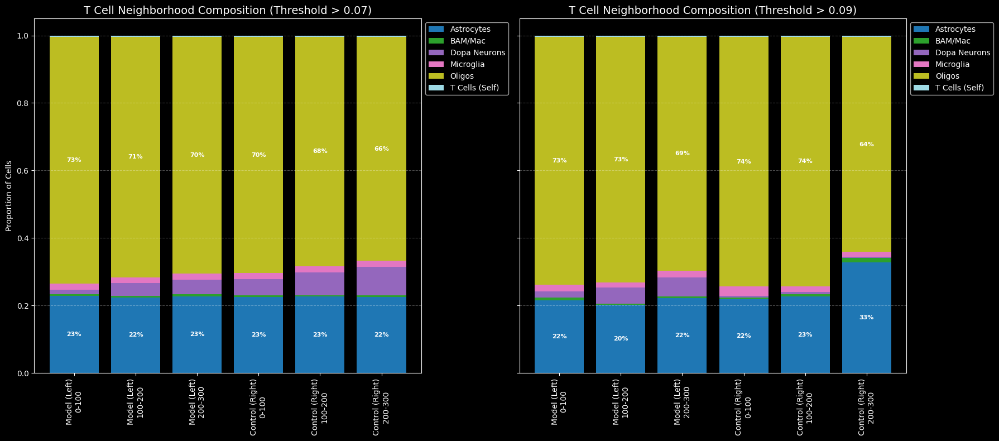

In [ ]:
from config import ROI_LEFT_BOX, ROI_RIGHT_BOX
from utils import get_spatial_xy, get_roi_masks
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
from scipy.spatial import KDTree

# === 1. 参数设置 ===
thresholds = [0.07, 0.09]  # 两个阈值
rings = [(0, 100), (100, 200), (200, 300)] # 三个圈层

# 目标细胞 (中心)
t_cell_col = 'q05_cell_abundance_w_sf_1201 T cells NN_4'
# 如果列名不对，自动修正
if t_cell_col not in adata.obs.columns:
    matches = [c for c in adata.obs.columns if 'T cells' in c]
    if matches: t_cell_col = matches[0]

# 邻居细胞 (我们要分析比例的成分)
# 包含：免疫、胶质、神经元
neighbor_groups = {
    'Microglia': ['Microglia'],
    'Astrocytes': ['Astro'],
    'Oligos': ['MOL', 'OPC'], # 聚合少突
    'Dopa Neurons': ['SNc-VTA', 'Dopa'],
    'T Cells (Self)': ['T cells'], # 自身也算进去看密度变化
    'BAM/Mac': ['BAM', 'Macrophage']
}

# 自动映射列名
neighbor_cols = {}
for group, keys in neighbor_groups.items():
    found_cols = []
    for k in keys:
        found_cols.extend([c for c in adata.obs.columns if k in c])
    if found_cols:
        neighbor_cols[group] = list(set(found_cols)) # 去重

# === 2. 定义 ROI ===
x, y = get_spatial_xy(adata)
mask_L, mask_R = get_roi_masks(x, y, ROI_LEFT_BOX, ROI_RIGHT_BOX)

roi_masks = {'Model (Left)': mask_L, 'Control (Right)': mask_R}

# === 3. 核心计算循环 ===
plot_data = []

print(f"开始分析... 中心点: {t_cell_col}")

for thresh in thresholds:
    print(f"\n>>> 处理阈值: T cells > {thresh}")
    
    for region, mask in roi_masks.items():
        # 1. 获取该区域所有坐标和数据
        region_obs = adata.obs[mask]
        
        # 2. 找到中心点 (T细胞 > 阈值)
        center_mask = region_obs[t_cell_col].values > thresh
        centers = region_coords[center_mask]
        
        if len(centers) == 0:
            print(f"  警告: {region} 没有 > {thresh} 的 T 细胞，跳过。")
            continue
            
        print(f"  {region}: 找到 {len(centers)} 个中心点")
        
        # 3. 构建 KDTree (用于全区域搜索)
        tree = KDTree(region_coords)
        
        # 4. 对每个圈层进行统计
        for r_min, r_max in rings:
            # 搜索 r_max 范围内的点
            indices_list = tree.query_ball_point(centers, r_max)
            
            # 聚合该圈层内的所有细胞计数
            layer_counts = {k: 0.0 for k in neighbor_cols.keys()}
            
            # 遍历每个中心点的邻居
            for i, idxs in enumerate(indices_list):
                if not idxs: continue
                
                # 获取邻居坐标并计算距离
                neighbors_coords = region_coords[idxs]
                this_center = centers[i]
                dists = np.linalg.norm(neighbors_coords - this_center, axis=1)
                
                # 筛选环形区域 (r_min < d <= r_max)
                # 注意：如果是第一圈 0-100，包含 0
                ring_mask = (dists > r_min) & (dists <= r_max)
                if r_min == 0: 
                    ring_mask = (dists >= 0) & (dists <= r_max)
                
                valid_idxs = np.array(idxs)[ring_mask]
                
                if len(valid_idxs) > 0:
                    # 累加各细胞类型的丰度
                    for group, cols in neighbor_cols.items():
                        # sum(axis=1) 是把亚型合并，sum() 是把所有Bin加起来
                        val = region_obs.iloc[valid_idxs][cols].sum(axis=1).sum()
                        layer_counts[group] += val
            
            # 存入列表 (Raw Counts，之后算比例)
            row = layer_counts.copy()
            row['Threshold'] = str(thresh)
            row['Region'] = region
            row['Distance'] = f"{r_min}-{r_max}"
            plot_data.append(row)

# === 4. 数据整理与比例计算 ===
df = pd.DataFrame(plot_data)

# 转换格式：将细胞类型列 Melt 出来
cell_cols = list(neighbor_cols.keys())
df_melt = df.melt(id_vars=['Threshold', 'Region', 'Distance'], 
                  value_vars=cell_cols, 
                  var_name='Cell Type', value_name='Total Abundance')

# 计算比例 (Proportion)
# 对于每个 (Threshold, Region, Distance) 分组，总和为 100%
df_melt['Proportion'] = df_melt.groupby(['Threshold', 'Region', 'Distance'])['Total Abundance'].transform(lambda x: x / x.sum())

# === 5. 可视化：堆叠柱状图 ===
plt.style.use('dark_background')

# 我们生成 2 个大图 (对应两个阈值)，每个图里分 Model/Control 和 距离
unique_thresh = df_melt['Threshold'].unique()

fig, axes = plt.subplots(1, len(unique_thresh), figsize=(18, 8), sharey=True)
if len(unique_thresh) == 1: axes = [axes]

for i, th in enumerate(unique_thresh):
    ax = axes[i]
    subset = df_melt[df_melt['Threshold'] == th].copy()
    
    # 构建透视表用于绘图 (Index=Region+Distance, Columns=Cell Type)
    # 为了让 X 轴好看，我们组合 Region 和 Distance
    subset['X_Label'] = subset['Region'] + '\n' + subset['Distance']
    
    pivot_df = subset.pivot(index='X_Label', columns='Cell Type', values='Proportion')
    
    # 排序：保证 Model 和 Control 分开，距离按顺序
    # 自定义排序逻辑
    pivot_df = pivot_df.sort_index(key=lambda x: x.map(lambda k: (0 if 'Model' in k else 1, int(k.split('\n')[-1].split('-')[0]))))
    
    # 绘图
    pivot_df.plot(kind='bar', stacked=True, ax=ax, colormap='tab20', width=0.8)
    
    ax.set_title(f'T Cell Neighborhood Composition (Threshold > {th})', fontsize=14)
    ax.set_xlabel('')
    ax.set_ylabel('Proportion of Cells')
    ax.legend(bbox_to_anchor=(1.0, 1.0))
    ax.grid(axis='y', linestyle='--', alpha=0.3)
    
    # 添加数值标签 (只标 > 10% 的)
    for p in ax.patches:
        width, height = p.get_width(), p.get_height()
        x, y = p.get_xy() 
        if height > 0.10:
            ax.text(x+width/2, y+height/2, '{:.0%}'.format(height), ha='center', va='center', fontsize=8, color='white', fontweight='bold')

plt.tight_layout()
plt.savefig('T_Cell_Spatial_Rings_Proportion.png', dpi=300)
print("\n图表已保存: T_Cell_Spatial_Rings_Proportion.png")

# === 6. 打印关键数据表 ===
print("\n" + "="*80)
print("【T细胞微环境比例数据表】")
print("-" * 80)
print(pivot_df)
print("="*80)


分析组分: ['Microglia', 'Dopa Neurons', 'T Cells (Self)', 'BAM/Mac', 'NK/B/DC']

>>> 处理阈值: T cells > 0.07

>>> 处理阈值: T cells > 0.09

图表已保存: T_Cell_Rings_NoGlia.png


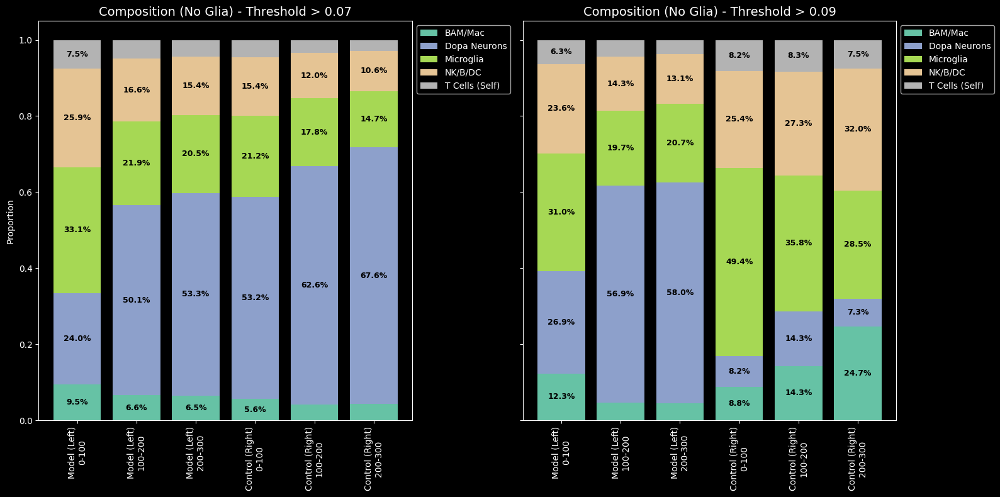

In [ ]:
from config import ROI_LEFT_BOX, ROI_RIGHT_BOX
from utils import get_spatial_xy, get_roi_masks
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
from scipy.spatial import KDTree

# === 1. 参数设置 ===
thresholds = [0.07, 0.09]
rings = [(0, 100), (100, 200), (200, 300)]

# 目标中心 (T细胞)
t_cell_col = 'q05_cell_abundance_w_sf_1201 T cells NN_4'
# 自动纠错
if t_cell_col not in adata.obs.columns:
    matches = [c for c in adata.obs.columns if 'T cells' in c]
    if matches: t_cell_col = matches[0]

# === 2. 定义邻居组 (已去除 Astro 和 Oligo) ===
neighbor_groups = {
    'Microglia': ['Microglia'],
    'Dopa Neurons': ['SNc-VTA', 'Dopa'],
    'T Cells (Self)': ['T cells'], 
    'BAM/Mac': ['BAM', 'Macrophage'],
    'NK/B/DC': ['NK cells', 'B cells', 'DC'] # 加上其他免疫细胞看看
}

# 自动映射列名
neighbor_cols = {}
for group, keys in neighbor_groups.items():
    found_cols = []
    for k in keys:
        found_cols.extend([c for c in adata.obs.columns if k in c])
    if found_cols:
        # 再次过滤，确保里面没混进去 Astro/Oligo/MOL/OPC
        clean_cols = [c for c in found_cols if not any(x in c for x in ['Astro', 'MOL', 'OPC'])]
        if clean_cols:
            neighbor_cols[group] = list(set(clean_cols))

print(f"分析组分: {list(neighbor_cols.keys())}")

# === 3. 定义 ROI ===
x, y = get_spatial_xy(adata)
mask_L, mask_R = get_roi_masks(x, y, ROI_LEFT_BOX, ROI_RIGHT_BOX)
roi_masks = {'Model (Left)': mask_L, 'Control (Right)': mask_R}

# === 4. 核心计算循环 ===
plot_data = []

for thresh in thresholds:
    print(f"\n>>> 处理阈值: T cells > {thresh}")
    
    for region, mask in roi_masks.items():
        region_obs = adata.obs[mask]
        
        # 找到中心点
        center_mask = region_obs[t_cell_col].values > thresh
        centers = region_coords[center_mask]
        
        if len(centers) == 0:
            continue
            
        tree = KDTree(region_coords)
        
        for r_min, r_max in rings:
            # 搜索
            indices_list = tree.query_ball_point(centers, r_max)
            
            # 统计
            layer_counts = {k: 0.0 for k in neighbor_cols.keys()}
            
            for i, idxs in enumerate(indices_list):
                if not idxs: continue
                
                neighbors_coords = region_coords[idxs]
                this_center = centers[i]
                dists = np.linalg.norm(neighbors_coords - this_center, axis=1)
                
                # 环形过滤
                ring_mask = (dists > r_min) & (dists <= r_max)
                if r_min == 0: ring_mask = (dists >= 0) & (dists <= r_max)
                
                valid_idxs = np.array(idxs)[ring_mask]
                
                if len(valid_idxs) > 0:
                    for group, cols in neighbor_cols.items():
                        val = region_obs.iloc[valid_idxs][cols].sum(axis=1).sum()
                        layer_counts[group] += val
            
            row = layer_counts.copy()
            row['Threshold'] = str(thresh)
            row['Region'] = region
            row['Distance'] = f"{r_min}-{r_max}"
            plot_data.append(row)

# === 5. 绘图 (堆叠柱状图) ===
df = pd.DataFrame(plot_data)
if len(df) > 0:
    cell_cols = list(neighbor_cols.keys())
    df_melt = df.melt(id_vars=['Threshold', 'Region', 'Distance'], 
                      value_vars=cell_cols, 
                      var_name='Cell Type', value_name='Abundance')

    # 计算比例 (去除胶质细胞后的相对比例)
    df_melt['Proportion'] = df_melt.groupby(['Threshold', 'Region', 'Distance'])['Abundance'].transform(lambda x: x / x.sum())

    plt.style.use('dark_background')
    unique_thresh = df_melt['Threshold'].unique()
    
    fig, axes = plt.subplots(1, len(unique_thresh), figsize=(16, 8), sharey=True)
    if len(unique_thresh) == 1: axes = [axes]

    for i, th in enumerate(unique_thresh):
        ax = axes[i] if len(unique_thresh) > 1 else axes
        subset = df_melt[df_melt['Threshold'] == th].copy()
        
        subset['X_Label'] = subset['Region'] + '\n' + subset['Distance']
        pivot_df = subset.pivot(index='X_Label', columns='Cell Type', values='Proportion')
        
        # 排序
        pivot_df = pivot_df.sort_index(key=lambda x: x.map(lambda k: (0 if 'Model' in k else 1, int(k.split('\n')[-1].split('-')[0]))))
        
        pivot_df.plot(kind='bar', stacked=True, ax=ax, colormap='Set2', width=0.8)
        
        ax.set_title(f'Composition (No Glia) - Threshold > {th}', fontsize=14)
        ax.set_xlabel('')
        ax.set_ylabel('Proportion')
        ax.legend(bbox_to_anchor=(1.0, 1.0))
        
        # 标注
        for p in ax.patches:
            h = p.get_height()
            if h > 0.05:
                ax.text(p.get_x()+p.get_width()/2, p.get_y()+h/2, f"{h:.1%}", ha='center', va='center', fontsize=9, color='black', fontweight='bold')

    plt.tight_layout()
    plt.savefig('T_Cell_Rings_NoGlia.png', dpi=300)
    print("\n图表已保存: T_Cell_Rings_NoGlia.png")
else:
    print("错误: 没有提取到有效数据，请检查阈值或ROI。")


分析距离圈层: [(0, 100), (100, 200), (200, 300), (300, 400), (400, 500), (500, 600)]
分析组分 (已去胶质): ['Microglia', 'Dopa Neurons', 'T Cells', 'BAM/Mac', 'Other Immune']
开始计算空间梯度 (Threshold > 0.07)...
  Model (Left): 基于 62 个 T 细胞热点进行扩散分析...
  Control (Right): 基于 35 个 T 细胞热点进行扩散分析...

图表已保存: Spatial_Gradient_0_600_NoGlia.png


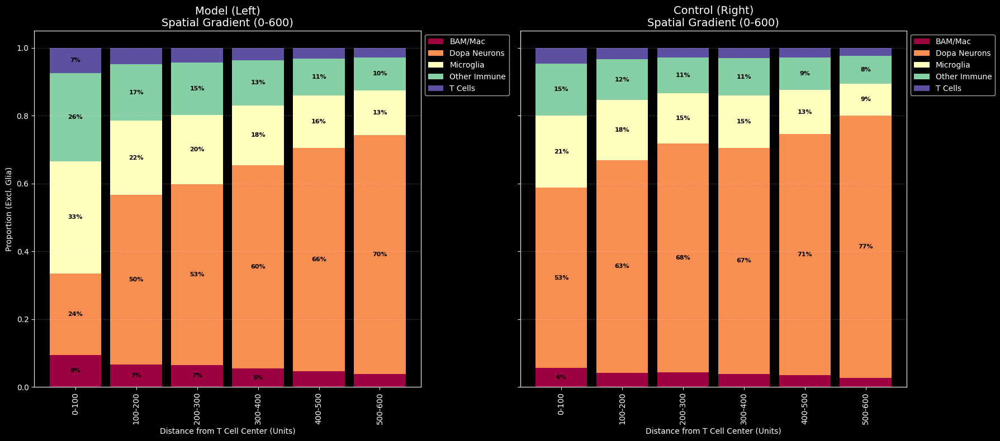

In [ ]:
from config import ROI_LEFT_BOX, ROI_RIGHT_BOX
from utils import get_spatial_xy, get_roi_masks
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
from scipy.spatial import KDTree

# === 1. 参数设置 ===
target_threshold = 0.07
# 定义 0 到 600，步长 100 的圈层: [(0,100), (100,200), ..., (500,600)]
step = 100
max_dist = 600
rings = [(i, i + step) for i in range(0, max_dist, step)]

print(f"分析距离圈层: {rings}")

# === 2. 锁定 T 细胞列 ===
t_cell_col = 'q05_cell_abundance_w_sf_1201 T cells NN_4'
if t_cell_col not in adata.obs.columns:
    matches = [c for c in adata.obs.columns if 'T cells' in c]
    if matches: t_cell_col = matches[0]

# === 3. 定义邻居组 (严格剔除 Astro/Oligo) ===
# 仅保留：神经元 + 免疫细胞
neighbor_groups = {
    'Microglia': ['Microglia'],
    'Dopa Neurons': ['SNc-VTA', 'Dopa'],
    'T Cells': ['T cells'], 
    'BAM/Mac': ['BAM', 'Macrophage'],
    'Other Immune': ['NK cells', 'B cells', 'DC']
}

neighbor_cols = {}
for group, keys in neighbor_groups.items():
    found_cols = []
    for k in keys:
        found_cols.extend([c for c in adata.obs.columns if k in c])
    
    # 【核心过滤】 剔除胶质细胞
    clean_cols = []
    for c in found_cols:
        if not any(x in c for x in ['Astro', 'MOL', 'OPC', 'Oligo']):
            clean_cols.append(c)
            
    if clean_cols:
        neighbor_cols[group] = list(set(clean_cols))

print(f"分析组分 (已去胶质): {list(neighbor_cols.keys())}")

# === 4. 定义 ROI ===
x, y = get_spatial_xy(adata)
mask_L, mask_R = get_roi_masks(x, y, ROI_LEFT_BOX, ROI_RIGHT_BOX)
roi_masks = {'Model (Left)': mask_L, 'Control (Right)': mask_R}

# === 5. 空间梯度计算 ===
plot_data = []

print(f"开始计算空间梯度 (Threshold > {target_threshold})...")

for region, mask in roi_masks.items():
    region_obs = adata.obs[mask]
    
    # 1. 确定中心点 (T细胞聚集点)
    center_mask = region_obs[t_cell_col].values > target_threshold
    centers = region_coords[center_mask]
    
    if len(centers) == 0:
        print(f"警告: {region} 没有符合阈值的中心点。")
        continue
        
    print(f"  {region}: 基于 {len(centers)} 个 T 细胞热点进行扩散分析...")
    
    # 2. KDTree 索引
    tree = KDTree(region_coords)
    
    # 3. 逐圈统计
    for r_min, r_max in rings:
        # 搜索 r_max 范围内的点
        indices_list = tree.query_ball_point(centers, r_max)
        
        layer_counts = {k: 0.0 for k in neighbor_cols.keys()}
        
        for i, idxs in enumerate(indices_list):
            if not idxs: continue
            
            # 计算精确距离并过滤环
            coords = region_coords[idxs]
            dists = np.linalg.norm(coords - centers[i], axis=1)
            
            if r_min == 0:
                ring_mask = (dists >= 0) & (dists <= r_max)
            else:
                ring_mask = (dists > r_min) & (dists <= r_max)
            
            valid_idxs = np.array(idxs)[ring_mask]
            
            # 累加丰度
            if len(valid_idxs) > 0:
                for group, cols in neighbor_cols.items():
                    val = region_obs.iloc[valid_idxs][cols].sum(axis=1).sum()
                    layer_counts[group] += val
        
        # 记录数据
        row = layer_counts.copy()
        row['Region'] = region
        row['Distance'] = f"{r_min}-{r_max}"
        # 添加一个排序用的数值 Distance
        row['Dist_Sort'] = r_min 
        plot_data.append(row)

# === 6. 可视化 ===
df = pd.DataFrame(plot_data)
if len(df) > 0:
    # 转换长表
    cell_cols = list(neighbor_cols.keys())
    df_melt = df.melt(id_vars=['Region', 'Distance', 'Dist_Sort'], 
                      value_vars=cell_cols, 
                      var_name='Cell Type', value_name='Abundance')
    
    # 计算比例 (Proportion)
    df_melt['Proportion'] = df_melt.groupby(['Region', 'Distance'])['Abundance'].transform(lambda x: x / x.sum())
    
    plt.style.use('dark_background')
    fig, axes = plt.subplots(1, 2, figsize=(18, 8), sharey=True)
    
    # 定义排序：先按 Region，再按距离
    regions = ['Model (Left)', 'Control (Right)']
    
    for i, region in enumerate(regions):
        ax = axes[i]
        subset = df_melt[df_melt['Region'] == region].copy()
        
        if subset.empty: continue
        
        # 透视表: Index=Distance, Columns=Cell Type
        pivot_df = subset.pivot(index='Distance', columns='Cell Type', values='Proportion')
        
        # 按照距离数值排序 Index
        # 创建辅助列排序
        sort_map = {f"{r}-{r+step}": r for r in range(0, max_dist, step)}
        pivot_df = pivot_df.sort_index(key=lambda x: x.map(sort_map))
        
        # 绘图
        pivot_df.plot(kind='bar', stacked=True, ax=ax, colormap='Spectral', width=0.85)
        
        ax.set_title(f'{region}\nSpatial Gradient (0-{max_dist})', fontsize=14)
        ax.set_xlabel('Distance from T Cell Center (Units)')
        if i == 0: ax.set_ylabel('Proportion (Excl. Glia)')
        else: ax.set_ylabel('')
        
        ax.legend(bbox_to_anchor=(1.0, 1.0))
        ax.grid(axis='y', linestyle='--', alpha=0.2)
        
        # 数值标注 (只标 > 5%)
        for p in ax.patches:
            h = p.get_height()
            if h > 0.05:
                ax.text(p.get_x()+p.get_width()/2, p.get_y()+h/2, f"{h:.0%}", 
                        ha='center', va='center', fontsize=8, color='black', fontweight='bold')

    plt.tight_layout()
    plt.savefig('Spatial_Gradient_0_600_NoGlia.png', dpi=300)
    print("\n图表已保存: Spatial_Gradient_0_600_NoGlia.png")
    
else:
    print("错误: 数据为空，请检查阈值是否过高导致没有中心点。")


分析微环境成分: ['Microglia', 'Dopa Neurons', 'BAM/Mac', 'Other Immune']
开始分析... 阈值: 0.07, 范围: 0-600
Model (Left): 62 个中心点
Control (Right): 35 个中心点

图表已保存: T_Cell_Environment_0_600_Clean.png

【比例数据表】
Cell Type                 BAM/Mac  Dopa Neurons  Microglia  Other Immune
X_Label                                                                 
Model (Left)\n0-200          0.08          0.41       0.27          0.24
Model (Left)\n200-400        0.06          0.59       0.19          0.16
Model (Left)\n400-600        0.04          0.70       0.14          0.12
Control (Right)\n0-200       0.05          0.60       0.19          0.15
Control (Right)\n200-400     0.04          0.69       0.15          0.12
Control (Right)\n400-600     0.03          0.76       0.11          0.10


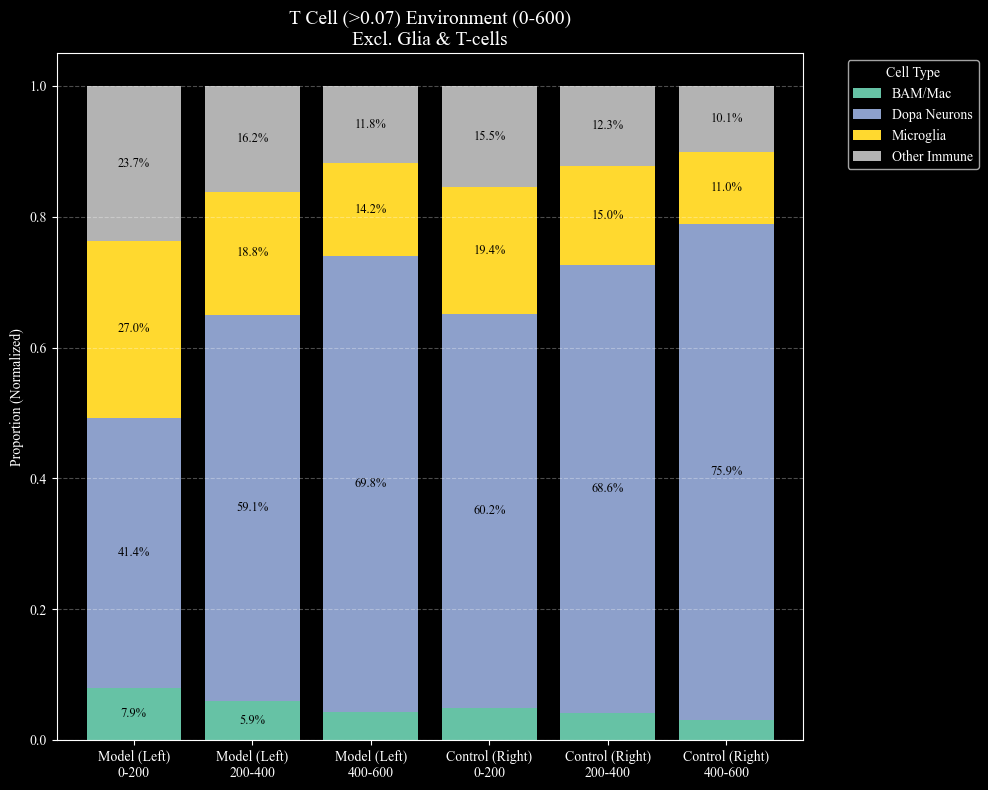

In [ ]:
from config import ROI_LEFT_BOX, ROI_RIGHT_BOX
from utils import get_spatial_xy, get_roi_masks
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
from scipy.spatial import KDTree

# === 1. 参数设置 ===
threshold = 0.07
# 扩大范围到 600，分为三圈
rings = [(0, 200), (200, 400), (400, 600)]

# 目标中心 (T细胞)
t_cell_col = 'q05_cell_abundance_w_sf_1201 T cells NN_4'
if t_cell_col not in adata.obs.columns:
    matches = [c for c in adata.obs.columns if 'T cells' in c]
    if matches: t_cell_col = matches[0]

# === 2. 定义邻居组 (严格排除 Astro, Oligo, T cells) ===
neighbor_groups = {
    'Microglia': ['Microglia'],            # 核心关注 1
    'Dopa Neurons': ['SNc-VTA', 'Dopa'],   # 核心关注 2 (受害者)
    'BAM/Mac': ['BAM', 'Macrophage'],      # 边界巨噬细胞
    'Other Immune': ['NK cells', 'B cells', 'DC'] # 其他免疫
}

# 自动映射列名并执行排除
neighbor_cols = {}
for group, keys in neighbor_groups.items():
    found_cols = []
    for k in keys:
        found_cols.extend([c for c in adata.obs.columns if k in c])
    
    # 【关键】排除 Astro, Oligo, MOL, OPC 和 T cells 自身
    if found_cols:
        clean_cols = [
            c for c in found_cols 
            if not any(x in c for x in ['Astro', 'MOL', 'OPC', 'T cells', 'Oligo'])
        ]
        if clean_cols:
            neighbor_cols[group] = list(set(clean_cols))

print(f"分析微环境成分: {list(neighbor_cols.keys())}")

# === 3. 定义 ROI ===
x, y = get_spatial_xy(adata)
mask_L, mask_R = get_roi_masks(x, y, ROI_LEFT_BOX, ROI_RIGHT_BOX)
roi_masks = {'Model (Left)': mask_L, 'Control (Right)': mask_R}

# === 4. 核心计算循环 ===
plot_data = []
print(f"开始分析... 阈值: {threshold}, 范围: 0-600")

for region, mask in roi_masks.items():
    region_obs = adata.obs[mask]
    
    # 找到中心点
    center_mask = region_obs[t_cell_col].values > threshold
    centers = region_coords[center_mask]
    
    if len(centers) == 0:
        print(f"警告: {region} 没有 > {threshold} 的 T 细胞中心。")
        continue
        
    print(f"{region}: {len(centers)} 个中心点")
    tree = KDTree(region_coords)
    
    for r_min, r_max in rings:
        # 搜索
        indices_list = tree.query_ball_point(centers, r_max)
        
        # 统计
        layer_counts = {k: 0.0 for k in neighbor_cols.keys()}
        
        for i, idxs in enumerate(indices_list):
            if not idxs: continue
            
            neighbors_coords = region_coords[idxs]
            this_center = centers[i]
            dists = np.linalg.norm(neighbors_coords - this_center, axis=1)
            
            # 环形过滤
            ring_mask = (dists > r_min) & (dists <= r_max)
            if r_min == 0: ring_mask = (dists >= 0) & (dists <= r_max)
            
            valid_idxs = np.array(idxs)[ring_mask]
            
            if len(valid_idxs) > 0:
                for group, cols in neighbor_cols.items():
                    val = region_obs.iloc[valid_idxs][cols].sum(axis=1).sum()
                    layer_counts[group] += val
        
        row = layer_counts.copy()
        row['Region'] = region
        row['Distance'] = f"{r_min}-{r_max}"
        plot_data.append(row)

# === 5. 绘图 (堆叠柱状图) ===
df = pd.DataFrame(plot_data)

if len(df) > 0:
    # 准备数据
    cell_cols = list(neighbor_cols.keys())
    df_melt = df.melt(id_vars=['Region', 'Distance'], 
                      value_vars=cell_cols, 
                      var_name='Cell Type', value_name='Abundance')

    # 计算比例 (Proportion)
    df_melt['Proportion'] = df_melt.groupby(['Region', 'Distance'])['Abundance'].transform(lambda x: x / x.sum())

    # 构建透视表
    df_melt['X_Label'] = df_melt['Region'] + '\n' + df_melt['Distance']
    pivot_df = df_melt.pivot(index='X_Label', columns='Cell Type', values='Proportion')

    # 排序：Model 在前，Distance 递增
    pivot_df = pivot_df.sort_index(key=lambda x: x.map(lambda k: (0 if 'Model' in k else 1, int(k.split('\n')[-1].split('-')[0]))))

    plt.style.use('dark_background')
    fig, ax = plt.subplots(figsize=(10, 8))

    # 绘图
    pivot_df.plot(kind='bar', stacked=True, ax=ax, colormap='Set2', width=0.8)

    ax.set_title(f'T Cell (>0.07) Environment (0-600)\nExcl. Glia & T-cells', fontsize=14)
    ax.set_xlabel('')
    ax.set_ylabel('Proportion (Normalized)')
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Cell Type')
    plt.xticks(rotation=0)
    ax.grid(axis='y', linestyle='--', alpha=0.3)

    # 数值标注
    for p in ax.patches:
        h = p.get_height()
        if h > 0.05: # 只标 >5%
            ax.text(p.get_x()+p.get_width()/2, p.get_y()+h/2, f"{h:.1%}", ha='center', va='center', fontsize=9, color='black', fontweight='bold')

    plt.tight_layout()
    plt.savefig('T_Cell_Environment_0_600_Clean.png', dpi=300)
    print("\n图表已保存: T_Cell_Environment_0_600_Clean.png")
    
    # 打印数据
    print("\n【比例数据表】")
    print(pivot_df)

else:
    print("未生成绘图数据。")


分析对象: ['Microglia', 'Dopa Neurons', 'BAM']
距离范围: 0 - 600, 步长: 100

开始空间梯度计算 (T cell > 0.075)...
  Model (Left): 35 个中心点, 正在扫描 6 个圈层...
  Control (Right): 17 个中心点, 正在扫描 6 个圈层...

图表已保存: Spatial_Gradient_0_600.png

【比例数据预览 (Model)】
Cell Type  BAM  Dopa Neurons  Microglia
Distance                               
0-100     0.15          0.39       0.46
100-200   0.09          0.65       0.26
200-300   0.07          0.69       0.24
300-400   0.06          0.75       0.18
400-500   0.05          0.77       0.17
500-600   0.04          0.81       0.15


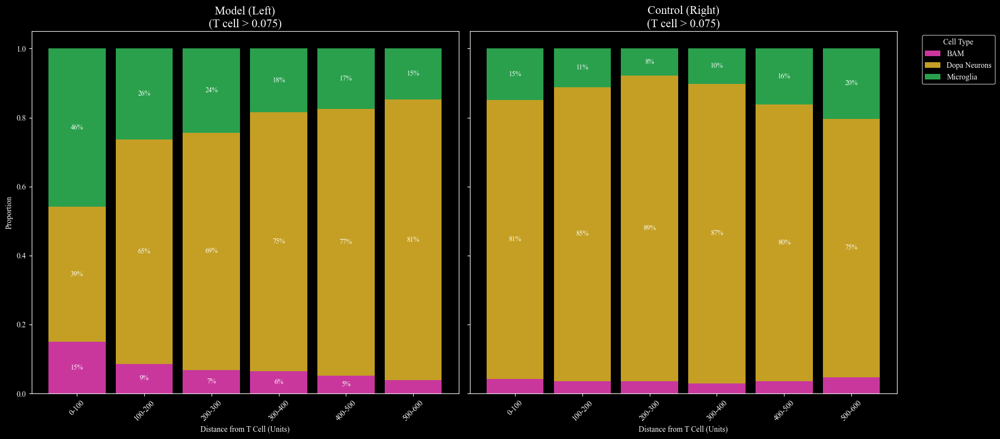

In [ ]:
from config import ROI_LEFT_BOX, ROI_RIGHT_BOX
from utils import get_spatial_xy, get_roi_masks
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
from scipy.spatial import KDTree

# === 1. 参数设置 ===
threshold = 0.075  # T细胞锚点阈值
step = 100
max_dist = 600
rings = [(i, i + step) for i in range(0, max_dist, step)] # [(0,100), (100,200)...]

# 目标中心 (T细胞)
# 自动查找列名
t_cell_col = 'q05_cell_abundance_w_sf_1201 T cells NN_4'
if t_cell_col not in adata.obs.columns:
    matches = [c for c in adata.obs.columns if 'T cells' in c]
    if matches: t_cell_col = matches[0]

# 定义要分析的三种细胞 (只看这三者)
target_groups = {
    'Microglia': ['Microglia'],
    'Dopa Neurons': ['SNc-VTA', 'Dopa'],
    'BAM': ['BAM']
}

# 自动映射列名
target_cols = {}
for group, keys in target_groups.items():
    found_cols = []
    for k in keys:
        found_cols.extend([c for c in adata.obs.columns if k in c])
    # 过滤掉不需要的 (如 Astro, MOL)
    clean_cols = [c for c in found_cols if not any(x in c for x in ['Astro', 'MOL', 'OPC'])]
    if clean_cols:
        target_cols[group] = list(set(clean_cols))

print(f"分析对象: {list(target_cols.keys())}")
print(f"距离范围: 0 - {max_dist}, 步长: {step}")

# === 2. 定义 ROI ===
x, y = get_spatial_xy(adata)
mask_L, mask_R = get_roi_masks(x, y, ROI_LEFT_BOX, ROI_RIGHT_BOX)
roi_masks = {'Model (Left)': mask_L, 'Control (Right)': mask_R}

# === 3. 核心计算 ===
plot_data = []

print(f"\n开始空间梯度计算 (T cell > {threshold})...")

for region, mask in roi_masks.items():
    region_obs = adata.obs[mask]
    
    # 找到中心点
    center_mask = region_obs[t_cell_col].values > threshold
    centers = region_coords[center_mask]
    
    if len(centers) == 0:
        print(f"  {region}: 无 T 细胞中心点，跳过。")
        continue
    
    print(f"  {region}: {len(centers)} 个中心点, 正在扫描 {len(rings)} 个圈层...")
    
    tree = KDTree(region_coords)
    
    for r_min, r_max in rings:
        # 搜索 r_max 范围内的点
        indices_list = tree.query_ball_point(centers, r_max)
        
        # 统计该圈层的细胞总数
        layer_counts = {k: 0.0 for k in target_groups.keys()}
        
        for i, idxs in enumerate(indices_list):
            if not idxs: continue
            
            # 距离过滤
            neighbors_coords = region_coords[idxs]
            dists = np.linalg.norm(neighbors_coords - centers[i], axis=1)
            
            ring_mask = (dists > r_min) & (dists <= r_max)
            if r_min == 0: ring_mask = (dists >= 0) & (dists <= r_max)
            
            valid_idxs = np.array(idxs)[ring_mask]
            
            if len(valid_idxs) > 0:
                for group, cols in target_cols.items():
                    val = region_obs.iloc[valid_idxs][cols].sum(axis=1).sum()
                    layer_counts[group] += val
        
        # 记录数据
        row = layer_counts.copy()
        row['Region'] = region
        row['Distance'] = f"{r_min}-{r_max}"
        # 增加一个纯数字的 Distance 用于排序
        row['Dist_Sort'] = r_min 
        plot_data.append(row)

# === 4. 数据整理与绘图 ===
df = pd.DataFrame(plot_data)

if len(df) > 0:
    cell_cols = list(target_cols.keys())
    
    # 转换长表
    df_melt = df.melt(id_vars=['Region', 'Distance', 'Dist_Sort'], 
                      value_vars=cell_cols, 
                      var_name='Cell Type', value_name='Abundance')
    
    # 计算相对比例 (只在 Microglia, Dopa, BAM 三者之间归一化)
    df_melt['Proportion'] = df_melt.groupby(['Region', 'Distance'])['Abundance'].transform(lambda x: x / x.sum())
    
    # 绘图设置
    plt.style.use('dark_background')
    fig, axes = plt.subplots(1, 2, figsize=(18, 8), sharey=True)
    
    regions = ['Model (Left)', 'Control (Right)']
    
    for i, reg in enumerate(regions):
        ax = axes[i]
        subset = df_melt[df_melt['Region'] == reg].copy()
        
        if len(subset) == 0: continue
        
        # 透视表 (Index=Distance, Columns=Cell Type)
        pivot_df = subset.pivot(index='Distance', columns='Cell Type', values='Proportion')
        
        # 按距离排序
        # 重新索引以确保 0-100 在最下面/最左边
        sorted_index = sorted(pivot_df.index, key=lambda x: int(x.split('-')[0]))
        pivot_df = pivot_df.reindex(sorted_index)
        
        # 绘制堆叠图
        # 颜色建议：Microglia=红色(炎症), Dopa=绿色(神经元), BAM=黄色(边界)
        colors = {'Microglia': "#2aa04d", 'Dopa Neurons': "#c49f24", 'BAM': "#c9379d"}
        color_list = [colors.get(c, '#7f7f7f') for c in pivot_df.columns]
        
        pivot_df.plot(kind='bar', stacked=True, ax=ax, color=color_list, width=0.85)
        
        ax.set_title(f'{reg}\n(T cell > {threshold})', fontsize=15)
        ax.set_xlabel('Distance from T Cell (Units)')
        ax.set_ylabel('Proportion')
        ax.tick_params(axis='x', rotation=45)
        
        # 图例只在第二个图显示
        if i == 1:
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Cell Type')
        else:
            ax.get_legend().remove()
            
        # 标注数值
        for p in ax.patches:
            h = p.get_height()
            w = p.get_width()
            x, y = p.get_xy()
            if h > 0.05:
                ax.text(x+w/2, y+h/2, f"{h:.0%}", ha='center', va='center', fontsize=9, color='white', fontweight='bold')

    plt.tight_layout()
    plt.savefig('Spatial_Gradient_0_600.png', dpi=300)
    print("\n图表已保存: Spatial_Gradient_0_600.png")
    
    print("\n【比例数据预览 (Model)】")
    print(df_melt[df_melt['Region']=='Model (Left)'].pivot(index='Distance', columns='Cell Type', values='Proportion').reindex(sorted_index))
else:
    print("未生成数据，请检查阈值。")


分析对象: ['Microglia', 'Dopa Neurons', 'BAM', 'Astrocytes']
距离范围: 0 - 600, 步长: 100

开始空间梯度计算 (T cell > 0.07)...
  Model (Left): 62 个中心点...
  Control (Right): 35 个中心点...

图表已保存: Spatial_Gradient_0_600_WithAstro.png

【比例数据预览 (Model)】
Cell Type  Astrocytes  BAM  Dopa Neurons  Microglia
Distance                                           
0-100            0.92 0.01          0.03       0.04
100-200          0.87 0.01          0.08       0.03
200-300          0.86 0.01          0.09       0.03
300-400          0.84 0.01          0.12       0.03
400-500          0.81 0.01          0.15       0.03
500-600          0.79 0.01          0.17       0.03


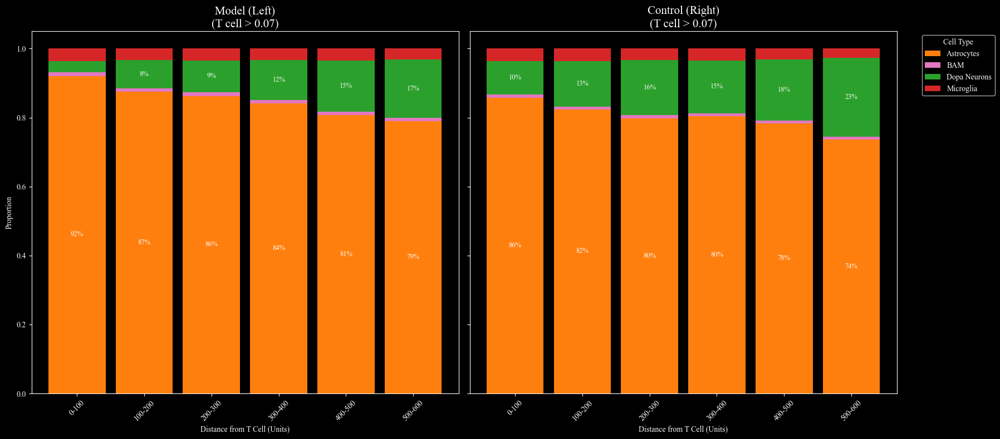

In [ ]:
from config import ROI_LEFT_BOX, ROI_RIGHT_BOX
from utils import get_spatial_xy, get_roi_masks
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
from scipy.spatial import KDTree

# === 1. 参数设置 ===
threshold = 0.07  # T细胞锚点阈值
step = 100
max_dist = 600
rings = [(i, i + step) for i in range(0, max_dist, step)] 

# 自动查找 T 细胞列名
t_cell_col = 'q05_cell_abundance_w_sf_1201 T cells NN_4'
if t_cell_col not in adata.obs.columns:
    matches = [c for c in adata.obs.columns if 'T cells' in c]
    if matches: t_cell_col = matches[0]

# === 2. 定义分析细胞组 (加入 Astrocytes) ===
target_groups = {
    'Microglia': ['Microglia'],
    'Dopa Neurons': ['SNc-VTA', 'Dopa'],
    'BAM': ['BAM'],
    'Astrocytes': ['Astro']  # <--- 新增
}

# 自动映射列名
target_cols = {}
for group, keys in target_groups.items():
    found_cols = []
    for k in keys:
        found_cols.extend([c for c in adata.obs.columns if k in c])
    
    # 过滤规则：现在只排除 MOL 和 OPC，保留 Astro
    clean_cols = [c for c in found_cols if not any(x in c for x in ['MOL', 'OPC'])]
    
    if clean_cols:
        target_cols[group] = list(set(clean_cols))

print(f"分析对象: {list(target_cols.keys())}")
print(f"距离范围: 0 - {max_dist}, 步长: {step}")

# === 3. 定义 ROI ===
x, y = get_spatial_xy(adata)
mask_L, mask_R = get_roi_masks(x, y, ROI_LEFT_BOX, ROI_RIGHT_BOX)
roi_masks = {'Model (Left)': mask_L, 'Control (Right)': mask_R}

# === 4. 核心计算 ===
plot_data = []

print(f"\n开始空间梯度计算 (T cell > {threshold})...")

for region, mask in roi_masks.items():
    region_obs = adata.obs[mask]
    
    # 找到中心点
    center_mask = region_obs[t_cell_col].values > threshold
    centers = region_coords[center_mask]
    
    if len(centers) == 0:
        continue
    
    print(f"  {region}: {len(centers)} 个中心点...")
    tree = KDTree(region_coords)
    
    for r_min, r_max in rings:
        indices_list = tree.query_ball_point(centers, r_max)
        
        layer_counts = {k: 0.0 for k in target_groups.keys()}
        
        for i, idxs in enumerate(indices_list):
            if not idxs: continue
            
            neighbors_coords = region_coords[idxs]
            dists = np.linalg.norm(neighbors_coords - centers[i], axis=1)
            
            # 环形过滤
            ring_mask = (dists > r_min) & (dists <= r_max)
            if r_min == 0: ring_mask = (dists >= 0) & (dists <= r_max)
            
            valid_idxs = np.array(idxs)[ring_mask]
            
            if len(valid_idxs) > 0:
                for group, cols in target_cols.items():
                    val = region_obs.iloc[valid_idxs][cols].sum(axis=1).sum()
                    layer_counts[group] += val
        
        row = layer_counts.copy()
        row['Region'] = region
        row['Distance'] = f"{r_min}-{r_max}"
        row['Dist_Sort'] = r_min 
        plot_data.append(row)

# === 5. 绘图 ===
df = pd.DataFrame(plot_data)

if len(df) > 0:
    cell_cols = list(target_cols.keys())
    df_melt = df.melt(id_vars=['Region', 'Distance', 'Dist_Sort'], 
                      value_vars=cell_cols, 
                      var_name='Cell Type', value_name='Abundance')
    
    # 计算相对比例
    df_melt['Proportion'] = df_melt.groupby(['Region', 'Distance'])['Abundance'].transform(lambda x: x / x.sum())
    
    plt.style.use('dark_background')
    fig, axes = plt.subplots(1, 2, figsize=(18, 8), sharey=True)
    regions = ['Model (Left)', 'Control (Right)']
    
    # 颜色映射 (加入星胶为橙色)
    colors = {
        'Microglia': '#d62728',    # 红 (炎)
        'Dopa Neurons': '#2ca02c', # 绿 (神经元)
        'BAM': '#e377c2',          # 粉 (边界)
        'Astrocytes': '#ff7f0e'    # 橙 (星胶/瘢痕)
    }
    
    for i, reg in enumerate(regions):
        ax = axes[i]
        subset = df_melt[df_melt['Region'] == reg].copy()
        
        if len(subset) == 0: continue
        
        pivot_df = subset.pivot(index='Distance', columns='Cell Type', values='Proportion')
        sorted_index = sorted(pivot_df.index, key=lambda x: int(x.split('-')[0]))
        pivot_df = pivot_df.reindex(sorted_index)
        
        # 确保颜色顺序对应
        color_list = [colors.get(c, '#7f7f7f') for c in pivot_df.columns]
        
        pivot_df.plot(kind='bar', stacked=True, ax=ax, color=color_list, width=0.85)
        
        ax.set_title(f'{reg}\n(T cell > {threshold})', fontsize=15)
        ax.set_xlabel('Distance from T Cell (Units)')
        ax.set_ylabel('Proportion')
        ax.tick_params(axis='x', rotation=45)
        
        if i == 1:
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Cell Type')
        else:
            ax.get_legend().remove()
            
        for p in ax.patches:
            h, w, x, y = p.get_height(), p.get_width(), p.get_xy()[0], p.get_xy()[1]
            if h > 0.05:
                ax.text(x+w/2, y+h/2, f"{h:.0%}", ha='center', va='center', fontsize=9, color='white', fontweight='bold')

    plt.tight_layout()
    plt.savefig('Spatial_Gradient_0_600_WithAstro.png', dpi=300)
    print("\n图表已保存: Spatial_Gradient_0_600_WithAstro.png")
    
    print("\n【比例数据预览 (Model)】")
    print(df_melt[df_melt['Region']=='Model (Left)'].pivot(index='Distance', columns='Cell Type', values='Proportion').reindex(sorted_index))
else:
    print("未生成数据。")


分析组分: ['Dopa Neurons', 'Microglia', 'NK cells', 'B cells', 'DC', 'BAM']

开始空间梯度计算...
  Model (Left): 扫描 35 个热点区域...
  Control (Right): 扫描 17 个热点区域...

图表已保存: Spatial_Immune_Gradient_Detailed.png

【Model 侧核心战区 (0-100) 免疫构成】
       Cell Type  Proportion
12     Microglia        0.32
0   Dopa Neurons        0.27
48            DC        0.17
60           BAM        0.10
24      NK cells        0.07
36       B cells        0.06


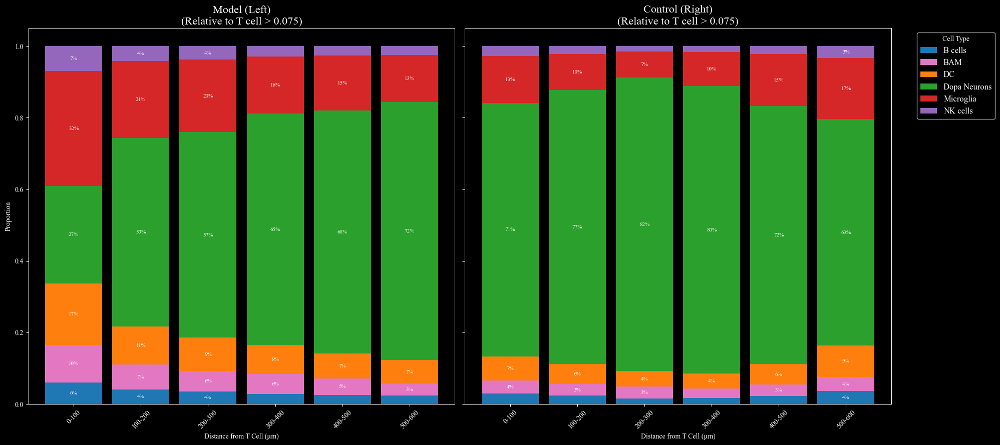

In [ ]:
from config import ROI_LEFT_BOX, ROI_RIGHT_BOX
from utils import get_spatial_xy, get_roi_masks
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
from scipy.spatial import KDTree

# === 1. 参数设置 ===
threshold = 0.075  # T细胞锚点阈值
step = 100
max_dist = 600
rings = [(i, i + step) for i in range(0, max_dist, step)] 

# 自动查找 T 细胞列
t_cell_col = 'q05_cell_abundance_w_sf_1201 T cells NN_4'
if t_cell_col not in adata.obs.columns:
    matches = [c for c in adata.obs.columns if 'T cells' in c]
    if matches: t_cell_col = matches[0]

# === 2. 定义细胞组 (细分免疫类型，保留Dopa，去除胶质) ===
target_groups = {
    # 受害者
    'Dopa Neurons': ['SNc-VTA', 'Dopa'],
    # 免疫大军 (细分)
    'Microglia': ['Microglia'],   # 主力
    'NK cells': ['NK cells'],     # 杀伤辅助
    'B cells': ['B cells'],       # 抗体/呈递
    'DC': ['DC'],                 # 树突状细胞 (指挥)
    'BAM': ['BAM']                # 边界巨噬细胞
}

# 自动映射列名 & 清洗
target_cols = {}
for group, keys in target_groups.items():
    found_cols = []
    for k in keys:
        found_cols.extend([c for c in adata.obs.columns if k in c])
    
    # 严格过滤：绝对不要 Astro, MOL, OPC
    clean_cols = [c for c in found_cols if not any(x in c for x in ['Astro', 'MOL', 'OPC'])]
    
    # 额外过滤：防止 T cell 自己混进 immune 组 (如果我们想看 T cell 周围的其他成分)
    clean_cols = [c for c in clean_cols if 'T cells' not in c] 

    if clean_cols:
        target_cols[group] = list(set(clean_cols))

print(f"分析组分: {list(target_cols.keys())}")

# === 3. 定义 ROI ===
x, y = get_spatial_xy(adata)
mask_L, mask_R = get_roi_masks(x, y, ROI_LEFT_BOX, ROI_RIGHT_BOX)
roi_masks = {'Model (Left)': mask_L, 'Control (Right)': mask_R}

# === 4. 核心计算循环 ===
plot_data = []
print(f"\n开始空间梯度计算...")

for region, mask in roi_masks.items():
    region_obs = adata.obs[mask]
    
    # 中心点: T cells > threshold
    center_mask = region_obs[t_cell_col].values > threshold
    centers = region_coords[center_mask]
    
    if len(centers) == 0:
        continue
    
    print(f"  {region}: 扫描 {len(centers)} 个热点区域...")
    tree = KDTree(region_coords)
    
    for r_min, r_max in rings:
        # 搜索
        indices_list = tree.query_ball_point(centers, r_max)
        
        layer_counts = {k: 0.0 for k in target_groups.keys()}
        
        for i, idxs in enumerate(indices_list):
            if not idxs: continue
            
            # 距离过滤
            neighbors_coords = region_coords[idxs]
            dists = np.linalg.norm(neighbors_coords - centers[i], axis=1)
            
            ring_mask = (dists > r_min) & (dists <= r_max)
            if r_min == 0: ring_mask = (dists >= 0) & (dists <= r_max)
            
            valid_idxs = np.array(idxs)[ring_mask]
            
            if len(valid_idxs) > 0:
                for group, cols in target_cols.items():
                    val = region_obs.iloc[valid_idxs][cols].sum(axis=1).sum()
                    layer_counts[group] += val
        
        row = layer_counts.copy()
        row['Region'] = region
        row['Distance'] = f"{r_min}-{r_max}"
        row['Dist_Sort'] = r_min 
        plot_data.append(row)

# === 5. 绘图 (高对比度配色) ===
df = pd.DataFrame(plot_data)

if len(df) > 0:
    cell_cols = list(target_cols.keys())
    df_melt = df.melt(id_vars=['Region', 'Distance', 'Dist_Sort'], 
                      value_vars=cell_cols, 
                      var_name='Cell Type', value_name='Abundance')
    
    # 计算比例
    df_melt['Proportion'] = df_melt.groupby(['Region', 'Distance'])['Abundance'].transform(lambda x: x / x.sum())
    
    plt.style.use('dark_background')
    fig, axes = plt.subplots(1, 2, figsize=(20, 9), sharey=True)
    regions = ['Model (Left)', 'Control (Right)']
    
    # === 自定义配色方案 (分散且高对比) ===
    # 绿色系留给 Dopa (受害者)
    # 红色/暖色系留给 核心炎症 (Microglia, DC)
    # 冷色/紫色系留给 辅助免疫 (NK, B, BAM)
    custom_colors = {
        'Dopa Neurons': '#2ca02c',  # 鲜绿 (幸存者)
        
        'Microglia': '#d62728',     # 鲜红 (主力)
        'DC': '#ff7f0e',            # 橙色 (指挥)
        
        'NK cells': '#9467bd',      # 紫色 (杀伤)
        'B cells': '#1f77b4',       # 蓝色 (抗体)
        'BAM': '#e377c2'            # 粉色 (边界)
    }
    
    for i, reg in enumerate(regions):
        ax = axes[i]
        subset = df_melt[df_melt['Region'] == reg].copy()
        
        if len(subset) == 0: continue
        
        pivot_df = subset.pivot(index='Distance', columns='Cell Type', values='Proportion')
        
        # 排序：确保 0-100 在最左/下
        sorted_index = sorted(pivot_df.index, key=lambda x: int(x.split('-')[0]))
        pivot_df = pivot_df.reindex(sorted_index)
        
        # 应用颜色
        color_list = [custom_colors.get(c, '#7f7f7f') for c in pivot_df.columns]
        
        pivot_df.plot(kind='bar', stacked=True, ax=ax, color=color_list, width=0.85)
        
        ax.set_title(f'{reg}\n(Relative to T cell > {threshold})', fontsize=16)
        ax.set_xlabel('Distance from T Cell (µm)')
        ax.set_ylabel('Proportion')
        ax.tick_params(axis='x', rotation=45)
        
        if i == 1:
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Cell Type', fontsize=12)
        else:
            ax.get_legend().remove()
            
        # 标注 (只标 > 3% 的，防止太乱)
        for p in ax.patches:
            h, w, x, y = p.get_height(), p.get_width(), p.get_xy()[0], p.get_xy()[1]
            if h > 0.03: 
                ax.text(x+w/2, y+h/2, f"{h:.0%}", ha='center', va='center', fontsize=8, color='white', fontweight='bold')

    plt.tight_layout()
    plt.savefig('Spatial_Immune_Gradient_Detailed.png', dpi=300)
    print("\n图表已保存: Spatial_Immune_Gradient_Detailed.png")
    
    # 打印 Model 侧 0-100 的核心区数据
    print("\n【Model 侧核心战区 (0-100) 免疫构成】")
    core_data = df_melt[(df_melt['Region']=='Model (Left)') & (df_melt['Distance']=='0-100')]
    print(core_data[['Cell Type', 'Proportion']].sort_values('Proportion', ascending=False))
    
else:
    print("未生成数据。")


分析组分: ['Dopa Neurons', 'Microglia', 'NK cells', 'B cells', 'DC', 'BAM']

开始空间梯度计算 (Step=100 units = 50.0 µm)...
  Model (Left): 扫描 35 个热点区域...
  Control (Right): 扫描 17 个热点区域...

图表已保存: Spatial_Immune_Gradient_50um.png

【Model 侧核心战区 (0-50 µm) 免疫构成】
       Cell Type  Proportion
12     Microglia        0.32
0   Dopa Neurons        0.27
48            DC        0.17
60           BAM        0.10
24      NK cells        0.07
36       B cells        0.06


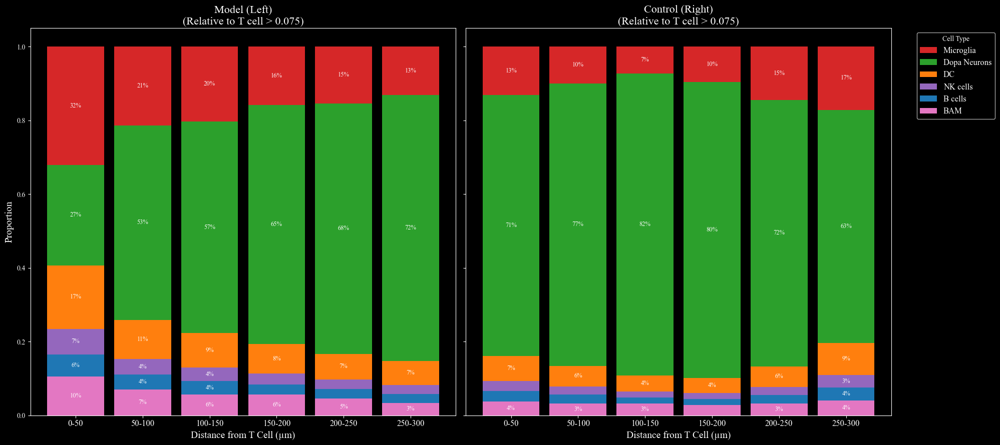

In [ ]:
from config import ROI_LEFT_BOX, ROI_RIGHT_BOX
from utils import get_spatial_xy, get_roi_masks
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
from scipy.spatial import KDTree

# === 1. 参数设置 ===
threshold = 0.075  # T细胞锚点阈值
step = 100         # <--- 逻辑步长：保持 100 units
max_dist = 600     # 扫描范围 (units)，比如 600 units = 300 um
rings = [(i, i + step) for i in range(0, max_dist, step)] 

# 物理距离转换因子 (100 units = 50 um -> 1 unit = 0.5 um)
um_conversion = 0.5 

# 自动查找 T 细胞列
t_cell_col = 'q05_cell_abundance_w_sf_1201 T cells NN_4'
if t_cell_col not in adata.obs.columns:
    matches = [c for c in adata.obs.columns if 'T cells' in c]
    if matches: t_cell_col = matches[0]

# === 2. 定义细胞组 (保持您的分组) ===
target_groups = {
    'Dopa Neurons': ['SNc-VTA', 'Dopa'],
    'Microglia': ['Microglia'],
    'NK cells': ['NK cells'],
    'B cells': ['B cells'],
    'DC': ['DC'],
    'BAM': ['BAM']
}

# 自动映射列名 & 清洗
target_cols = {}
for group, keys in target_groups.items():
    found_cols = []
    for k in keys:
        found_cols.extend([c for c in adata.obs.columns if k in c])
    clean_cols = [c for c in found_cols if not any(x in c for x in ['Astro', 'MOL', 'OPC'])]
    clean_cols = [c for c in clean_cols if 'T cells' not in c] 
    if clean_cols:
        target_cols[group] = list(set(clean_cols))

print(f"分析组分: {list(target_cols.keys())}")

# === 3. 定义 ROI ===
x, y = get_spatial_xy(adata)
mask_L, mask_R = get_roi_masks(x, y, ROI_LEFT_BOX, ROI_RIGHT_BOX)
roi_masks = {'Model (Left)': mask_L, 'Control (Right)': mask_R}

# === 4. 核心计算循环 ===
plot_data = []
print(f"\n开始空间梯度计算 (Step={step} units = {step*um_conversion} µm)...")

for region, mask in roi_masks.items():
    region_obs = adata.obs[mask]
    
    # 中心点
    center_mask = region_obs[t_cell_col].values > threshold
    centers = region_coords[center_mask]
    
    if len(centers) == 0:
        continue
    
    print(f"  {region}: 扫描 {len(centers)} 个热点区域...")
    tree = KDTree(region_coords)
    
    for r_min, r_max in rings:
        # KDTree 搜索 (使用原始 units)
        indices_list = tree.query_ball_point(centers, r_max)
        
        layer_counts = {k: 0.0 for k in target_groups.keys()}
        
        for i, idxs in enumerate(indices_list):
            if not idxs: continue
            
            neighbors_coords = region_coords[idxs]
            dists = np.linalg.norm(neighbors_coords - centers[i], axis=1)
            
            # 距离过滤
            ring_mask = (dists > r_min) & (dists <= r_max)
            if r_min == 0: ring_mask = (dists >= 0) & (dists <= r_max)
            
            valid_idxs = np.array(idxs)[ring_mask]
            
            if len(valid_idxs) > 0:
                for group, cols in target_cols.items():
                    val = region_obs.iloc[valid_idxs][cols].sum(axis=1).sum()
                    layer_counts[group] += val
        
        row = layer_counts.copy()
        row['Region'] = region
        
        # === 关键修改：标签转换为 µm ===
        # 例如 0-100 unit -> "0-50"
        dist_label = f"{int(r_min * um_conversion)}-{int(r_max * um_conversion)}"
        row['Distance'] = dist_label
        
        # 排序还是用 r_min (数值) 比较方便
        row['Dist_Sort'] = r_min 
        plot_data.append(row)

# === 5. 绘图 (标签显示为 µm) ===
df = pd.DataFrame(plot_data)

if len(df) > 0:
    cell_cols = list(target_cols.keys())
    df_melt = df.melt(id_vars=['Region', 'Distance', 'Dist_Sort'], 
                      value_vars=cell_cols, 
                      var_name='Cell Type', value_name='Abundance')
    
    # 计算比例
    df_melt['Proportion'] = df_melt.groupby(['Region', 'Distance'])['Abundance'].transform(lambda x: x / x.sum())
    
    plt.style.use('dark_background')
    fig, axes = plt.subplots(1, 2, figsize=(20, 9), sharey=True)
    regions = ['Model (Left)', 'Control (Right)']
    
    # === 配色 ===
    custom_colors = {
        'Microglia': '#d62728',     # 鲜红
        'Dopa Neurons': '#2ca02c',  # 鲜绿
        'DC': '#ff7f0e',            # 橙色
        'NK cells': '#9467bd',      # 紫色
        'B cells': '#1f77b4',       # 蓝色
        'BAM': '#e377c2'            # 粉色
    }

    # === 堆叠顺序 (从下到上: 其他 -> Dopa -> Microglia) ===
    stack_order_bottom_to_top = ['BAM', 'B cells', 'NK cells', 'DC', 'Dopa Neurons', 'Microglia']

    for i, reg in enumerate(regions):
        ax = axes[i]
        subset = df_melt[df_melt['Region'] == reg].copy()
        
        if len(subset) == 0: continue
        
        pivot_df = subset.pivot(index='Distance', columns='Cell Type', values='Proportion')
        
        # 排序 (按 Dist_Sort 里的原始 unit 数值排序，保证顺序正确)
        # 我们需要从 df 中提取 mapping 关系，因为 pivot 后 Dist_Sort 没了
        # 这里直接解析 Distance 字符串的第一个数字来排序 "0-50", "50-100"
        sorted_index = sorted(pivot_df.index, key=lambda x: int(x.split('-')[0]))
        pivot_df = pivot_df.reindex(sorted_index)
        
        # 堆叠列排序
        current_stack_order = [c for c in stack_order_bottom_to_top if c in pivot_df.columns]
        remaining = [c for c in pivot_df.columns if c not in current_stack_order]
        final_order = remaining + current_stack_order
        pivot_df = pivot_df[final_order]
        
        # 颜色
        color_list = [custom_colors.get(c, '#7f7f7f') for c in pivot_df.columns]
        
        pivot_df.plot(kind='bar', stacked=True, ax=ax, color=color_list, width=0.85)
        
        ax.set_title(f'{reg}\n(Relative to T cell > {threshold})', fontsize=16)
        
        # === X轴标签修改 ===
        ax.set_xlabel('Distance from T Cell (µm)', fontsize=14) 
        ax.set_ylabel('Proportion', fontsize=14)
        ax.tick_params(axis='x', rotation=0, labelsize=12)
        
        if i == 1:
            handles, labels = ax.get_legend_handles_labels()
            ax.legend(handles[::-1], labels[::-1], bbox_to_anchor=(1.05, 1), loc='upper left', title='Cell Type', fontsize=12)
        else:
            ax.get_legend().remove()
            
        # 标注
        for p in ax.patches:
            h, w, x, y = p.get_height(), p.get_width(), p.get_xy()[0], p.get_xy()[1]
            if h > 0.03: 
                ax.text(x+w/2, y+h/2, f"{h:.0%}", ha='center', va='center', fontsize=9, color='white', fontweight='bold')

    plt.tight_layout()
    plt.savefig('Spatial_Immune_Gradient_50um.png', dpi=300)
    print("\n图表已保存: Spatial_Immune_Gradient_50um.png")
    
    # 打印 Model 侧核心区 (0-50um) 数据
    print("\n【Model 侧核心战区 (0-50 µm) 免疫构成】")
    core_data = df_melt[(df_melt['Region']=='Model (Left)') & (df_melt['Distance']=='0-50')]
    print(core_data[['Cell Type', 'Proportion']].sort_values('Proportion', ascending=False))

else:
    print("未生成数据。")


Matplotlib will use font: Times New Roman
开始计算...

✅ 输出完成 (Times New Roman 字体已修复):
1. Spatial_Immune_Gradient_RefColors_FixedFont.pdf
2. Spatial_Immune_Gradient_RefColors_FixedFont.png


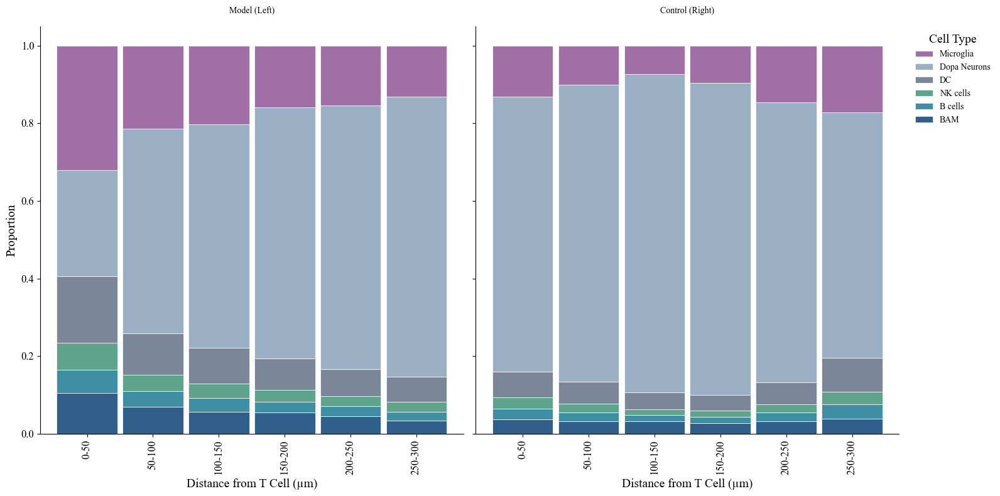

In [ ]:
from config import ROI_LEFT_BOX, ROI_RIGHT_BOX
from utils import get_spatial_xy, get_roi_masks
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
from scipy.spatial import KDTree

# =========================
# 0) 强制使用本地 times.ttf
# =========================
plt.style.use("default")  # 一次就够，且必须在 rcParams 前

TNR_TTF = "/home/yuanyanyao/Downloads/数据/DATA_T_CSF_PBMC/times-new-roman/times.ttf"
if not os.path.exists(TNR_TTF):
    raise FileNotFoundError(f"Cannot find font file: {TNR_TTF}")

# 把字体注册进 matplotlib（本进程有效）
fm.fontManager.addfont(TNR_TTF)
prop = fm.FontProperties(fname=TNR_TTF)
font_name = prop.get_name()
print("Matplotlib will use font:", font_name)

# 全局默认字体（后面不写 fontproperties 也会走这个）
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.serif"] = [font_name]
plt.rcParams["axes.unicode_minus"] = False
plt.rcParams["pdf.fonttype"] = 42
plt.rcParams["ps.fonttype"] = 42

# === 1. 参数设置 ===
threshold = 0.075  
step = 100         
max_dist = 600     
rings = [(i, i + step) for i in range(0, max_dist, step)] 
um_conversion = 0.5 

# 自动查找 T 细胞列
t_cell_col = 'q05_cell_abundance_w_sf_1201 T cells NN_4'
if t_cell_col not in adata.obs.columns:
    matches = [c for c in adata.obs.columns if 'T cells' in c]
    if matches: t_cell_col = matches[0]

# === 2. 定义细胞组 ===
target_groups = {
    'Dopa Neurons': ['SNc-VTA', 'Dopa'],
    'Microglia': ['Microglia'],
    'NK cells': ['NK cells'],
    'B cells': ['B cells'],
    'DC': ['DC'],
    'BAM': ['BAM']
}

target_cols = {}
for group, keys in target_groups.items():
    found_cols = []
    for k in keys:
        found_cols.extend([c for c in adata.obs.columns if k in c])
    clean_cols = [c for c in found_cols if not any(x in c for x in ['Astro', 'MOL', 'OPC'])]
    clean_cols = [c for c in clean_cols if 'T cells' not in c] 
    if clean_cols:
        target_cols[group] = list(set(clean_cols))

# === 3. 定义 ROI ===
x, y = get_spatial_xy(adata)
mask_L, mask_R = get_roi_masks(x, y, ROI_LEFT_BOX, ROI_RIGHT_BOX)
roi_masks = {'Model (Left)': mask_L, 'Control (Right)': mask_R}

# === 4. 计算循环 ===
plot_data = []
print(f"开始计算...")

for region, mask in roi_masks.items():
    region_obs = adata.obs[mask]
    center_mask = region_obs[t_cell_col].values > threshold
    centers = region_coords[center_mask]
    
    if len(centers) == 0: continue
    
    tree = KDTree(region_coords)
    
    for r_min, r_max in rings:
        indices_list = tree.query_ball_point(centers, r_max)
        layer_counts = {k: 0.0 for k in target_groups.keys()}
        
        for i, idxs in enumerate(indices_list):
            if not idxs: continue
            neighbors_coords = region_coords[idxs]
            dists = np.linalg.norm(neighbors_coords - centers[i], axis=1)
            ring_mask = (dists > r_min) & (dists <= r_max)
            if r_min == 0: ring_mask = (dists >= 0) & (dists <= r_max)
            
            valid_idxs = np.array(idxs)[ring_mask]
            if len(valid_idxs) > 0:
                for group, cols in target_cols.items():
                    val = region_obs.iloc[valid_idxs][cols].sum(axis=1).sum()
                    layer_counts[group] += val
        
        row = layer_counts.copy()
        row['Region'] = region
        dist_label = f"{int(r_min * um_conversion)}-{int(r_max * um_conversion)}"
        row['Distance'] = dist_label
        row['Dist_Sort'] = r_min 
        plot_data.append(row)

# === 5. 绘图 (仿参考图配色 + 强制字体) ===
df = pd.DataFrame(plot_data)

if len(df) > 0:
    cell_cols = list(target_cols.keys())
    df_melt = df.melt(id_vars=['Region', 'Distance', 'Dist_Sort'], 
                      value_vars=cell_cols, 
                      var_name='Cell Type', value_name='Abundance')
    
    df_melt['Proportion'] = df_melt.groupby(['Region', 'Distance'])['Abundance'].transform(lambda x: x / x.sum())
    
    # 颜色映射 (仿参考图)
    colors_from_img = {
        'Orange': '#A06FA6',   # Microglia
        'Red': '#9AAFC4',      # Dopa
        'Purple': '#7C8699',   # DC
        'Green': '#5FA38C',    # NK
        'Teal': '#3E8FA3',     # B cells
        'Blue': '#2F5F8A'      # BAM
    }

    custom_palette = {
        'Microglia': colors_from_img['Orange'],
        'Dopa Neurons': colors_from_img['Red'],
        'DC': colors_from_img['Purple'],
        'NK cells': colors_from_img['Green'],
        'B cells': colors_from_img['Teal'],
        'BAM': colors_from_img['Blue']
    }

    stack_order = ['BAM', 'B cells', 'NK cells', 'DC', 'Dopa Neurons', 'Microglia']

    # 创建画布
    plt.style.use('default') 
    fig, axes = plt.subplots(1, 2, figsize=(16, 8), sharey=True)
    regions = ['Model (Left)', 'Control (Right)']
    
    for i, reg in enumerate(regions):
        ax = axes[i]
        subset = df_melt[df_melt['Region'] == reg].copy()
        if len(subset) == 0: continue
        
        pivot_df = subset.pivot(index='Distance', columns='Cell Type', values='Proportion')
        
        sorted_index = sorted(pivot_df.index, key=lambda x: int(x.split('-')[0]))
        pivot_df = pivot_df.reindex(sorted_index)
        
        current_stack = [c for c in stack_order if c in pivot_df.columns]
        rem = [c for c in pivot_df.columns if c not in current_stack]
        final_order = rem + current_stack
        pivot_df = pivot_df[final_order]
        
        color_list = [custom_palette.get(c, '#333333') for c in pivot_df.columns]
        
        pivot_df.plot(kind='bar', stacked=True, ax=ax, color=color_list, width=0.92, edgecolor='white', linewidth=0.5)
        
        # === 关键：手动应用字体 ===
        ax.set_title(f'{reg}', fontsize=18, fontproperties=prop, pad=15)
        ax.set_xlabel('Distance from T Cell (µm)', fontsize=14, fontproperties=prop)
        
        if i == 0:
            ax.set_ylabel('Proportion', fontsize=14, fontproperties=prop)
        else:
            ax.set_ylabel('')
            
        # 设置刻度字体
        for label in ax.get_xticklabels() + ax.get_yticklabels():
            label.set_fontproperties(prop)
            label.set_fontsize(12)
        
        if i == 1:
            handles, labels = ax.get_legend_handles_labels()
            leg = ax.legend(handles[::-1], labels[::-1], bbox_to_anchor=(1.02, 1), 
                            loc='upper left', title='Cell Type', 
                            prop=prop, frameon=False)
            leg.get_title().set_fontproperties(prop)
            leg.get_title().set_fontsize(14)
            # 设置图例内容字体
            for text in leg.get_texts():
                text.set_fontproperties(prop)
        else:
            ax.get_legend().remove()
            
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

    plt.tight_layout()
    
    # 保存
    plt.savefig('Spatial_Immune_Gradient_RefColors_FixedFont.pdf', format='pdf', bbox_inches='tight')
    plt.savefig('Spatial_Immune_Gradient_RefColors_FixedFont.png', dpi=600, bbox_inches='tight')
    
    print("\n✅ 输出完成 (Times New Roman 字体已修复):")
    print("1. Spatial_Immune_Gradient_RefColors_FixedFont.pdf")
    print("2. Spatial_Immune_Gradient_RefColors_FixedFont.png")

else:
    print("未生成数据")


Matplotlib will use font: Times New Roman
开始计算...

✅ 输出完成 (字体已加大，X轴为单一距离值):
1. Spatial_Immune_Gradient_BigFont.pdf
2. Spatial_Immune_Gradient_BigFont.png


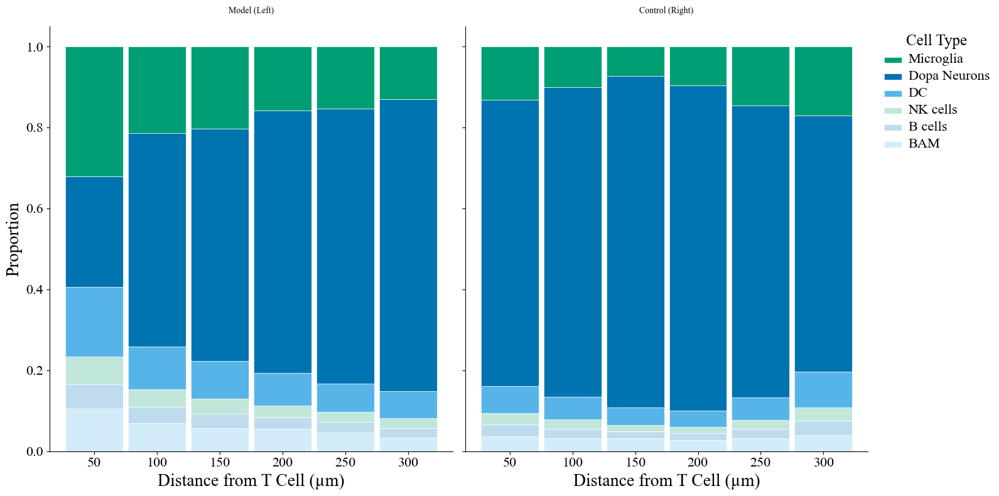

In [38]:
from config import ROI_LEFT_BOX, ROI_RIGHT_BOX
from utils import get_spatial_xy, get_roi_masks
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
from scipy.spatial import KDTree

# =========================
# 0) 强制使用本地 times.ttf
# =========================
plt.style.use("default")

TNR_TTF = "/home/yuanyanyao/Downloads/数据/DATA_T_CSF_PBMC/times-new-roman/times.ttf"
if not os.path.exists(TNR_TTF):
    raise FileNotFoundError(f"Cannot find font file: {TNR_TTF}")

fm.fontManager.addfont(TNR_TTF)
prop = fm.FontProperties(fname=TNR_TTF)
font_name = prop.get_name()
print("Matplotlib will use font:", font_name)

plt.rcParams["font.family"] = "serif"
plt.rcParams["font.serif"] = [font_name]
plt.rcParams["axes.unicode_minus"] = False
plt.rcParams["pdf.fonttype"] = 42
plt.rcParams["ps.fonttype"] = 42

# === 1. 参数设置 ===
threshold = 0.075  
step = 100         
max_dist = 600     
rings = [(i, i + step) for i in range(0, max_dist, step)] 
um_conversion = 0.5 

# 自动查找 T 细胞列
t_cell_col = 'q05_cell_abundance_w_sf_1201 T cells NN_4'
if 'adata' in locals() and t_cell_col not in adata.obs.columns:
    matches = [c for c in adata.obs.columns if 'T cells' in c]
    if matches: t_cell_col = matches[0]

# === 2. 定义细胞组 ===
target_groups = {
    'Dopa Neurons': ['SNc-VTA', 'Dopa'],
    'Microglia': ['Microglia'],
    'NK cells': ['NK cells'],
    'B cells': ['B cells'],
    'DC': ['DC'],
    'BAM': ['BAM']
}

target_cols = {}
for group, keys in target_groups.items():
    found_cols = []
    for k in keys:
        found_cols.extend([c for c in adata.obs.columns if k in c])
    clean_cols = [c for c in found_cols if not any(x in c for x in ['Astro', 'MOL', 'OPC'])]
    clean_cols = [c for c in clean_cols if 'T cells' not in c] 
    if clean_cols:
        target_cols[group] = list(set(clean_cols))

# === 3. 定义 ROI ===
x, y = get_spatial_xy(adata)
mask_L, mask_R = get_roi_masks(x, y, ROI_LEFT_BOX, ROI_RIGHT_BOX)
roi_masks = {'Model (Left)': mask_L, 'Control (Right)': mask_R}

# === 4. 计算循环 ===
plot_data = []
print(f"开始计算...")

for region, mask in roi_masks.items():
    region_obs = adata.obs[mask]
    center_mask = region_obs[t_cell_col].values > threshold
    centers = region_coords[center_mask]
    
    if len(centers) == 0: continue
    
    tree = KDTree(region_coords)
    
    for r_min, r_max in rings:
        indices_list = tree.query_ball_point(centers, r_max)
        layer_counts = {k: 0.0 for k in target_groups.keys()}
        
        for i, idxs in enumerate(indices_list):
            if not idxs: continue
            neighbors_coords = region_coords[idxs]
            dists = np.linalg.norm(neighbors_coords - centers[i], axis=1)
            ring_mask = (dists > r_min) & (dists <= r_max)
            if r_min == 0: ring_mask = (dists >= 0) & (dists <= r_max)
            
            valid_idxs = np.array(idxs)[ring_mask]
            if len(valid_idxs) > 0:
                for group, cols in target_cols.items():
                    val = region_obs.iloc[valid_idxs][cols].sum(axis=1).sum()
                    layer_counts[group] += val
        
        row = layer_counts.copy()
        row['Region'] = region
        
        # [修改点 1]：X轴标签改为仅显示外圈距离 (例如 50, 100, 150)
        dist_label = f"{int(r_max * um_conversion)}"
        
        row['Distance'] = dist_label
        row['Dist_Sort'] = r_min 
        plot_data.append(row)

# === 5. 绘图 (大字体版) ===
df = pd.DataFrame(plot_data)

if len(df) > 0:
    cell_cols = list(target_cols.keys())
    df_melt = df.melt(id_vars=['Region', 'Distance', 'Dist_Sort'], 
                      value_vars=cell_cols, 
                      var_name='Cell Type', value_name='Abundance')
    
    df_melt['Proportion'] = df_melt.groupby(['Region', 'Distance'])['Abundance'].transform(lambda x: x / x.sum())
    
    # 颜色映射
    colors_from_img = {
        'Orange': '#009E74',   # Microglia
        'Red': '#0073B1',      # Dopa
        'Purple': '#57B4E9',   # DC
        'Green': '#C0E7DA',    # NK
        'Teal': '#BEDCED',     # B cells
        'Blue': '#D2ECFA'      # BAM
    }

    custom_palette = {
        'Microglia': colors_from_img['Orange'],
        'Dopa Neurons': colors_from_img['Red'],
        'DC': colors_from_img['Purple'],
        'NK cells': colors_from_img['Green'],
        'B cells': colors_from_img['Teal'],
        'BAM': colors_from_img['Blue']
    }

    stack_order = ['BAM', 'B cells', 'NK cells', 'DC', 'Dopa Neurons', 'Microglia']

    # 创建画布
    plt.style.use('default') 
    fig, axes = plt.subplots(1, 2, figsize=(16, 8), sharey=True)
    regions = ['Model (Left)', 'Control (Right)']
    
    for i, reg in enumerate(regions):
        ax = axes[i]
        subset = df_melt[df_melt['Region'] == reg].copy()
        if len(subset) == 0: continue
        
        pivot_df = subset.pivot(index='Distance', columns='Cell Type', values='Proportion')
        
        # [修改点 2]：排序逻辑修改，因为标签现在是纯数字字符串，直接转 int 排序
        sorted_index = sorted(pivot_df.index, key=lambda x: int(x))
        pivot_df = pivot_df.reindex(sorted_index)
        
        current_stack = [c for c in stack_order if c in pivot_df.columns]
        rem = [c for c in pivot_df.columns if c not in current_stack]
        final_order = rem + current_stack
        pivot_df = pivot_df[final_order]
        
        color_list = [custom_palette.get(c, '#333333') for c in pivot_df.columns]
        
        pivot_df.plot(kind='bar', stacked=True, ax=ax, color=color_list, width=0.92, edgecolor='white', linewidth=0.5)
        
        # === [修改点 3]：字体全面调大 ===
        # 标题字体：18 -> 24
        ax.set_title(f'{reg}', fontsize=24, fontproperties=prop, pad=15)
        
        # X轴标签字体：14 -> 20
        ax.set_xlabel('Distance from T Cell (µm)', fontsize=20, fontproperties=prop)
        
        if i == 0:
            # Y轴标签字体：14 -> 20
            ax.set_ylabel('Proportion', fontsize=20, fontproperties=prop)
        else:
            ax.set_ylabel('')
            
        # 刻度标签字体：12 -> 16
        for label in ax.get_xticklabels() + ax.get_yticklabels():
            label.set_fontproperties(prop)
            label.set_fontsize(16) # 调大
            label.set_rotation(0)  # X轴数字横着放，更美观
        
        if i == 1:
            handles, labels = ax.get_legend_handles_labels()
            leg = ax.legend(handles[::-1], labels[::-1], bbox_to_anchor=(1.02, 1), 
                            loc='upper left', title='Cell Type', 
                            prop=prop, frameon=False)
            
            # 图例标题字体：14 -> 18
            leg.get_title().set_fontproperties(prop)
            leg.get_title().set_fontsize(18)
            
            # 图例内容字体：默认 -> 16
            for text in leg.get_texts():
                text.set_fontproperties(prop)
                text.set_fontsize(16)
        else:
            ax.get_legend().remove()
            
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

    plt.tight_layout()
    
    # 保存
    plt.savefig('Spatial_Immune_Gradient_BigFont.pdf', format='pdf', bbox_inches='tight')
    plt.savefig('Spatial_Immune_Gradient_BigFont.png', dpi=600, bbox_inches='tight')
    
    print("\n✅ 输出完成 (字体已加大，X轴为单一距离值):")
    print("1. Spatial_Immune_Gradient_BigFont.pdf")
    print("2. Spatial_Immune_Gradient_BigFont.png")

else:
    print("未生成数据")


In [39]:
from config import ROI_LEFT_BOX, ROI_RIGHT_BOX
from utils import get_spatial_xy, get_roi_masks
import os
import numpy as np
import pandas as pd
from scipy.spatial import KDTree

# === 1. 参数设置 ===
threshold = 0.075  
step = 100         
max_dist = 600     
rings = [(i, i + step) for i in range(0, max_dist, step)] 
um_conversion = 0.5 

# 自动查找 T 细胞列
t_cell_col = 'q05_cell_abundance_w_sf_1201 T cells NN_4'
if 'adata' in locals() and t_cell_col not in adata.obs.columns:
    matches = [c for c in adata.obs.columns if 'T cells' in c]
    if matches: t_cell_col = matches[0]
print(f"Target T cell column: {t_cell_col}")

# === 2. 定义所有涉及的细胞组 (全集) ===
# 这里的定义包含了原来的细胞，加上了星形胶质和少突胶质
target_groups_all = {
    # 原版模板细胞
    'Dopa Neurons': ['SNc-VTA', 'Dopa'],
    'Microglia': ['Microglia'],
    'NK cells': ['NK cells'],
    'B cells': ['B cells'],
    'DC': ['DC'],
    'BAM': ['BAM'],
    
    # 新增胶质细胞
    'Astrocytes': ['Astro'], 
    'Oligodendrocytes': ['MOL', 'OPC', 'Oligo'] # 包含成熟少突(MOL)和前体(OPC)
}

# 查找并锁定列名
target_cols = {}
for group, keys in target_groups_all.items():
    found_cols = []
    for k in keys:
        found_cols.extend([c for c in adata.obs.columns if k in c])
    
    # 过滤掉 T 细胞自身
    clean_cols = [c for c in found_cols if 'T cells' not in c]
    
    # 注意：这里不再过滤 Astro/MOL/OPC，因为我们要统计它们
    # 但为了防止混淆，确保属于其他组时不要误伤
    if group not in ['Astrocytes', 'Oligodendrocytes']:
        # 如果不是胶质细胞组，尽量排除胶质细胞的列（防止某些列名同时包含 Dopa 和 Astro）
        clean_cols = [c for c in clean_cols if not any(x in c for x in ['Astro', 'MOL', 'OPC'])]
        
    if clean_cols:
        target_cols[group] = list(set(clean_cols))
        print(f"Group '{group}' found {len(clean_cols)} columns.")

# === 3. 定义 ROI ===
x, y = get_spatial_xy(adata)
mask_L, mask_R = get_roi_masks(x, y, ROI_LEFT_BOX, ROI_RIGHT_BOX)
roi_masks = {'Model (Left)': mask_L, 'Control (Right)': mask_R}

# === 4. 核心计算 (一次性算出所有细胞的绝对值) ===
plot_data = []
print(f"开始空间距离计算...")

for region, mask in roi_masks.items():
    region_obs = adata.obs[mask]
    
    # 筛选 T 细胞中心
    center_mask = region_obs[t_cell_col].values > threshold
    centers = region_coords[center_mask]
    
    if len(centers) == 0: 
        print(f"Region {region}: No T cells found.")
        continue
    
    tree = KDTree(region_coords)
    
    for r_min, r_max in rings:
        indices_list = tree.query_ball_point(centers, r_max)
        
        # 初始化计数器
        layer_counts = {k: 0.0 for k in target_groups_all.keys()}
        
        for i, idxs in enumerate(indices_list):
            if not idxs: continue
            neighbors_coords = region_coords[idxs]
            dists = np.linalg.norm(neighbors_coords - centers[i], axis=1)
            
            # 环形筛选
            if r_min == 0:
                ring_mask = (dists >= 0) & (dists <= r_max)
            else:
                ring_mask = (dists > r_min) & (dists <= r_max)
            
            valid_idxs = np.array(idxs)[ring_mask]
            
            if len(valid_idxs) > 0:
                # 累加各组细胞的丰度
                sub_obs = region_obs.iloc[valid_idxs]
                for group, cols in target_cols.items():
                    val = sub_obs[cols].sum(axis=1).sum()
                    layer_counts[group] += val
        
        row = layer_counts.copy()
        row['Region'] = region
        # 记录距离标签 (例如 50, 100)
        row['Distance_Label'] = int(r_max * um_conversion) 
        row['Dist_Sort'] = r_min
        plot_data.append(row)

# 转为 DataFrame (这是原始绝对丰度数据)
df_raw = pd.DataFrame(plot_data)

# === 5. 定义导出函数 (计算百分比并保存) ===
def export_percentage_table(df_input, cell_types_list, filename):
    """
    输入：原始数据的 DF
    参数：需要包含的细胞类型列表
    输出：计算这几类细胞由于归一化后的百分比，并保存 CSV
    """
    if df_input.empty:
        print(f"数据为空，跳过 {filename}")
        return

    # 1. 筛选需要的列
    keep_cols = ['Region', 'Distance_Label', 'Dist_Sort'] + cell_types_list
    # 确保列都存在
    valid_cells = [c for c in cell_types_list if c in df_input.columns]
    
    df_sub = df_input[['Region', 'Distance_Label', 'Dist_Sort'] + valid_cells].copy()
    
    # 2. 计算总和 (分母)
    df_sub['Total_Abundance'] = df_sub[valid_cells].sum(axis=1)
    
    # 3. 计算百分比
    for cell in valid_cells:
        # 避免除以0
        df_sub[f'{cell} (%)'] = df_sub.apply(
            lambda row: (row[cell] / row['Total_Abundance'] * 100) if row['Total_Abundance'] > 0 else 0, 
            axis=1
        )
    
    # 4. 整理输出格式 (只保留百分比列)
    output_cols = ['Region', 'Distance_Label'] + [f'{cell} (%)' for cell in valid_cells]
    df_final = df_sub[output_cols].sort_values(by=['Region', 'Distance_Label'])
    
    # 5. 保存
    df_final.to_csv(filename, index=False)
    print(f"✅ 已保存: {filename}")
    # 打印前两行预览
    # print(df_final.head(2))

# === 6. 生成三个表格 ===

# 列表 1: 原版模板 (6类)
list1 = ['Dopa Neurons', 'Microglia', 'NK cells', 'B cells', 'DC', 'BAM']

# 列表 2: 原版 + 胶质细胞 (8类)
list2 = list1 + ['Astrocytes', 'Oligodendrocytes']

# 列表 3: 只有胶质细胞 (2类)
list3 = ['Astrocytes', 'Oligodendrocytes']

print("\n=== 正在导出表格 ===")
export_percentage_table(df_raw, list1, 'Table1_Original_Immune_Dopa.csv')
export_percentage_table(df_raw, list2, 'Table2_All_Cells_Inc_Glia.csv')
export_percentage_table(df_raw, list3, 'Table3_Glia_Only.csv')

print("\n全部完成！您现在可以用这些 CSV 文件在外部软件绘图了。")
print("注意：距离单位为 um，数值为百分比 (0-100)。")


Target T cell column: q05_cell_abundance_w_sf_1201 T cells NN_4
Group 'Dopa Neurons' found 16 columns.
Group 'Microglia' found 1 columns.
Group 'NK cells' found 1 columns.
Group 'B cells' found 1 columns.
Group 'DC' found 4 columns.
Group 'BAM' found 1 columns.
Group 'Astrocytes' found 13 columns.
Group 'Oligodendrocytes' found 3 columns.
开始空间距离计算...

=== 正在导出表格 ===
✅ 已保存: Table1_Original_Immune_Dopa.csv
✅ 已保存: Table2_All_Cells_Inc_Glia.csv
✅ 已保存: Table3_Glia_Only.csv

全部完成！您现在可以用这些 CSV 文件在外部软件绘图了。
注意：距离单位为 um，数值为百分比 (0-100)。


正在准备空间距离分析数据...
使用小胶质细胞列: q05_cell_abundance_w_sf_1194 Microglia NN_1
开始遍历阈值 (T_thresh=0.075, Micro_thresh 0.1->1.0)...


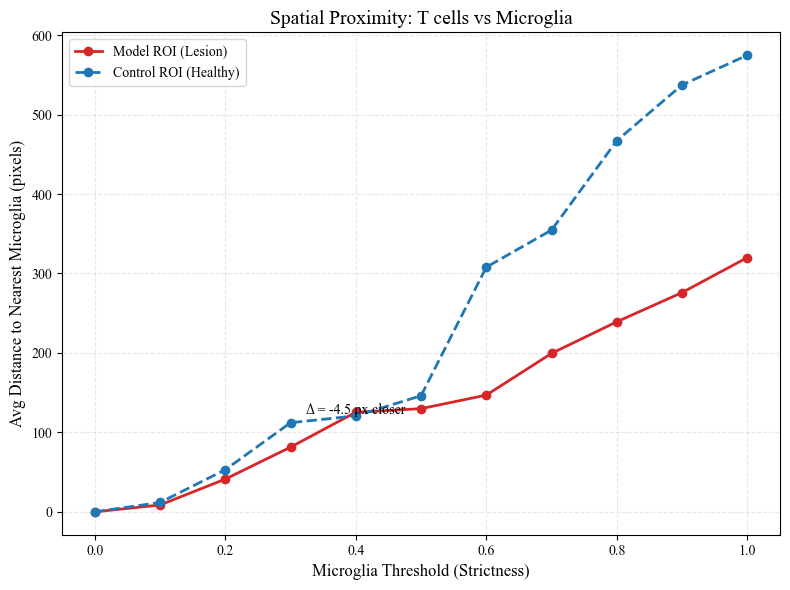


Micro_Thresh | Model Dist   | Control Dist | Status
----------------------------------------------------------------------
0.0          | 0.0          | 0.0          | ❌ Further in Model
0.1          | 8.6          | 11.8         | ✅ Closer in Model
0.2          | 41.2         | 52.9         | ✅ Closer in Model
0.3          | 81.4         | 112.1        | ✅ Closer in Model
0.4          | 125.3        | 120.8        | ❌ Further in Model
0.5          | 129.9        | 146.1        | ✅ Closer in Model
0.6          | 146.9        | 308.0        | ✅ Closer in Model
0.7          | 199.5        | 354.6        | ✅ Closer in Model
0.8          | 239.2        | 467.2        | ✅ Closer in Model
0.9          | 276.0        | 537.3        | ✅ Closer in Model
1.0          | 320.1        | 574.8        | ✅ Closer in Model


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy.spatial import cKDTree

# ==========================================
# 1. 准备数据
# ==========================================
print("正在准备空间距离分析数据...")

# A. 提取 T 细胞列 (复用之前的逻辑)
col_t_list = [c for c in adata.obs.columns if 'T cell' in c or 'T cells' in c]
target_t = 'Sum_T_cells_Vis'
adata.obs[target_t] = adata.obs[col_t_list].sum(axis=1)

# B. 提取 Microglia 列 (模糊匹配)
micro_matches = [c for c in adata.obs.columns if 'Microglia' in c]
if not micro_matches:
    raise ValueError("未找到 Microglia 相关列")
col_micro = micro_matches[0]
print(f"使用小胶质细胞列: {col_micro}")

# C. 坐标与 ROI 定义
x = adata.obsm['spatial'][:, 0]
y = adata.obsm['spatial'][:, 1]
roi_m = {'x': [6000, 7800], 'y': [11400, 13200], 'name': 'Model ROI'}
roi_c = {'x': [12200, 14000], 'y': [11400, 13200], 'name': 'Control ROI'}

# ==========================================
# 2. 核心计算函数 (Nearest Neighbor Distance)
# ==========================================
def get_nearest_distances(roi_dict, t_thresh, m_thresh):
    """
    计算指定 ROI 内，所有 T 细胞 (>t_thresh) 到最近 Microglia (>m_thresh) 的距离
    """
    # 1. 筛选 ROI 范围内的点
    mask_roi = (x >= roi_dict['x'][0]) & (x <= roi_dict['x'][1]) & \
               (y >= roi_dict['y'][0]) & (y <= roi_dict['y'][1])
    
    # 获取该区域内的坐标和表达量
    local_x = x[mask_roi]
    local_y = y[mask_roi]
    local_coords = np.column_stack((local_x, local_y))
    
    local_t_val = adata.obs[target_t].values[mask_roi]
    local_m_val = adata.obs[col_micro].values[mask_roi]
    
    # 2. 筛选阳性细胞坐标
    t_coords = local_coords[local_t_val > t_thresh]
    m_coords = local_coords[local_m_val > m_thresh]
    
    # 3. KDTree 计算最近邻
    if len(t_coords) == 0:
        return np.nan, 0 # 没有 T 细胞
    if len(m_coords) == 0:
        return np.inf, 0 # 有 T 细胞但没有小胶质细胞，距离无穷大
    
    # 构建小胶质细胞的树
    tree = cKDTree(m_coords)
    # 查询每一个 T 细胞最近的小胶质细胞距离 (k=1)
    dists, _ = tree.query(t_coords, k=1)
    
    # 返回平均距离 和 T细胞数量
    return np.mean(dists), len(t_coords)

# ==========================================
# 3. 循环计算 (0.1 - 1.0)
# ==========================================
results = []
micro_thresholds = np.arange(0, 1.05, 0.1) # 0.1 到 1.0

print(f"开始遍历阈值 (T_thresh=0.075, Micro_thresh 0.1->1.0)...")

for m_thresh in micro_thresholds:
    # Model Side
    dist_m, count_m = get_nearest_distances(roi_m, 0.075, m_thresh)
    # Control Side
    dist_c, count_c = get_nearest_distances(roi_c, 0.075, m_thresh)
    
    results.append({
        'Microglia_Threshold': m_thresh,
        'Model_Mean_Dist': dist_m,
        'Control_Mean_Dist': dist_c,
        'Model_T_Count': count_m,
        'Control_T_Count': count_c
    })

df_res = pd.DataFrame(results)

# ==========================================
# 4. 绘图展示
# ==========================================
plt.style.use('default')
plt.rcParams['font.family'] = 'Times New Roman'

fig, ax1 = plt.subplots(figsize=(8, 6))

# 绘制距离曲线
ax1.plot(df_res['Microglia_Threshold'], df_res['Model_Mean_Dist'], 'o-', 
         color='#d62728', linewidth=2, label='Model ROI (Lesion)')
ax1.plot(df_res['Microglia_Threshold'], df_res['Control_Mean_Dist'], 'o--', 
         color='#1f77b4', linewidth=2, label='Control ROI (Healthy)')

ax1.set_xlabel('Microglia Threshold (Strictness)', fontsize=12)
ax1.set_ylabel('Avg Distance to Nearest Microglia (pixels)', fontsize=12)
ax1.set_title('Spatial Proximity: T cells vs Microglia', fontsize=14)
ax1.grid(True, linestyle='--', alpha=0.3)
ax1.legend(loc='upper left')

# 标注差值
# 在中间某个点 (比如 0.5) 标注一下数值
mid_idx = 4 # 0.5
mid_x = df_res.iloc[mid_idx]['Microglia_Threshold']
mid_y_m = df_res.iloc[mid_idx]['Model_Mean_Dist']
mid_y_c = df_res.iloc[mid_idx]['Control_Mean_Dist']

if not np.isinf(mid_y_c) and not np.isnan(mid_y_c):
    ax1.annotate(f"Δ = {mid_y_c - mid_y_m:.1f} px closer", 
                 xy=(mid_x, (mid_y_m + mid_y_c)/2), 
                 ha='center', color='black', fontweight='bold',
                 arrowprops=dict(arrowstyle='-', color='black'))

plt.tight_layout()
plt.savefig('T_cell_Microglia_Proximity_Curve.pdf', dpi=600)
plt.show()

# ==========================================
# 5. 打印统计表
# ==========================================
print("\n" + "="*70)
print(f"{'Micro_Thresh':<12} | {'Model Dist':<12} | {'Control Dist':<12} | {'Status'}")
print("-" * 70)
for _, row in df_res.iterrows():
    m_dist = row['Model_Mean_Dist']
    c_dist = row['Control_Mean_Dist']
    
    status = ""
    if np.isinf(c_dist):
        status = "No Microglia in Ctrl"
    elif np.isnan(c_dist):
        status = "No T cells"
    elif m_dist < c_dist:
        status = "✅ Closer in Model"
    else:
        status = "❌ Further in Model"
        
    print(f"{row['Microglia_Threshold']:<12.1f} | {m_dist:<12.1f} | {c_dist:<12.1f} | {status}")
print("="*70)

正在计算 T细胞-小胶质细胞 最近邻距离 (Starting from >0)...


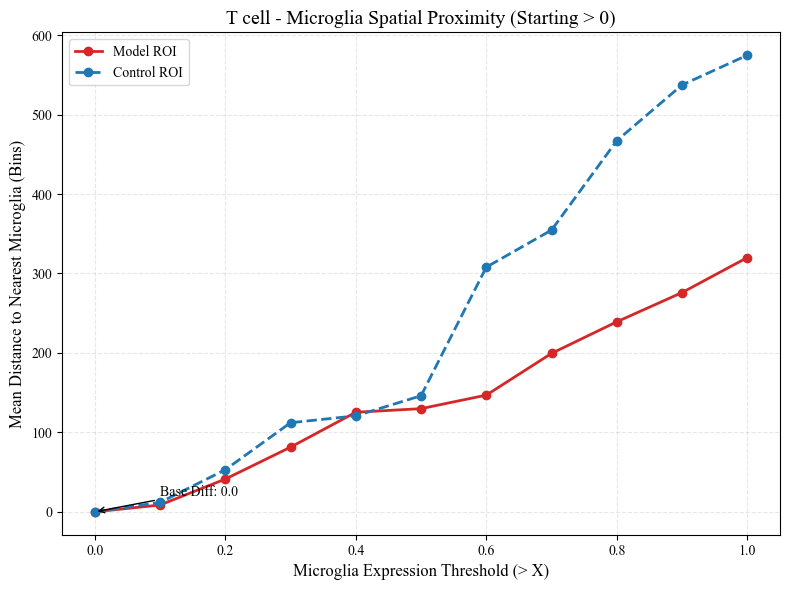


Threshold (>X)  | Model Dist   | Control Dist | Gap
------------------------------------------------------------
0.0             | 0.0          | 0.0          | +0.0
0.1             | 8.6          | 11.8         | +3.2
0.2             | 41.2         | 52.9         | +11.8
0.3             | 81.4         | 112.1        | +30.8
0.4             | 125.3        | 120.8        | -4.5
0.5             | 129.9        | 146.1        | +16.2
0.6             | 146.9        | 308.0        | +161.1
0.7             | 199.5        | 354.6        | +155.2
0.8             | 239.2        | 467.2        | +228.0
0.9             | 276.0        | 537.3        | +261.3
1.0             | 320.1        | 574.8        | +254.7


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy.spatial import cKDTree

# ==========================================
# 1. 准备数据
# ==========================================
print("正在计算 T细胞-小胶质细胞 最近邻距离 (Starting from >0)...")

# A. 准备列 (T 细胞 & 小胶质细胞)
col_t_list = [c for c in adata.obs.columns if 'T cell' in c or 'T cells' in c]
target_t = 'Sum_T_cells_Vis'
adata.obs[target_t] = adata.obs[col_t_list].sum(axis=1)

micro_matches = [c for c in adata.obs.columns if 'Microglia' in c]
if not micro_matches:
    raise ValueError("未找到 Microglia 相关列")
col_micro = micro_matches[0]

# B. 坐标与 ROI
x = adata.obsm['spatial'][:, 0]
y = adata.obsm['spatial'][:, 1]
roi_m = {'x': [6000, 7800], 'y': [11400, 13200], 'name': 'Model ROI'}
roi_c = {'x': [12200, 14000], 'y': [11400, 13200], 'name': 'Control ROI'}

# ==========================================
# 2. 核心计算函数 (不变)
# ==========================================
def get_nearest_distances(roi_dict, t_thresh, m_thresh):
    mask_roi = (x >= roi_dict['x'][0]) & (x <= roi_dict['x'][1]) & \
               (y >= roi_dict['y'][0]) & (y <= roi_dict['y'][1])
    
    local_x, local_y = x[mask_roi], y[mask_roi]
    local_coords = np.column_stack((local_x, local_y))
    local_t = adata.obs[target_t].values[mask_roi]
    local_m = adata.obs[col_micro].values[mask_roi]
    
    # 筛选阳性坐标
    t_coords = local_coords[local_t > t_thresh]
    m_coords = local_coords[local_m > m_thresh] # 这里 m_thresh 会传入 0
    
    if len(t_coords) == 0: return np.nan
    if len(m_coords) == 0: return np.inf # Control 侧高阈值时可能发生
    
    tree = cKDTree(m_coords)
    dists, _ = tree.query(t_coords, k=1)
    return np.mean(dists)

# ==========================================
# 3. 循环计算 (0.0 -> 1.0)
# ==========================================
# 关键修改：加入 0.0
thresholds = np.concatenate(([0.0], np.arange(0.1, 1.05, 0.1)))
results = []

for m_thr in thresholds:
    dist_m = get_nearest_distances(roi_m, 0.075, m_thr)
    dist_c = get_nearest_distances(roi_c, 0.075, m_thr)
    
    results.append({
        'Micro_Threshold': m_thr,
        'Model_Dist': dist_m,
        'Control_Dist': dist_c
    })

df = pd.DataFrame(results)

# ==========================================
# 4. 绘图 (Times New Roman)
# ==========================================
plt.style.use('default')
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['pdf.fonttype'] = 42

fig, ax = plt.subplots(figsize=(8, 6))

# 绘制曲线
ax.plot(df['Micro_Threshold'], df['Model_Dist'], 'o-', color='#d62728', lw=2, label='Model ROI')
ax.plot(df['Micro_Threshold'], df['Control_Dist'], 'o--', color='#1f77b4', lw=2, label='Control ROI')

# 标注 0.0 处的差异
dist0_m = df.iloc[0]['Model_Dist']
dist0_c = df.iloc[0]['Control_Dist']
ax.annotate(f"Base Diff: {dist0_c - dist0_m:.1f}", 
            xy=(0, (dist0_m + dist0_c)/2), 
            xytext=(0.1, (dist0_m + dist0_c)/2 + 20),
            arrowprops=dict(facecolor='black', arrowstyle='->'))

ax.set_xlabel('Microglia Expression Threshold (> X)', fontsize=12)
ax.set_ylabel('Mean Distance to Nearest Microglia (Bins)', fontsize=12)
ax.set_title('T cell - Microglia Spatial Proximity (Starting > 0)', fontsize=14)
ax.legend()
ax.grid(True, linestyle='--', alpha=0.3)

plt.tight_layout()
plt.savefig('T_Micro_Distance_FromZero.pdf', dpi=600)
plt.show()

# ==========================================
# 5. 打印详细统计表
# ==========================================
print("\n" + "="*60)
print(f"{'Threshold (>X)':<15} | {'Model Dist':<12} | {'Control Dist':<12} | {'Gap'}")
print("-" * 60)
for _, row in df.iterrows():
    m_d = row['Model_Dist']
    c_d = row['Control_Dist']
    gap = c_d - m_d if not np.isinf(c_d) else np.inf
    
    # 格式化输出
    m_str = f"{m_d:.1f}"
    c_str = f"{c_d:.1f}" if not np.isinf(c_d) else "INF"
    gap_str = f"{gap:+.1f}" if not np.isinf(gap) else "INF"
    
    print(f"{row['Micro_Threshold']:<15.1f} | {m_str:<12} | {c_str:<12} | {gap_str}")
print("="*60)

当前参数设置: T cells > 0.075, Microglia > 0.5


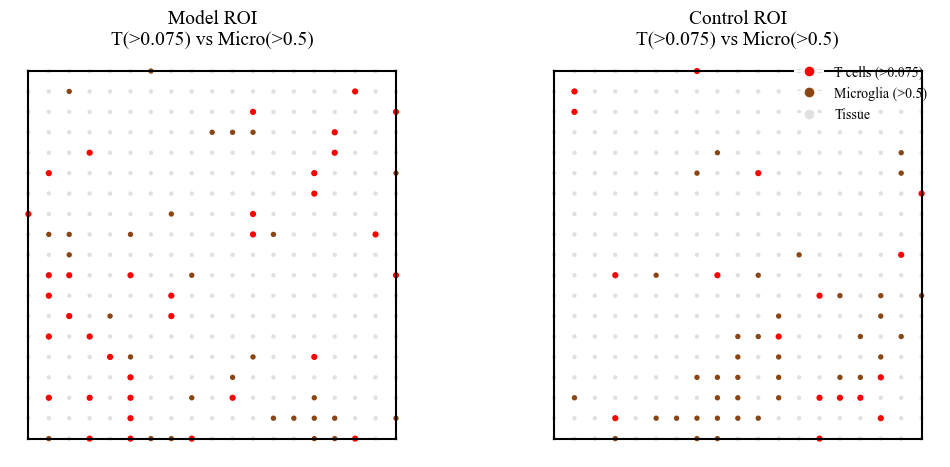


ROI                  | Microglia (>0.5)   | T Cells (>0.075)   | Overlap
---------------------------------------------------------------------------
Model ROI            | 39                 | 35                 | 10
Control ROI          | 41                 | 17                 | 3


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
import pandas as pd
from matplotlib.lines import Line2D

# ==========================================
# 1. 基础设置
# ==========================================
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['pdf.fonttype'] = 42

# 准备坐标
x = adata.obsm['spatial'][:, 0]
y = adata.obsm['spatial'][:, 1]

# --- 准备数据列 ---
# 1. T Cells
col_t_list = [c for c in adata.obs.columns if 'T cell' in c or 'T cells' in c]
target_t = 'Sum_T_cells_Vis'
adata.obs[target_t] = adata.obs[col_t_list].sum(axis=1)

# 2. Microglia
micro_matches = [c for c in adata.obs.columns if 'Microglia' in c]
if not micro_matches:
    raise ValueError("未找到 Microglia 相关列")
target_micro = micro_matches[0]

# ROI 定义
roi_m = {'x': [6000, 7800], 'y': [11400, 13200], 'name': 'Model ROI'}
roi_c = {'x': [12200, 14000], 'y': [11400, 13200], 'name': 'Control ROI'}

# ==========================================
# 【关键修改】设置阈值
# ==========================================
thresh_t = 0.075  # T 细胞阈值 (保持不变)
thresh_m = 0.5    # 小胶质细胞阈值 (已修改为 0.5)

print(f"当前参数设置: T cells > {thresh_t}, Microglia > {thresh_m}")

# ==========================================
# 2. 绘图与统计逻辑
# ==========================================
fig, axes = plt.subplots(1, 2, figsize=(12, 6), facecolor='white')
plt.subplots_adjust(wspace=0.3)

stats = []

for i, roi in enumerate([roi_m, roi_c]):
    ax = axes[i]
    
    # 1. 提取 ROI 数据
    mask_roi = (x >= roi['x'][0]) & (x <= roi['x'][1]) & \
               (y >= roi['y'][0]) & (y <= roi['y'][1])
    
    rx, ry = x[mask_roi], y[mask_roi]
    val_t = adata.obs[target_t].values[mask_roi]
    val_m = adata.obs[target_micro].values[mask_roi]
    
    # 2. 生成掩码
    mask_t_pos = val_t > thresh_t
    mask_m_pos = val_m > thresh_m
    
    # 统计
    count_t = np.sum(mask_t_pos)
    count_m = np.sum(mask_m_pos)
    count_overlap = np.sum(mask_t_pos & mask_m_pos)
    
    stats.append({
        'ROI': roi['name'],
        'T_Cells': count_t,
        'Microglia': count_m,
        'Overlap': count_overlap
    })
    
    # 3. 绘图 (三层叠加)
    # Layer 1: 灰色背景 (Tissue)
    ax.scatter(rx, ry, c='#e0e0e0', s=10, edgecolors='none', zorder=1)
    
    # Layer 2: 棕色小胶质细胞 (Microglia)
    if count_m > 0:
        ax.scatter(rx[mask_m_pos], ry[mask_m_pos], c='#8b4513', s=15, edgecolors='none', zorder=2)
        
    # Layer 3: 红色 T 细胞 (T cells)
    if count_t > 0:
        ax.scatter(rx[mask_t_pos], ry[mask_t_pos], c='red', s=20, edgecolors='none', zorder=3)
    
    # 4. 装饰
    ax.set_aspect('equal')
    ax.invert_yaxis()
    ax.axis('off')
    # 标题自动更新阈值
    ax.set_title(f"{roi['name']}\nT(>{thresh_t}) vs Micro(>{thresh_m})", fontsize=14)
    
    # 加黑框
    rect = patches.Rectangle((roi['x'][0], roi['y'][0]), 
                             roi['x'][1]-roi['x'][0], roi['y'][1]-roi['y'][0], 
                             linewidth=1.5, edgecolor='black', facecolor='none', zorder=4)
    ax.add_patch(rect)
    
    # 只在第二个图加图例
    if i == 1:
        legend_elements = [
            Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=8, label=f'T cells (>{thresh_t})'),
            Line2D([0], [0], marker='o', color='w', markerfacecolor='#8b4513', markersize=8, label=f'Microglia (>{thresh_m})'),
            Line2D([0], [0], marker='o', color='w', markerfacecolor='#e0e0e0', markersize=8, label='Tissue')
        ]
        ax.legend(handles=legend_elements, loc='upper right', frameon=False, fontsize=10)

# ==========================================
# 3. 保存与打印统计
# ==========================================
plt.savefig(f'ROI_CoLoc_T{thresh_t}_Micro{thresh_m}.pdf', dpi=600, bbox_inches='tight')
plt.show()

# 打印统计表
df_stats = pd.DataFrame(stats)
print("\n" + "="*75)
print(f"{'ROI':<20} | {f'Microglia (>{thresh_m})':<18} | {f'T Cells (>{thresh_t})':<18} | {'Overlap'}")
print("-" * 75)
for _, row in df_stats.iterrows():
    print(f"{row['ROI']:<20} | {row['Microglia']:<18} | {row['T_Cells']:<18} | {row['Overlap']}")
print("="*75)

正在提取距离数据 (T>0.075, Micro>1)...

[成功] 具体数值已保存至: T_Micro_Individual_Distances.csv
文件包含两列: 'Distance' (单位: Bin) 和 'Group'

Group      | Count(T cells)  | Median Dist  | Mean Dist   
------------------------------------------------------------
Model      | 35              | 316.23       | 320.07      
Control    | 17              | 447.21       | 574.78      


/tmp/ipykernel_1023990/3997473519.py:107: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_all, x='Group', y='Distance', palette=['#d62728', '#1f77b4'], inner='quartile')


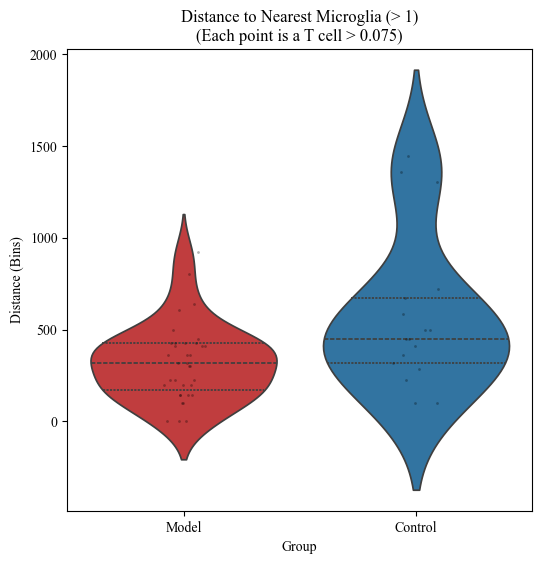

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from scipy.spatial import cKDTree

# ==========================================
# 1. 准备数据
# ==========================================
# T 细胞列
col_t_list = [c for c in adata.obs.columns if 'T cell' in c or 'T cells' in c]
target_t = 'Sum_T_cells_Vis'
adata.obs[target_t] = adata.obs[col_t_list].sum(axis=1)

# Microglia 列
micro_matches = [c for c in adata.obs.columns if 'Microglia' in c]
target_micro = micro_matches[0]

# 坐标
x = adata.obsm['spatial'][:, 0]
y = adata.obsm['spatial'][:, 1]

# ROI 定义
roi_m = {'x': [6000, 7800], 'y': [11400, 13200], 'name': 'Model'}
roi_c = {'x': [12200, 14000], 'y': [11400, 13200], 'name': 'Control'}

# 设定阈值
thresh_t = 0.075
thresh_m = 1

# ==========================================
# 2. 核心计算函数 (提取所有点的距离)
# ==========================================
def get_individual_distances(roi_dict, t_thresh, m_thresh):
    # 1. 提取 ROI 内数据
    mask_roi = (x >= roi_dict['x'][0]) & (x <= roi_dict['x'][1]) & \
               (y >= roi_dict['y'][0]) & (y <= roi_dict['y'][1])
    
    local_x, local_y = x[mask_roi], y[mask_roi]
    local_coords = np.column_stack((local_x, local_y))
    
    local_t = adata.obs[target_t].values[mask_roi]
    local_m = adata.obs[target_micro].values[mask_roi]
    
    # 2. 获取阳性坐标
    t_coords = local_coords[local_t > t_thresh]
    m_coords = local_coords[local_m > m_thresh]
    
    # 3. 计算距离
    if len(t_coords) == 0:
        print(f"[{roi_dict['name']}] 无 T 细胞 (> {t_thresh})")
        return []
    
    if len(m_coords) == 0:
        print(f"[{roi_dict['name']}] 无 小胶质细胞 (> {m_thresh})")
        return [] # 或者返回 np.inf
    
    # 构建 KDTree 并查询
    tree = cKDTree(m_coords)
    # k=1 表示找最近的1个邻居
    dists, _ = tree.query(t_coords, k=1)
    
    return dists

# ==========================================
# 3. 执行计算并构建 DataFrame
# ==========================================
print(f"正在提取距离数据 (T>{thresh_t}, Micro>{thresh_m})...")

dists_model = get_individual_distances(roi_m, thresh_t, thresh_m)
dists_ctrl = get_individual_distances(roi_c, thresh_t, thresh_m)

# 构建用于绘图/导出的 DataFrame
df_m = pd.DataFrame({'Distance': dists_model, 'Group': 'Model'})
df_c = pd.DataFrame({'Distance': dists_ctrl, 'Group': 'Control'})
df_all = pd.concat([df_m, df_c], ignore_index=True)

# ==========================================
# 4. 导出数据与打印统计
# ==========================================
# 保存 CSV (您可以直接用这个文件去 Prism 画图)
csv_filename = 'T_Micro_Individual_Distances.csv'
df_all.to_csv(csv_filename, index=False)
print(f"\n[成功] 具体数值已保存至: {csv_filename}")
print("文件包含两列: 'Distance' (单位: Bin) 和 'Group'")

# 打印统计概览
print("\n" + "="*60)
print(f"{'Group':<10} | {'Count(T cells)':<15} | {'Median Dist':<12} | {'Mean Dist':<12}")
print("-" * 60)
for group in ['Model', 'Control']:
    subset = df_all[df_all['Group'] == group]['Distance']
    if len(subset) > 0:
        print(f"{group:<10} | {len(subset):<15} | {subset.median():<12.2f} | {subset.mean():<12.2f}")
    else:
        print(f"{group:<10} | 0               | N/A          | N/A")
print("="*60)

# ==========================================
# 5. 快速可视化 (小提琴图预览)
# ==========================================
if len(df_all) > 0:
    plt.figure(figsize=(6, 6))
    plt.style.use('default')
    plt.rcParams['font.family'] = 'Times New Roman'
    
    sns.violinplot(data=df_all, x='Group', y='Distance', palette=['#d62728', '#1f77b4'], inner='quartile')
    sns.stripplot(data=df_all, x='Group', y='Distance', color='black', alpha=0.3, size=2)
    
    plt.title(f'Distance to Nearest Microglia (> {thresh_m})\n(Each point is a T cell > {thresh_t})')
    plt.ylabel('Distance (Bins)')
    
    plt.savefig('Distance_Distribution_Preview.pdf', dpi=600, bbox_inches='tight')
    plt.show()

In [ ]:
import numpy as np
import pandas as pd
from scipy.spatial import cKDTree
from scipy.stats import mannwhitneyu

print("正在进行全谱系距离扫描 (T > 0.075, Microglia 0.0 -> 1.0)...")

# ==========================================
# 1. 数据准备
# ==========================================
# T 细胞 (固定)
col_t_list = [c for c in adata.obs.columns if 'T cell' in c or 'T cells' in c]
target_t = 'Sum_T_cells_Vis'
adata.obs[target_t] = adata.obs[col_t_list].sum(axis=1)

# 小胶质细胞 (滑动)
micro_matches = [c for c in adata.obs.columns if 'Microglia' in c]
target_micro = micro_matches[0]

# 坐标
x = adata.obsm['spatial'][:, 0]
y = adata.obsm['spatial'][:, 1]

# ROI
roi_m = {'x': [6000, 7800], 'y': [11400, 13200], 'name': 'Model'}
roi_c = {'x': [12200, 14000], 'y': [11400, 13200], 'name': 'Control'}

# 固定 T 细胞阈值
fixed_t_thresh = 0.075

# ==========================================
# 2. 核心计算函数
# ==========================================
def get_dist_array(roi_dict, t_thr, m_thr):
    mask_roi = (x >= roi_dict['x'][0]) & (x <= roi_dict['x'][1]) & \
               (y >= roi_dict['y'][0]) & (y <= roi_dict['y'][1])
    
    local_x, local_y = x[mask_roi], y[mask_roi]
    local_coords = np.column_stack((local_x, local_y))
    local_t = adata.obs[target_t].values[mask_roi]
    local_m = adata.obs[target_micro].values[mask_roi]
    
    t_coords = local_coords[local_t > t_thr]
    m_coords = local_coords[local_m > m_thr]
    
    if len(t_coords) == 0: return np.array([])
    if len(m_coords) == 0: return np.array([np.inf]) 
    
    tree = cKDTree(m_coords)
    dists, _ = tree.query(t_coords, k=1)
    return dists

# ==========================================
# 3. 循环扫描与统计
# ==========================================
scan_thresholds = np.arange(0.0, 1.05, 0.05)
stats_list = []

for m_thr in scan_thresholds:
    # 获取距离数组
    dists_m = get_dist_array(roi_m, fixed_t_thresh, m_thr)
    dists_c = get_dist_array(roi_c, fixed_t_thresh, m_thr)
    
    # 过滤无效值
    valid_m = dists_m[np.isfinite(dists_m)]
    valid_c = dists_c[np.isfinite(dists_c)]
    
    # 计算均值
    mean_m = np.mean(valid_m) if len(valid_m) > 0 else np.nan
    mean_c = np.mean(valid_c) if len(valid_c) > 0 else np.nan
    
    # 统计检验
    p_val = np.nan
    if len(valid_m) > 5 and len(valid_c) > 5:
        try:
            _, p_val = mannwhitneyu(valid_m, valid_c, alternative='two-sided')
        except ValueError:
            pass # 可能全是相同的值
        
    # 计算 Gap 和 Ratio
    gap = mean_c - mean_m
    # 避免除以0
    ratio = mean_c / mean_m if (mean_m > 0 and not np.isnan(mean_m)) else np.nan
    
    stats_list.append({
        'Microglia_Threshold': m_thr,
        'Model_Mean_Dist': mean_m,
        'Control_Mean_Dist': mean_c,
        'Gap (Ctrl-Model)': gap,
        'Ratio (Ctrl/Model)': ratio, # 这里的 Key 是长名字
        'P_value': p_val
    })

df_scan = pd.DataFrame(stats_list)

# ==========================================
# 4. 导出与打印 (已修复 KeyError)
# ==========================================
# 保存 CSV
csv_name = 'Full_Spectrum_Distance_Stats.csv'
df_scan.to_csv(csv_name, index=False)
print(f"完整统计表已保存至: {csv_name}")

# 打印表格
print("\n" + "="*95)
print(f"{'Thresh':<8} | {'Model Dist':<10} | {'Ctrl Dist':<10} | {'Gap':<10} | {'Ratio':<8} | {'P-value':<10} | {'Sig'}")
print("-" * 95)

for _, row in df_scan.iterrows():
    # 显著性标记
    p = row['P_value']
    sig = "ns"
    if p < 0.001: sig = "***"
    elif p < 0.01: sig = "**"
    elif p < 0.05: sig = "*"
    elif np.isnan(p): sig = "N/A"
    
    # 【修复点】这里改用正确的列名 'Ratio (Ctrl/Model)'
    ratio_val = row['Ratio (Ctrl/Model)']
    
    # 高亮逻辑：倍数 > 1.5 且 P < 0.05
    mark_row = ""
    if not np.isnan(ratio_val) and not np.isnan(p):
        if ratio_val > 1.5 and p < 0.05:
            mark_row = " <<<"
    
    # 格式化输出
    m_dist_str = f"{row['Model_Mean_Dist']:.1f}"
    c_dist_str = f"{row['Control_Mean_Dist']:.1f}"
    gap_str    = f"{row['Gap (Ctrl-Model)']:.1f}"
    ratio_str  = f"{ratio_val:.2f}"
    p_str      = f"{p:.2e}" if not np.isnan(p) else "N/A"
    
    print(f"{row['Microglia_Threshold']:<8.2f} | {m_dist_str:<10} | {c_dist_str:<10} | {gap_str:<10} | {ratio_str:<8} | {p_str:<10} | {sig}{mark_row}")

print("="*95)

正在进行全谱系距离扫描 (T > 0.075, Microglia 0.0 -> 1.0)...
完整统计表已保存至: Full_Spectrum_Distance_Stats.csv

Thresh   | Model Dist | Ctrl Dist  | Gap        | Ratio    | P-value    | Sig
-----------------------------------------------------------------------------------------------
0.00     | 0.0        | 0.0        | 0.0        | nan      | 1.00e+00   | ns
0.05     | 0.0        | 5.9        | 5.9        | nan      | 1.63e-01   | ns
0.10     | 8.6        | 11.8       | 3.2        | 1.37     | 7.31e-01   | ns
0.15     | 32.6       | 35.3       | 2.7        | 1.08     | 9.51e-01   | ns
0.20     | 41.2       | 52.9       | 11.8       | 1.29     | 6.74e-01   | ns
0.25     | 57.8       | 78.9       | 21.1       | 1.36     | 3.68e-01   | ns
0.30     | 81.4       | 112.1      | 30.8       | 1.38     | 1.55e-01   | ns
0.35     | 99.4       | 119.4      | 20.0       | 1.20     | 3.95e-01   | ns
0.40     | 125.3      | 120.8      | -4.5       | 0.96     | 8.88e-01   | ns
0.45     | 128.2      | 135.3      | 7.

In [ ]:
import pandas as pd
import numpy as np
import scanpy as sc
from scipy.spatial import cKDTree

print("正在生成 GraphPad/Origin 专用绘图数据...")

# ==============================================================================
# 0. 基础准备
# ==============================================================================
# 坐标与ROI
x = adata.obsm['spatial'][:, 0]
y = adata.obsm['spatial'][:, 1]
roi_m = {'x': [6000, 7800], 'y': [11400, 13200], 'name': 'Model'}
roi_c = {'x': [12200, 14000], 'y': [11400, 13200], 'name': 'Control'}

# 确保列存在
col_t_list = [c for c in adata.obs.columns if 'T cell' in c or 'T cells' in c]
target_t = 'Sum_T_cells_Vis'
adata.obs[target_t] = adata.obs[col_t_list].sum(axis=1)

micro_matches = [c for c in adata.obs.columns if 'Microglia' in c]
target_micro = micro_matches[0]

da_matches = [c for c in adata.obs.columns if 'Dopa_3' in c]
target_da = da_matches[0]

# ==============================================================================
# 1. [数据集 A] 基因评分小提琴图 (Violin/Box Plot of Scores)
# 用途：画 DAM vs IFN 在两组间的分布
# ==============================================================================
print("[1/4] 生成基因评分原始数据...")

# 确保分数已计算
dam_genes = ['Fth1', 'Cst7', 'Spp1', 'Lpl', 'Apoe', 'Itgax', 'Clec7a']
ifn_genes = ['Isg15', 'Irf7', 'Bst2', 'Cd274', 'Ifitm3']
sc.tl.score_genes(adata, gene_list=[g for g in dam_genes if g in adata.var_names], score_name='DAM_Score')
sc.tl.score_genes(adata, gene_list=[g for g in ifn_genes if g in adata.var_names], score_name='IFN_Score')

data_list_1 = []
for roi in [roi_m, roi_c]:
    mask = (x >= roi['x'][0]) & (x <= roi['x'][1]) & (y >= roi['y'][0]) & (y <= roi['y'][1])
    
    # 提取每个 Bin 的分数
    dam_vals = adata.obs['DAM_Score'].values[mask]
    ifn_vals = adata.obs['IFN_Score'].values[mask]
    
    # 存入列表
    for v in dam_vals:
        data_list_1.append({'Group': roi['name'], 'Signature': 'DAM', 'Score': v})
    for v in ifn_vals:
        data_list_1.append({'Group': roi['name'], 'Signature': 'IFN', 'Score': v})

df_1 = pd.DataFrame(data_list_1)
df_1.to_csv('PlotData_GeneScores.csv', index=False)
print("  -> PlotData_GeneScores.csv (列: Group, Signature, Score)")

# ==============================================================================
# 2. [数据集 B] 细胞丰度分布图 (Distribution of Cell Abundance)
# 用途：画 T 细胞和 DA 神经元的表达量分布 (证明一个多一个少)
# ==============================================================================
print("[2/4] 生成细胞丰度原始数据...")

data_list_2 = []
for roi in [roi_m, roi_c]:
    mask = (x >= roi['x'][0]) & (x <= roi['x'][1]) & (y >= roi['y'][0]) & (y <= roi['y'][1])
    
    t_vals = adata.obs[target_t].values[mask]
    da_vals = adata.obs[target_da].values[mask]
    
    # 只取大于0的值画分布，或者取全部看整体
    # 这里取全部，您可以在绘图软件里自己截断
    for v in t_vals:
        data_list_2.append({'Group': roi['name'], 'CellType': 'T_Cells', 'Abundance': v})
    for v in da_vals:
        data_list_2.append({'Group': roi['name'], 'CellType': 'DA_Neurons', 'Abundance': v})

df_2 = pd.DataFrame(data_list_2)
df_2.to_csv('PlotData_CellAbundance.csv', index=False)
print("  -> PlotData_CellAbundance.csv (列: Group, CellType, Abundance)")

# ==============================================================================
# 3. [数据集 C] 距离折线图 (Line Chart of Mean Distance)
# 用途：画 X轴=阈值，Y轴=平均距离 的折线图
# ==============================================================================
print("[3/4] 生成距离扫描折线图数据...")

def get_mean_dist(roi_dict, t_thr, m_thr):
    mask = (x >= roi_dict['x'][0]) & (x <= roi_dict['x'][1]) & (y >= roi_dict['y'][0]) & (y <= roi_dict['y'][1])
    coords = np.column_stack((x[mask], y[mask]))
    t_vals = adata.obs[target_t].values[mask]
    m_vals = adata.obs[target_micro].values[mask]
    t_pos = coords[t_vals > t_thr]
    m_pos = coords[m_vals > m_thr]
    
    if len(t_pos) == 0 or len(m_pos) == 0: return np.nan
    tree = cKDTree(m_pos)
    dists, _ = tree.query(t_pos, k=1)
    return np.mean(dists)

data_list_3 = []
for m_thr in np.arange(0.0, 1.05, 0.05):
    mean_m = get_mean_dist(roi_m, 0.075, m_thr)
    mean_c = get_mean_dist(roi_c, 0.075, m_thr)
    
    data_list_3.append({
        'Microglia_Threshold': m_thr,
        'Model_Mean_Dist': mean_m,
        'Control_Mean_Dist': mean_c
    })

df_3 = pd.DataFrame(data_list_3)
df_3.to_csv('PlotData_Distance_LineCurve.csv', index=False)
print("  -> PlotData_Distance_LineCurve.csv (列: Threshold, Model_Dist, Control_Dist)")

# ==============================================================================
# 4. [数据集 D] 具体距离分布图 (Violin Plot of Individual Distances)
# 用途：选择最具代表性的阈值 (例如 0.6)，画出所有T细胞的距离分布
# ==============================================================================
best_thresh = 0.6 # 您可以根据上面的结果修改这个值
print(f"[4/4] 生成特定阈值 ({best_thresh}) 下的个体距离分布...")

data_list_4 = []
for roi in [roi_m, roi_c]:
    mask = (x >= roi['x'][0]) & (x <= roi['x'][1]) & (y >= roi['y'][0]) & (y <= roi['y'][1])
    coords = np.column_stack((x[mask], y[mask]))
    t_vals = adata.obs[target_t].values[mask]
    m_vals = adata.obs[target_micro].values[mask]
    
    t_pos = coords[t_vals > 0.075] # T细胞固定
    m_pos = coords[m_vals > best_thresh] # 小胶质细胞使用最佳阈值
    
    if len(t_pos) > 0 and len(m_pos) > 0:
        tree = cKDTree(m_pos)
        dists, _ = tree.query(t_pos, k=1)
        for d in dists:
            data_list_4.append({'Group': roi['name'], 'Distance': d})

df_4 = pd.DataFrame(data_list_4)
df_4.to_csv('PlotData_Distance_Distribution_At_0.6.csv', index=False)
print("  -> PlotData_Distance_Distribution_At_0.6.csv (列: Group, Distance)")

print("\n全部生成完毕！请下载 CSV 文件导入 Prism/Excel 绘图。")

正在生成 GraphPad/Origin 专用绘图数据...
[1/4] 生成基因评分原始数据...
  -> PlotData_GeneScores.csv (列: Group, Signature, Score)
[2/4] 生成细胞丰度原始数据...
  -> PlotData_CellAbundance.csv (列: Group, CellType, Abundance)
[3/4] 生成距离扫描折线图数据...
  -> PlotData_Distance_LineCurve.csv (列: Threshold, Model_Dist, Control_Dist)
[4/4] 生成特定阈值 (0.6) 下的个体距离分布...
  -> PlotData_Distance_Distribution_At_0.6.csv (列: Group, Distance)

全部生成完毕！请下载 CSV 文件导入 Prism/Excel 绘图。


In [ ]:
import pandas as pd
import numpy as np
import scanpy as sc
from scipy.stats import mannwhitneyu, ttest_ind
from scipy.spatial import cKDTree

print("正在初始化全部分析流程...")

# ==============================================================================
# 0. 全局设置与数据准备
# ==============================================================================
# 坐标提取
x = adata.obsm['spatial'][:, 0]
y = adata.obsm['spatial'][:, 1]

# ROI 定义
roi_m = {'x': [6000, 7800], 'y': [11400, 13200], 'name': 'Model'}
roi_c = {'x': [12200, 14000], 'y': [11400, 13200], 'name': 'Control'}

# 自动匹配列名
# T 细胞
col_t_list = [c for c in adata.obs.columns if 'T cell' in c or 'T cells' in c]
target_t = 'Sum_T_cells_Vis'
adata.obs[target_t] = adata.obs[col_t_list].sum(axis=1)

# DA 神经元
da_matches = [c for c in adata.obs.columns if 'Dopa_3' in c]
target_da = da_matches[0] if da_matches else None

# 小胶质细胞
micro_matches = [c for c in adata.obs.columns if 'Microglia' in c]
target_micro = micro_matches[0] if micro_matches else None

if not target_da or not target_micro:
    raise ValueError("关键列 (Dopa_3 或 Microglia) 未找到，请检查数据。")

# ==============================================================================
# 1. 生成表 1: DAM vs IFN 基因评分统计
# ==============================================================================
print("\n[1/3] 正在生成表 1: DAM vs IFN Signature Stats...")

# 定义基因
dam_genes = ['Fth1', 'Cst7', 'Spp1', 'Lpl', 'Apoe', 'Itgax', 'Clec7a']
ifn_genes = ['Isg15', 'Irf7', 'Bst2', 'Cd274', 'Ifitm3']

# 计算分数
sc.tl.score_genes(adata, gene_list=[g for g in dam_genes if g in adata.var_names], score_name='DAM_Score')
sc.tl.score_genes(adata, gene_list=[g for g in ifn_genes if g in adata.var_names], score_name='IFN_Score')

# 定义提取函数
def get_roi_scores(roi_dict, score_col):
    mask = (x >= roi_dict['x'][0]) & (x <= roi_dict['x'][1]) & \
           (y >= roi_dict['y'][0]) & (y <= roi_dict['y'][1])
    return adata.obs[score_col].values[mask]

stats_1 = []
for score in ['DAM_Score', 'IFN_Score']:
    vals_m = get_roi_scores(roi_m, score)
    vals_c = get_roi_scores(roi_c, score)
    
    # 统计
    mean_m, mean_c = np.mean(vals_m), np.mean(vals_c)
    _, p_val = mannwhitneyu(vals_m, vals_c)
    
    stats_1.append({
        'Signature': score,
        'Region': 'ROI (Core)',
        'Model_Mean': mean_m,
        'Control_Mean': mean_c,
        'Difference': mean_m - mean_c,
        'Fold_Change': mean_m / mean_c if mean_c > 0 else np.nan,
        'P_value': p_val
    })

df_table1 = pd.DataFrame(stats_1)
df_table1.to_csv('Table1_DAM_vs_IFN_Stats.csv', index=False)

# ==============================================================================
# 2. 生成表 2: 细胞数量与丰度变化 (T cells & DA Neurons)
# ==============================================================================
print("[2/3] 正在生成表 2: Cell Counts & Abundance Changes...")

thresh_t = 0.075
thresh_da = 2.0

def get_roi_counts(roi_dict):
    mask = (x >= roi_dict['x'][0]) & (x <= roi_dict['x'][1]) & \
           (y >= roi_dict['y'][0]) & (y <= roi_dict['y'][1])
    
    t_vals = adata.obs[target_t].values[mask]
    da_vals = adata.obs[target_da].values[mask]
    
    return {
        'T_Count': np.sum(t_vals > thresh_t),
        'DA_Count': np.sum(da_vals > thresh_da),
        'DA_Sum_Abundance': np.sum(da_vals)
    }

res_m = get_roi_counts(roi_m)
res_c = get_roi_counts(roi_c)

# 构建表格行
rows_2 = []
# 行1: T细胞
t_fc = res_m['T_Count'] / res_c['T_Count'] if res_c['T_Count'] > 0 else np.inf
rows_2.append({
    'Metric': f'T Cells (>{thresh_t}) Count',
    'Model': res_m['T_Count'],
    'Control': res_c['T_Count'],
    'Change_Type': 'Fold Increase',
    'Value': f"{t_fc:.2f}x"
})
# 行2: DA神经元计数
da_loss = (1 - res_m['DA_Count']/res_c['DA_Count']) * 100 if res_c['DA_Count'] > 0 else np.nan
rows_2.append({
    'Metric': f'DA Neurons (>{thresh_da}) Count',
    'Model': res_m['DA_Count'],
    'Control': res_c['DA_Count'],
    'Change_Type': 'Reduction (%)',
    'Value': f"-{da_loss:.1f}%"
})
# 行3: DA神经元总丰度
da_sum_loss = (1 - res_m['DA_Sum_Abundance']/res_c['DA_Sum_Abundance']) * 100
rows_2.append({
    'Metric': 'DA Total Abundance (Sum)',
    'Model': f"{res_m['DA_Sum_Abundance']:.1f}",
    'Control': f"{res_c['DA_Sum_Abundance']:.1f}",
    'Change_Type': 'Reduction (%)',
    'Value': f"-{da_sum_loss:.1f}%"
})

df_table2 = pd.DataFrame(rows_2)
df_table2.to_csv('Table2_Cell_Quantification.csv', index=False)

# ==============================================================================
# 3. 生成表 3: 空间距离全谱系扫描 (Distance Spectrum)
# ==============================================================================
print("[3/3] 正在生成表 3: Full Spectrum Spatial Distance Scan...")

def get_mean_dist(roi_dict, t_thr, m_thr):
    mask = (x >= roi_dict['x'][0]) & (x <= roi_dict['x'][1]) & \
           (y >= roi_dict['y'][0]) & (y <= roi_dict['y'][1])
    coords = np.column_stack((x[mask], y[mask]))
    t_vals = adata.obs[target_t].values[mask]
    m_vals = adata.obs[target_micro].values[mask]
    
    t_pos = coords[t_vals > t_thr]
    m_pos = coords[m_vals > m_thr]
    
    if len(t_pos) == 0: return np.nan, []
    if len(m_pos) == 0: return np.inf, []
    
    tree = cKDTree(m_pos)
    dists, _ = tree.query(t_pos, k=1)
    return np.mean(dists), dists

scan_res = []
for m_thr in np.arange(0.0, 1.05, 0.05):
    mean_m, dists_m = get_mean_dist(roi_m, 0.075, m_thr)
    mean_c, dists_c = get_mean_dist(roi_c, 0.075, m_thr)
    
    # Mann-Whitney Test
    p_val = np.nan
    if len(dists_m) > 0 and len(dists_c) > 0:
        try:
            _, p_val = mannwhitneyu(dists_m, dists_c)
        except: pass
        
    scan_res.append({
        'Microglia_Threshold': m_thr,
        'Model_Mean_Dist': mean_m,
        'Control_Mean_Dist': mean_c,
        'Ratio (Ctrl/Model)': mean_c / mean_m if mean_m > 0 else np.nan,
        'P_value': p_val
    })

df_table3 = pd.DataFrame(scan_res)
df_table3.to_csv('Table3_Distance_Scan.csv', index=False)

# ==============================================================================
# 4. 最终打印输出
# ==============================================================================
print("\n" + "="*80)
print("【Table 1: DAM vs IFN Scores】")
print(df_table1[['Signature', 'Model_Mean', 'Control_Mean', 'P_value']].to_string(index=False))

print("\n" + "="*80)
print("【Table 2: Quantification & Changes】")
print(df_table2.to_string(index=False))

print("\n" + "="*80)
print("【Table 3: Spatial Distance Scan (Selected Rows)】")
# 只打印几个关键阈值，防止刷屏
print(df_table3.iloc[[0, 2, 5, 10, 12, 16, 20]].to_string(index=False)) # 0.0, 0.1, 0.25, 0.5, 0.6, 0.8, 1.0
print("-" * 80)
print("全量数据已保存为 CSV 文件。")

正在初始化全部分析流程...

[1/3] 正在生成表 1: DAM vs IFN Signature Stats...
[2/3] 正在生成表 2: Cell Counts & Abundance Changes...
[3/3] 正在生成表 3: Full Spectrum Spatial Distance Scan...

【Table 1: DAM vs IFN Scores】
Signature  Model_Mean  Control_Mean  P_value
DAM_Score       10.49         10.34     0.66
IFN_Score       -0.00         -0.02     0.02

【Table 2: Quantification & Changes】
                  Metric Model Control   Change_Type  Value
  T Cells (>0.075) Count    35      17 Fold Increase  2.06x
 DA Neurons (>2.0) Count    50      77 Reduction (%) -35.1%
DA Total Abundance (Sum) 475.1   714.8 Reduction (%) -33.5%

【Table 3: Spatial Distance Scan (Selected Rows)】
 Microglia_Threshold  Model_Mean_Dist  Control_Mean_Dist  Ratio (Ctrl/Model)  P_value
                0.00             0.00               0.00                 NaN     1.00
                0.10             8.57              11.76                1.37     0.73
                0.25            57.84              78.91                1.36     0.37

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
from scipy.spatial import KDTree

# =========================
# 0. 字体配置 (核心)
# =========================
plt.style.use("default")

# 您的字体路径
TNR_TTF = "/home/yuanyanyao/Downloads/数据/DATA_T_CSF_PBMC/times-new-roman/times.ttf"

# 字体加载逻辑
if os.path.exists(TNR_TTF):
    fm.fontManager.addfont(TNR_TTF)
    prop = fm.FontProperties(fname=TNR_TTF)
    font_name = prop.get_name()
    print(f"✅ 成功加载字体: {font_name} (路径: {TNR_TTF})")
    
    # 设置全局字体
    plt.rcParams["font.family"] = "serif"
    plt.rcParams["font.serif"] = [font_name]
else:
    print(f"⚠️ 未找到字体文件: {TNR_TTF}，将使用系统默认字体。")
    prop = fm.FontProperties() # 使用默认

# 导出设置 (保证 PDF 文字可编辑)
plt.rcParams["axes.unicode_minus"] = False
plt.rcParams["pdf.fonttype"] = 42
plt.rcParams["ps.fonttype"] = 42

# =========================
# 1. 参数设置
# =========================
threshold = 0.075  
step = 100         
max_dist = 600     
rings = [(i, i + step) for i in range(0, max_dist, step)] 
um_conversion = 0.5 

# 查找 T 细胞列
t_cell_col = 'q05_cell_abundance_w_sf_1201 T cells NN_4'
if t_cell_col not in adata.obs.columns:
    matches = [c for c in adata.obs.columns if 'T cells' in c]
    if matches: t_cell_col = matches[0]

# =========================
# 2. 定义细胞组 (含胶质细胞)
# =========================
target_groups_all = {
    'Dopa Neurons': ['SNc-VTA', 'Dopa'],
    'Microglia': ['Microglia'],
    'NK cells': ['NK cells'],
    'B cells': ['B cells'],
    'DC': ['DC'],
    'BAM': ['BAM'],
    'Astrocytes': ['Astro'],               # 星形胶质
    'Oligodendrocytes': ['MOL', 'NFOL', 'OPC'] # 少突胶质
}

# 自动映射列名
target_cols = {}
for group, keys in target_groups_all.items():
    found_cols = []
    for k in keys:
        found_cols.extend([c for c in adata.obs.columns if k in c])
    
    # 过滤逻辑：防止重叠
    if group not in ['Astrocytes', 'Oligodendrocytes']:
        clean_cols = [c for c in found_cols if not any(x in c for x in ['Astro', 'MOL', 'OPC'])]
    else:
        clean_cols = found_cols 
        
    clean_cols = [c for c in clean_cols if 'T cells' not in c] 
    if clean_cols:
        target_cols[group] = list(set(clean_cols))

print(f"分析组分: {list(target_cols.keys())}")

# =========================
# 3. 计算空间分布 (KDTree)
# =========================
x, y = adata.obsm['spatial'][:, 0], adata.obsm['spatial'][:, 1]
roi_masks = {
    'Model (Left)': (x >= 6000) & (x <= 7800) & (y >= 11400) & (y <= 13200),
    'Control (Right)': (x >= 12200) & (x <= 14000) & (y >= 11400) & (y <= 13200)
}

plot_data = []
print(f"开始计算空间梯度...")

for region, mask in roi_masks.items():
    region_coords = adata.obsm['spatial'][mask]
    region_obs = adata.obs[mask]
    center_mask = region_obs[t_cell_col].values > threshold
    centers = region_coords[center_mask]
    
    if len(centers) == 0: continue
    tree = KDTree(region_coords)
    
    for r_min, r_max in rings:
        indices_list = tree.query_ball_point(centers, r_max)
        layer_counts = {k: 0.0 for k in target_groups_all.keys()}
        
        for i, idxs in enumerate(indices_list):
            if not idxs: continue
            neighbors_coords = region_coords[idxs]
            dists = np.linalg.norm(neighbors_coords - centers[i], axis=1)
            # 环形过滤
            ring_mask = (dists > r_min) & (dists <= r_max) if r_min > 0 else (dists >= 0) & (dists <= r_max)
            valid_idxs = np.array(idxs)[ring_mask]
            
            if len(valid_idxs) > 0:
                for group, cols in target_cols.items():
                    val = region_obs.iloc[valid_idxs][cols].sum(axis=1).sum()
                    layer_counts[group] += val
        
        row = layer_counts.copy()
        row['Region'] = region
        row['Distance'] = f"{int(r_min * um_conversion)}-{int(r_max * um_conversion)}"
        row['Dist_Sort'] = r_min 
        plot_data.append(row)

df_all = pd.DataFrame(plot_data)

# =========================
# 4. 绘图与导出函数
# =========================
def plot_stack_bar(df, include_cols, palette_dict, stack_order, filename_suffix):
    if len(df) == 0: return

    # 数据准备
    valid_cols = [c for c in include_cols if c in df.columns]
    df_melt = df.melt(id_vars=['Region', 'Distance', 'Dist_Sort'], 
                      value_vars=valid_cols, 
                      var_name='Cell Type', value_name='Abundance')
    df_melt['Proportion'] = df_melt.groupby(['Region', 'Distance'])['Abundance'].transform(lambda x: x / x.sum())
    
    # 绘图
    fig, axes = plt.subplots(1, 2, figsize=(16, 8), sharey=True)
    regions = ['Model (Left)', 'Control (Right)']
    
    for i, reg in enumerate(regions):
        ax = axes[i]
        subset = df_melt[df_melt['Region'] == reg].copy()
        if len(subset) == 0: continue
        
        pivot_df = subset.pivot(index='Distance', columns='Cell Type', values='Proportion')
        
        # 排序
        sorted_index = sorted(pivot_df.index, key=lambda x: int(x.split('-')[0]))
        pivot_df = pivot_df.reindex(sorted_index)
        
        # 堆叠顺序
        current_stack = [c for c in stack_order if c in pivot_df.columns]
        rem = [c for c in pivot_df.columns if c not in current_stack]
        pivot_df = pivot_df[rem + current_stack]
        
        color_list = [palette_dict.get(c, '#333333') for c in pivot_df.columns]
        
        pivot_df.plot(kind='bar', stacked=True, ax=ax, color=color_list, width=0.92, edgecolor='white', linewidth=0.5)
        
        # 应用字体
        ax.set_title(f'{reg}', fontsize=18, fontproperties=prop, pad=15)
        ax.set_xlabel('Distance from T Cell (µm)', fontsize=14, fontproperties=prop)
        if i == 0:
            ax.set_ylabel('Proportion', fontsize=14, fontproperties=prop)
        else:
            ax.set_ylabel('')
            
        for label in ax.get_xticklabels() + ax.get_yticklabels():
            label.set_fontproperties(prop)
            label.set_fontsize(12)
        
        if i == 1:
            handles, labels = ax.get_legend_handles_labels()
            leg = ax.legend(handles[::-1], labels[::-1], bbox_to_anchor=(1.02, 1), 
                            loc='upper left', title='Cell Type', 
                            prop=prop, frameon=False)
            leg.get_title().set_fontproperties(prop)
            leg.get_title().set_fontsize(14)
            for text in leg.get_texts(): text.set_fontproperties(prop)
        else:
            ax.get_legend().remove()
            
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

    plt.tight_layout()
    
    # === 关键：导出 PDF 和 600 DPI PNG ===
    pdf_name = f'Spatial_Gradient_{filename_suffix}.pdf'
    png_name = f'Spatial_Gradient_{filename_suffix}.png'
    
    plt.savefig(pdf_name, format='pdf', bbox_inches='tight')
    plt.savefig(png_name, dpi=600, bbox_inches='tight')
    
    print(f"✅ 已保存: {pdf_name} (矢量) & {png_name} (600 DPI)")
    plt.close() # 关闭画布释放内存

# =========================
# 5. 执行三种配置的绘图
# =========================

# 配色
base_palette = {
    'Microglia': '#A06FA6', 'Dopa Neurons': '#9AAFC4', 'DC': '#7C8699',
    'NK cells': '#5FA38C', 'B cells': '#3E8FA3', 'BAM': '#2F5F8A'
}
glia_palette = {
    'Astrocytes': '#E8C547',       # 暖黄 (区别于冷色)
    'Oligodendrocytes': '#D98880'  # 柔粉 (区别于冷色)
}
full_palette = {**base_palette, **glia_palette}

# 配置 1: 原始 (仅免疫)
cols_orig = ['Microglia', 'Dopa Neurons', 'DC', 'NK cells', 'B cells', 'BAM']
ord_orig = ['BAM', 'B cells', 'NK cells', 'DC', 'Dopa Neurons', 'Microglia']

# 配置 2: 全部 (含胶质)
cols_all_cells = cols_orig + ['Astrocytes', 'Oligodendrocytes']
ord_all_cells = ['Oligodendrocytes', 'Astrocytes'] + ord_orig 

# 配置 3: 仅胶质
cols_glia_only = ['Astrocytes', 'Oligodendrocytes']
ord_glia_only = ['Oligodendrocytes', 'Astrocytes']

# 运行
print("\n--- 正在生成图表 1/3: 原始免疫组 ---")
plot_stack_bar(df_all, cols_orig, base_palette, ord_orig, "Original_Immune")

print("\n--- 正在生成图表 2/3: 全细胞 (含胶质) ---")
plot_stack_bar(df_all, cols_all_cells, full_palette, ord_all_cells, "All_Cells_with_Glia")

print("\n--- 正在生成图表 3/3: 仅胶质细胞 ---")
plot_stack_bar(df_all, cols_glia_only, glia_palette, ord_glia_only, "Glia_Only")

print("\n🎉 全部完成！请查看目录下的 PDF 和 PNG 文件。")

In [ ]:
import matplotlib.font_manager as fm
print(any(f.name == "Times New Roman" for f in fm.fontManager.ttflist))


In [ ]:
import matplotlib.font_manager as fm
print(any(f.name == "Times New Roman" for f in fm.fontManager.ttflist))


In [ ]:
from config import ROI_LEFT_BOX, ROI_RIGHT_BOX
from utils import get_spatial_xy, get_roi_masks
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
from scipy.spatial import KDTree

# === 1. 参数设置 ===
threshold = 0.075
step = 100
max_dist = 600
rings = [(i, i + step) for i in range(0, max_dist, step)]

# 自动查找 T 细胞列
t_cell_col = 'q05_cell_abundance_w_sf_1201 T cells NN_4'
if t_cell_col not in adata.obs.columns:
    matches = [c for c in adata.obs.columns if 'T cells' in c]
    if matches: t_cell_col = matches[0]

# 定义细胞组 (同前)
target_groups = {
    'Dopa Neurons': ['SNc-VTA', 'Dopa'],
    'Microglia': ['Microglia'],
    'NK cells': ['NK cells'],
    'B cells': ['B cells'],
    'DC': ['DC'],
    'BAM': ['BAM']
}

# 自动映射列名 & 清洗
target_cols = {}
for group, keys in target_groups.items():
    found_cols = []
    for k in keys:
        found_cols.extend([c for c in adata.obs.columns if k in c])
    clean_cols = [c for c in found_cols if not any(x in c for x in ['Astro', 'MOL', 'OPC'])]
    clean_cols = [c for c in clean_cols if 'T cells' not in c]
    if clean_cols:
        target_cols[group] = list(set(clean_cols))

# === 2. 核心计算 (梯度统计) ===
# ... (这部分计算逻辑与之前完全一致，为节省时间直接沿用计算结果) ...
# 如果您是重新运行，请确保 data 列表已清空
plot_data = []
x, y = get_spatial_xy(adata)
mask_L, mask_R = get_roi_masks(x, y, ROI_LEFT_BOX, ROI_RIGHT_BOX)
roi_masks = {'Model (Left)': mask_L, 'Control (Right)': mask_R}

print("正在计算空间分布...")
for region, mask in roi_masks.items():
    region_obs = adata.obs[mask]
    center_mask = region_obs[t_cell_col].values > threshold
    centers = region_coords[center_mask]
    
    if len(centers) == 0: continue
    tree = KDTree(region_coords)
    
    for r_min, r_max in rings:
        indices_list = tree.query_ball_point(centers, r_max)
        layer_counts = {k: 0.0 for k in target_groups.keys()}
        
        for i, idxs in enumerate(indices_list):
            if not idxs: continue
            neighbors_coords = region_coords[idxs]
            dists = np.linalg.norm(neighbors_coords - centers[i], axis=1)
            ring_mask = (dists > r_min) & (dists <= r_max)
            if r_min == 0: ring_mask = (dists >= 0) & (dists <= r_max)
            valid_idxs = np.array(idxs)[ring_mask]
            
            if len(valid_idxs) > 0:
                for group, cols in target_cols.items():
                    val = region_obs.iloc[valid_idxs][cols].sum(axis=1).sum()
                    layer_counts[group] += val
        
        row = layer_counts.copy()
        row['Region'] = region
        row['Distance'] = f"{r_min}-{r_max}"
        plot_data.append(row)

# === 3. 数据整理与【关键排序】 ===
df = pd.DataFrame(plot_data)

if len(df) > 0:
    cell_cols = list(target_cols.keys())
    df_melt = df.melt(id_vars=['Region', 'Distance'], value_vars=cell_cols, 
                      var_name='Cell Type', value_name='Abundance')
    
    # 计算比例
    df_melt['Proportion'] = df_melt.groupby(['Region', 'Distance'])['Abundance'].transform(lambda x: x / x.sum())
    
    # === 【关键步骤：定义堆叠顺序】 ===
    # 逻辑：DataFrame 的最后一列会画在最上面
    # 目标视觉顺序 (从上到下): Dopa -> Microglia -> Others
    # 对应的列顺序 (从左到右): [Others, Microglia, Dopa]
    
    # 1. 找到所有存在的细胞类型
    all_types = df_melt['Cell Type'].unique().tolist()
    
    # 2. 定义优先级
    top_cell = 'Dopa Neurons'
    second_cell = 'Microglia'
    
    # 3. 构建排序列表
    # 先把 Top 和 Second 拿出来
    others = [c for c in all_types if c != top_cell and c != second_cell]
    # 排序 Others (可选，按字母顺序让底部整齐一点)
    others.sort()
    
    # 组合最终列顺序：底部在前，顶部在后
    # 顺序：[其他, Microglia, Dopa]
    column_order = others + [second_cell] + [top_cell]
    
    print(f"堆叠顺序 (从底到顶): {column_order}")
    
    # === 4. 绘图 ===
    plt.style.use('dark_background')
    fig, axes = plt.subplots(1, 2, figsize=(20, 9), sharey=True)
    regions = ['Model (Left)', 'Control (Right)']
    
    # 颜色 (保持之前的配色)
    custom_colors = {
        'Dopa Neurons': '#2ca02c',  # 绿 (顶)
        'Microglia': '#d62728',     # 红 (次)
        'NK cells': '#9467bd',      # 紫
        'B cells': '#1f77b4',       # 蓝
        'DC': '#ff7f0e',            # 橙
        'BAM': '#e377c2'            # 粉
    }
    
    for i, reg in enumerate(regions):
        ax = axes[i]
        subset = df_melt[df_melt['Region'] == reg].copy()
        
        if len(subset) == 0: continue
        
        pivot_df = subset.pivot(index='Distance', columns='Cell Type', values='Proportion')
        
        # 1. 行排序 (距离)
        sorted_index = sorted(pivot_df.index, key=lambda x: int(x.split('-')[0]))
        pivot_df = pivot_df.reindex(sorted_index)
        
        # 2. 列排序 (控制堆叠顺序)
        # 这一步决定了谁在上面
        valid_col_order = [c for c in column_order if c in pivot_df.columns]
        pivot_df = pivot_df[valid_col_order]
        
        # 获取对应颜色
        color_list = [custom_colors.get(c, '#7f7f7f') for c in pivot_df.columns]
        
        # 绘图
        pivot_df.plot(kind='bar', stacked=True, ax=ax, color=color_list, width=0.85)
        
        ax.set_title(f'{reg}\n(T cell > {threshold})', fontsize=16)
        ax.set_xlabel('Distance from T Cell (µm)')
        ax.set_ylabel('Proportion')
        ax.tick_params(axis='x', rotation=45)
        
        # 图例顺序调整 (为了符合视觉直觉，图例也应该把 Dopa 放上面)
        handles, labels = ax.get_legend_handles_labels()
        # 反转图例顺序 (因为 plot 默认从底到顶加图例，我们希望图例从上到下对应)
        ax.legend(reversed(handles), reversed(labels), bbox_to_anchor=(1.05, 1), loc='upper left', title='Cell Type', fontsize=12)
        
        if i == 0: ax.get_legend().remove()
            
        # 标注
        for p in ax.patches:
            h, w, x, y = p.get_height(), p.get_width(), p.get_xy()[0], p.get_xy()[1]
            if h > 0.03: 
                ax.text(x+w/2, y+h/2, f"{h:.0%}", ha='center', va='center', fontsize=8, color='white', fontweight='bold')

    plt.tight_layout()
    plt.savefig('Spatial_Gradient_Reordered.png', dpi=300)
    print("\n图表已保存: Spatial_Gradient_Reordered.png")


In [ ]:
from config import ROI_LEFT_BOX, ROI_RIGHT_BOX
from utils import get_spatial_xy, get_roi_masks
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import mannwhitneyu

# === 1. 定义 T 细胞三大功能基因集 (小鼠) ===
gene_modules = {
    # 1. 毒性评分 (杀伤力)
    'Toxicity': ['Gzma', 'Gzmb', 'Prf1', 'Ifng', 'Nkg7', 'Gnly'],
    
    # 2. 耗竭评分 (慢性抑制/刹车)
    'Exhaustion': ['Pdcd1', 'Cd274', 'Lag3', 'Havcr2', 'Ctla4', 'Tigit', 'Entpd1'],
    
    # 3. 激活评分 (早期/急性激活)
    'Activation': ['Cd69', 'Il2ra', 'Cd44', 'Cd28', 'Icos', 'Tnfrsf4', 'Cd40lg']
}

# === 2. 准备数据 ===
# 自动锁定 T 细胞列
t_cell_col = 'q05_cell_abundance_w_sf_1201 T cells NN_4'
if t_cell_col not in adata.obs.columns:
    matches = [c for c in adata.obs.columns if 'T cells' in c]
    if matches: t_cell_col = matches[0]

# 提取 ROI
x, y = get_spatial_xy(adata)
mask_L, mask_R = get_roi_masks(x, y, ROI_LEFT_BOX, ROI_RIGHT_BOX)

# 核心过滤：只保留 ROI 内且 T 细胞 > 0 的 Bin
# 这一步至关重要：我们比较的是“T细胞的状态”，而不是“有没有T细胞”
roi_mask = (mask_L | mask_R) & (adata.obs[t_cell_col] > 1e-6)
subset = adata[roi_mask].copy()

# 标记区域
subset.obs['Region'] = 'Background'
subset.obs.loc[mask_L[roi_mask], 'Region'] = 'Model (Left)'
subset.obs.loc[mask_R[roi_mask], 'Region'] = 'Control (Right)'

print(f"分析样本量 (T细胞阳性 Bin):")
print(f"Model: {sum(subset.obs['Region']=='Model (Left)')}")
print(f"Control: {sum(subset.obs['Region']=='Control (Right)')}")

# 确保数据标准化 (Log1p)
if subset.X.max() > 50:
    sc.pp.normalize_total(subset, target_sum=1e4)
    sc.pp.log1p(subset)

# === 3. 循环分析：分开计算与绘图 ===
plt.style.use('dark_background')

# 存储统计结果
stat_results = []

for score_name, genes in gene_modules.items():
    print(f"\n{'='*30} 正在分析: {score_name} {'='*30}")
    
    # A. 检查基因并计算评分
    valid_genes = [g for g in genes if g in subset.var_names]
    print(f"有效基因 ({len(valid_genes)}/{len(genes)}): {valid_genes}")
    
    if len(valid_genes) == 0:
        print("无有效基因，跳过。")
        continue
        
    col_name = f'Score_{score_name}'
    sc.tl.score_genes(subset, gene_list=valid_genes, score_name=col_name)
    
    # B. 提取分数进行统计
    vals_model = subset.obs.loc[subset.obs['Region']=='Model (Left)', col_name].values
    vals_ctrl = subset.obs.loc[subset.obs['Region']=='Control (Right)', col_name].values
    
    # 统计检验 (Mann-Whitney U)
    if len(vals_model) > 0 and len(vals_ctrl) > 0:
        stat, p = mannwhitneyu(vals_model, vals_ctrl, alternative='two-sided')
        mean_m, mean_c = np.mean(vals_model), np.mean(vals_ctrl)
        trend = "Higher in Model" if mean_m > mean_c else "Higher in Control"
    else:
        p = 1.0; trend = "No Data"
    
    stat_results.append({
        'Score Type': score_name,
        'Model Mean': mean_m,
        'Control Mean': mean_c,
        'P-value': p,
        'Trend': trend
    })

    # C. 独立绘图 (Violin + Box)
    plt.figure(figsize=(6, 6))
    
    # 小提琴图展示分布形状，箱线图展示中位数
    sns.violinplot(
        data=subset.obs, x='Region', y=col_name,
        palette={'Model (Left)': '#ff7f0e', 'Control (Right)': '#1f77b4'},
        inner=None, alpha=0.8
    )
    sns.boxplot(
        data=subset.obs, x='Region', y=col_name,
        width=0.2, color='white', showfliers=False, boxprops={'alpha': 0.5}
    )
    
    # 标注 P 值
    sig_text = f"p = {p:.2e}" if p < 0.001 else f"p = {p:.4f}"
    if p < 0.05: sig_text += " (*)"
    
    # 在图上方添加 P 值
    y_max = subset.obs[col_name].max()
    plt.text(0.5, y_max * 1.05, sig_text, ha='center', color='yellow', fontsize=12, fontweight='bold')
    
    plt.title(f'T Cell {score_name} Score', fontsize=15)
    plt.ylabel(f'{score_name} Module Score')
    plt.xlabel('')
    plt.grid(axis='y', linestyle='--', alpha=0.3)
    
    save_name = f'T_Cell_Score_{score_name}.png'
    plt.tight_layout()
    plt.savefig(save_name, dpi=300)
    plt.close() # 关闭画布，防止重叠
    print(f"图表已保存: {save_name}")

# === 4. 汇总统计表 ===
stats_df = pd.DataFrame(stat_results)
print("\n" + "="*80)
print("【T细胞功能评分差异汇总】")
print("-" * 80)
print(stats_df)
print("="*80)


分析样本量 (T细胞阳性 Bin):
Model: 361
Control: 361

============================== 正在分析: Toxicity ==============================
有效基因 (5/6): ['Gzma', 'Gzmb', 'Prf1', 'Ifng', 'Nkg7']
图表已保存: T_Cell_Score_Toxicity.png

============================== 正在分析: Exhaustion ==============================
有效基因 (7/7): ['Pdcd1', 'Cd274', 'Lag3', 'Havcr2', 'Ctla4', 'Tigit', 'Entpd1']
图表已保存: T_Cell_Score_Exhaustion.png

============================== 正在分析: Activation ==============================
有效基因 (6/7): ['Cd69', 'Il2ra', 'Cd44', 'Cd28', 'Icos', 'Tnfrsf4']
图表已保存: T_Cell_Score_Activation.png

【T细胞功能评分差异汇总】
--------------------------------------------------------------------------------
   Score Type  Model Mean  Control Mean  P-value            Trend
0    Toxicity       -0.00         -0.00     0.91  Higher in Model
1  Exhaustion       -0.00         -0.01     0.02  Higher in Model
2  Activation        0.03          0.02     0.02  Higher in Model


共捕获 36 种细胞类型
正在扫描 0-600um 范围内的所有细胞...
全景热图已生成: Clustermap_All_Cells.png (显示的是相对富集趋势)
堆叠图已生成: Stacked_All_Cells_Top20.png

【T细胞核心区 (0-100μm) 详细细胞构成】
--------------------------------------------------------------------------------
Cell Type                                | Proportion
--------------------------------------------------------------------------------
1184 MOL NN_4                            | 73.85%
1159 Astro-NT NN_1                       | 6.21%
1160 Astro-NT NN_2                       | 3.52%
1158 Astro-CB NN_1                       | 2.56%
1161 Astro-TE NN_1                       | 2.25%
1164 Astro-TE NN_4                       | 1.37%
1166 Astro-OLF NN_1                      | 1.22%
1163 Astro-TE NN_3                       | 1.12%
1171 Astroependymal NN_3                 | 0.87%
1194 Microglia NN_1                      | 0.85%
1169 Astroependymal NN_1                 | 0.83%
1182 NFOL NN_2                           | 0.78%
1167 Astro-OLF NN_2                      | 0.74

<Figure size 1000x1500 with 0 Axes>

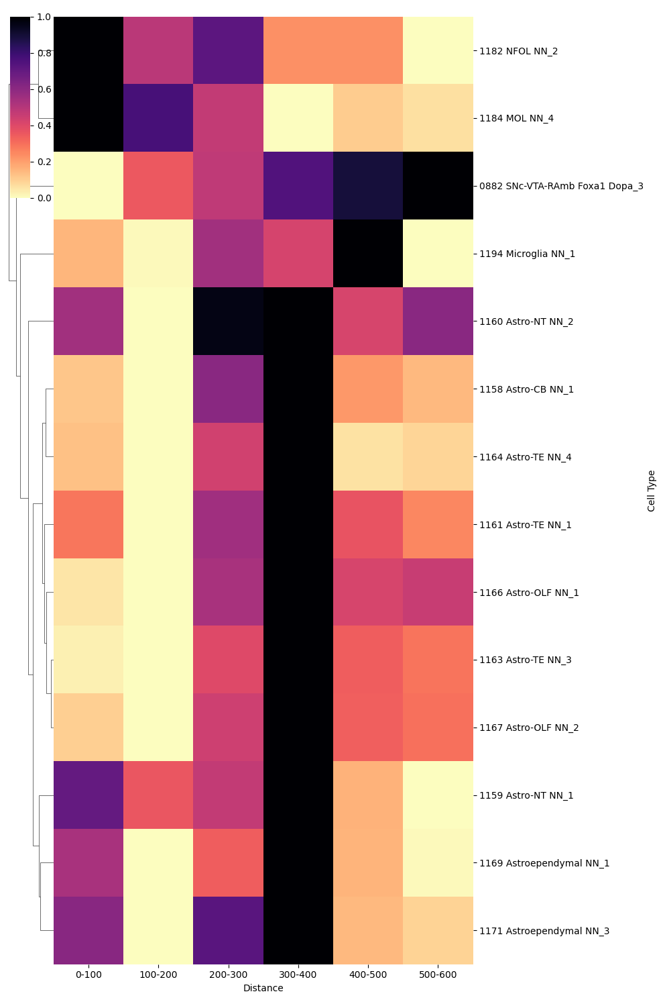

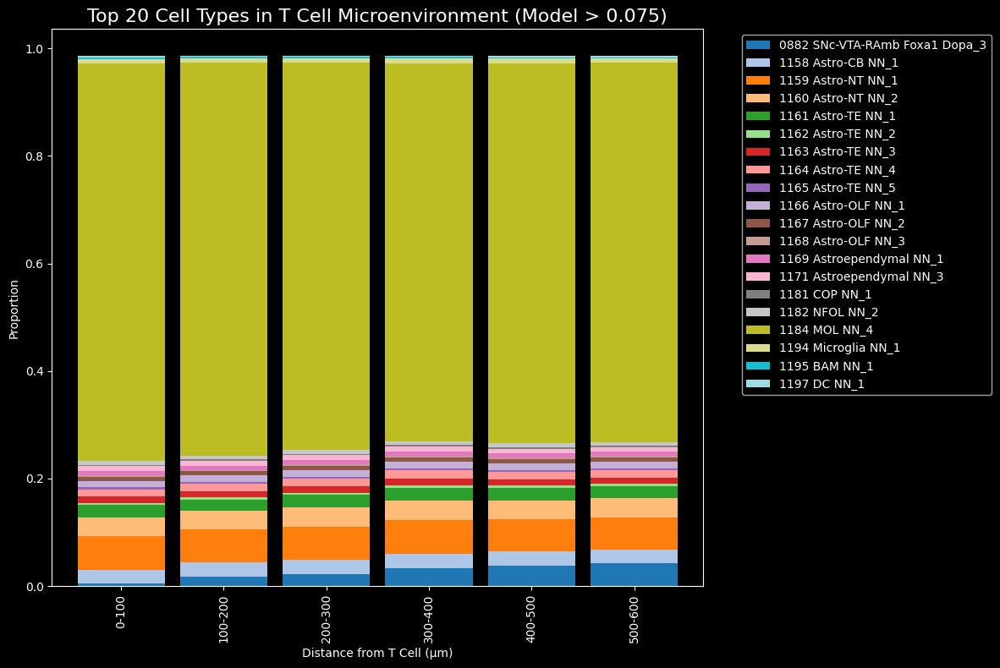

In [ ]:
from config import ROI_LEFT_BOX, ROI_RIGHT_BOX
from utils import get_spatial_xy, get_roi_masks
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
from scipy.spatial import KDTree

# === 1. 自动捕获所有细胞类型 ===
# 假设细胞丰度列以 'q05_cell_abundance_w_sf_' 开头或包含 'NN_'
# 我们抓取所有相关的列
all_cell_cols = [c for c in adata.obs.columns if 'q05_cell_abundance_w_sf' in c]

# 如果没找到长名，尝试找短名 (取决于之前的重命名)
if not all_cell_cols:
    all_cell_cols = [c for c in adata.obs.columns if 'NN_' in c]

# 清洗列名：去掉前缀，只保留细胞名
clean_names = {}
for col in all_cell_cols:
    # 提取 '1201 T cells NN_4' 这种核心部分
    # 假设格式是 prefix_Name
    if 'q05_cell_abundance_w_sf_' in col:
        name = col.split('q05_cell_abundance_w_sf_')[-1]
    else:
        name = col
    clean_names[col] = name

print(f"共捕获 {len(all_cell_cols)} 种细胞类型")

# === 2. 参数设置 ===
threshold = 0.075 # T细胞锚点
step = 100
max_dist = 600
rings = [(i, i + step) for i in range(0, max_dist, step)]

# T细胞列 (用于定中心)
t_cell_col = [c for c in all_cell_cols if 'T cells' in c][0]

# === 3. 定义 ROI ===
x, y = get_spatial_xy(adata)
mask_L, mask_R = get_roi_masks(x, y, ROI_LEFT_BOX, ROI_RIGHT_BOX)
roi_masks = {'Model (Left)': mask_L, 'Control (Right)': mask_R}

# === 4. 空间梯度计算 ===
plot_data = []
print(f"正在扫描 0-{max_dist}um 范围内的所有细胞...")

for region, mask in roi_masks.items():
    region_obs = adata.obs[mask]
    
    # 中心点
    center_mask = region_obs[t_cell_col].values > threshold
    centers = region_coords[center_mask]
    
    if len(centers) == 0: continue
    
    tree = KDTree(region_coords)
    
    for r_min, r_max in rings:
        indices_list = tree.query_ball_point(centers, r_max)
        
        # 初始化计数器
        layer_counts = {clean_names[col]: 0.0 for col in all_cell_cols}
        
        for i, idxs in enumerate(indices_list):
            if not idxs: continue
            
            # 距离过滤
            neighbors_coords = region_coords[idxs]
            dists = np.linalg.norm(neighbors_coords - centers[i], axis=1)
            
            ring_mask = (dists > r_min) & (dists <= r_max)
            if r_min == 0: ring_mask = (dists >= 0) & (dists <= r_max)
            valid_idxs = np.array(idxs)[ring_mask]
            
            if len(valid_idxs) > 0:
                # 批量求和 (速度优化)
                # 提取这些 bin 的所有细胞丰度并求和
                sum_vals = region_obs.iloc[valid_idxs][all_cell_cols].sum(axis=0)
                for col, val in sum_vals.items():
                    layer_counts[clean_names[col]] += val
        
        row = layer_counts.copy()
        row['Region'] = region
        row['Distance'] = f"{r_min}-{r_max}"
        plot_data.append(row)

# === 5. 数据处理与绘图 ===
df = pd.DataFrame(plot_data)

if len(df) > 0:
    # 转换长表
    cell_types = list(clean_names.values())
    df_melt = df.melt(id_vars=['Region', 'Distance'], value_vars=cell_types, 
                      var_name='Cell Type', value_name='Abundance')
    
    # 计算区域内的相对比例 (Proportion)
    df_melt['Proportion'] = df_melt.groupby(['Region', 'Distance'])['Abundance'].transform(lambda x: x / x.sum())

    # --- 可视化 A: 全景热图 (Model 侧) ---
    # 我们主要关注 Model 侧的变化
    model_df = df_melt[df_melt['Region'] == 'Model (Left)'].copy()
    
    if len(model_df) > 0:
        # 透视表: 行=细胞类型, 列=距离
        heatmap_data = model_df.pivot(index='Cell Type', columns='Distance', values='Proportion')
        
        # 排序: 确保距离列顺序正确
        dist_order = sorted(heatmap_data.columns, key=lambda x: int(x.split('-')[0]))
        heatmap_data = heatmap_data[dist_order]
        
        # 过滤: 去掉那些在任何距离都 < 0.5% 的极低丰度细胞，否则图太长
        keep_cells = heatmap_data.max(axis=1) > 0.005 
        heatmap_data_filtered = heatmap_data[keep_cells]
        
        # 归一化 (Row Z-Score): 为了看趋势 (是靠近 T 细胞高，还是远离高)
        # 或者直接画比例 (0-1)
        # 这里我们画比例，更直观
        
        plt.style.use('default') # 热图用白底
        plt.figure(figsize=(10, 15)) # 长图
        
        # 聚类排序: 将分布模式相似的细胞排在一起
        sns.clustermap(
            heatmap_data_filtered, 
            col_cluster=False, # 距离轴不聚类
            row_cluster=True,  # 细胞轴聚类
            cmap='magma_r',    # 颜色越深比例越高
            standard_scale=0,  # 按行标准化 (0-1)，凸显每种细胞的"富集区"
            figsize=(10, 15),
            dendrogram_ratio=(0.1, 0.01),
            cbar_pos=(0.02, 0.8, 0.03, 0.18) # 调整 colorbar 位置
        )
        
        print("全景热图已生成: Clustermap_All_Cells.png (显示的是相对富集趋势)")
        plt.savefig('Clustermap_All_Cells.png', dpi=300)

    # --- 可视化 B: 核心区 vs 远端 (Top 20 堆叠图) ---
    # 找出 Model 侧最丰富的 Top 20 细胞
    top_cells = model_df.groupby('Cell Type')['Abundance'].sum().nlargest(20).index.tolist()
    
    df_top = model_df[model_df['Cell Type'].isin(top_cells)].copy()
    
    # 手动排序 Distance
    df_top['Dist_Sort'] = df_top['Distance'].apply(lambda x: int(x.split('-')[0]))
    df_top = df_top.sort_values('Dist_Sort')
    
    pivot_top = df_top.pivot(index='Distance', columns='Cell Type', values='Proportion')
    pivot_top = pivot_top.reindex(sorted(pivot_top.index, key=lambda x: int(x.split('-')[0])))
    
    # 绘图
    plt.style.use('dark_background')
    fig, ax = plt.subplots(figsize=(12, 8))
    pivot_top.plot(kind='bar', stacked=True, ax=ax, colormap='tab20', width=0.85)
    
    ax.set_title(f'Top 20 Cell Types in T Cell Microenvironment (Model > {threshold})', fontsize=16)
    ax.set_xlabel('Distance from T Cell (µm)')
    ax.set_ylabel('Proportion')
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.savefig('Stacked_All_Cells_Top20.png', dpi=300)
    print("堆叠图已生成: Stacked_All_Cells_Top20.png")

    # --- 输出 C: 核心区 (0-100) 详细成分表 ---
    print("\n" + "="*80)
    print("【T细胞核心区 (0-100μm) 详细细胞构成】")
    print("-" * 80)
    core_df = model_df[model_df['Distance'] == '0-100'].sort_values('Proportion', ascending=False)
    
    # 打印前 30 个
    print(f"{'Cell Type':<40} | {'Proportion':<10}")
    print("-" * 80)
    for i, row in core_df.head(30).iterrows():
        print(f"{row['Cell Type']:<40} | {row['Proportion']:.2%}")
    print("="*80)

else:
    print("未生成数据，可能是阈值太高导致没有中心点。")


已合并 1 种 Glut 神经元 -> 'Total_Glut'
警告：未找到 GABA 神经元列
最终分析组分: ['Dopa_3', 'Microglia', 'NK cells', 'B cells', 'DC', 'BAM']

开始计算 T cell (>0.07) 周围 0-600um 的细胞分布...
堆叠层级 (底->顶): ['NK cells', 'B cells', 'DC', 'BAM', 'Microglia', 'Dopa_3']

图表已保存: Spatial_Full_Gradient_Merged.png


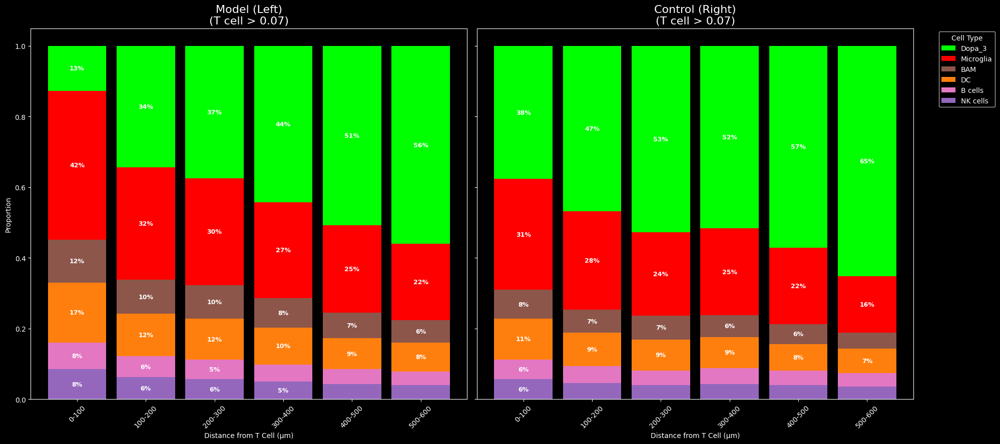

In [ ]:
from config import ROI_LEFT_BOX, ROI_RIGHT_BOX
from utils import get_spatial_xy, get_roi_masks
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
from scipy.spatial import KDTree

# === 1. 数据预处理：合并 Glut 和 GABA ===
# 找到所有相关列
glut_cols = [c for c in adata.obs.columns if 'Glut' in c]
gaba_cols = [c for c in adata.obs.columns if 'GABA' in c]

# 合并计算 (创建一个新列)
if glut_cols:
    adata.obs['Total_Glut'] = adata.obs[glut_cols].sum(axis=1)
    print(f"已合并 {len(glut_cols)} 种 Glut 神经元 -> 'Total_Glut'")
else:
    print("警告：未找到 Glut 神经元列")
    adata.obs['Total_Glut'] = 0

if gaba_cols:
    adata.obs['Total_GABA'] = adata.obs[gaba_cols].sum(axis=1)
    print(f"已合并 {len(gaba_cols)} 种 GABA 神经元 -> 'Total_GABA'")
else:
    print("警告：未找到 GABA 神经元列")
    adata.obs['Total_GABA'] = 0

# === 2. 参数设置 ===
threshold = 0.07  # T细胞阈值
step = 100
max_dist = 600
rings = [(i, i + step) for i in range(0, max_dist, step)]

# T 细胞列
t_cell_col = 'q05_cell_abundance_w_sf_1201 T cells NN_4'
if t_cell_col not in adata.obs.columns:
    matches = [c for c in adata.obs.columns if 'T cells' in c]
    if matches: t_cell_col = matches[0]

# === 3. 定义分析对象 (精确指定) ===
# 键名是图例显示的名称，列表是 adata.obs 中的列名
target_groups = {
    # 顶层受害者
    'Dopa_3': ['SNc-VTA-RAmb Foxa1 Dopa_3'],
    
    # 核心炎症
    'Microglia': ['Microglia'],
    
    # 背景神经元 (合并后的)
    'As': ['Astro-TE NN_5'],

    
    # 辅助免疫
    'NK cells': ['NK cells'],
    'B cells': ['B cells'],
    'DC': ['DC'],
    'BAM': ['BAM']
}

# 自动映射列名 (支持模糊匹配，但优先用精确匹配)
target_cols = {}
for group, keys in target_groups.items():
    found_cols = []
    for k in keys:
        if k in adata.obs.columns:
            found_cols.append(k) # 优先精确
        else:
            # 模糊查找 (排除掉不相关的)
            matches = [c for c in adata.obs.columns if k in c]
            clean = [c for c in matches if 'Astro' not in c and 'MOL' not in c]
            found_cols.extend(clean)
    
    if found_cols:
        target_cols[group] = list(set(found_cols))

print(f"最终分析组分: {list(target_cols.keys())}")

# === 4. 定义 ROI ===
x, y = get_spatial_xy(adata)
mask_L, mask_R = get_roi_masks(x, y, ROI_LEFT_BOX, ROI_RIGHT_BOX)
roi_masks = {'Model (Left)': mask_L, 'Control (Right)': mask_R}

# === 5. 核心计算 ===
plot_data = []
print(f"\n开始计算 T cell (>{threshold}) 周围 0-{max_dist}um 的细胞分布...")

for region, mask in roi_masks.items():
    region_obs = adata.obs[mask]
    
    # 中心点
    center_mask = region_obs[t_cell_col].values > threshold
    centers = region_coords[center_mask]
    
    if len(centers) == 0: continue
    tree = KDTree(region_coords)
    
    for r_min, r_max in rings:
        indices_list = tree.query_ball_point(centers, r_max)
        layer_counts = {k: 0.0 for k in target_groups.keys()}
        
        for i, idxs in enumerate(indices_list):
            if not idxs: continue
            
            neighbors_coords = region_coords[idxs]
            dists = np.linalg.norm(neighbors_coords - centers[i], axis=1)
            
            ring_mask = (dists > r_min) & (dists <= r_max)
            if r_min == 0: ring_mask = (dists >= 0) & (dists <= r_max)
            valid_idxs = np.array(idxs)[ring_mask]
            
            if len(valid_idxs) > 0:
                for group, cols in target_cols.items():
                    val = region_obs.iloc[valid_idxs][cols].sum(axis=1).sum()
                    layer_counts[group] += val
        
        row = layer_counts.copy()
        row['Region'] = region
        row['Distance'] = f"{r_min}-{r_max}"
        plot_data.append(row)

# === 6. 数据整理与绘图 ===
df = pd.DataFrame(plot_data)

if len(df) > 0:
    cell_cols = list(target_cols.keys())
    df_melt = df.melt(id_vars=['Region', 'Distance'], value_vars=cell_cols, 
                      var_name='Cell Type', value_name='Abundance')
    
    # 计算比例
    df_melt['Proportion'] = df_melt.groupby(['Region', 'Distance'])['Abundance'].transform(lambda x: x / x.sum())
    
    # === 定义堆叠顺序 (视觉上从下到上) ===
    # 底部: 背景神经元 + 辅助免疫
    bottom_group = ['Glut Neurons', 'GABA Neurons', 'NK cells', 'B cells', 'DC', 'BAM']
    # 中间: Microglia
    mid_group = ['Microglia']
    # 顶部: Dopa_3 (重点)
    top_group = ['Dopa_3']
    
    # 组合 (注意：列表最后的画在最上面)
    # 先把 bottom 里实际存在的找出来并排序
    exist_cols = df_melt['Cell Type'].unique()
    final_order = []
    
    for g in bottom_group: 
        if g in exist_cols: final_order.append(g)
    for g in mid_group: 
        if g in exist_cols: final_order.append(g)
    for g in top_group: 
        if g in exist_cols: final_order.append(g)
        
    print(f"堆叠层级 (底->顶): {final_order}")
    
    # === 配色方案 ===
    color_map = {
        'Dopa_3': '#00FF00',        # 亮绿 (C位受害者)
        'Microglia': '#FF0000',     # 亮红 (C位打手)
        'Glut Neurons': '#1f77b4',  # 蓝 (深沉背景)
        'GABA Neurons': '#aec7e8',  # 浅蓝 (深沉背景)
        'NK cells': '#9467bd',      # 紫
        'B cells': '#e377c2',       # 粉
        'DC': '#ff7f0e',            # 橙
        'BAM': '#8c564b'            # 褐
    }
    
    # 绘图
    plt.style.use('dark_background')
    fig, axes = plt.subplots(1, 2, figsize=(20, 9), sharey=True)
    regions = ['Model (Left)', 'Control (Right)']
    
    for i, reg in enumerate(regions):
        ax = axes[i]
        subset = df_melt[df_melt['Region'] == reg].copy()
        
        if len(subset) == 0: continue
        
        pivot_df = subset.pivot(index='Distance', columns='Cell Type', values='Proportion')
        
        # 排序 X 轴
        sorted_dist = sorted(pivot_df.index, key=lambda x: int(x.split('-')[0]))
        pivot_df = pivot_df.reindex(sorted_dist)
        
        # 排序 Columns (堆叠顺序)
        valid_cols = [c for c in final_order if c in pivot_df.columns]
        pivot_df = pivot_df[valid_cols]
        
        colors = [color_map.get(c, 'grey') for c in pivot_df.columns]
        
        pivot_df.plot(kind='bar', stacked=True, ax=ax, color=colors, width=0.85)
        
        ax.set_title(f'{reg}\n(T cell > {threshold})', fontsize=16)
        ax.set_xlabel('Distance from T Cell (µm)')
        ax.set_ylabel('Proportion')
        ax.tick_params(axis='x', rotation=45)
        
        # 调整图例顺序 (为了直观，图例从上到下对应图形从上到下)
        if i == 1:
            handles, labels = ax.get_legend_handles_labels()
            ax.legend(reversed(handles), reversed(labels), bbox_to_anchor=(1.05, 1), loc='upper left', title='Cell Type')
        else:
            ax.get_legend().remove()
            
        # 标注
        for p in ax.patches:
            h, w, x, y = p.get_height(), p.get_width(), p.get_xy()[0], p.get_xy()[1]
            if h > 0.05: # 只标 >5%
                ax.text(x+w/2, y+h/2, f"{h:.0%}", ha='center', va='center', fontsize=9, color='white', fontweight='bold')

    plt.tight_layout()
    plt.savefig('Spatial_Full_Gradient_Merged.png', dpi=300)
    print("\n图表已保存: Spatial_Full_Gradient_Merged.png")
    
else:
    print("错误：未生成有效数据。")


In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
from scipy.spatial import KDTree

# =========================
# 0. 字体配置 (核心)
# =========================
plt.style.use("default")

# 您的字体路径
TNR_TTF = "/home/yuanyanyao/Downloads/数据/DATA_T_CSF_PBMC/times-new-roman/times.ttf"

# 字体加载逻辑
if os.path.exists(TNR_TTF):
    fm.fontManager.addfont(TNR_TTF)
    prop = fm.FontProperties(fname=TNR_TTF)
    font_name = prop.get_name()
    print(f"✅ 成功加载字体: {font_name} (路径: {TNR_TTF})")
    
    # 设置全局字体
    plt.rcParams["font.family"] = "serif"
    plt.rcParams["font.serif"] = [font_name]
else:
    print(f"⚠️ 未找到字体文件: {TNR_TTF}，将使用系统默认字体。")
    prop = fm.FontProperties() # 使用默认

# 导出设置 (保证 PDF 文字可编辑)
plt.rcParams["axes.unicode_minus"] = False
plt.rcParams["pdf.fonttype"] = 42
plt.rcParams["ps.fonttype"] = 42

# =========================
# 1. 参数设置
# =========================
threshold = 0.075  
step = 100         
max_dist = 600     
rings = [(i, i + step) for i in range(0, max_dist, step)] 
um_conversion = 0.5 

# 查找 T 细胞列
t_cell_col = 'q05_cell_abundance_w_sf_1201 T cells NN_4'
if t_cell_col not in adata.obs.columns:
    matches = [c for c in adata.obs.columns if 'T cells' in c]
    if matches: t_cell_col = matches[0]

# =========================
# 2. 定义细胞组 (含胶质细胞)
# =========================
target_groups_all = {
    'Dopa Neurons': ['SNc-VTA', 'Dopa'],
    'Microglia': ['Microglia'],
    'NK cells': ['NK cells'],
    'B cells': ['B cells'],
    'DC': ['DC'],
    'BAM': ['BAM'],
    'Astrocytes': ['Astro'],               # 星形胶质
    'Oligodendrocytes': ['MOL', 'NFOL', 'OPC'] # 少突胶质
}

# 自动映射列名
target_cols = {}
for group, keys in target_groups_all.items():
    found_cols = []
    for k in keys:
        found_cols.extend([c for c in adata.obs.columns if k in c])
    
    # 过滤逻辑：防止重叠
    if group not in ['Astrocytes', 'Oligodendrocytes']:
        clean_cols = [c for c in found_cols if not any(x in c for x in ['Astro', 'MOL', 'OPC'])]
    else:
        clean_cols = found_cols 
        
    clean_cols = [c for c in clean_cols if 'T cells' not in c] 
    if clean_cols:
        target_cols[group] = list(set(clean_cols))

print(f"分析组分: {list(target_cols.keys())}")

# =========================
# 3. 计算空间分布 (KDTree)
# =========================
x, y = adata.obsm['spatial'][:, 0], adata.obsm['spatial'][:, 1]
roi_masks = {
    'Model (Left)': (x >= 6000) & (x <= 7800) & (y >= 11400) & (y <= 13200),
    'Control (Right)': (x >= 12200) & (x <= 14000) & (y >= 11400) & (y <= 13200)
}

plot_data = []
print(f"开始计算空间梯度...")

for region, mask in roi_masks.items():
    region_coords = adata.obsm['spatial'][mask]
    region_obs = adata.obs[mask]
    center_mask = region_obs[t_cell_col].values > threshold
    centers = region_coords[center_mask]
    
    if len(centers) == 0: continue
    tree = KDTree(region_coords)
    
    for r_min, r_max in rings:
        indices_list = tree.query_ball_point(centers, r_max)
        layer_counts = {k: 0.0 for k in target_groups_all.keys()}
        
        for i, idxs in enumerate(indices_list):
            if not idxs: continue
            neighbors_coords = region_coords[idxs]
            dists = np.linalg.norm(neighbors_coords - centers[i], axis=1)
            # 环形过滤
            ring_mask = (dists > r_min) & (dists <= r_max) if r_min > 0 else (dists >= 0) & (dists <= r_max)
            valid_idxs = np.array(idxs)[ring_mask]
            
            if len(valid_idxs) > 0:
                for group, cols in target_cols.items():
                    val = region_obs.iloc[valid_idxs][cols].sum(axis=1).sum()
                    layer_counts[group] += val
        
        row = layer_counts.copy()
        row['Region'] = region
        row['Distance'] = f"{int(r_min * um_conversion)}-{int(r_max * um_conversion)}"
        row['Dist_Sort'] = r_min 
        plot_data.append(row)

df_all = pd.DataFrame(plot_data)

# =========================
# 4. 绘图与导出函数
# =========================
def plot_stack_bar(df, include_cols, palette_dict, stack_order, filename_suffix):
    if len(df) == 0: return

    # 数据准备
    valid_cols = [c for c in include_cols if c in df.columns]
    df_melt = df.melt(id_vars=['Region', 'Distance', 'Dist_Sort'], 
                      value_vars=valid_cols, 
                      var_name='Cell Type', value_name='Abundance')
    df_melt['Proportion'] = df_melt.groupby(['Region', 'Distance'])['Abundance'].transform(lambda x: x / x.sum())
    
    # 绘图
    fig, axes = plt.subplots(1, 2, figsize=(16, 8), sharey=True)
    regions = ['Model (Left)', 'Control (Right)']
    
    for i, reg in enumerate(regions):
        ax = axes[i]
        subset = df_melt[df_melt['Region'] == reg].copy()
        if len(subset) == 0: continue
        
        pivot_df = subset.pivot(index='Distance', columns='Cell Type', values='Proportion')
        
        # 排序
        sorted_index = sorted(pivot_df.index, key=lambda x: int(x.split('-')[0]))
        pivot_df = pivot_df.reindex(sorted_index)
        
        # 堆叠顺序
        current_stack = [c for c in stack_order if c in pivot_df.columns]
        rem = [c for c in pivot_df.columns if c not in current_stack]
        pivot_df = pivot_df[rem + current_stack]
        
        color_list = [palette_dict.get(c, '#333333') for c in pivot_df.columns]
        
        pivot_df.plot(kind='bar', stacked=True, ax=ax, color=color_list, width=0.92, edgecolor='white', linewidth=0.5)
        
        # 应用字体
        ax.set_title(f'{reg}', fontsize=18, fontproperties=prop, pad=15)
        ax.set_xlabel('Distance from T Cell (µm)', fontsize=14, fontproperties=prop)
        if i == 0:
            ax.set_ylabel('Proportion', fontsize=14, fontproperties=prop)
        else:
            ax.set_ylabel('')
            
        for label in ax.get_xticklabels() + ax.get_yticklabels():
            label.set_fontproperties(prop)
            label.set_fontsize(12)
        
        if i == 1:
            handles, labels = ax.get_legend_handles_labels()
            leg = ax.legend(handles[::-1], labels[::-1], bbox_to_anchor=(1.02, 1), 
                            loc='upper left', title='Cell Type', 
                            prop=prop, frameon=False)
            leg.get_title().set_fontproperties(prop)
            leg.get_title().set_fontsize(14)
            for text in leg.get_texts(): text.set_fontproperties(prop)
        else:
            ax.get_legend().remove()
            
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

    plt.tight_layout()
    
    # === 关键：导出 PDF 和 600 DPI PNG ===
    pdf_name = f'Spatial_Gradient_{filename_suffix}.pdf'
    png_name = f'Spatial_Gradient_{filename_suffix}.png'
    
    plt.savefig(pdf_name, format='pdf', bbox_inches='tight')
    plt.savefig(png_name, dpi=600, bbox_inches='tight')
    
    print(f"✅ 已保存: {pdf_name} (矢量) & {png_name} (600 DPI)")
    plt.close() # 关闭画布释放内存

# =========================
# 5. 执行三种配置的绘图
# =========================

# 配色
base_palette = {
    'Microglia': '#A06FA6', 'Dopa Neurons': '#9AAFC4', 'DC': '#7C8699',
    'NK cells': '#5FA38C', 'B cells': '#3E8FA3', 'BAM': '#2F5F8A'
}
glia_palette = {
    'Astrocytes': '#E8C547',       # 暖黄 (区别于冷色)
    'Oligodendrocytes': '#D98880'  # 柔粉 (区别于冷色)
}
full_palette = {**base_palette, **glia_palette}

# 配置 1: 原始 (仅免疫)
cols_orig = ['Microglia', 'Dopa Neurons', 'DC', 'NK cells', 'B cells', 'BAM']
ord_orig = ['BAM', 'B cells', 'NK cells', 'DC', 'Dopa Neurons', 'Microglia']

# 配置 2: 全部 (含胶质)
cols_all_cells = cols_orig + ['Astrocytes', 'Oligodendrocytes']
ord_all_cells = ['Oligodendrocytes', 'Astrocytes'] + ord_orig 

# 配置 3: 仅胶质
cols_glia_only = ['Astrocytes', 'Oligodendrocytes']
ord_glia_only = ['Oligodendrocytes', 'Astrocytes']

# 运行
print("\n--- 正在生成图表 1/3: 原始免疫组 ---")
plot_stack_bar(df_all, cols_orig, base_palette, ord_orig, "Original_Immune")

print("\n--- 正在生成图表 2/3: 全细胞 (含胶质) ---")
plot_stack_bar(df_all, cols_all_cells, full_palette, ord_all_cells, "All_Cells_with_Glia")

print("\n--- 正在生成图表 3/3: 仅胶质细胞 ---")
plot_stack_bar(df_all, cols_glia_only, glia_palette, ord_glia_only, "Glia_Only")

print("\n🎉 全部完成！请查看目录下的 PDF 和 PNG 文件。")

✅ 成功加载字体: Times New Roman (路径: /home/yuanyanyao/Downloads/数据/DATA_T_CSF_PBMC/times-new-roman/times.ttf)
分析组分: ['Dopa Neurons', 'Microglia', 'NK cells', 'B cells', 'DC', 'BAM', 'Astrocytes', 'Oligodendrocytes']
开始计算空间梯度...

--- 正在生成图表 1/3: 原始免疫组 ---
✅ 已保存: Spatial_Gradient_Original_Immune.pdf (矢量) & Spatial_Gradient_Original_Immune.png (600 DPI)

--- 正在生成图表 2/3: 全细胞 (含胶质) ---
✅ 已保存: Spatial_Gradient_All_Cells_with_Glia.pdf (矢量) & Spatial_Gradient_All_Cells_with_Glia.png (600 DPI)

--- 正在生成图表 3/3: 仅胶质细胞 ---
✅ 已保存: Spatial_Gradient_Glia_Only.pdf (矢量) & Spatial_Gradient_Glia_Only.png (600 DPI)

🎉 全部完成！请查看目录下的 PDF 和 PNG 文件。


In [ ]:
from config import ROI_LEFT_BOX, ROI_RIGHT_BOX
from utils import get_spatial_xy, get_roi_masks
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
from scipy.spatial import KDTree
import os
import warnings

# 忽略可能的计算警告
warnings.filterwarnings('ignore')

# === 1. 基础参数设置 ===
threshold = 0.07  # T细胞阈值
step = 100
max_dist = 600
rings = [(i, i + step) for i in range(0, max_dist, step)]

# 自动查找 T 细胞列
t_cell_col = 'q05_cell_abundance_w_sf_1201 T cells NN_4'
if t_cell_col not in adata.obs.columns:
    matches = [c for c in adata.obs.columns if 'T cells' in c]
    if matches: t_cell_col = matches[0]

# 定义 ROI
x, y = get_spatial_xy(adata)
mask_L, mask_R = get_roi_masks(x, y, ROI_LEFT_BOX, ROI_RIGHT_BOX)
roi_masks = {'Model (Left)': mask_L, 'Control (Right)': mask_R}

# === 2. 定义细胞组 (核心不变部分) ===
core_groups = {
    'Dopa_3': ['SNc-VTA-RAmb Foxa1 Dopa_3'], # 顶层受害者
    'Microglia': ['Microglia'],              # 次顶层打手
    'NK cells': ['NK cells'],
    'B cells': ['B cells'],
    'DC': ['DC'],
    'BAM': ['BAM']
}

# === 3. 定义要轮换的背景细胞列表 ===
bg_cells_to_test = [
    'Astro-TE NN_5', 
    'Astro-TE NN_2', 
    'COP NN_1'
]

# === 4. 配色方案 (核心固定，背景可变) ===
base_colors = {
    'Dopa_3': '#00FF00',        # 亮绿 (顶)
    'Microglia': '#FF0000',     # 亮红 (次)
    'NK cells': '#9467bd',      # 紫
    'B cells': '#e377c2',       # 粉
    'DC': '#ff7f0e',            # 橙
    'BAM': '#8c564b'            # 褐
}
# 为3种背景分配不同的蓝色/冷色调
bg_color_palette = ['#1f77b4', '#00BCD4', '#009688'] 

# 创建输出目录
output_dir = 'spatial_gradient_plots'
os.makedirs(output_dir, exist_ok=True)
print(f"结果将保存在: {output_dir}/")

# === 5. 主循环：对每种背景细胞进行分析 ===
for i_bg, bg_cell_name in enumerate(bg_cells_to_test):
    print(f"\n{'='*60}")
    print(f"正在处理背景细胞: {bg_cell_name} ({i_bg+1}/{len(bg_cells_to_test)})")
    print(f"{'='*60}")

    # --- 5.1 构建当前的分析组 ---
    current_groups = core_groups.copy()
    # 使用完整名称作为键，确保精确
    bg_group_key = bg_cell_name
    current_groups[bg_group_key] = [bg_cell_name]

    # --- 5.2 映射到列名 (精确匹配背景) ---
    target_cols = {}
    for group, keys in current_groups.items():
        found_cols = []
        for k in keys:
            # 查找包含关键词的列
            matches = [c for c in adata.obs.columns if k in c]
            
            # 对核心组进行过滤，防止混入其他胶质
            if group in core_groups:
                # 这里的过滤稍微放宽，只排除显式的其他类型
                clean = [c for c in matches if 'T cells' not in c]
                # 对于 Dopa_3，需要非常精确
                if group == 'Dopa_3':
                     clean = [c for c in matches if k == c] # 假设输入的就是精确名
            else:
                # 对于背景细胞，我们需要精确匹配
                clean = [c for c in matches if k in c] # 只要包含这个特定名字就行
            
            found_cols.extend(clean)
        
        if found_cols:
            # 去重
            target_cols[group] = list(set(found_cols))
    
    print(f"  -> 最终分析组分: {list(target_cols.keys())}")

    # --- 5.3 核心计算循环 (空间梯度) ---
    plot_data = []
    for region, mask in roi_masks.items():
        region_obs = adata.obs[mask]
        
        center_mask = region_obs[t_cell_col].values > threshold
        centers = region_coords[center_mask]
        
        if len(centers) == 0: continue
        tree = KDTree(region_coords)
        
        for r_min, r_max in rings:
            indices_list = tree.query_ball_point(centers, r_max)
            layer_counts = {k: 0.0 for k in target_cols.keys()}

            for center_idx, idxs in enumerate(indices_list):
                if not idxs: continue
                neighbors_coords = region_coords[idxs]
                dists = np.linalg.norm(neighbors_coords - centers[center_idx], axis=1)
                
                ring_mask = (dists > r_min) & (dists <= r_max)
                if r_min == 0: ring_mask = (dists >= 0) & (dists <= r_max)
                valid_idxs = np.array(idxs)[ring_mask]
                
                if len(valid_idxs) > 0:
                    for group, cols in target_cols.items():
                        val = region_obs.iloc[valid_idxs][cols].sum(axis=1).sum()
                        layer_counts[group] += val
            
            row = layer_counts.copy()
            row['Region'] = region
            row['Distance'] = f"{r_min}-{r_max}"
            plot_data.append(row)

    # --- 5.4 数据处理与绘图 ---
    df = pd.DataFrame(plot_data)
    if len(df) == 0:
        print(f"  [警告] {bg_cell_name} 未生成有效数据，跳过绘图。")
        continue

    cell_cols = list(target_cols.keys())
    df_melt = df.melt(id_vars=['Region', 'Distance'], value_vars=cell_cols, 
                      var_name='Cell Type', value_name='Abundance')
    df_melt['Proportion'] = df_melt.groupby(['Region', 'Distance'])['Abundance'].transform(lambda x: x / x.sum())

    # === 定义堆叠顺序 (从底到顶) ===
    # 底部: 背景胶质
    # 中部: 辅助免疫
    # 次顶: Microglia
    # 顶部: Dopa_3
    aux_immune = ['NK cells', 'B cells', 'DC', 'BAM']
    # 确保只包含存在的列
    exist_cols = df_melt['Cell Type'].unique()
    
    final_order = [bg_group_key] # 背景在最下面
    for c in aux_immune: 
        if c in exist_cols: final_order.append(c)
    if 'Microglia' in exist_cols: final_order.append('Microglia')
    if 'Dopa_3' in exist_cols: final_order.append('Dopa_3') # Dopa在最上面
    
    print(f"  -> 堆叠顺序 (底->顶): {final_order}")

    # === 定义当前配色 ===
    current_colors = base_colors.copy()
    current_colors[bg_group_key] = bg_color_palette[i_bg % len(bg_color_palette)]

    # === 绘图 (双子图: Model & Control) ===
    plt.style.use('dark_background')
    fig, axes = plt.subplots(1, 2, figsize=(20, 9), sharey=True)
    regions = ['Model (Left)', 'Control (Right)']

    for j, reg in enumerate(regions):
        ax = axes[j]
        subset = df_melt[df_melt['Region'] == reg].copy()
        if len(subset) == 0: continue
        
        pivot_df = subset.pivot(index='Distance', columns='Cell Type', values='Proportion')
        sorted_dist = sorted(pivot_df.index, key=lambda x: int(x.split('-')[0]))
        pivot_df = pivot_df.reindex(sorted_dist)
        
        # 应用排序
        valid_cols = [c for c in final_order if c in pivot_df.columns]
        pivot_df = pivot_df[valid_cols]
        
        colors = [current_colors.get(c, 'grey') for c in pivot_df.columns]
        
        pivot_df.plot(kind='bar', stacked=True, ax=ax, color=colors, width=0.85)
        
        # 标题包含背景信息
        short_bg_name = bg_group_key.split('NN_')[0] if 'NN_' in bg_group_key else bg_group_key
        ax.set_title(f'{reg}\n(Background: {short_bg_name})', fontsize=16)
        ax.set_xlabel('Distance from T Cell (µm)')
        ax.set_ylabel('Proportion')
        ax.tick_params(axis='x', rotation=45)
        
        # 图例 (只在右图显示，且顺序从上到下)
        if j == 1:
            handles, labels = ax.get_legend_handles_labels()
            ax.legend(reversed(handles), reversed(labels), bbox_to_anchor=(1.05, 1), loc='upper left', title='Cell Type')
        else:
            ax.get_legend().remove()

    # 保存图片
    safe_name = bg_group_key.replace(' ', '_').replace('-', '_')
    output_path = os.path.join(output_dir, f'Spatial_Gradient_{safe_name}.png')
    plt.tight_layout()
    plt.savefig(output_path, dpi=300)
    plt.close() # 关闭画布
    print(f"  -> 图表已保存: {output_path}")

print(f"\n{'='*60}")
print(f"全部完成！共生成 {len(bg_cells_to_test)} 组对比图，请查看 {output_dir}/ 文件夹。")


结果将保存在: spatial_gradient_plots/

正在处理背景细胞: Astro-TE NN_5 (1/3)
  -> 最终分析组分: ['Dopa_3', 'Microglia', 'NK cells', 'B cells', 'DC', 'BAM', 'Astro-TE NN_5']
  -> 堆叠顺序 (底->顶): ['Astro-TE NN_5', 'NK cells', 'B cells', 'DC', 'BAM', 'Microglia', 'Dopa_3']
  -> 图表已保存: spatial_gradient_plots/Spatial_Gradient_Astro_TE_NN_5.png

正在处理背景细胞: Astro-TE NN_2 (2/3)
  -> 最终分析组分: ['Dopa_3', 'Microglia', 'NK cells', 'B cells', 'DC', 'BAM', 'Astro-TE NN_2']
  -> 堆叠顺序 (底->顶): ['Astro-TE NN_2', 'NK cells', 'B cells', 'DC', 'BAM', 'Microglia', 'Dopa_3']
  -> 图表已保存: spatial_gradient_plots/Spatial_Gradient_Astro_TE_NN_2.png

正在处理背景细胞: COP NN_1 (3/3)
  -> 最终分析组分: ['Dopa_3', 'Microglia', 'NK cells', 'B cells', 'DC', 'BAM', 'COP NN_1']
  -> 堆叠顺序 (底->顶): ['COP NN_1', 'NK cells', 'B cells', 'DC', 'BAM', 'Microglia', 'Dopa_3']
  -> 图表已保存: spatial_gradient_plots/Spatial_Gradient_COP_NN_1.png

全部完成！共生成 3 组对比图，请查看 spatial_gradient_plots/ 文件夹。


使用 T 细胞列: q05_cell_abundance_w_sf_1201 T cells NN_4
正在计算功能模块评分...

正在绘制: ROI_Model ...
  -> 图表已保存: Scatter_ROI_Model_Function_Correlation.png

正在绘制: ROI_Control ...
  -> 图表已保存: Scatter_ROI_Control_Function_Correlation.png

正在绘制: Whole_Brain_Model ...
  -> 图表已保存: Scatter_Whole_Brain_Model_Function_Correlation.png

正在绘制: Whole_Brain_Control ...
  -> 图表已保存: Scatter_Whole_Brain_Control_Function_Correlation.png

所有图表绘制完成！


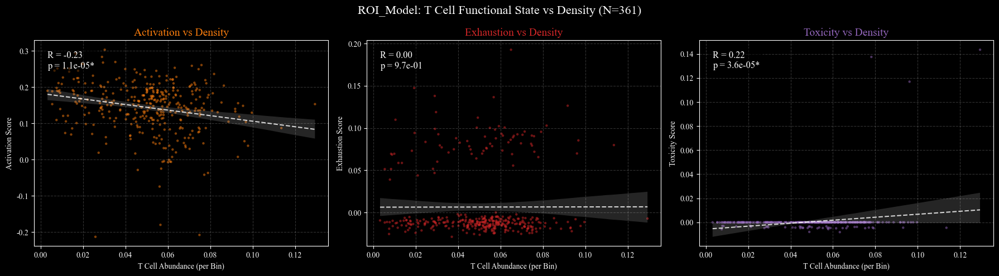

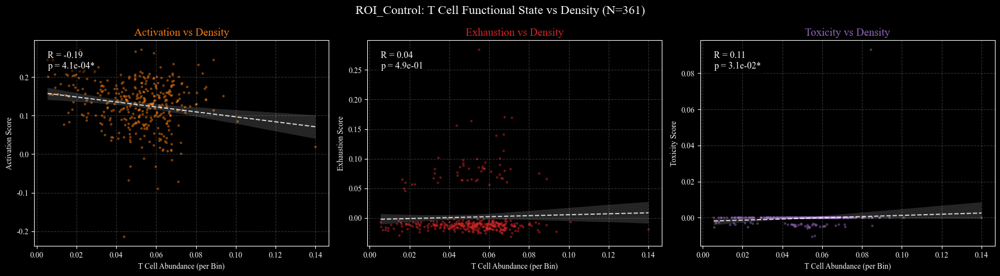

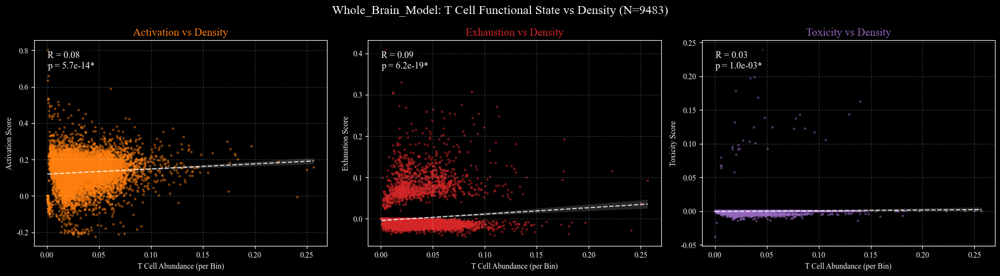

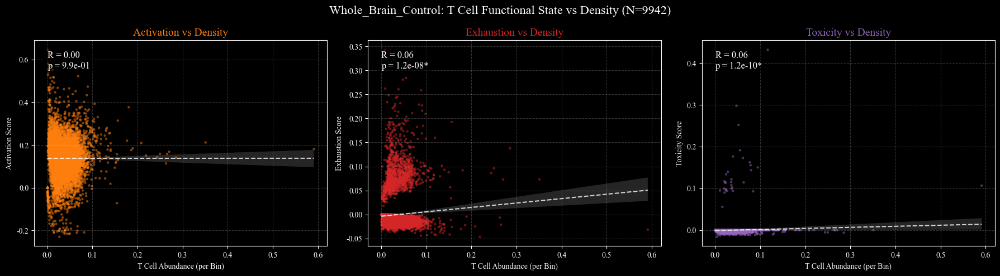

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import scanpy as sc
from scipy.stats import pearsonr

# === 1. 定义基因模块 ===
gene_modules = {
    'Activation': ['Cd69', 'Il2ra', 'Cd44', 'Cd28', 'Icos', 'Tnfrsf4', 'Cd40lg'],
    'Exhaustion': ['Pdcd1', 'Cd274', 'Lag3', 'Havcr2', 'Ctla4', 'Tigit', 'Entpd1'],
    'Toxicity': ['Gzma', 'Gzmb', 'Prf1', 'Ifng', 'Nkg7', 'Gnly']
}

# === 2. 准备数据与计算评分 ===
# A. 确保 T 细胞列存在
t_cell_col = 'q05_cell_abundance_w_sf_1201 T cells NN_4'
if t_cell_col not in adata.obs.columns:
    matches = [c for c in adata.obs.columns if 'T cells' in c]
    if matches: t_cell_col = matches[0]
print(f"使用 T 细胞列: {t_cell_col}")

# B. 计算模块评分 (全脑计算，保证标准统一)
# 确保数据已标准化 (Log1p)
if adata.X.max() > 50:
    print("执行 Log1p 标准化...")
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)

print("正在计算功能模块评分...")
valid_scores = []
for name, genes in gene_modules.items():
    valid = [g for g in genes if g in adata.var_names]
    score_name = f'Score_{name}'
    if valid:
        sc.tl.score_genes(adata, gene_list=valid, score_name=score_name)
        valid_scores.append(score_name)
    else:
        print(f"警告: 模块 {name} 无有效基因。")

# === 3. 定义四个分析区域 (Masks) ===
x, y = adata.obsm['spatial'][:, 0], adata.obsm['spatial'][:, 1]

# 1. ROI Model (Left Box)
mask_roi_m = (x >= 6000) & (x <= 7800) & (y >= 11400) & (y <= 13200)
# 2. ROI Control (Right Box)
mask_roi_c = (x >= 12200) & (x <= 14000) & (y >= 11400) & (y <= 13200)
# 3. Whole Model (Left Hemisphere) - 假设中线在 10000
mask_whole_m = (x < 10000)
# 4. Whole Control (Right Hemisphere)
mask_whole_c = (x >= 10000)

regions = {
    'ROI_Model': mask_roi_m,
    'ROI_Control': mask_roi_c,
    'Whole_Brain_Model': mask_whole_m,
    'Whole_Brain_Control': mask_whole_c
}

# === 4. 循环绘图 ===
plt.style.use('dark_background')

# 颜色映射：激活=橙, 耗竭=红, 毒性=紫
module_colors = {'Score_Activation': '#ff7f0e', 'Score_Exhaustion': '#d62728', 'Score_Toxicity': '#9467bd'}

for region_name, mask in regions.items():
    print(f"\n正在绘制: {region_name} ...")
    
    # 提取该区域数据
    subset = adata.obs[mask].copy()
    
    # **关键过滤**：只保留 T 细胞密度 > 0 的点
    # 否则大量的 0 值会拉低相关性，掩盖真实趋势
    plot_df = subset[subset[t_cell_col] > 1e-6].copy()
    
    if len(plot_df) < 10:
        print(f"  [跳过] 数据点太少 (N={len(plot_df)})")
        continue

    # 创建画布：1行3列
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    
    for i, score_col in enumerate(valid_scores):
        ax = axes[i]
        x_data = plot_df[t_cell_col]
        y_data = plot_df[score_col]
        color = module_colors.get(score_col, 'white')
        
        # 1. 绘制散点
        ax.scatter(x_data, y_data, c=color, s=10, alpha=0.5, edgecolors='none')
        
        # 2. 添加回归线 (Trend Line)
        sns.regplot(x=x_data, y=y_data, ax=ax, scatter=False, color='white', 
                    line_kws={'linestyle': '--', 'linewidth': 1.5, 'alpha': 0.8})
        
        # 3. 计算统计相关性 (Pearson R)
        if len(x_data) > 2:
            r, p = pearsonr(x_data, y_data)
            sig = "*" if p < 0.05 else ""
            stats_text = f"R = {r:.2f}\np = {p:.1e}{sig}"
        else:
            stats_text = "N/A"
            
        # 4. 美化图表
        clean_name = score_col.replace('Score_', '')
        ax.set_title(f'{clean_name} vs Density', fontsize=14, fontweight='bold', color=color)
        ax.set_xlabel('T Cell Abundance (per Bin)')
        ax.set_ylabel(f'{clean_name} Score')
        
        # 在图内添加 R 值标注
        y_range = y_data.max() - y_data.min()
        ax.text(x_data.min(), y_data.max() - y_range*0.1, stats_text, 
                fontsize=12, color='white', fontweight='bold',
                bbox=dict(facecolor='black', alpha=0.5, edgecolor='none'))
        
        ax.grid(True, linestyle='--', alpha=0.2)

    plt.suptitle(f'{region_name}: T Cell Functional State vs Density (N={len(plot_df)})', fontsize=16)
    plt.tight_layout()
    
    # 保存图片
    filename = f'Scatter_{region_name}_Function_Correlation.png'
    plt.savefig(filename, dpi=300)
    print(f"  -> 图表已保存: {filename}")

print("\n所有图表绘制完成！")

横座标模型，纵座标对照侧

✅ 统计摘要已保存至: Whole_Brain_Activation_Stats.xlsx
✅ 小提琴图已保存 (PNG/PDF)


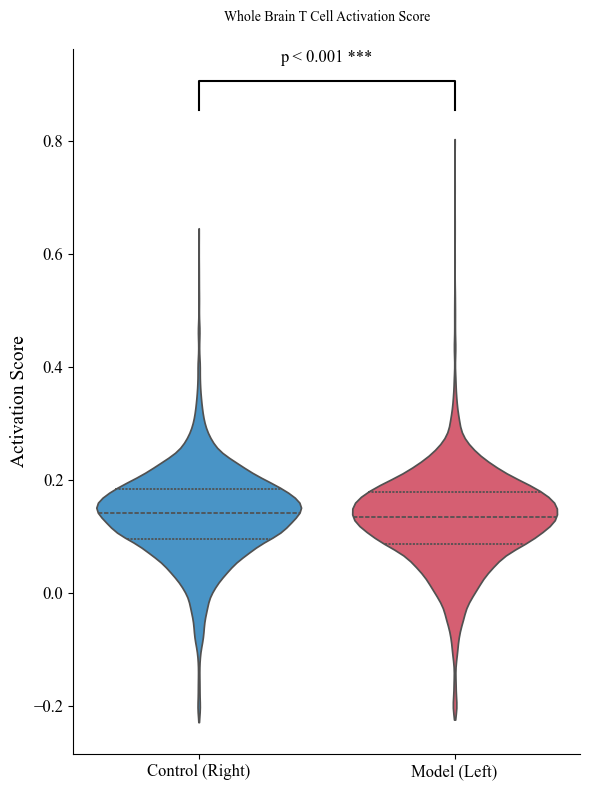

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
from scipy.stats import mannwhitneyu
import matplotlib.font_manager as fm

# =========================
# 0. 环境与字体设置
# =========================
plt.style.use('default') # 小提琴图建议用白底，更清晰
TNR_TTF = "/home/yuanyanyao/Downloads/数据/DATA_T_CSF_PBMC/times-new-roman/times.ttf"
if os.path.exists(TNR_TTF):
    fm.fontManager.addfont(TNR_TTF)
    prop = fm.FontProperties(fname=TNR_TTF)
    plt.rcParams["font.family"] = "serif"
    plt.rcParams["font.serif"] = [prop.get_name()]
else:
    prop = fm.FontProperties()

# =========================
# 1. 评分计算与数据准备
# =========================
# 确保已计算 Score_Activation
if 'Score_Activation' not in adata.obs.columns:
    activation_genes = ['Cd69', 'Il2ra', 'Cd44', 'Cd28', 'Icos', 'Tnfrsf4', 'Cd40lg']
    valid = [g for g in activation_genes if g in adata.var_names]
    sc.tl.score_genes(adata, gene_list=valid, score_name='Score_Activation')

# 定义左右半脑 (以 x=10000 为界)
x_coords = adata.obsm['spatial'][:, 0]
adata.obs['Group'] = np.where(x_coords < 10000, 'Model (Left)', 'Control (Right)')

# 过滤掉 T 细胞丰度过低的点（保证统计的是有 T 细胞存在的区域）
t_cell_col = 'q05_cell_abundance_w_sf_1201 T cells NN_4'
# 如果列名不对，请手动修正
plot_df = adata.obs[adata.obs[t_cell_col] > 1e-5].copy()

# =========================
# 2. 统计检验与导出 Excel
# =========================
model_scores = plot_df[plot_df['Group'] == 'Model (Left)']['Score_Activation']
control_scores = plot_df[plot_df['Group'] == 'Control (Right)']['Score_Activation']

# 使用非参数检验 (Mann-Whitney U)
stat, p_val = mannwhitneyu(model_scores, control_scores, alternative='two-sided')

# 准备统计摘要表
summary_stats = plot_df.groupby('Group')['Score_Activation'].agg(['count', 'mean', 'std', 'min', 'median', 'max'])
summary_stats['p_value'] = p_val
summary_stats.to_csv('Whole_Brain_Activation_Stats.xlsx')
print("✅ 统计摘要已保存至: Whole_Brain_Activation_Stats.xlsx")

# =========================
# 3. 绘制小提琴图
# =========================
plt.figure(figsize=(6, 8))

# 绘制小提琴图 + 箱线图
ax = sns.violinplot(x='Group', y='Score_Activation', data=plot_df, 
                    palette={'Model (Left)': '#E94B65', 'Control (Right)': '#3498DB'},
                    inner="quartile", cut=0)

# 添加显著性标记
y_max = plot_df['Score_Activation'].max()
y_min = plot_df['Score_Activation'].min()
h = (y_max - y_min) * 0.05
plt.plot([0, 0, 1, 1], [y_max+h, y_max+2*h, y_max+2*h, y_max+h], lw=1.5, c='black')
sig_text = "p < 0.001 ***" if p_val < 0.001 else f"p = {p_val:.3f}"
plt.text(0.5, y_max+2.5*h, sig_text, ha='center', va='bottom', fontsize=12, fontproperties=prop)

# 美化
plt.title('Whole Brain T Cell Activation Score', fontsize=16, fontproperties=prop, pad=20)
plt.ylabel('Activation Score', fontsize=14, fontproperties=prop)
plt.xlabel('', fontsize=14)
plt.xticks(fontproperties=prop, fontsize=12)
plt.yticks(fontproperties=prop, fontsize=12)

sns.despine() # 去掉上方和右方边框
plt.tight_layout()

# 导出图片
plt.savefig('Whole_Brain_Activation_Violin.png', dpi=600, bbox_inches='tight')
plt.savefig('Whole_Brain_Activation_Violin.pdf', format='pdf', bbox_inches='tight')

print("✅ 小提琴图已保存 (PNG/PDF)")


--- ROI 统计结果 ---
Model 激活比例 (>0.2): 96.12%
Control 激活比例 (>0.2): 97.78%
显著性差异 P-value: 1.32e-04


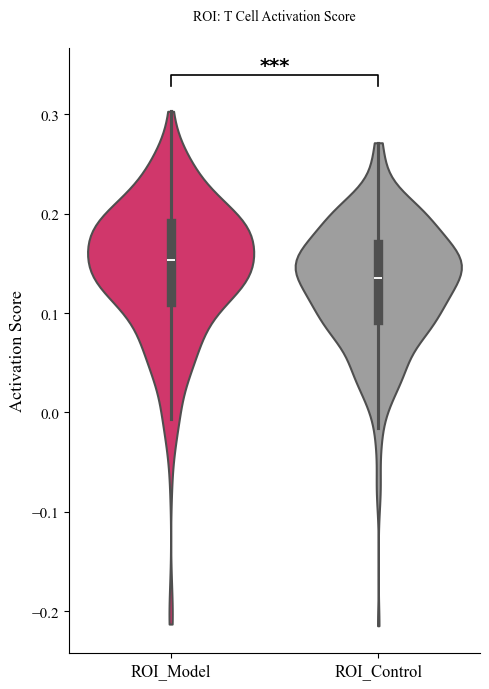

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu

# === 1. 数据提取 (修复 NameError) ===
# 确保 x, y 已经定义
x, y = adata.obsm['spatial'][:, 0], adata.obsm['spatial'][:, 1]

# 定义 ROI 掩码
mask_roi_m = (x >= 6000) & (x <= 7800) & (y >= 11400) & (y <= 13200)
mask_roi_c = (x >= 12200) & (x <= 14000) & (y >= 11400) & (y <= 13200)

# 提取 Score_Activation 数据
# 注意：这里假设你之前已经运行了 sc.tl.score_genes 生成了 'Score_Activation'
m_scores_raw = adata.obs.loc[mask_roi_m, 'Score_Activation'].values
c_scores_raw = adata.obs.loc[mask_roi_c, 'Score_Activation'].values

# 构建绘图用的 DataFrame
df_m = pd.DataFrame({'Group': 'ROI_Model', 'Activation_Score': m_scores_raw})
df_c = pd.DataFrame({'Group': 'ROI_Control', 'Activation_Score': c_scores_raw})
roi_plot_df = pd.concat([df_m, df_c], axis=0)

# === 2. 绘图配置 ===
plt.figure(figsize=(5, 7))
plt.style.use('default')

# 定义颜色
my_palette = {'ROI_Model': '#E91E63', 'ROI_Control': '#9E9E9E'}

# 绘制小提琴图
ax = sns.violinplot(x='Group', y='Activation_Score', data=roi_plot_df, 
                    palette=my_palette, inner="box", cut=0, linewidth=1.5)

# === 3. 统计检验 ===
m_scores = roi_plot_df[roi_plot_df['Group'] == 'ROI_Model']['Activation_Score']
c_scores = roi_plot_df[roi_plot_df['Group'] == 'ROI_Control']['Activation_Score']
stat, p_val = mannwhitneyu(m_scores, c_scores, alternative='two-sided')

# 计算激活点比例 (Score > 0.2)
threshold = 0.2
m_ratio = np.sum(m_scores > threshold) / len(m_scores)
c_ratio = np.sum(c_scores > threshold) / len(c_scores)

# === 4. 添加显著性标注连线 ===
y_max = roi_plot_df['Activation_Score'].max()
y_min = roi_plot_df['Activation_Score'].min()
line_y = y_max + (y_max - y_min) * 0.05
tip_h = (y_max - y_min) * 0.02

plt.plot([0, 0, 1, 1], [line_y, line_y + tip_h, line_y + tip_h, line_y], lw=1.2, c='k')

if p_val < 0.001: sig = "***"
elif p_val < 0.01: sig = "**"
elif p_val < 0.05: sig = "*"
else: sig = "n.s."

plt.text(0.5, line_y + tip_h, sig, ha='center', va='bottom', fontsize=14, fontweight='bold')

# === 5. 美化与导出 ===
# 使用之前加载的 prop (Times New Roman)
plt.title('ROI: T Cell Activation Score', fontsize=16, fontproperties=prop, pad=20)
plt.ylabel('Activation Score', fontsize=13, fontproperties=prop)
plt.xlabel('')
plt.xticks(fontproperties=prop, fontsize=12)
plt.yticks(fontproperties=prop, fontsize=11)

sns.despine()
plt.tight_layout()

# 导出文件
plt.savefig('ROI_Activation_Violin_Final.png', dpi=600, bbox_inches='tight')
plt.savefig('ROI_Activation_Violin_Final.pdf', format='pdf', bbox_inches='tight')
roi_plot_df.to_csv('ROI_Activation_Raw_Data.csv', index=False)

print(f"\n--- ROI 统计结果 ---")
print(f"Model 激活比例 (>0.2): {m_ratio:.2%}")
print(f"Control 激活比例 (>0.2): {c_ratio:.2%}")
print(f"显著性差异 P-value: {p_val:.2e}")

plt.show()

--- 统计摘要 (包含 0/负值) ---
Model   - 均值: 0.1439 | 中位数: 0.1530
Control - 均值: 0.1285 | 中位数: 0.1354
P-value: 1.32e-04


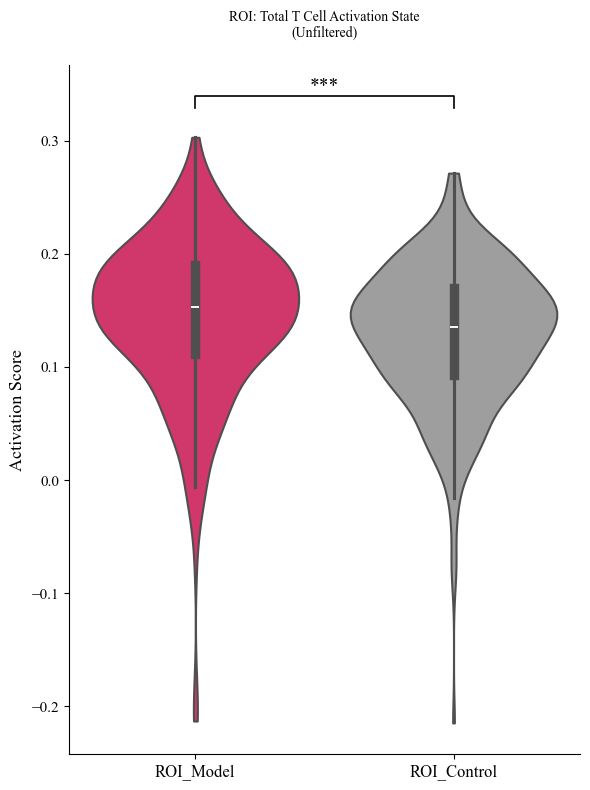

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu

# === 1. 严格提取 ROI 内所有数据点 ===
x, y = adata.obsm['spatial'][:, 0], adata.obsm['spatial'][:, 1]

# 定义区域掩码
mask_roi_m = (x >= 6000) & (x <= 7800) & (y >= 11400) & (y <= 13200)
mask_roi_c = (x >= 12200) & (x <= 14000) & (y >= 11400) & (y <= 13200)

# 提取所有分值 (不做 >0 或任何过滤)
m_scores_all = adata.obs.loc[mask_roi_m, 'Score_Activation'].values
c_scores_all = adata.obs.loc[mask_roi_c, 'Score_Activation'].values

# 构建长格式 DataFrame
df_m = pd.DataFrame({'Group': 'ROI_Model', 'Activation_Score': m_scores_all})
df_c = pd.DataFrame({'Group': 'ROI_Control', 'Activation_Score': c_scores_all})
roi_plot_df_all = pd.concat([df_m, df_c], axis=0)

# === 2. 绘图配置 ===
plt.figure(figsize=(6, 8))
plt.style.use('default')

# 颜色设置
my_palette = {'ROI_Model': '#E91E63', 'ROI_Control': '#9E9E9E'}

# 绘制小提琴图 (包含所有分布)
# inner="box" 会在中间画一个小的箱线图，展示中位数和四分位数
ax = sns.violinplot(x='Group', y='Activation_Score', data=roi_plot_df_all, 
                    palette=my_palette, inner="box", cut=0, linewidth=1.5)

# === 3. 统计检验 (全样本) ===
stat, p_val = mannwhitneyu(m_scores_all, c_scores_all, alternative='two-sided')

# === 4. 添加显著性标注 ===
y_max = roi_plot_df_all['Activation_Score'].max()
y_min = roi_plot_df_all['Activation_Score'].min()
line_y = y_max + (y_max - y_min) * 0.05
tip_h = (y_max - y_min) * 0.02

plt.plot([0, 0, 1, 1], [line_y, line_y + tip_h, line_y + tip_h, line_y], lw=1.2, c='k')

if p_val < 0.001: sig = "***"
elif p_val < 0.01: sig = "**"
elif p_val < 0.05: sig = "*"
else: sig = "n.s."

plt.text(0.5, line_y + tip_h, sig, ha='center', va='bottom', 
         fontsize=14, fontweight='bold', fontproperties=prop)

# === 5. 美化与保存 ===
plt.title('ROI: Total T Cell Activation State\n(Unfiltered)', fontsize=16, fontproperties=prop, pad=20)
plt.ylabel('Activation Score', fontsize=13, fontproperties=prop)
plt.xlabel('')
plt.xticks(fontproperties=prop, fontsize=12)
plt.yticks(fontproperties=prop, fontsize=11)

sns.despine()
plt.tight_layout()

# 导出
plt.savefig('ROI_Activation_Unfiltered_Violin.png', dpi=600, bbox_inches='tight')
plt.savefig('ROI_Activation_Unfiltered_Violin.pdf', format='pdf', bbox_inches='tight')
roi_plot_df_all.to_csv('ROI_Activation_Unfiltered_Data.csv', index=False)

# === 6. 打印包含 0 值的统计 ===
print(f"--- 统计摘要 (包含 0/负值) ---")
print(f"Model   - 均值: {m_scores_all.mean():.4f} | 中位数: {np.median(m_scores_all):.4f}")
print(f"Control - 均值: {c_scores_all.mean():.4f} | 中位数: {np.median(c_scores_all):.4f}")
print(f"P-value: {p_val:.2e}")

plt.show()

In [ ]:
# 提取原始点位数据
# 1. 确保有分组信息
x_coords = adata.obsm['spatial'][:, 0]
adata.obs['Group'] = np.where(x_coords < 10000, 'Model', 'Control')

# 2. 筛选有 T 细胞的点
t_cell_col = 'q05_cell_abundance_w_sf_1201 T cells NN_4'
raw_plot_df = adata.obs[adata.obs[t_cell_col] > 1e-5][['Group', 'Score_Activation']].copy()

# 3. 导出 CSV (每行是一个点)
raw_plot_df.to_csv('Activation_Raw_Data_for_Prism.csv', index=False)

print(f"✅ 原始数据已导出，共 {len(raw_plot_df)} 行。")
print("你可以用 Excel/GraphPad 直接打开 'Activation_Raw_Data_for_Prism.csv' 绘图。")

✅ 原始数据已导出，共 19425 行。
你可以用 Excel/GraphPad 直接打开 'Activation_Raw_Data_for_Prism.csv' 绘图。


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import scanpy as sc
from scipy.stats import pearsonr

# === 1. 定义基因模块 (数据清洗) ===
# 自动处理大小写，确保匹配小鼠基因格式 (首字母大写)
dam_list = [
    'B2m', 'Ctsd', 'Apoe', 'Tyrobp', 'Fth1', 'Ctsb', 'Lyz2', 'Timp2', 
    'Cst7', 'Lpl', 'Axl', 'Csf1', 'Cd9', 'Ccl6', 'Trem2', 'Itgax', 'Clec7a'
]

mgnd_list = [
    'Apoe', 'Spp1', 'Csf1', 'Trem2', 'Itgax', 'Clec7a', 'Ccl2', 
    'Ch25h', 'Gpnmb', 'Fabp5', 'Lgals3'
]

gene_modules = {
    'DAM': [g.capitalize() for g in dam_list],
    'MGnD': [g.capitalize() for g in mgnd_list]
}

# === 2. 准备数据 ===
# A. 自动锁定 Microglia 列 (作为 X 轴)
micro_col = 'q05_cell_abundance_w_sf_1190 Microglia NN_1' # 常用名
# 自动查找逻辑
if micro_col not in adata.obs.columns:
    matches = [c for c in adata.obs.columns if 'Microglia' in c]
    if matches: 
        micro_col = matches[0]
print(f"X轴使用细胞类型: {micro_col}")

# B. 计算评分
# 确保标准化
if adata.X.max() > 50:
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)

print("正在计算 DAM 和 MGnD 评分...")
valid_scores = []
for name, genes in gene_modules.items():
    valid = [g for g in genes if g in adata.var_names]
    print(f"  {name}: 有效基因 {len(valid)}/{len(genes)}")
    if valid:
        score_name = f'Score_{name}'
        sc.tl.score_genes(adata, gene_list=valid, score_name=score_name)
        valid_scores.append(score_name)

# === 3. 定义四个区域 ===
x, y = adata.obsm['spatial'][:, 0], adata.obsm['spatial'][:, 1]

regions = {
    'ROI_Model': (x >= 6000) & (x <= 7800) & (y >= 11400) & (y <= 13200),
    'ROI_Control': (x >= 12200) & (x <= 14000) & (y >= 11400) & (y <= 13200),
    'Whole_Brain_Model': (x < 10000),
    'Whole_Brain_Control': (x >= 10000)
}

# === 4. 循环绘图 (4张图，每张2个子图) ===
plt.style.use('dark_background')
colors = {'Score_DAM': '#d62728', 'Score_MGnD': '#ff7f0e'} # DAM=红, MGnD=橙

for region_name, mask in regions.items():
    print(f"\n正在绘制: {region_name} ...")
    
    # 提取数据
    subset = adata.obs[mask].copy()
    
    # 关键过滤：只保留小胶质细胞 > 0 的点
    # 避免大量 0 值拉低相关性
    plot_df = subset[subset[micro_col] > 1e-6].copy()
    
    if len(plot_df) < 10:
        print(f"  [跳过] 数据点不足 (N={len(plot_df)})")
        continue

    # 创建画布 (1行2列)
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    
    for i, score_col in enumerate(valid_scores):
        ax = axes[i]
        x_data = plot_df[micro_col]
        y_data = plot_df[score_col]
        color = colors.get(score_col, 'white')
        
        # 散点
        ax.scatter(x_data, y_data, c=color, s=15, alpha=0.5, edgecolors='none')
        
        # 回归线
        sns.regplot(x=x_data, y=y_data, ax=ax, scatter=False, color='white',
                    line_kws={'linestyle': '--', 'linewidth': 1.5, 'alpha': 0.8})
        
        # 统计相关性
        r, p = pearsonr(x_data, y_data)
        sig = "*" if p < 0.05 else ""
        stats_text = f"R = {r:.2f}\np = {p:.1e}{sig}"
        
        # 标注
        clean_name = score_col.replace('Score_', '')
        ax.set_title(f'{clean_name} vs Microglia Density', fontsize=14, fontweight='bold', color=color)
        ax.set_xlabel('Microglia Abundance (per Bin)')
        ax.set_ylabel(f'{clean_name} Score')
        
        # R值显示在左上角
        y_range = y_data.max() - y_data.min()
        ax.text(x_data.min(), y_data.max() - y_range*0.05, stats_text, 
                fontsize=12, color='white', fontweight='bold',
                bbox=dict(facecolor='black', alpha=0.5, edgecolor='none'))
        
        ax.grid(True, linestyle='--', alpha=0.2)

    plt.suptitle(f'{region_name}: Microglia Phenotype vs Density (N={len(plot_df)})', fontsize=16)
    plt.tight_layout()
    
    filename = f'Scatter_Microglia_{region_name}_DAM_MGnD.png'
    plt.savefig(filename, dpi=300)
    print(f"  -> 图表已保存: {filename}")

print("\n分析完成！")

Model (Left) -> 均值: 0.1439, 中位数: 0.1530
Control (Right) -> 均值: 0.1285, 中位数: 0.1354

✅ 局部 ROI 空间图已生成 (ROI_Only_Activation_Spatial.png/pdf)


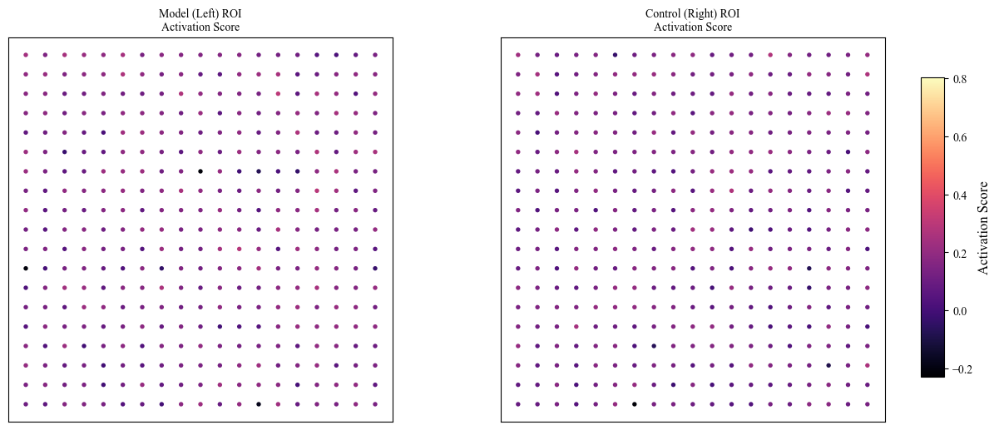

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scanpy as sc
import matplotlib.font_manager as fm

# =========================
# 0. 字体与导出设置
# =========================
TNR_TTF = "/home/yuanyanyao/Downloads/数据/DATA_T_CSF_PBMC/times-new-roman/times.ttf"
if os.path.exists(TNR_TTF):
    fm.fontManager.addfont(TNR_TTF)
    prop = fm.FontProperties(fname=TNR_TTF)
    plt.rcParams["font.family"] = "serif"
    plt.rcParams["font.serif"] = [prop.get_name()]
else:
    prop = fm.FontProperties()

plt.rcParams["pdf.fonttype"] = 42
plt.rcParams["ps.fonttype"] = 42

# =========================
# 1. 计算评分 (如果尚未计算)
# =========================
activation_genes = ['Cd69', 'Il2ra', 'Cd44', 'Cd28', 'Icos', 'Tnfrsf4', 'Cd40lg']
valid_genes = [g for g in activation_genes if g in adata.var_names]
sc.tl.score_genes(adata, gene_list=valid_genes, score_name='Score_Activation')

# =========================
# 2. 区域数据裁剪
# =========================
# 坐标定义
roi_coords = {
    'Model (Left)': [6000, 7800, 11400, 13200],
    'Control (Right)': [12200, 14000, 11400, 13200]
}

roi_data = {}
for name, coords in roi_coords.items():
    mask = (adata.obsm['spatial'][:, 0] >= coords[0]) & \
           (adata.obsm['spatial'][:, 0] <= coords[1]) & \
           (adata.obsm['spatial'][:, 1] >= coords[2]) & \
           (adata.obsm['spatial'][:, 1] <= coords[3])
    
    roi_data[name] = {
        'spatial': adata.obsm['spatial'][mask],
        'score': adata.obs.loc[mask, 'Score_Activation']
    }

# =========================
# 3. 绘图 (仅显示 ROI 内部)
# =========================
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
cmap = 'magma' # 渐变色：亮黄色表示高激活

# 统一颜色刻度范围，保证两张图有可比性
vmin = adata.obs['Score_Activation'].min()
vmax = adata.obs['Score_Activation'].max()

for i, (name, data) in enumerate(roi_data.items()):
    ax = axes[i]
    
    # 绘制局部散点图
    im = ax.scatter(data['spatial'][:, 0], 
                    data['spatial'][:, 1], 
                    c=data['score'], 
                    cmap=cmap, 
                    s=15, 
                    vmin=vmin, vmax=vmax,
                    edgecolors='none')
    
    # 设置标题和标签
    ax.set_title(f'{name} ROI\nActivation Score', fontsize=16, fontproperties=prop)
    ax.set_aspect('equal')
    ax.invert_yaxis() # 匹配组织切片视图
    
    # 去除多余坐标轴，只保留边框
    ax.set_xticks([])
    ax.set_yticks([])
    
    # 打印该区域数值
    print(f"{name} -> 均值: {data['score'].mean():.4f}, 中位数: {data['score'].median():.4f}")

# 添加统一的颜色条
cbar_ax = fig.add_axes([0.92, 0.2, 0.02, 0.6])
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('Activation Score', fontproperties=prop, fontsize=12)

plt.subplots_adjust(right=0.9)

# =========================
# 4. 导出
# =========================
plt.savefig('ROI_Only_Activation_Spatial.png', dpi=600, bbox_inches='tight')
plt.savefig('ROI_Only_Activation_Spatial.pdf', format='pdf', bbox_inches='tight')

print("\n✅ 局部 ROI 空间图已生成 (ROI_Only_Activation_Spatial.png/pdf)")

Model (Left) -> 激活点数: 66 / 总点数: 361 (18.28%)
Control (Right) -> 激活点数: 41 / 总点数: 361 (11.36%)

✅ 二值化空间图已生成。


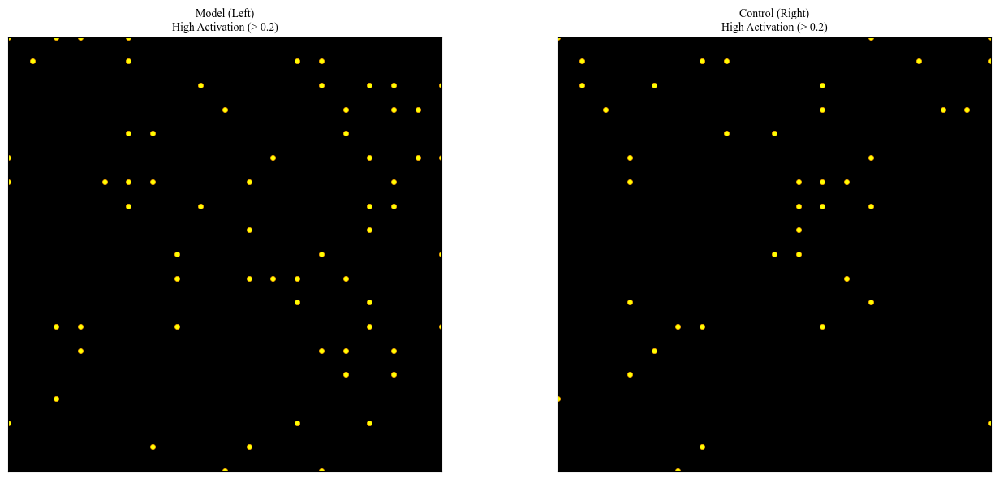

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scanpy as sc
import matplotlib.font_manager as fm

# =========================
# 0. 环境配置与字体
# =========================
TNR_TTF = "/home/yuanyanyao/Downloads/数据/DATA_T_CSF_PBMC/times-new-roman/times.ttf"
if os.path.exists(TNR_TTF):
    fm.fontManager.addfont(TNR_TTF)
    prop = fm.FontProperties(fname=TNR_TTF)
    plt.rcParams["font.family"] = "serif"
    plt.rcParams["font.serif"] = [prop.get_name()]
else:
    prop = fm.FontProperties()

# =========================
# 1. 区域与数据处理
# =========================
# 确保已经计算了 Score_Activation
if 'Score_Activation' not in adata.obs.columns:
    activation_genes = ['Cd69', 'Il2ra', 'Cd44', 'Cd28', 'Icos', 'Tnfrsf4', 'Cd40lg']
    valid_genes = [g for g in activation_genes if g in adata.var_names]
    sc.tl.score_genes(adata, gene_list=valid_genes, score_name='Score_Activation')

roi_coords = {
    'Model (Left)': [6000, 7800, 11400, 13200],
    'Control (Right)': [12200, 14000, 11400, 13200]
}

# 设定阈值
THRESHOLD = 0.2

# =========================
# 2. 绘图 (应用过滤逻辑)
# =========================
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
# 使用一个非常亮的颜色映射，或者直接指定颜色
cmap = 'autumn' # 越红/黄越亮

for i, (name, coords) in enumerate(roi_coords.items()):
    ax = axes[i]
    
    # 1. 裁剪区域数据
    mask_roi = (adata.obsm['spatial'][:, 0] >= coords[0]) & \
               (adata.obsm['spatial'][:, 0] <= coords[1]) & \
               (adata.obsm['spatial'][:, 1] >= coords[2]) & \
               (adata.obsm['spatial'][:, 1] <= coords[3])
    
    spatial_roi = adata.obsm['spatial'][mask_roi]
    score_roi = adata.obs.loc[mask_roi, 'Score_Activation'].values
    
    # 2. 应用过滤逻辑：只保留 > THRESHOLD 的点
    high_act_mask = score_roi > THRESHOLD
    
    # 筛选后的坐标
    filtered_spatial = spatial_roi[high_act_mask]
    
    # 3. 绘图
    if len(filtered_spatial) > 0:
        # 这里 c 设置为常数（最亮），或者保留数值但固定 vmin/vmax
        ax.scatter(filtered_spatial[:, 0], 
                    filtered_spatial[:, 1], 
                    c='yellow', # 直接赋予最亮的黄色
                    s=20, 
                    edgecolors='orange', # 加一点边缘增加饱和度
                    linewidth=0.5)
    
    # 4. 美化
    ax.set_title(f'{name}\nHigh Activation (> {THRESHOLD})', fontsize=16, fontproperties=prop)
    ax.set_aspect('equal')
    ax.invert_yaxis()
    ax.set_facecolor('black') # 使用黑色背景，让“最亮”的点更突出
    
    # 固定轴范围，防止两张图尺寸比例不一
    ax.set_xlim(coords[0], coords[1])
    ax.set_ylim(coords[3], coords[2]) # 注意倒序以匹配 invert_yaxis
    
    ax.set_xticks([])
    ax.set_yticks([])
    
    # 输出统计信息
    count = np.sum(high_act_mask)
    total = len(score_roi)
    print(f"{name} -> 激活点数: {count} / 总点数: {total} ({count/total:.2%})")

plt.tight_layout()

# =========================
# 3. 导出
# =========================
plt.savefig('ROI_Binarized_Activation_Spatial.png', dpi=600, bbox_inches='tight')
plt.savefig('ROI_Binarized_Activation_Spatial.pdf', format='pdf', bbox_inches='tight')

print("\n✅ 二值化空间图已生成。")

Model (Left) | 激活 Bin 数量: 66 | 占比: 18.28%
Control (Right) | 激活 Bin 数量: 41 | 占比: 11.36%

✅ 绘图完成！背景为白色，仅显示 Score > 0.2 的点。


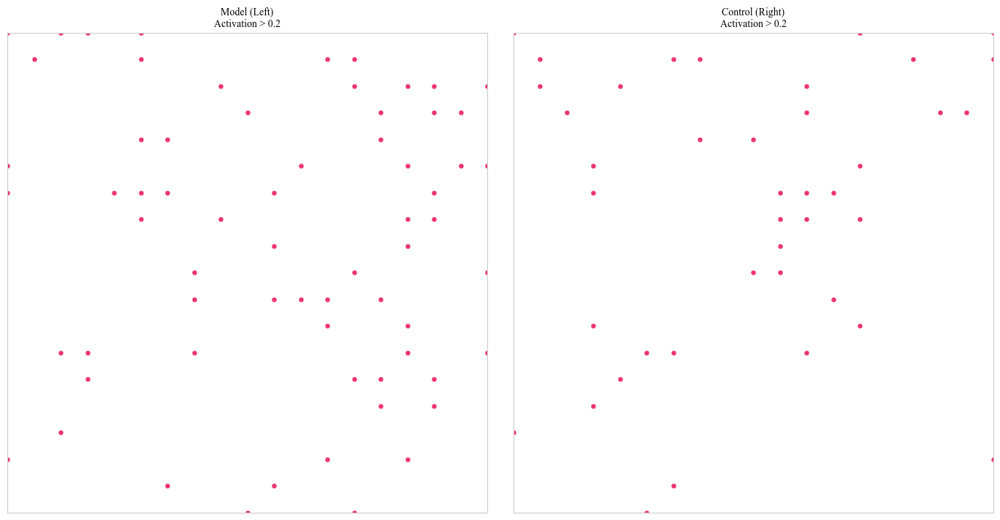

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scanpy as sc
import matplotlib.font_manager as fm

# =========================
# 0. 字体配置
# =========================
TNR_TTF = "/home/yuanyanyao/Downloads/数据/DATA_T_CSF_PBMC/times-new-roman/times.ttf"
if os.path.exists(TNR_TTF):
    fm.fontManager.addfont(TNR_TTF)
    prop = fm.FontProperties(fname=TNR_TTF)
    plt.rcParams["font.family"] = "serif"
    plt.rcParams["font.serif"] = [prop.get_name()]
else:
    prop = fm.FontProperties()

# =========================
# 1. 数据筛选逻辑
# =========================
roi_coords = {
    'Model (Left)': [6000, 7800, 11400, 13200],
    'Control (Right)': [12200, 14000, 11400, 13200]
}

THRESHOLD = 0.2  # 调低至 0.2
POINT_COLOR = '#E91E63' # 使用明亮的深粉红/红色，在白底上非常醒目

# =========================
# 2. 绘图 (白底 + 阈值过滤)
# =========================
fig, axes = plt.subplots(1, 2, figsize=(14, 7))

for i, (name, coords) in enumerate(roi_coords.items()):
    ax = axes[i]
    
    # 裁剪
    mask_roi = (adata.obsm['spatial'][:, 0] >= coords[0]) & \
               (adata.obsm['spatial'][:, 0] <= coords[1]) & \
               (adata.obsm['spatial'][:, 1] >= coords[2]) & \
               (adata.obsm['spatial'][:, 1] <= coords[3])
    
    spatial_roi = adata.obsm['spatial'][mask_roi]
    score_roi = adata.obs.loc[mask_roi, 'Score_Activation'].values
    
    # 过滤：仅保留评分 > 0.2 的点
    keep_mask = score_roi > THRESHOLD
    filtered_spatial = spatial_roi[keep_mask]
    
    # 绘制背景（可选：可以用极淡的灰色画出所有点的轮廓，或者保持纯白）
    # 这里我们保持纯白，只画达标的点
    if len(filtered_spatial) > 0:
        ax.scatter(filtered_spatial[:, 0], 
                   filtered_spatial[:, 1], 
                   c=POINT_COLOR, 
                   s=25,              # 稍微放大点，看得更清楚
                   edgecolors='white', # 白色边缘使点更清晰
                   linewidth=0.3,
                   alpha=0.9)

    # 美化
    ax.set_title(f'{name}\nActivation > {THRESHOLD}', fontsize=16, fontproperties=prop)
    ax.set_aspect('equal')
    ax.invert_yaxis()
    
    # 设置白色背景
    ax.set_facecolor('white')
    for spine in ax.spines.values():
        spine.set_edgecolor('#CCCCCC') # 淡灰色边框
    
    # 强制固定范围
    ax.set_xlim(coords[0], coords[1])
    ax.set_ylim(coords[3], coords[2])
    
    ax.set_xticks([])
    ax.set_yticks([])

    # 打印数值统计
    print(f"{name} | 激活 Bin 数量: {len(filtered_spatial)} | 占比: {len(filtered_spatial)/len(score_roi):.2%}")

plt.tight_layout()

# =========================
# 3. 高清导出
# =========================
plt.savefig('ROI_White_BG_Activation_0.2.png', dpi=600, bbox_inches='tight')
plt.savefig('ROI_White_BG_Activation_0.2.pdf', format='pdf', bbox_inches='tight')

print("\n✅ 绘图完成！背景为白色，仅显示 Score > 0.2 的点。")

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import scanpy as sc
from scipy.stats import pearsonr

# === 1. 准备数据 ===
# A. 提取 SNCA 表达量 (作为 X 轴)
# 注意：如果是人源 SNCA 病毒模型，基因名可能是 'SNCA'；如果是内源性，可能是 'Snca'
gene_candidates = ['SNCA'] # 备选列表
target_gene = None

for g in gene_candidates:
    if g in adata.var_names:
        target_gene = g
        break

if target_gene:
    print(f"检测到 Synuclein 基因: {target_gene}")
    # 提取表达量到 obs (如果是稀疏矩阵，需转为 dense)
    if scipy.sparse.issparse(adata.X):
        adata.obs['Syn_Density'] = adata[:, target_gene].X.toarray().flatten()
    else:
        adata.obs['Syn_Density'] = adata[:, target_gene].X.flatten()
else:
    # 如果之前算过 expr_SNCA，直接用
    if 'expr_SNCA' in adata.obs.columns:
        print("使用现有的 'expr_SNCA' 列")
        adata.obs['Syn_Density'] = adata.obs['expr_SNCA']
    else:
        raise ValueError("未找到 Snca 或 SNCA 基因，请检查基因名！")

# B. 锁定三种细胞列 (作为 Y 轴)
target_cells = {
    'Dopa Neurons': 'SNc-VTA-RAmb Foxa1 Dopa_3', # 或 Total_Dopa
    'Microglia': 'Microglia',
    'T cells': 'T cells'
}

# 自动匹配真实列名
real_cell_cols = {}
for name, key in target_cells.items():
    matches = [c for c in adata.obs.columns if key in c]
    # 排除干扰项
    matches = [c for c in matches if 'Astro' not in c and 'MOL' not in c]
    if matches:
        real_cell_cols[name] = matches[0]

print(f"分析细胞: {list(real_cell_cols.keys())}")

# === 2. 定义四个区域 ===
x, y = adata.obsm['spatial'][:, 0], adata.obsm['spatial'][:, 1]
regions = {
    'ROI_Model': (x >= 6000) & (x <= 7800) & (y >= 11400) & (y <= 13200),
    'ROI_Control': (x >= 12200) & (x <= 14000) & (y >= 11400) & (y <= 13200),
    'Whole_Model': (x < 10000),
    'Whole_Control': (x >= 10000)
}

# === 3. 绘图 (4行 x 3列) ===
plt.style.use('dark_background')
fig, axes = plt.subplots(4, 3, figsize=(18, 20))

# 颜色映射
colors = {'Dopa Neurons': '#00FF00', 'Microglia': '#d62728', 'T cells': '#9467bd'}

for row_idx, (region_name, mask) in enumerate(regions.items()):
    subset = adata.obs[mask].copy()
    
    # 过滤：只看 Syn 表达 > 0 的点 (可选，看是否有 Syn 的影响)
    # 或者保留所有点看基线。建议保留所有点，或者 Syn > 0.1
    plot_df = subset.copy() 
    
    for col_idx, (cell_name, cell_col) in enumerate(real_cell_cols.items()):
        ax = axes[row_idx, col_idx]
        
        x_data = plot_df['Syn_Density']
        y_data = plot_df[cell_col]
        color = colors.get(cell_name, 'white')
        
        # 1. 散点
        # 根据数据量调整点的大小和透明度
        s_size = 5 if len(plot_df) > 5000 else 15
        ax.scatter(x_data, y_data, c=color, s=s_size, alpha=0.5, edgecolors='none')
        
        # 2. 回归线
        if len(x_data) > 5:
            sns.regplot(x=x_data, y=y_data, ax=ax, scatter=False, color='white',
                        line_kws={'linestyle': '--', 'linewidth': 1.5})
            
            # 3. 统计相关性
            r, p = pearsonr(x_data, y_data)
            sig = "**" if p < 0.01 else ""
            stats_text = f"R = {r:.2f}\np = {p:.1e}{sig}"
        else:
            stats_text = "N/A"
            
        # 4. 标注
        if row_idx == 0:
            ax.set_title(f'{cell_name}', fontsize=16, fontweight='bold', color=color)
        
        if col_idx == 0:
            ax.set_ylabel(f'{region_name}\nCell Abundance', fontsize=12)
        else:
            ax.set_ylabel('')
            
        if row_idx == 3:
            ax.set_xlabel('Synuclein Density (Expression)', fontsize=12)
        
        # R值显示
        y_max = y_data.max() if len(y_data) > 0 else 1
        ax.text(x_data.min(), y_max * 0.9, stats_text, 
                fontsize=12, color='white', fontweight='bold',
                bbox=dict(facecolor='black', alpha=0.5, edgecolor='none'))
        
        ax.grid(True, linestyle='--', alpha=0.2)

plt.tight_layout()
plt.savefig('Syn_Density_Correlation_Matrix.png', dpi=300)
print("\n图表已保存: Syn_Density_Correlation_Matrix.png")

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns

# === 1. 捕获所有细胞类型 ===
# 找到所有丰度列
cell_cols = [c for c in adata.obs.columns if 'q05_cell_abundance_w_sf' in c]
# 如果没有长名，尝试短名
if not cell_cols:
    cell_cols = [c for c in adata.obs.columns if 'NN_' in c]

# 清洗列名 (用于绘图标签)
clean_map = {}
for c in cell_cols:
    if 'q05_cell_abundance_w_sf_' in c:
        clean_map[c] = c.split('q05_cell_abundance_w_sf_')[-1]
    else:
        clean_map[c] = c

print(f"分析细胞类型总数: {len(cell_cols)}")

# === 2. 全脑左右切分 ===
# 假设中线在 x=10000 (根据之前的经验)
x_coords = adata.obsm['spatial'][:, 0]
mask_model_hemi = x_coords < 10000   # 左半脑 (Model)
mask_ctrl_hemi = x_coords >= 10000   # 右半脑 (Control)

# === 3. 计算相对比例 (Proportions) ===
# 提取数据
df_model = adata.obs.loc[mask_model_hemi, cell_cols]
df_ctrl = adata.obs.loc[mask_ctrl_hemi, cell_cols]

# 1. 计算每种细胞的总丰度 (Sum of predicted counts)
sum_model = df_model.sum(axis=0)
sum_ctrl = df_ctrl.sum(axis=0)

# 2. 归一化为比例 (除以该半脑所有细胞的总和)
# 这样可以消除左右半脑总面积/总Bin数不一致带来的误差
prop_model = sum_model / sum_model.sum()
prop_ctrl = sum_ctrl / sum_ctrl.sum()

# 3. 合并为绘图数据
plot_df = pd.DataFrame({
    'Control_Prop': prop_ctrl,
    'Model_Prop': prop_model,
    'Cell_Name': [clean_map[c] for c in prop_ctrl.index]
})

# === 4. 定义变化状态 (Up/Down/Stable) ===
# 计算倍数变化 (Fold Change)
# 加一个极小值防止除以0
fc = (plot_df['Model_Prop'] + 1e-9) / (plot_df['Control_Prop'] + 1e-9)

plot_df['Status'] = 'Stable'
# 阈值：变化超过 1.5 倍 (FC > 1.5) 或 低于 0.66 倍 (FC < 0.66)
plot_df.loc[fc > 1.5, 'Status'] = 'Enriched in Model'
plot_df.loc[fc < 0.66, 'Status'] = 'Depleted in Model'

# 特别标记关键细胞 (用于强制显示标签)
# 您可以根据需要添加更多关键词
highlight_keywords = ['Dopa', 'Microglia', 'T cells', 'BAM', 'Astro', 'MOL', 'NK', 'B cells']
plot_df['Highlight'] = False
for k in highlight_keywords:
    plot_df.loc[plot_df['Cell_Name'].str.contains(k, case=False), 'Highlight'] = True

# === 5. 可视化：对角线散点图 ===
plt.style.use('dark_background')
fig, ax = plt.subplots(figsize=(10, 10))

# 颜色映射
colors = {'Enriched in Model': '#d62728', 'Depleted in Model': '#1f77b4', 'Stable': 'grey'}

# 绘制散点 (使用对数坐标轴，因为细胞比例跨度很大)
# Stable 点画小一点
sns.scatterplot(
    data=plot_df[plot_df['Status']=='Stable'], 
    x='Control_Prop', y='Model_Prop', 
    color='grey', alpha=0.3, s=20, ax=ax, label='Stable'
)

# 显著点画大一点
sns.scatterplot(
    data=plot_df[plot_df['Status']!='Stable'], 
    x='Control_Prop', y='Model_Prop', 
    hue='Status', palette=colors, alpha=0.9, s=60, ax=ax
)

# 添加对角线 (y=x)
# 获取轴范围
min_val = min(plot_df['Control_Prop'].min(), plot_df['Model_Prop'].min())
max_val = max(plot_df['Control_Prop'].max(), plot_df['Model_Prop'].max())
ax.plot([min_val, max_val], [min_val, max_val], color='white', linestyle='--', linewidth=1.5, label='No Change (y=x)')

# 设置对数坐标轴 (Log Scale)
ax.set_xscale('log')
ax.set_yscale('log')

# 添加标签 (只标显著变化的 + 关键细胞)
texts = []
to_label = plot_df[
    (plot_df['Status'] != 'Stable') | (plot_df['Highlight'] == True)
]

for idx, row in to_label.iterrows():
    # 避免标那些比例极低(<0.01%)的噪音，除非它是关键细胞
    if row['Control_Prop'] > 1e-4 or row['Model_Prop'] > 1e-4:
        texts.append(ax.text(row['Control_Prop'], row['Model_Prop'], row['Cell_Name'], fontsize=9, color='white'))

# 使用 adjust_text 自动避让标签
try:
    from adjustText import adjust_text
    adjust_text(texts, arrowprops=dict(arrowstyle='-', color='grey', lw=0.5))
except ImportError:
    print("提示: 未安装 adjustText，标签可能会重叠")

# 美化
ax.set_title('Whole Brain Comparison: Model (Left) vs Control (Right)', fontsize=16)
ax.set_xlabel('Proportion in Control Side (Log Scale)')
ax.set_ylabel('Proportion in Model Side (Log Scale)')
ax.legend(title='Change Status')
ax.grid(True, which="both", ls="--", alpha=0.2)

plt.tight_layout()
plt.savefig('WholeBrain_Proportion_Scatter.png', dpi=300)
print("\n图表已保存: WholeBrain_Proportion_Scatter.png")

# === 6. 打印 Top 变化列表 ===
print("\n" + "="*80)
print("【全脑细胞比例变化排行榜】")
print(f"{'Cell Type':<40} | {'Control %':<10} | {'Model %':<10} | {'Fold Change'}")
print("-" * 80)

# 计算 FC 用于排序
plot_df['FC'] = plot_df['Model_Prop'] / (plot_df['Control_Prop'] + 1e-9)
# 排序：先看 Model 增加最多的，再看 Model 减少最多的
sorted_df = plot_df.sort_values('FC', ascending=False)

# Top 10 Model Enriched
print(">>> Model Enriched (Top 10):")
for i, row in sorted_df.head(10).iterrows():
    print(f"{row['Cell_Name']:<40} | {row['Control_Prop']:.2%}     | {row['Model_Prop']:.2%}     | {row['FC']:.2f}x")

print("\n>>> Model Depleted (Top 10):")
for i, row in sorted_df.tail(10).iterrows():
    print(f"{row['Cell_Name']:<40} | {row['Control_Prop']:.2%}     | {row['Model_Prop']:.2%}     | {row['FC']:.2f}x")
print("="*80)

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import scanpy as sc
from scipy.stats import zscore
import scipy.sparse

# === 1. 数据准备 ===
# A. 获取 SNCA 密度 (X轴)
# 尝试查找基因名
gene_candidates = [ 'SNCA']
target_gene = None
for g in gene_candidates:
    if g in adata.var_names:
        target_gene = g
        break

if target_gene:
    # 提取表达量
    if scipy.sparse.issparse(adata.X):
        syn_vals = adata[:, target_gene].X.toarray().flatten()
    else:
        syn_vals = adata[:, target_gene].X.flatten()
    print(f"使用基因: {target_gene}")
else:
    # 备选：使用之前算的观测列
    if 'expr_SNCA' in adata.obs.columns:
        print("使用现有的 'expr_SNCA' 列")
        syn_vals = adata.obs['expr_SNCA'].values
    else:
        raise ValueError("未找到 SNCA 数据！")

# B. 获取细胞丰度 (Y轴)
target_cells = {
    'Dopa Neurons': ['SNc-VTA', 'Dopa'],
    'Microglia': ['Microglia'],
    'T cells': ['T cells']
}

cell_data = {}
for name, keys in target_cells.items():
    # 查找列
    found_cols = []
    for k in keys:
        found_cols.extend([c for c in adata.obs.columns if k in c])
    # 过滤杂项 (排除 Astro, MOL 等)
    clean_cols = [c for c in found_cols if 'Astro' not in c and 'MOL' not in c]
    
    if clean_cols:
        # 求和
        cell_data[name] = adata.obs[clean_cols].sum(axis=1).values
    else:
        print(f"警告: 未找到 {name} 相关列")

# === 2. 构建长格式 DataFrame (用于绘图) ===
# 定义区域
x_coord, y_coord = adata.obsm['spatial'][:, 0], adata.obsm['spatial'][:, 1]
regions = {
    'ROI Model (Lesion Core)': (x_coord >= 6000) & (x_coord <= 7800) & (y_coord >= 11400) & (y_coord <= 13200),
    'ROI Control (Healthy)': (x_coord >= 12200) & (x_coord <= 14000) & (y_coord >= 11400) & (y_coord <= 13200),
    'Whole Brain Model': (x_coord < 10000),
    'Whole Brain Control': (x_coord >= 10000)
}

df_list = []

for region_name, mask in regions.items():
    # 提取该区域数据
    n_points = mask.sum()
    if n_points == 0: continue
    
    temp_syn = syn_vals[mask]
    
    for cell_name, counts in cell_data.items():
        temp_counts = counts[mask]
        
        # === 关键步骤：Z-score 标准化 ===
        # 我们在"该区域内"进行标准化，只看相对趋势
        if np.std(temp_counts) > 0:
            z_scores = zscore(temp_counts)
        else:
            z_scores = np.zeros_like(temp_counts)
            
        # 构建临时表
        temp_df = pd.DataFrame({
            'Syn_Density': temp_syn,
            'Z_Score_Abundance': z_scores,
            'Cell_Type': cell_name,
            'Region': region_name
        })
        
        # 过滤：只保留 SNCA > 0.1 的点 (避免零值堆积)
        # 这样回归线会更准确地反映"剂量效应"
        temp_df = temp_df[temp_df['Syn_Density'] > 0.1]
        
        df_list.append(temp_df)

if not df_list:
    print("错误: 没有提取到有效数据，可能是基因名不对或区域为空。")
else:
    plot_df = pd.concat(df_list)

    # === 3. 绘图：Overlay Regression Plot ===
    plt.style.use('dark_background')

    # 定义颜色 (Dopa=绿, Micro=红, T=紫)
    custom_palette = {'Dopa Neurons': '#00FF00', 'Microglia': '#d62728', 'T cells': '#9467bd'}

    # 使用 lmplot 创建分面图
    # 【修复点】：scatter_kws 中使用 edgecolors='none' 代替 linewidth=0
    g = sns.lmplot(
        data=plot_df, 
        x="Syn_Density", 
        y="Z_Score_Abundance", 
        hue="Cell_Type",
        col="Region", 
        col_wrap=2,          # 2列换行
        palette=custom_palette,
        height=5, 
        aspect=1.2,
        scatter=True,        # 显示散点
        # s=点大小, alpha=透明度, edgecolors='none' 去掉边框
        scatter_kws={'s': 8, 'alpha': 0.2, 'edgecolors': 'none'}, 
        line_kws={'linewidth': 3} # 线条加粗
    )

    # === 4. 美化与标注 ===
    # 设置标题和轴标签
    g.set_titles(col_template="{col_name}", size=15, fontweight='bold', color='white')
    g.set_axis_labels("SNCA Density (Expression Level)", "Standardized Abundance (Z-Score)")

    # 添加参考线 (Y=0)
    for ax in g.axes.flatten():
        ax.axhline(0, color='white', linestyle='--', alpha=0.3, linewidth=1)
        ax.grid(True, linestyle='--', alpha=0.15)
        # 确保刻度颜色可见
        ax.tick_params(colors='white')
        for spine in ax.spines.values():
            spine.set_edgecolor('white')

    # 调整图例
    # g.legend.set_title("Cell Type") # 有些版本可能不支持直接set_title，改用下面的方式
    plt.subplots_adjust(top=0.9)
    g.fig.suptitle('Impact of SNCA Load on Cell Abundance (Overlaid Trends)', fontsize=18, color='white')

    plt.savefig('SNCA_Overlay_Trends.png', dpi=300)
    print("\n图表已保存: SNCA_Overlay_Trends.png")

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import scipy.sparse

# === 1. 数据准备 ===
# A. 获取 SNCA (X轴)
gene_candidates = ['Snca', 'SNCA', 'Human_SNCA']
target_gene = None
for g in gene_candidates:
    if g in adata.var_names:
        target_gene = g
        break

if target_gene:
    if scipy.sparse.issparse(adata.X):
        syn_vals = adata[:, target_gene].X.toarray().flatten()
    else:
        syn_vals = adata[:, target_gene].X.flatten()
else:
    if 'expr_SNCA' in adata.obs.columns:
        syn_vals = adata.obs['expr_SNCA'].values
    else:
        raise ValueError("未找到 SNCA 数据！")

# B. 获取细胞丰度 (Y轴)
target_cells = {
    'Dopa Neurons': ['SNc-VTA', 'Dopa'],
    'Microglia': ['Microglia'],
    'T cells': ['T cells']
}

cell_data = {}
for name, keys in target_cells.items():
    found_cols = []
    for k in keys:
        found_cols.extend([c for c in adata.obs.columns if k in c])
    clean_cols = [c for c in found_cols if 'Astro' not in c and 'MOL' not in c]
    if clean_cols:
        cell_data[name] = adata.obs[clean_cols].sum(axis=1).values

# === 2. 构建数据表 ===
x_coord, y_coord = adata.obsm['spatial'][:, 0], adata.obsm['spatial'][:, 1]

# 定义 ROI
mask_model = (x_coord >= 6000) & (x_coord <= 7800) & (y_coord >= 11400) & (y_coord <= 13200)
mask_control = (x_coord >= 12200) & (x_coord <= 14000) & (y_coord >= 11400) & (y_coord <= 13200)

df_list = []

# Model 数据
if mask_model.sum() > 0:
    for cell_name, counts in cell_data.items():
        df_list.append(pd.DataFrame({
            'Syn_Density': syn_vals[mask_model],
            'Cell_Abundance': counts[mask_model],
            'Region': 'Model (Lesion)',
            'Cell_Type': cell_name
        }))

# Control 数据
if mask_control.sum() > 0:
    for cell_name, counts in cell_data.items():
        df_list.append(pd.DataFrame({
            'Syn_Density': syn_vals[mask_control],
            'Cell_Abundance': counts[mask_control],
            'Region': 'Control (Healthy)',
            'Cell_Type': cell_name
        }))

plot_df = pd.concat(df_list)

# === 3. 绘图：Region 对比 ===
plt.style.use('dark_background')

# 定义配色：Model=橙色(警示), Control=蓝色(冷静)
region_colors = {'Model (Lesion)': '#ff7f0e', 'Control (Healthy)': '#1f77b4'}

g = sns.lmplot(
    data=plot_df,
    x="Syn_Density",
    y="Cell_Abundance",
    hue="Region",        # 关键：按区域着色
    col="Cell_Type",     # 关键：按细胞分图
    palette=region_colors,
    height=6,
    aspect=1.0,
    sharey=False,        # 让每个细胞类型的Y轴独立（因为Dopa和T细胞数量级不同）
    scatter_kws={'s': 8, 'alpha': 0.3, 'edgecolors': 'none'},
    line_kws={'linewidth': 3}
)

# === 4. 美化 ===
g.set_titles("{col_name}", size=18, fontweight='bold', color='white')
g.set_axis_labels("SNCA Density", "Cell Abundance (Counts)")

# 遍历每个子图做微调
for ax in g.axes.flatten():
    ax.grid(True, linestyle='--', alpha=0.2)
    # 确保坐标轴颜色
    ax.tick_params(colors='white')
    for spine in ax.spines.values():
        spine.set_edgecolor('white')

plt.subplots_adjust(top=0.85)
g.fig.suptitle('Impact of SNCA: Model vs Control Comparison', fontsize=20, color='white')

plt.savefig('SNCA_Model_vs_Control_Trends.png', dpi=300)
print("\n图表已保存: SNCA_Model_vs_Control_Trends.png")

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import scanpy as sc
from scipy.stats import spearmanr

# === 1. 定义您要分析的基因集 ===
# 把之前定义的列表合并，并加上标签
gene_sets = {
    'DAM': ['B2m', 'Ctsd', 'Apoe', 'Tyrobp', 'Fth1', 'Ctsb', 'Lyz2', 'Timp2', 'Cst7', 'Lpl', 'Axl', 'Csf1', 'Cd9', 'Ccl6', 'Trem2', 'Itgax', 'Clec7a'],
    'MGnD': ['Spp1', 'Gpnmb', 'Fabp5', 'Lgals3', 'Ccl2', 'Ch25h'], # 挑几个典型的
    'T_Toxicity': ['Gzma', 'Gzmb', 'Prf1', 'Ifng', 'Nkg7']
}

# 扁平化列表用于计算
all_genes_of_interest = []
gene_type_map = {}
for g_type, g_list in gene_sets.items():
    valid_genes = [g for g in g_list if g in adata.var_names]
    all_genes_of_interest.extend(valid_genes)
    for g in valid_genes:
        gene_type_map[g] = g_type # 记录每个基因属于哪一类

# === 2. 准备数据 ===
# 获取 Syn 密度
if 'expr_SNCA' not in adata.obs.columns:
    # 临时获取
    gene_candidates = ['SNCA']
    target_gene = next((g for g in gene_candidates if g in adata.var_names), None)
    syn_vals = adata[:, target_gene].X.toarray().flatten() if target_gene else None
else:
    syn_vals = adata.obs['expr_SNCA'].values

# 获取 ROI 数据
mask_model = (adata.obsm['spatial'][:,0] < 10000) # 假设左侧
mask_ctrl = (adata.obsm['spatial'][:,0] >= 10000) # 假设右侧

# === 3. 核心计算循环 ===
results = []

print("正在计算基因的 LFC 和 Correlation...")

for gene in all_genes_of_interest:
    # 提取基因表达量
    # 注意：这里用全矩阵计算，或者仅用 ROI 区域计算
    # 建议：用 Model 侧的数据算相关性，用 Model vs Control 算 LFC
    
    expr = adata[:, gene].X.toarray().flatten()
    
    # 1. 计算 Y轴: Log2 Fold Change (Model / Control)
    mean_model = np.mean(expr[mask_model]) + 1e-9
    mean_ctrl = np.mean(expr[mask_ctrl]) + 1e-9
    lfc = np.log2(mean_model / mean_ctrl)
    
    # 2. 计算 X轴: Spearman Correlation with Syn (仅在 Model 侧计算)
    # 为什么只在 Model 侧？因为 Control 侧 Syn 几乎为0，算相关性全是噪音
    expr_model = expr[mask_model]
    syn_model = syn_vals[mask_model]
    
    # 过滤掉双零值以提高准确性
    valid_idx = (expr_model > 0) | (syn_model > 0)
    if valid_idx.sum() > 10:
        r, _ = spearmanr(expr_model[valid_idx], syn_model[valid_idx])
    else:
        r = 0
    
    results.append({
        'Gene': gene,
        'Type': gene_type_map[gene],
        'LFC_Model_vs_Ctrl': lfc,
        'Spearman_Corr_with_Syn': r
    })

df_plot = pd.DataFrame(results)

# === 4. 绘图 (Quadrant Plot) ===
plt.style.use('dark_background')
fig, ax = plt.subplots(figsize=(10, 8))

# 定义颜色
colors = {'DAM': '#d62728', 'MGnD': '#00FF00', 'T_Toxicity': '#9467bd'}

# 绘制散点
sns.scatterplot(
    data=df_plot, 
    x='Spearman_Corr_with_Syn', 
    y='LFC_Model_vs_Ctrl', 
    hue='Type', 
    palette=colors, 
    s=100, 
    edgecolor='white',
    ax=ax
)

# 添加象限分割线
ax.axhline(0.5, color='white', linestyle='--', alpha=0.5) # LFC 阈值 (比如 0.5 代表约 1.4倍)
ax.axvline(0.1, color='white', linestyle='--', alpha=0.5) # 相关性阈值

# 添加文字标签
from adjustText import adjust_text
texts = []
for i, row in df_plot.iterrows():
    # 只标注比较显著的基因 (右上角 Q1)
    if row['LFC_Model_vs_Ctrl'] > 0.5 or row['Spearman_Corr_with_Syn'] > 0.2:
        texts.append(ax.text(row['Spearman_Corr_with_Syn'], row['LFC_Model_vs_Ctrl'], row['Gene'], color='white', fontsize=9))

adjust_text(texts, arrowprops=dict(arrowstyle='-', color='grey'))

# 装饰
ax.set_title('Gene Drivers: Pathology Correlation vs. Global Change', fontsize=16)
ax.set_xlabel('Spatial Correlation with SNCA (Model Side)', fontsize=12)
ax.set_ylabel('Log2 Fold Change (Model vs Control)', fontsize=12)

# 添加象限说明
ax.text(0.95, 0.95, 'Q1: Drivers\n(High Syn-tracking\n& Upregulated)', transform=ax.transAxes, ha='right', va='top', color='yellow', fontsize=10)
ax.text(0.05, 0.95, 'Q2: Bystanders\n(Upregulated but\nnot Syn-linked)', transform=ax.transAxes, ha='left', va='top', color='grey', fontsize=10)

plt.tight_layout()
plt.savefig('Gene_Quadrant_Plot.png', dpi=300)
print("图表已保存: Gene_Quadrant_Plot.png")

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import scanpy as sc
from scipy.stats import spearmanr
from tqdm import tqdm  # 进度条

# === 1. 数据准备与筛选 ===
print("正在筛选高变基因以减少计算噪音...")

# 备份一下，以免破坏原数据
adata_calc = adata.copy()

# A. 基础过滤：去除极低表达基因 (例如全脑少于 50 个 counts 的)
sc.pp.filter_genes(adata_calc, min_counts=50)

# B. 选取高变基因 (HVGs) + 强制包含您之前关注的 marker
# 我们选 Top 3000 高变基因，这通常涵盖了所有有生物学意义的变化
sc.pp.highly_variable_genes(adata_calc, n_top_genes=3000, subset=False)
hvg_list = adata_calc.var_names[adata_calc.var['highly_variable']].tolist()

# 强制把之前的 DAM/MGnD/Toxicity 基因加进去 (如果它们不在 HVG 里的话)
force_include = [
    'Spp1', 'Gpnmb', 'Apoe', 'Trem2', 'Cd68', 'Cst7', 'Lpl', 
    'Gzmb', 'Prf1', 'Ifng', 'Cd8a', 'Cd4', 'Snca'
]
# 确保首字母大写匹配
force_include = [g.capitalize() for g in force_include]
target_genes = list(set(hvg_list + [g for g in force_include if g in adata_calc.var_names]))

print(f"最终分析基因数量: {len(target_genes)} 个")

# === 2. 准备 Syn 与 区域数据 ===
# 获取 Syn 密度
if 'expr_SNCA' not in adata.obs.columns:
    g_cand = ['SNCA']
    tgt = next((g for g in g_cand if g in adata.var_names), None)
    syn_vals = adata[:, tgt].X.toarray().flatten() if tgt else np.zeros(adata.shape[0])
else:
    syn_vals = adata.obs['expr_SNCA'].values

# 定义区域
x_coords = adata.obsm['spatial'][:, 0]
mask_model = (x_coords < 10000) # 左半脑
mask_ctrl = (x_coords >= 10000) # 右半脑

# === 3. 大规模计算循环 ===
results = []
print("开始全基因扫描 (这可能需要几分钟)...")

# 使用稀疏矩阵加速读取
import scipy.sparse
is_sparse = scipy.sparse.issparse(adata_calc.X)

# 提取 Model 侧的 Syn 用于算相关性
syn_model = syn_vals[mask_model]

# 进度条循环
for gene in tqdm(target_genes):
    # 提取表达量
    if is_sparse:
        # 稀疏矩阵列切片比行切片快，但这里我们要特定基因
        expr = adata_calc[:, gene].X.toarray().flatten()
    else:
        expr = adata_calc[:, gene].X.flatten()
    
    # 1. 计算 LFC (Model vs Control)
    mean_m = np.mean(expr[mask_model]) + 1e-9 # 加小值防报错
    mean_c = np.mean(expr[mask_ctrl]) + 1e-9
    lfc = np.log2(mean_m / mean_c)
    
    # 2. 计算 Correlation (仅 Model 侧, 且去除双零值)
    expr_m = expr[mask_model]
    
    # 简单的过滤：如果该基因在 Model 侧几乎不表达，相关性无意义
    if np.sum(expr_m > 0) < 20: 
        corr = 0
    else:
        # 只在有意义的点计算 (可选: 或全点计算)
        # 为了捕捉"随Syn升高而升高"，全点计算更稳健
        corr, _ = spearmanr(expr_m, syn_model)
        # 如果出来是 nan (比如完全常数)
        if np.isnan(corr): corr = 0
            
    results.append({
        'Gene': gene,
        'LFC': lfc,
        'Corr': corr
    })

df_genes = pd.DataFrame(results)

# === 4. 定义"驱动因子"与分类 ===
# 阈值设定
lfc_thresh = 0.5  # 约 1.4 倍差异
corr_thresh = 0.2 # 相关性阈值

def classify_gene(row):
    if row['LFC'] > lfc_thresh and row['Corr'] > corr_thresh:
        return 'Driver (Q1)' # 重点关注
    elif row['LFC'] > lfc_thresh:
        return 'Upregulated (Q2)'
    elif row['Corr'] > corr_thresh:
        return 'Syn-Linked (Q4)'
    else:
        return 'Background'

df_genes['Category'] = df_genes.apply(classify_gene, axis=1)

# === 5. 绘图 ===
plt.style.use('dark_background')
fig, ax = plt.subplots(figsize=(12, 10))

# 颜色映射
colors = {
    'Driver (Q1)': '#FF0000',      # 亮红 (主角)
    'Upregulated (Q2)': '#FFaaaa', # 浅红
    'Syn-Linked (Q4)': '#aaaaFF',  # 浅蓝
    'Background': '#333333'        # 深灰 (背景)
}

# 1. 先画背景 (以防遮挡)
bg_data = df_genes[df_genes['Category'] == 'Background']
ax.scatter(bg_data['Corr'], bg_data['LFC'], c=colors['Background'], s=5, alpha=0.3, label='Background')

# 2. 画重点
for cat in ['Syn-Linked (Q4)', 'Upregulated (Q2)', 'Driver (Q1)']:
    sub_data = df_genes[df_genes['Category'] == cat]
    if len(sub_data) > 0:
        ax.scatter(sub_data['Corr'], sub_data['LFC'], c=colors[cat], s=30, alpha=0.8, label=cat)

# 3. 添加辅助线
ax.axhline(lfc_thresh, color='white', linestyle='--', alpha=0.5)
ax.axvline(corr_thresh, color='white', linestyle='--', alpha=0.5)

# 4. 自动标注 Top Genes (Q1中最极端的)
# 定义一个"重要性分数"用于排序：LFC * Corr
df_genes['Score'] = df_genes['LFC'] * df_genes['Corr']
top_drivers = df_genes[df_genes['Category'] == 'Driver (Q1)'].sort_values('Score', ascending=False).head(30)

texts = []
for _, row in top_drivers.iterrows():
    texts.append(ax.text(row['Corr'], row['LFC'], row['Gene'], color='yellow', fontsize=10, fontweight='bold'))

# 标注特定的 marker (即使它们没进 Top 30)
manual_highlight = ['Spp1', 'Gpnmb', 'Gzmb', 'Cd8a', 'Apoe']
for g in manual_highlight:
    row = df_genes[df_genes['Gene'] == g]
    if len(row) > 0:
        # 如果已经标了就不重复
        if g not in top_drivers['Gene'].values:
            r = row.iloc[0]
            texts.append(ax.text(r['Corr'], r['LFC'], r['Gene'], color='cyan', fontsize=10, fontweight='bold'))

# 调整标签位置
from adjustText import adjust_text
adjust_text(texts, arrowprops=dict(arrowstyle='-', color='white', lw=0.5))

# 装饰
ax.set_title('Whole-Transcriptome Discovery: Pathological Drivers', fontsize=18)
ax.set_xlabel('Spatial Correlation with SNCA (Model Side)', fontsize=14)
ax.set_ylabel('Log2 Fold Change (Model / Control)', fontsize=14)
ax.legend(loc='lower right')
ax.grid(True, linestyle='--', alpha=0.1)

plt.tight_layout()
plt.savefig('Genome_Wide_Quadrant_Discovery.png', dpi=300)
print("\n图表已保存: Genome_Wide_Quadrant_Discovery.png")

# === 6. 打印 Top Driver 表 ===
print("\n" + "="*80)
print("【Top 20 潜在病理驱动基因 (Q1区)】")
print(f"筛选标准: LFC > {lfc_thresh} 且 Correlation > {corr_thresh}")
print("-" * 80)
print(f"{'Gene':<20} | {'LFC':<10} | {'Corr (Syn)':<10} | {'Type?'}")
print("-" * 80)

# 简单的基因功能注释字典 (示例)
anno_dict = {
    'Spp1': 'Microglia (DAM)', 'Gpnmb': 'Microglia (DAM)', 'Apoe': 'Glia (Risk)',
    'C1qa': 'Complement', 'C1qb': 'Complement', 'Gzmb': 'T cell (Cytotoxic)',
    'Cd68': 'Macrophage', 'Gfap': 'Astrocyte', 'Vim': 'Astrocyte'
}

for _, row in top_drivers.head(20).iterrows():
    g = row['Gene']
    anno = anno_dict.get(g, 'Unknown/New')
    print(f"{g:<20} | {row['LFC']:.2f}       | {row['Corr']:.2f}       | {anno}")
print("="*80)

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import scanpy as sc
from scipy.stats import spearmanr
from tqdm import tqdm

# === 1. 定义 ROI 区域 ===
x_coords = adata.obsm['spatial'][:, 0]
y_coords = adata.obsm['spatial'][:, 1]

# Model ROI (Left Lesion Core)
mask_roi_m = (x_coords >= 6000) & (x_coords <= 7800) & (y_coords >= 11400) & (y_coords <= 13200)

# Control ROI (Right Healthy Homologue)
mask_roi_c = (x_coords >= 12200) & (x_coords <= 14000) & (y_coords >= 11400) & (y_coords <= 13200)

print(f"ROI Bin 数量: Model={mask_roi_m.sum()}, Control={mask_roi_c.sum()}")

# === 2. 基因筛选 (针对 ROI 优化) ===
# 我们只关心在 ROI 区域里有表达的基因
# 提取 ROI 数据子集
roi_adata = adata[mask_roi_m | mask_roi_c].copy()

# 过滤：在 ROI 内至少 10 个 bin 表达的基因 (避免稀疏噪音)
sc.pp.filter_genes(roi_adata, min_cells=10)

# 选取高变基因 (Top 2000) + 强制包含 Marker
sc.pp.highly_variable_genes(roi_adata, n_top_genes=2000, subset=False)
target_genes = roi_adata.var_names[roi_adata.var['highly_variable']].tolist()

# 强制添加关注名单
force_list = ['Spp1', 'Gpnmb', 'Apoe', 'Trem2', 'Cd68', 'Gzmb', 'Prf1', 'Snca', 'Ccl2', 'Cxcl10']
force_list = [g.capitalize() for g in force_list]
target_genes = list(set(target_genes + [g for g in force_list if g in roi_adata.var_names]))

print(f"ROI 分析基因数: {len(target_genes)}")

# === 3. 计算 ROI 内的 LFC 和 Corr ===
# 准备 Syn 数据 (Model ROI 侧)
if 'expr_SNCA' in adata.obs.columns:
    syn_full = adata.obs['expr_SNCA'].values
else:
    # 备用方案
    g_cand = ['SNCA', 'Human_SNCA']
    tgt = next((g for g in g_cand if g in adata.var_names), None)
    import scipy.sparse
    if scipy.sparse.issparse(adata.X):
        syn_full = adata[:, tgt].X.toarray().flatten()
    else:
        syn_full = adata[:, tgt].X.flatten()

syn_roi_m = syn_full[mask_roi_m]

results = []
print("正在计算 ROI 级差异与相关性...")

for gene in tqdm(target_genes):
    # 提取全量表达
    if scipy.sparse.issparse(adata.X):
        expr_full = adata[:, gene].X.toarray().flatten()
    else:
        expr_full = adata[:, gene].X.flatten()
    
    # 切片
    expr_m = expr_full[mask_roi_m]
    expr_c = expr_full[mask_roi_c]
    
    # 1. 计算 LFC (Model ROI / Control ROI)
    # 加平滑系数防止除以0
    mean_m = np.mean(expr_m) + 0.01
    mean_c = np.mean(expr_c) + 0.01
    lfc = np.log2(mean_m / mean_c)
    
    # 2. 计算 Corr (仅在 Model ROI 内)
    # 过滤掉双零 (即 Syn和Gene都不表达的点，不参与相关性计算)
    valid_mask = (expr_m > 0) | (syn_roi_m > 0)
    
    if valid_mask.sum() > 20: # 至少有20个有效点才算
        corr, _ = spearmanr(expr_m[valid_mask], syn_roi_m[valid_mask])
    else:
        corr = 0
        
    if np.isnan(corr): corr = 0
    
    results.append({'Gene': gene, 'LFC': lfc, 'Corr': corr})

df_roi = pd.DataFrame(results)

# === 4. 分类与绘图 ===
# 定义阈值 (ROI 级别可能差异更大，阈值可稍高)
lfc_th = 0.5
corr_th = 0.25

def classify(row):
    if row['LFC'] > lfc_th and row['Corr'] > corr_th: return 'ROI Driver (Q1)'
    if row['LFC'] > lfc_th: return 'Upregulated (Q2)'
    if row['Corr'] > corr_th: return 'Syn-Linked (Q4)'
    return 'Background'

df_roi['Category'] = df_roi.apply(classify, axis=1)

# 绘图
plt.style.use('dark_background')
fig, ax = plt.subplots(figsize=(12, 10))

colors = {
    'ROI Driver (Q1)': '#FF0000',      # 核心驱动
    'Upregulated (Q2)': '#FFaaaa',     # 泛上调
    'Syn-Linked (Q4)': '#aaaaFF',      # 局部相关
    'Background': '#333333'
}

# 画点
for cat in ['Background', 'Syn-Linked (Q4)', 'Upregulated (Q2)', 'ROI Driver (Q1)']:
    sub = df_roi[df_roi['Category'] == cat]
    if len(sub) > 0:
        alpha = 0.8 if cat != 'Background' else 0.2
        size = 40 if cat != 'Background' else 10
        ax.scatter(sub['Corr'], sub['LFC'], c=colors[cat], s=size, alpha=alpha, label=cat)

# 辅助线
ax.axhline(lfc_th, color='white', ls='--', alpha=0.5)
ax.axvline(corr_th, color='white', ls='--', alpha=0.5)

# 自动标注 Top Genes (Score = LFC * Corr)
df_roi['Score'] = df_roi['LFC'] * df_roi['Corr']
top_genes = df_roi[df_roi['Category'] == 'ROI Driver (Q1)'].sort_values('Score', ascending=False).head(25)

from adjustText import adjust_text
texts = []
for _, row in top_genes.iterrows():
    texts.append(ax.text(row['Corr'], row['LFC'], row['Gene'], color='yellow', fontweight='bold', fontsize=11))

# 强制标出特定 Marker (如果它们在 Q1 或 Q2)
manual_genes = ['Spp1', 'Gpnmb', 'Gzmb', 'Cd68', 'Apoe']
for g in manual_genes:
    if g not in top_genes['Gene'].values:
        row = df_roi[df_roi['Gene'] == g]
        if not row.empty:
            r = row.iloc[0]
            texts.append(ax.text(r['Corr'], r['LFC'], r['Gene'], color='cyan', fontweight='bold', fontsize=10))

adjust_text(texts, arrowprops=dict(arrowstyle='-', color='white', lw=0.5))

ax.set_title('ROI-Specific Discovery: Lesion vs Control', fontsize=18)
ax.set_xlabel('Correlation with SNCA (within Model ROI)', fontsize=14)
ax.set_ylabel('Log2 Fold Change (Model ROI / Control ROI)', fontsize=14)
ax.legend(loc='lower right')
ax.grid(True, ls='--', alpha=0.15)

plt.tight_layout()
plt.savefig('ROI_Quadrant_Discovery.png', dpi=300)
print("图表已保存: ROI_Quadrant_Discovery.png")

# === 5. 打印列表 ===
print("\n" + "="*80)
print("【ROI 核心病理驱动基因 (Top 20)】")
print("-" * 80)
print(f"{'Gene':<20} | {'LFC (ROI)':<10} | {'Corr (Syn)':<10}")
print("-" * 80)
for _, row in top_genes.head(20).iterrows():
    print(f"{row['Gene']:<20} | {row['LFC']:.2f}       | {row['Corr']:.2f}")
print("="*80)

In [ ]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# === 1. 准备数据：只取 Model ROI ===
# 定义 Model ROI
mask_roi_m = (adata.obsm['spatial'][:,0] >= 6000) & (adata.obsm['spatial'][:,0] <= 7800) & \
             (adata.obsm['spatial'][:,1] >= 11400) & (adata.obsm['spatial'][:,1] <= 13200)

roi_adata = adata[mask_roi_m].copy()

# === 2. 也是最关键的一步：定义 Syn+ 和 Syn- ===
# 获取 Syn 表达量
if 'expr_SNCA' in roi_adata.obs.columns:
    syn_vals = roi_adata.obs['expr_SNCA'].values
else:
    # 临时获取
    g_cand = ['Snca', 'SNCA', 'Human_SNCA']
    tgt = next((g for g in g_cand if g in roi_adata.var_names), None)
    if tgt:
        if scipy.sparse.issparse(roi_adata.X):
            syn_vals = roi_adata[:, tgt].X.toarray().flatten()
        else:
            syn_vals = roi_adata[:, tgt].X.flatten()
    else:
        raise ValueError("找不到 Syn 基因")

# 设定阈值：大于 0 (或大于分位数) 为阳性
# 建议看一下 syn_vals 的分布，这里取 > 0 作为简单阈值
# 如果背景噪点多，可以设为 > np.percentile(syn_vals, 50)
threshold = 1e-6 
roi_adata.obs['Pathology_Status'] = 'Syn- (Bystander)'
roi_adata.obs.loc[syn_vals > threshold, 'Pathology_Status'] = 'Syn+ (Core)'

print(f"分组统计:")
print(roi_adata.obs['Pathology_Status'].value_counts())

# 如果 Syn+ 太少 (<10个)，可能没法做统计
if roi_adata.obs['Pathology_Status'].value_counts().get('Syn+ (Core)', 0) < 10:
    print("警告：Syn+ 区域太小，请检查阈值或基因名！")

# === 3. 执行差异分析 (Wilcoxon) ===
# 这一步是专门找 Q4 基因的
sc.tl.rank_genes_groups(roi_adata, groupby='Pathology_Status', method='wilcoxon')

# === 4. 提取结果与可视化 ===
# 获取 Syn+ 组特异性上调的基因
result_df = sc.get.rank_genes_groups_df(roi_adata, group='Syn+ (Core)')

# 过滤：只看显著上调的 (p_adj < 0.05, logfoldchanges > 0.5)
sig_genes = result_df[(result_df['pvals_adj'] < 0.05) & (result_df['logfoldchanges'] > 0.5)].copy()

print(f"\n找到 {len(sig_genes)} 个 Syn+ 区域特异性基因 (Q4 候选者)")
print(sig_genes[['names', 'logfoldchanges', 'pvals_adj']].head(20))

import matplotlib.pyplot as plt
import scanpy as sc

# === 5. 画图验证 (修复 ValueError 版) ===

# A. 重新查找 SNCA 基因名
g_cand = ['Snca', 'SNCA', 'Human_SNCA']
tgt = next((g for g in g_cand if g in roi_adata.var_names), None)

# B. 准备绘图列表
top_genes = sig_genes['names'].head(3).tolist()

if tgt:
    print(f"检测到 SNCA 基因名为: {tgt}")
    genes_to_plot = top_genes + [tgt]
    plot_titles = [f"{g} (Syn+ Marker)" for g in top_genes] + ['SNCA Distribution']
else:
    print("未找到 SNCA 原始基因名，仅绘制差异基因")
    genes_to_plot = top_genes
    plot_titles = [f"{g} (Syn+ Marker)" for g in top_genes]

# C. 执行绘图
plt.style.use('dark_background')

# 关键修复：添加 spot_size 参数
# 既然是 bin100 数据，点的大小大概是 100 左右。
# 如果点太小看不清，请调大这个数值；如果点重叠太厉害，请调小。
sc.pl.spatial(
    roi_adata, 
    color=genes_to_plot, 
    cmap='magma', 
    spot_size=100,  # <--- 必须手动指定这个！尝试 80 或 100
    ncols=2, 
    title=plot_titles,
    vmin=0, 
    frameon=False,
    show=False      # 不直接显示，为了保存
)

plt.savefig('Syn_Plus_Specific_Genes.png', dpi=300)
print("图表已保存: Syn_Plus_Specific_Genes.png")

In [ ]:
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.sparse

# === 定义通用分析函数 ===
def find_q4_genes(adata_subset, label, syn_col='expr_SNCA', threshold=1e-6):
    """
    在给定的区域内，对比 Syn+ 和 Syn- 区域，找出局部反应基因 (Q4 Candidates)
    """
    print(f"\n{'='*20} 正在分析: {label} {'='*20}")
    
    # 1. 获取 Syn 表达量
    if syn_col in adata_subset.obs.columns:
        syn_vals = adata_subset.obs[syn_col].values
    else:
        # 尝试从 var 找
        g_cand = ['Snca', 'SNCA', 'Human_SNCA']
        tgt = next((g for g in g_cand if g in adata_subset.var_names), None)
        if tgt:
            if scipy.sparse.issparse(adata_subset.X):
                syn_vals = adata_subset[:, tgt].X.toarray().flatten()
            else:
                syn_vals = adata_subset[:, tgt].X.flatten()
        else:
            print(f"  [错误] 无法找到 Syn 基因，跳过 {label}")
            return None

    # 2. 分组：Syn+ (Core) vs Syn- (Bystander)
    # 如果大部分是0，用 >0；如果都有值，用分位数
    # 这里使用 > 0.1 (稍微严格一点，确保是真正的病理点)
    # 或者动态阈值：如果 0 值很多，就用 > 0
    if np.sum(syn_vals > 0) < len(syn_vals) * 0.5:
        real_thresh = 1e-6 # 只要表达就算
    else:
        real_thresh = np.percentile(syn_vals, 75) # 取前 25% 强的区域
    
    adata_subset.obs['Micro_Group'] = 'Syn- (Bystander)'
    adata_subset.obs.loc[syn_vals > real_thresh, 'Micro_Group'] = 'Syn+ (Core)'
    
    counts = adata_subset.obs['Micro_Group'].value_counts()
    print(f"  分组统计 (阈值 > {real_thresh:.4f}):\n{counts}")
    
    if 'Syn+ (Core)' not in counts or counts['Syn+ (Core)'] < 10:
        print("  [警告] Syn+ 区域太小，无法统计")
        return None

    # 3. 差异分析 (Wilcoxon)
    # 专门找 Syn+ 组高表达的
    sc.tl.rank_genes_groups(adata_subset, groupby='Micro_Group', method='wilcoxon', groups=['Syn+ (Core)'])
    
    # 4. 提取结果
    df = sc.get.rank_genes_groups_df(adata_subset, group='Syn+ (Core)')
    
    # 过滤有效基因 (FDR < 0.05 & LFC > 0.5)
    sig_df = df[(df['pvals_adj'] < 0.05) & (df['logfoldchanges'] > 0.5)].copy()
    sig_df['Region_Type'] = label
    
    return sig_df

# === 1. 准备数据子集 ===
# 获取坐标
x = adata.obsm['spatial'][:, 0]
y = adata.obsm['spatial'][:, 1]

# 定义区域 Mask
# ROI Model
mask_roi_m = (x >= 6000) & (x <= 7800) & (y >= 11400) & (y <= 13200)
# Whole Brain Model (Left Hemisphere)
mask_whole_m = (x < 10000)

# 创建子对象 (必须 copy 以免影响原数据)
roi_adata = adata[mask_roi_m].copy()
whole_adata = adata[mask_whole_m].copy()

# === 2. 执行分析 ===
# 运行 ROI 分析
df_roi = find_q4_genes(roi_adata, "ROI_Model_Local")

# 运行 全脑 分析
df_whole = find_q4_genes(whole_adata, "WholeBrain_Model_Local")

# === 3. 打印结果 ===
pd.set_option('display.max_rows', 50)
pd.set_option('display.width', 1000)

if df_roi is not None:
    print("\n" + "#"*60)
    print("【ROI 级 Q4 基因 (Top 30)】")
    print("这些基因在 ROI 的病灶核心区(Syn+) 显著高表达")
    print("#"*60)
    print(df_roi[['names', 'logfoldchanges', 'pvals_adj']].head(30))

if df_whole is not None:
    print("\n" + "#"*60)
    print("【全脑级 Q4 基因 (Top 30)】")
    print("这些基因在全左脑的 Syn+ 区域显著高表达")
    print("#"*60)
    print(df_whole[['names', 'logfoldchanges', 'pvals_adj']].head(30))

# === 4. 交叉对比 (寻找真正的隐形特种兵) ===
# 逻辑：如果一个基因在 ROI 局部差异极大，但在全脑差异变小（被稀释），它就是典型的 Q4
if df_roi is not None and df_whole is not None:
    print("\n" + "#"*60)
    print("【深度挖掘：最极致的局部反应者】")
    print("逻辑：在 ROI 局部 LFC 很高，但在全脑 LFC 较低的基因")
    print("#"*60)
    
    # 合并两表
    merged = pd.merge(
        df_roi[['names', 'logfoldchanges']].rename(columns={'logfoldchanges': 'LFC_ROI'}),
        df_whole[['names', 'logfoldchanges']].rename(columns={'logfoldchanges': 'LFC_Whole'}),
        on='names', how='inner'
    )
    
    # 计算稀释效应 (ROI LFC - Whole LFC)
    # 差值越大，说明局部性越强
    merged['Localization_Score'] = merged['LFC_ROI'] - merged['LFC_Whole']
    
    top_localized = merged.sort_values('Localization_Score', ascending=False).head(20)
    print(top_localized)

# === 5. 可视化 Top Q4 基因 (选 ROI 的 Top 4) ===
if df_roi is not None:
    top_genes = df_roi['names'].head(4).tolist()
    
    # 重新找一下 SNCA 名字用于绘图
    g_cand = ['Snca', 'SNCA', 'Human_SNCA']
    tgt = next((g for g in g_cand if g in roi_adata.var_names), None)
    
    import matplotlib.pyplot as plt
    plt.style.use('dark_background')
    
    print(f"\n正在绘制 Top Q4 基因的空间分布: {top_genes}")
    sc.pl.spatial(
        roi_adata,
        color=top_genes + ([tgt] if tgt else []),
        cmap='magma',
        spot_size=100, # 确保有点大小
        ncols=3,
        vmin=0,
        title=[f"{g} (Q4 Candidate)" for g in top_genes] + ['SNCA (Reference)'],
        frameon=False,
        save='_ROI_Q4_Genes.png'
    )
    print("图表已保存: figures/spatial_ROI_Q4_Genes.png")

筛选小胶质细胞 > 0 的区域进行评分，使用列: q05_cell_abundance_w_sf_1194 Microglia NN_1
正在计算模块评分...
  Inflammation: 有效基因 23/28
  Homeostatic: 有效基因 66/68


/tmp/ipykernel_1023990/225223983.py:117: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_1023990/225223983.py:117: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_1023990/225223983.py:117: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_1023990/225223983.py:117: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(



图表已保存: Microglia_Inflam_vs_Homeo_Switch.png

【小胶质细胞状态转换统计 (Phenotypic Switch)】
--------------------------------------------------------------------------------
             Comparison                  Module  Model Mean  Control Mean  P-value Trend
0          ROI Analysis  Microglia Inflammation        0.01          0.01     0.23     ↑
1          ROI Analysis   Microglia Homeostatic        0.11          0.11     0.39     ↓
2  Whole Brain Analysis  Microglia Inflammation        0.01          0.01     0.00     ↑
3  Whole Brain Analysis   Microglia Homeostatic        0.11          0.11     0.00     ↑
图表已保存: Microglia_IH_Ratio.png


/tmp/ipykernel_1023990/225223983.py:181: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=plot_roi, x='Compare_Group_ROI', y='IH_Ratio', palette='magma')


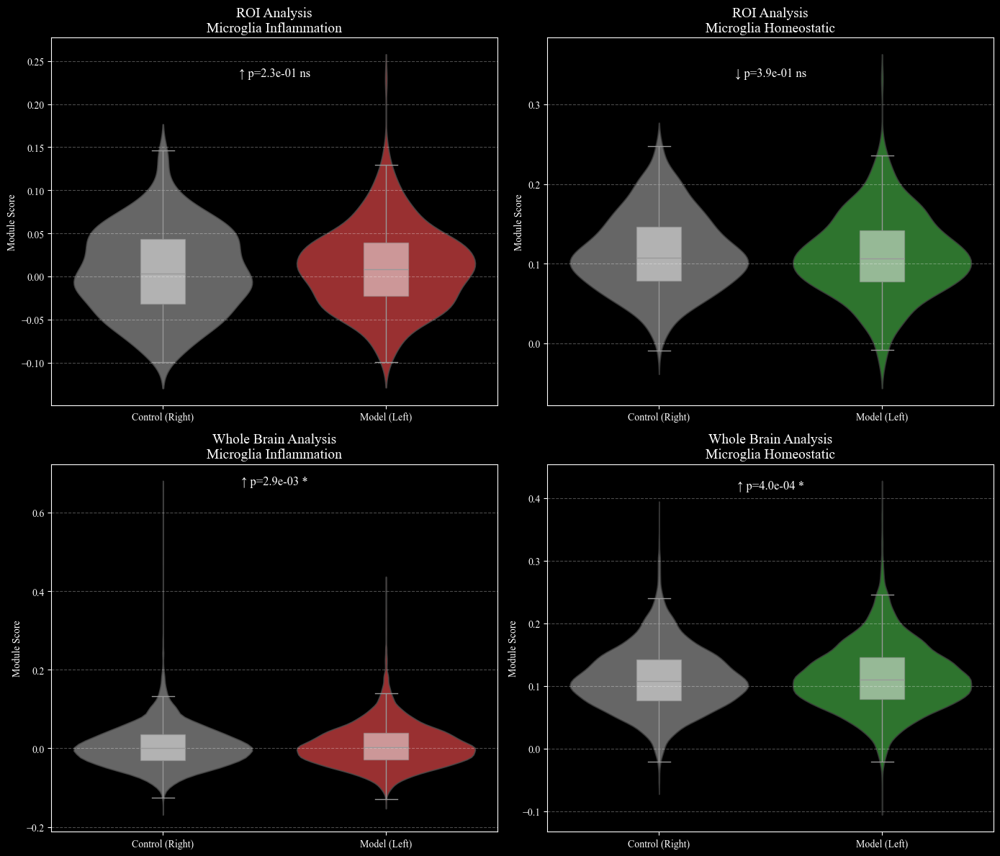

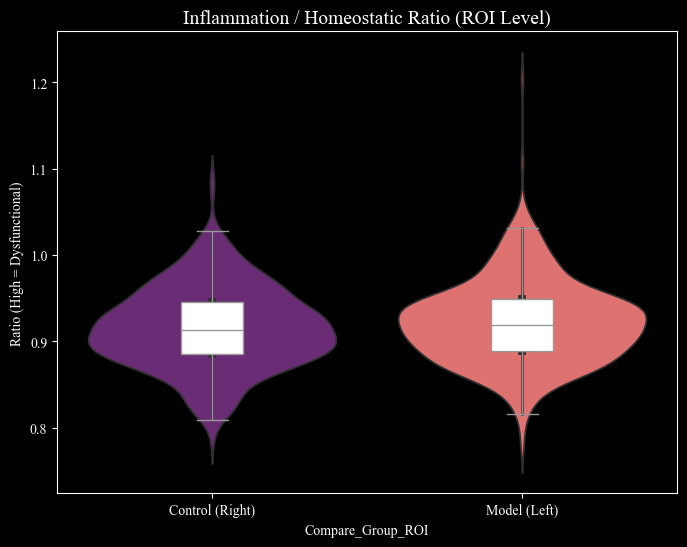

In [ ]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import mannwhitneyu

# === 1. 定义基因列表 (数据清洗) ===
# 原始列表 (直接复制您的输入)
raw_inflam = [
    "Apoe", "Axl", "Ccl2", "Tlr2", "Spp1", "Cybb", "Msr1", "Itgax", "Clec7a", 
    "Chi3l3", "Arg1", "Siglec1", "Cfp", "CxCL10", "Alcam", "Fer1l3", "Lilrb4", 
    "Gpx3", "Gas7", "Ccrl2", "Cxcl16", "Cxcr4", "Gpnmb", "Lgals3", "Ifi202b", 
    "Csf1", "Lirb4", "Lag3"
]

raw_homeo = [
    "Usp2", "Hexb", "Il21r", "Itga6", "Bin1", "Tgfbr2", "Pla2g15", "Rgmb", 
    "Plxdc2", "Csf1r", "Mef2a", "Cmklr1", "Rap1gds1", "Nuak1", "Hpgds", "F11r", 
    "Gpr34", "Abcc3", "Basp1", "Cst3", "Lair1", "St3gal6", "X99384", "Ckb", 
    "Cxxc5", "Golm1", "Abi3", "Pde3b", "Cx3cr1", "Scamp5", "Slco2b1", "Pmepa1", 
    "Il10ra", "Nr3c1", "Gtf2h2", "Siglech", "Rab3il1", "Lrrc3", "Sall1", "Inpp4b", 
    "Nrip1", "Nfkb1", "Atp8a2", "Mafb", "Olfml3", "Arhgap5", "Ltc4s", "Tgfbr1", 
    "Cttnbp2nl", "Fgd2", "Ophn1", "Tmem119", "P2ry13", "Fscn1", "Ccr5", "Mertk", 
    "Kctd12", "Tjp1", "Gpr56", "Slc2a5", "P2ry12", "Crybb1", "Rhob", "Jun", 
    "Egr1", "Fcrls", "Tgfb1", "Il10rb"
]

# 格式化：首字母大写，其余小写 (适应小鼠基因名规范)
inflam_genes = list(set([g.capitalize() for g in raw_inflam]))
homeo_genes = list(set([g.capitalize() for g in raw_homeo]))

# 构建字典
module_dict = {
    'Inflammation': inflam_genes,
    'Homeostatic': homeo_genes
}

# === 2. 准备数据 ===
# 为了结果更准确，我们建议只分析含有小胶质细胞的 Bin
# 自动锁定 Microglia 列
micro_col = 'q05_cell_abundance_w_sf_1190 Microglia NN_1' # 需根据实际列名调整
if micro_col not in adata.obs.columns:
    matches = [c for c in adata.obs.columns if 'Microglia' in c]
    if matches: micro_col = matches[0]

print(f"筛选小胶质细胞 > 0 的区域进行评分，使用列: {micro_col}")

# 提取子集：只保留 micro_col > 1e-6 的点
# 这样评分不会被没有小胶质细胞的背景区域拉低
subset = adata[adata.obs[micro_col] > 1e-6].copy()

# 标准化 (如果未做)
if subset.X.max() > 50:
    sc.pp.normalize_total(subset, target_sum=1e4)
    sc.pp.log1p(subset)

# === 3. 计算模块评分 ===
print("正在计算模块评分...")
valid_scores = []

for mod_name, genes in module_dict.items():
    valid = [g for g in genes if g in subset.var_names]
    print(f"  {mod_name}: 有效基因 {len(valid)}/{len(genes)}")
    # print(f"    (缺失: {set(genes) - set(valid)})") # 调试用
    
    score_name = f'Score_{mod_name}'
    sc.tl.score_genes(subset, gene_list=valid, score_name=score_name)
    valid_scores.append(score_name)

# === 4. 定义区域 (ROI & 全脑) ===
x = subset.obsm['spatial'][:, 0]
y = subset.obsm['spatial'][:, 1]

# 定义 Masks
masks = {
    'ROI_Model': (x >= 6000) & (x <= 7800) & (y >= 11400) & (y <= 13200),
    'ROI_Control': (x >= 12200) & (x <= 14000) & (y >= 11400) & (y <= 13200),
    'Whole_Model': (x < 10000),
    'Whole_Control': (x >= 10000)
}

# 为 subset 添加 Region 标签
subset.obs['Compare_Group_ROI'] = 'Other'
subset.obs.loc[masks['ROI_Model'], 'Compare_Group_ROI'] = 'Model (Left)'
subset.obs.loc[masks['ROI_Control'], 'Compare_Group_ROI'] = 'Control (Right)'

subset.obs['Compare_Group_Whole'] = 'Other'
subset.obs.loc[masks['Whole_Model'], 'Compare_Group_Whole'] = 'Model (Left)'
subset.obs.loc[masks['Whole_Control'], 'Compare_Group_Whole'] = 'Control (Right)'

# === 5. 绘图与统计 ===
plt.style.use('dark_background')
fig, axes = plt.subplots(2, 2, figsize=(14, 12))

# 绘图配置
comparisons = [
    ('ROI Analysis', 'Compare_Group_ROI'),
    ('Whole Brain Analysis', 'Compare_Group_Whole')
]
score_types = [
    ('Score_Inflammation', 'Microglia Inflammation', '#d62728'), # 红
    ('Score_Homeostatic', 'Microglia Homeostatic', '#2ca02c')    # 绿
]

# 存储统计结果
stats_list = []

for row_idx, (comp_name, group_col) in enumerate(comparisons):
    # 过滤掉 'Other'
    plot_data = subset.obs[subset.obs[group_col] != 'Other'].copy()
    
    for col_idx, (score_col, title, color) in enumerate(score_types):
        ax = axes[row_idx, col_idx]
        
        # 小提琴图
        sns.violinplot(
            data=plot_data, x=group_col, y=score_col,
            palette={'Model (Left)': color, 'Control (Right)': 'grey'},
            inner=None, alpha=0.8, ax=ax
        )
        # 箱线图
        sns.boxplot(
            data=plot_data, x=group_col, y=score_col,
            width=0.2, color='white', showfliers=False, ax=ax,
            boxprops={'alpha': 0.5}
        )
        
        # 统计检验
        vals_m = plot_data.loc[plot_data[group_col]=='Model (Left)', score_col]
        vals_c = plot_data.loc[plot_data[group_col]=='Control (Right)', score_col]
        stat, p = mannwhitneyu(vals_m, vals_c)
        
        # 标注
        mean_m, mean_c = vals_m.mean(), vals_c.mean()
        trend = "↑" if mean_m > mean_c else "↓"
        sig = "****" if p < 0.0001 else ("*" if p < 0.05 else "ns")
        
        ax.set_title(f'{comp_name}\n{title}', fontsize=14)
        ax.set_xlabel('')
        ax.set_ylabel('Module Score')
        ax.grid(axis='y', linestyle='--', alpha=0.3)
        
        # 在图上写 P 值
        y_max = plot_data[score_col].max()
        ax.text(0.5, y_max, f"{trend} p={p:.1e} {sig}", 
                ha='center', va='bottom', color='white', fontweight='bold', fontsize=12)
        
        # 存表
        stats_list.append({
            'Comparison': comp_name,
            'Module': title,
            'Model Mean': mean_m,
            'Control Mean': mean_c,
            'P-value': p,
            'Trend': trend
        })

plt.tight_layout()
plt.savefig('Microglia_Inflam_vs_Homeo_Switch.png', dpi=300)
print("\n图表已保存: Microglia_Inflam_vs_Homeo_Switch.png")

# === 6. 打印统计表 ===
stats_df = pd.DataFrame(stats_list)
print("\n" + "="*80)
print("【小胶质细胞状态转换统计 (Phenotypic Switch)】")
print("-" * 80)
print(stats_df)
print("="*80)

# === 7. 额外加餐：炎症/稳态 比率图 (I/H Ratio) ===
# 这是一个更敏感的指标，反映"健康指数"
# 为了避免除以0或负数，先平移分数
min_val = min(subset.obs['Score_Inflammation'].min(), subset.obs['Score_Homeostatic'].min())
offset = abs(min_val) + 1

subset.obs['IH_Ratio'] = (subset.obs['Score_Inflammation'] + offset) / (subset.obs['Score_Homeostatic'] + offset)

plt.figure(figsize=(8, 6))
plot_roi = subset.obs[subset.obs['Compare_Group_ROI'] != 'Other']
sns.violinplot(data=plot_roi, x='Compare_Group_ROI', y='IH_Ratio', palette='magma')
sns.boxplot(data=plot_roi, x='Compare_Group_ROI', y='IH_Ratio', width=0.2, color='white', showfliers=False)
plt.title('Inflammation / Homeostatic Ratio (ROI Level)', fontsize=14)
plt.ylabel('Ratio (High = Dysfunctional)')
plt.savefig('Microglia_IH_Ratio.png', dpi=300)
print("图表已保存: Microglia_IH_Ratio.png")

正在分析小胶质细胞密度与激活状态的关系...
Inflam Genes: 23/28 valid.
Homeo Genes: 66/68 valid.
使用密度列: q05_cell_abundance_w_sf_1194 Microglia NN_1


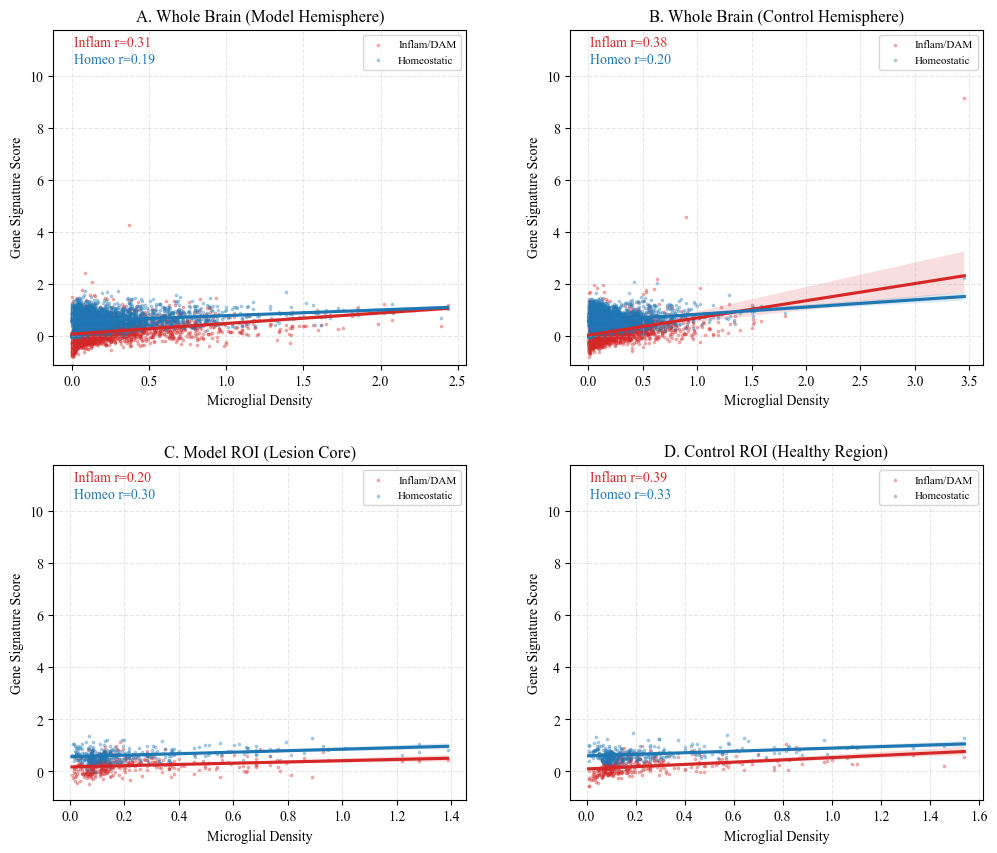

图表已保存: Microglia_Density_vs_Activation.pdf


In [ ]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

print("正在分析小胶质细胞密度与激活状态的关系...")

# ==========================================
# 1. 定义基因集并清洗
# ==========================================
raw_inflam = [
    "Apoe", "Axl", "Ccl2", "Tlr2", "Spp1", "Cybb", "Msr1", "Itgax", "Clec7a", 
    "Chi3l3", "Arg1", "Siglec1", "Cfp", "CxCL10", "Alcam", "Fer1l3", "Lilrb4", 
    "Gpx3", "Gas7", "Ccrl2", "Cxcl16", "Cxcr4", "Gpnmb", "Lgals3", "Ifi202b", 
    "Csf1", "Lirb4", "Lag3"
]

raw_homeo = [
    "Usp2", "Hexb", "Il21r", "Itga6", "Bin1", "Tgfbr2", "Pla2g15", "Rgmb", 
    "Plxdc2", "Csf1r", "Mef2a", "Cmklr1", "Rap1gds1", "Nuak1", "Hpgds", "F11r", 
    "Gpr34", "Abcc3", "Basp1", "Cst3", "Lair1", "St3gal6", "X99384", "Ckb", 
    "Cxxc5", "Golm1", "Abi3", "Pde3b", "Cx3cr1", "Scamp5", "Slco2b1", "Pmepa1", 
    "Il10ra", "Nr3c1", "Gtf2h2", "Siglech", "Rab3il1", "Lrrc3", "Sall1", "Inpp4b", 
    "Nrip1", "Nfkb1", "Atp8a2", "Mafb", "Olfml3", "Arhgap5", "Ltc4s", "Tgfbr1", 
    "Cttnbp2nl", "Fgd2", "Ophn1", "Tmem119", "P2ry13", "Fscn1", "Ccr5", "Mertk", 
    "Kctd12", "Tjp1", "Gpr56", "Slc2a5", "P2ry12", "Crybb1", "Rhob", "Jun", 
    "Egr1", "Fcrls", "Tgfb1", "Il10rb"
]

# 检查基因是否存在，还要修正一些大小写问题 (比如 CxCL10 -> Cxcl10)
def validate_genes(gene_list):
    valid = []
    for g in gene_list:
        g_capitalized = g.capitalize() # 首字母大写，其余小写
        if g_capitalized in adata.var_names:
            valid.append(g_capitalized)
        elif g in adata.var_names: # 尝试原始拼写
            valid.append(g)
    return list(set(valid))

valid_inflam = validate_genes(raw_inflam)
valid_homeo = validate_genes(raw_homeo)

print(f"Inflam Genes: {len(valid_inflam)}/{len(raw_inflam)} valid.")
print(f"Homeo Genes: {len(valid_homeo)}/{len(raw_homeo)} valid.")

# ==========================================
# 2. 计算 Module Score
# ==========================================
sc.tl.score_genes(adata, gene_list=valid_inflam, score_name='Inflam_Score')
sc.tl.score_genes(adata, gene_list=valid_homeo, score_name='Homeo_Score')

# ==========================================
# 3. 准备绘图数据
# ==========================================
# 提取小胶质细胞密度 (自动查找列)
micro_cols = [c for c in adata.obs.columns if 'Microglia' in c and 'abundance' not in c] 
# 注意：如果您的密度列名有变化，请手动指定，比如：
# micro_col = 'Microglia_Density' (如果之前算过)
# 或者重新从 cell2location 结果提取:
c2l_cols = [c for c in adata.obs.columns if 'Microglia' in c and 'abundance' in c]
if c2l_cols:
    micro_col = c2l_cols[0]
else:
    # 假设之前有一列叫 Microglia_Density
    micro_col = 'Microglia_Density' if 'Microglia_Density' in adata.obs.columns else None

if not micro_col:
    raise ValueError("找不到小胶质细胞密度列，请检查 adata.obs")

print(f"使用密度列: {micro_col}")

# 构建 DataFrame
df_plot = pd.DataFrame({
    'Density': adata.obs[micro_col],
    'Inflam': adata.obs['Inflam_Score'],
    'Homeo': adata.obs['Homeo_Score'],
    'x': adata.obsm['spatial'][:, 0],
    'y': adata.obsm['spatial'][:, 1]
})

# 定义区域
roi_m = {'x': [6000, 7800], 'y': [11400, 13200]}
roi_c = {'x': [12200, 14000], 'y': [11400, 13200]}

mask_model_all = df_plot['x'] < 10000
mask_ctrl_all = df_plot['x'] >= 10000
mask_model_roi = (df_plot['x'] >= roi_m['x'][0]) & (df_plot['x'] <= roi_m['x'][1]) & \
                 (df_plot['y'] >= roi_m['y'][0]) & (df_plot['y'] <= roi_m['y'][1])
mask_ctrl_roi = (df_plot['x'] >= roi_c['x'][0]) & (df_plot['x'] <= roi_c['x'][1]) & \
                 (df_plot['y'] >= roi_c['y'][0]) & (df_plot['y'] <= roi_c['y'][1])

# ==========================================
# 4. 绘图函数
# ==========================================
def plot_correlation(ax, mask, title):
    data = df_plot[mask]
    
    # 为了防止点太密集，随机下采样 (如果点超过5000个)
    if len(data) > 5000:
        data = data.sample(5000, random_state=42)
        
    # 绘制 Inflam (红色)
    sns.regplot(data=data, x='Density', y='Inflam', ax=ax, 
                scatter_kws={'s': 3, 'alpha': 0.3}, color='#d62728', label='Inflam/DAM')
    
    # 绘制 Homeo (蓝色)
    sns.regplot(data=data, x='Density', y='Homeo', ax=ax, 
                scatter_kws={'s': 3, 'alpha': 0.3}, color='#1f77b4', label='Homeostatic')
    
    # 计算相关性
    r_inf, p_inf = pearsonr(data['Density'], data['Inflam'])
    r_hom, p_hom = pearsonr(data['Density'], data['Homeo'])
    
    # 添加文字标注
    ax.text(0.05, 0.95, f'Inflam r={r_inf:.2f}', transform=ax.transAxes, color='#d62728', fontweight='bold')
    ax.text(0.05, 0.90, f'Homeo r={r_hom:.2f}', transform=ax.transAxes, color='#1f77b4', fontweight='bold')
    
    ax.set_title(title)
    ax.set_xlabel('Microglial Density')
    ax.set_ylabel('Gene Signature Score')
    ax.legend(loc='upper right', fontsize=8)

# ==========================================
# 5. 生成四张图 (2x2)
# ==========================================
plt.style.use('default')
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['pdf.fonttype'] = 42

fig, axes = plt.subplots(2, 2, figsize=(12, 10))
plt.subplots_adjust(hspace=0.3, wspace=0.25)

# A. 全脑 Model
plot_correlation(axes[0, 0], mask_model_all, 'A. Whole Brain (Model Hemisphere)')

# B. 全脑 Control
plot_correlation(axes[0, 1], mask_ctrl_all, 'B. Whole Brain (Control Hemisphere)')

# C. ROI Model
plot_correlation(axes[1, 0], mask_model_roi, 'C. Model ROI (Lesion Core)')

# D. ROI Control
plot_correlation(axes[1, 1], mask_ctrl_roi, 'D. Control ROI (Healthy Region)')

# 统一Y轴范围 (为了方便横向对比)
y_min = df_plot[['Inflam', 'Homeo']].min().min()
y_max = df_plot[['Inflam', 'Homeo']].max().max()
for ax in axes.flatten():
    ax.set_ylim(y_min, y_max)
    ax.grid(True, linestyle='--', alpha=0.3)

# 保存
plt.savefig('Microglia_Density_vs_Activation.pdf', dpi=600, bbox_inches='tight')
plt.show()

print("图表已保存: Microglia_Density_vs_Activation.pdf")

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import scanpy as sc
from scipy.stats import linregress

# === 1. 定义基因列表 ===
raw_inflam = [
    "Apoe", "Axl", "Ccl2", "Tlr2", "Spp1", "Cybb", "Msr1", "Itgax", "Clec7a", 
    "Chi3l3", "Arg1", "Siglec1", "Cfp", "CxCL10", "Alcam", "Fer1l3", "Lilrb4", 
    "Gpx3", "Gas7", "Ccrl2", "Cxcl16", "Cxcr4", "Gpnmb", "Lgals3", "Ifi202b", 
    "Csf1", "Lirb4", "Lag3"
]

raw_homeo = [
    "Usp2", "Hexb", "Il21r", "Itga6", "Bin1", "Tgfbr2", "Pla2g15", "Rgmb", 
    "Plxdc2", "Csf1r", "Mef2a", "Cmklr1", "Rap1gds1", "Nuak1", "Hpgds", "F11r", 
    "Gpr34", "Abcc3", "Basp1", "Cst3", "Lair1", "St3gal6", "X99384", "Ckb", 
    "Cxxc5", "Golm1", "Abi3", "Pde3b", "Cx3cr1", "Scamp5", "Slco2b1", "Pmepa1", 
    "Il10ra", "Nr3c1", "Gtf2h2", "Siglech", "Rab3il1", "Lrrc3", "Sall1", "Inpp4b", 
    "Nrip1", "Nfkb1", "Atp8a2", "Mafb", "Olfml3", "Arhgap5", "Ltc4s", "Tgfbr1", 
    "Cttnbp2nl", "Fgd2", "Ophn1", "Tmem119", "P2ry13", "Fscn1", "Ccr5", "Mertk", 
    "Kctd12", "Tjp1", "Gpr56", "Slc2a5", "P2ry12", "Crybb1", "Rhob", "Jun", 
    "Egr1", "Fcrls", "Tgfb1", "Il10rb"
]

inflam_genes = list(set([g.capitalize() for g in raw_inflam]))
homeo_genes = list(set([g.capitalize() for g in raw_homeo]))

# === 2. 计算评分 ===
# 筛选小胶质细胞 > 0 的区域，避免背景噪音
micro_col = 'q05_cell_abundance_w_sf_1190 Microglia NN_1' # 请根据实际情况修改
# 自动纠错
if micro_col not in adata.obs.columns:
    matches = [c for c in adata.obs.columns if 'Microglia' in c]
    if matches: micro_col = matches[0]

subset = adata[adata.obs[micro_col] > 1e-6].copy()

# 标准化
if subset.X.max() > 50:
    sc.pp.normalize_total(subset, target_sum=1e4)
    sc.pp.log1p(subset)

print("正在计算模块评分...")
sc.tl.score_genes(subset, gene_list=inflam_genes, score_name='Score_Inflam')
sc.tl.score_genes(subset, gene_list=homeo_genes, score_name='Score_Homeo')

# === 3. 定义 4 个区域 ===
x = subset.obsm['spatial'][:, 0]
y = subset.obsm['spatial'][:, 1]

regions = {
    'ROI Model (Lesion)': (x >= 6000) & (x <= 7800) & (y >= 11400) & (y <= 13200),
    'ROI Control (Healthy)': (x >= 12200) & (x <= 14000) & (y >= 11400) & (y <= 13200),
    'Whole Brain Model': (x < 10000),
    'Whole Brain Control': (x >= 10000)
}

# === 4. 绘图 (散点+密度+45度线) ===
plt.style.use('dark_background')
fig, axes = plt.subplots(2, 2, figsize=(16, 16))
axes = axes.flatten()

# 统一坐标轴范围，确保可比性
all_scores = np.concatenate([subset.obs['Score_Inflam'], subset.obs['Score_Homeo']])
vmin, vmax = np.percentile(all_scores, 1), np.percentile(all_scores, 99)
axis_range = [vmin - 0.2, vmax + 0.2]

for i, (region_name, mask) in enumerate(regions.items()):
    ax = axes[i]
    data = subset.obs[mask].copy()
    
    if len(data) < 10:
        ax.text(0.5, 0.5, "Not enough data", ha='center', color='white')
        continue

    x_vals = data['Score_Homeo']
    y_vals = data['Score_Inflam']
    
    # 1. 绘制对角线 (y=x)
    ax.plot([-10, 10], [-10, 10], color='white', linestyle='--', linewidth=2, alpha=0.8, label='Balance (y=x)')
    
    # 2. 绘制散点 (根据密度着色)
    # 计算点在线上还是线下
    is_inflamed = y_vals > x_vals
    pct_inflamed = is_inflamed.sum() / len(data) * 100
    
    # 简单的 KDE 密度图 (让核心区域发光)
    sns.kdeplot(
        x=x_vals, y=y_vals, 
        fill=True, cmap="magma", levels=10, alpha=0.6, ax=ax, thresh=0.05
    )
    # 叠加散点 (为了看清边缘点)
    ax.scatter(x_vals, y_vals, c='cyan', s=5, alpha=0.3, edgecolors='none')
    
    # 3. 计算回归斜率 (Slope)
    # 如果 slope > 1 (45度)，说明炎症随稳态变化增长得更快
    slope, intercept, r_value, p_value, std_err = linregress(x_vals, y_vals)
    
    # 绘制实际回归线
    x_range = np.linspace(vmin, vmax, 100)
    ax.plot(x_range, slope*x_range + intercept, color='yellow', linewidth=2, label=f'Trend (Slope={slope:.2f})')
    
    # 4. 区域着色提示
    # 左上角区域背景标红 (Inflammation Zone)
    # 右下角区域背景标绿 (Homeostatic Zone)
    ax.fill_between(axis_range, axis_range, axis_range[1], color='red', alpha=0.05)
    ax.fill_between(axis_range, axis_range[0], axis_range, color='green', alpha=0.05)

    # 5. 美化与标注
    ax.set_title(f'{region_name}\nInflamed Ratio: {pct_inflamed:.1f}%', fontsize=16, fontweight='bold')
    ax.set_xlabel('Homeostatic Score (Peace)', fontsize=12, color='lightgreen')
    ax.set_ylabel('Inflammation Score (War)', fontsize=12, color='salmon')
    
    ax.set_xlim(axis_range)
    ax.set_ylim(axis_range)
    ax.grid(True, linestyle='--', alpha=0.3)
    ax.legend(loc='upper left', fontsize=10)
    
    # 在角落添加文字说明
    ax.text(vmax*0.8, vmin*0.8, "Homeostatic\nDominant", color='lightgreen', ha='center')
    ax.text(vmin*0.8, vmax*0.8, "Inflammation\nDominant", color='salmon', ha='center')

plt.tight_layout()
plt.savefig('Microglia_State_Phase_Plot_4Panel.png', dpi=300)
print("\n图表已保存: Microglia_State_Phase_Plot_4Panel.png")

In [ ]:
import scanpy as sc
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# === 1. 准备数据 ===
print("正在提取细胞丰度数据...")
# 提取所有细胞类型的丰度列
cell_cols = [c for c in adata.obs.columns if 'q05_cell_abundance_w_sf' in c]
# 如果没找到，尝试短名
if not cell_cols:
    cell_cols = [c for c in adata.obs.columns if 'NN_' in c]

# 创建一个新的 AnnData 对象，专门用于分析"细胞组成"
adata_niche = sc.AnnData(X=adata.obs[cell_cols].values)

# --- 修复点：直接复制空间坐标，不强求 sample 列 ---
adata_niche.obsm['spatial'] = adata.obsm['spatial']
adata_niche.var_names = [c.split('w_sf_')[-1] for c in cell_cols] # 简化细胞名

# --- 关键修复：手动重新生成 'Region' 标签 ---
# 既然我们知道左右脑是分开的，我们直接根据坐标生成，不再依赖原来的 obs
x_coords = adata_niche.obsm['spatial'][:, 0]
region_labels = []
for x in x_coords:
    if x < 10000:
        region_labels.append('Model (Left)')
    else:
        region_labels.append('Control (Right)')

adata_niche.obs['Region'] = region_labels
print("已重新生成 Region 标签 (基于 X 坐标)")

# === 2. 标准流程 (PCA -> Neighbors -> UMAP -> Clustering) ===
print("正在进行聚类分析 (PCA -> UMAP -> Leiden)...")

# 标准化：每个点的细胞总数归一化（处理测序深度差异）
sc.pp.normalize_total(adata_niche, target_sum=1) 
# Log1p：处理长尾分布
sc.pp.log1p(adata_niche)

# PCA (基于细胞类型)
sc.tl.pca(adata_niche, n_comps=10) 

# Neighbors (计算相似性)
sc.pp.neighbors(adata_niche, n_neighbors=20, n_pcs=10)

# UMAP (降维可视化)
sc.tl.umap(adata_niche)

# Leiden Clustering (聚类：定义微环境)
# resolution = 0.5 是一个比较适中的粒度，想分得更细就调大 (e.g., 0.8)
sc.tl.leiden(adata_niche, resolution=0.5, key_added='Spatial_Niche')

# === 3. 绘图 ===
plt.style.use('dark_background')
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

# 图1: UMAP (看微环境的异质性)
# 这张图展示的是：哪些 Bin 的细胞组成是相似的？
sc.pl.umap(
    adata_niche, 
    color='Spatial_Niche', 
    ax=axes[0], 
    show=False, 
    title='Niche Clusters (UMAP)',
    frameon=False,
    legend_loc='on data' # 把标签直接标在图上
)

# 图2: 空间分布 (看这些 Cluster 在脑子里的哪里)
# 这张图展示的是：这些"社区"在物理空间上是如何分布的？
sc.pl.spatial(
    adata_niche, 
    color='Spatial_Niche', 
    spot_size=100, # Bin100 数据用 100
    ax=axes[1], 
    show=False, 
    title='Spatial Distribution of Niches',
    frameon=False,
    img_key=None # 确保不画背景图，只画点
)

plt.tight_layout()
plt.savefig('Spatial_Niche_Clustering_Fixed.png', dpi=300)
print("\n图表已保存: Spatial_Niche_Clustering_Fixed.png")

# === 4. (可选) 查看每个 Niche 到底是由什么细胞组成的 ===
# 这步很重要，不然你不知道 "Niche 0" 到底是什么
print("\n正在计算每个 Niche 的标志性细胞类型...")
sc.tl.rank_genes_groups(adata_niche, groupby='Spatial_Niche', method='wilcoxon')
sc.pl.rank_genes_groups_dotplot(
    adata_niche, 
    n_genes=3, 
    title='Top Cell Types per Niche',
    save='_Niche_Markers.png'
)
print("成分分析图已保存: figures/dotplot_Niche_Markers.png")

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import scanpy as sc
from scipy.spatial import cKDTree
from scipy.stats import spearmanr
from tqdm import tqdm

# === 1. 准备数据 ===
# 获取 Syn 表达量
if 'expr_SNCA' in adata.obs.columns:
    syn_vals = adata.obs['expr_SNCA'].values
else:
    # 自动查找
    g_cand = ['Snca', 'SNCA', 'Human_SNCA']
    tgt = next((g for g in g_cand if g in adata.var_names), None)
    syn_vals = adata[:, tgt].X.toarray().flatten() if tgt else np.zeros(adata.shape[0])

# 定义 ROI
x = adata.obsm['spatial'][:, 0]
y = adata.obsm['spatial'][:, 1]
mask_model = (x >= 6000) & (x <= 7800) & (y >= 11400) & (y <= 13200)
mask_ctrl = (x >= 12200) & (x <= 14000) & (y >= 11400) & (y <= 13200)

# === 2. 计算“到病理核心的距离” ===
print("正在计算病理距离场...")
# 定义病理核心：Model ROI 内 Syn 表达最高的 Top 10% 区域
roi_syn = syn_vals[mask_model]
if len(roi_syn) > 0:
    thresh = np.percentile(roi_syn, 90)
    core_mask = mask_model & (syn_vals > thresh)
    core_coords = adata.obsm['spatial'][core_mask]
    
    # 构建 KDTree
    tree = cKDTree(core_coords)
    
    # 计算 Model ROI 内所有点到最近核心的距离
    model_coords = adata.obsm['spatial'][mask_model]
    dists, _ = tree.query(model_coords)
else:
    print("错误：未找到病理核心")
    dists = np.zeros(mask_model.sum())

# === 3. 基因筛选与计算 ===
# 筛选高变基因 + 您的 Marker
sc.pp.filter_genes(adata, min_cells=10) # 简单过滤
target_genes = ['Spp1', 'Gpnmb', 'Apoe', 'Trem2', 'Cd68', 'Cst7', 'Lpl',  'Prf1',  'Cd8a', 'Cd4', 'Snca', 'Ccl2', 'Cxcl10']
# 补充 Top 高变基因作为背景
sc.pp.highly_variable_genes(adata, n_top_genes=1000)
hvg = adata.var_names[adata.var['highly_variable']].tolist()
gene_list = list(set(target_genes + hvg))

results = []
print(f"正在扫描 {len(gene_list)} 个基因的空间模式...")

for gene in tqdm(gene_list):
    # 获取表达量
    expr = adata[:, gene].X.toarray().flatten()
    
    # 1. Y轴: Global LFC (Model ROI vs Ctrl ROI)
    m_expr = expr[mask_model]
    c_expr = expr[mask_ctrl]
    lfc = np.log2((m_expr.mean() + 0.01) / (c_expr.mean() + 0.01))
    
    # 2. X轴: Distance Sensitivity (Spearman rho with Distance)
    # 注意：我们取负相关系数 (-rho)。
    # 因为距离越小(0)，表达越高，这是"负相关"。
    # 取负后，正值越大代表"离病灶越近越高"。
    if m_expr.sum() > 0:
        rho, _ = spearmanr(m_expr, dists)
        sensitivity = -rho 
    else:
        sensitivity = 0
        
    # 标记类型
    g_type = 'Background'
    if gene in ['Spp1', 'Gpnmb', 'Apoe', 'Trem2', 'Cd68', 'Cst7', 'Lpl']: g_type = 'DAM Markers'
    if gene in ['Gzmb', 'Prf1', 'Ifng', 'Cd8a']: g_type = 'T Cell Markers'
    
    results.append({
        'Gene': gene,
        'LFC': lfc,
        'Sensitivity': sensitivity,
        'Type': g_type
    })

df = pd.DataFrame(results)

# === 4. 绘图 ===
plt.style.use('dark_background')
fig, ax = plt.subplots(figsize=(10, 8))

# 颜色
colors = {'DAM Markers': '#d62728', 'T Cell Markers': '#9467bd', 'Background': '#333333'}

# 画背景点
bg = df[df['Type']=='Background']
ax.scatter(bg['Sensitivity'], bg['LFC'], c=colors['Background'], s=10, alpha=0.3)

# 画重点点
for t in ['DAM Markers', 'T Cell Markers']:
    sub = df[df['Type']==t]
    ax.scatter(sub['Sensitivity'], sub['LFC'], c=colors[t], s=80, edgecolors='white', label=t)

# 辅助线
ax.axhline(0.5, ls='--', color='white', alpha=0.5) # LFC 阈值
ax.axvline(0.2, ls='--', color='white', alpha=0.5) # 敏感性阈值

# 标注
texts = []
from adjustText import adjust_text
# 标重点基因
for i, row in df[df['Type']!='Background'].iterrows():
    texts.append(ax.text(row['Sensitivity'], row['LFC'], row['Gene'], color='white', fontweight='bold'))

# 标背景里的黑马 (LFC高且敏感性高)
top_bg = df[(df['Type']=='Background') & (df['Sensitivity']>0.3) & (df['LFC']>1.0)]
for i, row in top_bg.iterrows():
    texts.append(ax.text(row['Sensitivity'], row['LFC'], row['Gene'], color='yellow', fontsize=8))

adjust_text(texts, arrowprops=dict(arrowstyle='-', color='grey', lw=0.5))

ax.set_title('Spatial Quadrant: Distance Sensitivity vs Global Change', fontsize=16)
ax.set_xlabel('Spatial Sensitivity (-Correlation with Dist to Pathology)', fontsize=12)
ax.set_ylabel('Log2 Fold Change (Model ROI / Control ROI)', fontsize=12)
ax.legend()

plt.tight_layout()
plt.savefig('Spatial_Distance_Quadrant_Plot.png', dpi=300)
print("图表已保存: Spatial_Distance_Quadrant_Plot.png")

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import scipy.sparse

# === 1. 数据准备 ===
# A. 自动查找 SNCA 基因
gene_candidates = [ 'SNCA', 'Human_SNCA']
target_gene = next((g for g in gene_candidates if g in adata.var_names), None)

if target_gene:
    print(f"正在分析基因: {target_gene}")
    # 提取表达量
    if scipy.sparse.issparse(adata.X):
        expr_vals = adata[:, target_gene].X.toarray().flatten()
    else:
        expr_vals = adata[:, target_gene].X.flatten()
else:
    # 如果之前算在 obs 里了
    if 'expr_SNCA' in adata.obs.columns:
        print("使用现有的 'expr_SNCA' 列")
        expr_vals = adata.obs['expr_SNCA'].values
        target_gene = "SNCA (Obs)"
    else:
        raise ValueError("未找到 SNCA 数据！")

# B. 定义左右脑
x_coords = adata.obsm['spatial'][:, 0]
mask_model = x_coords < 10000   # 左侧 (Model)
mask_ctrl = x_coords >= 10000   # 右侧 (Control)

vals_model = expr_vals[mask_model]
vals_ctrl = expr_vals[mask_ctrl]

# === 2. 生成统计表 ===
# 定义区间：0, >0, 极高值
# 注意：阈值需要根据您的数据标准化情况调整。
# 假设是 Log1p 后的数据，通常范围在 0~5 之间。
# 我们可以按分位数来定“高/中/低”

def get_stats(vals, name):
    total = len(vals)
    zeros = np.sum(vals == 0)
    pos = np.sum(vals > 0)
    
    # 定义高表达阈值 (比如 > 1.0, 视数据而定，这里取相对值)
    # 如果是 counts，可能几十几百；如果是 log1p，通常 < 7
    # 这里我们简单打印几个区段
    return {
        'Region': name,
        'Total Bins': total,
        'Zero Count (0)': f"{zeros} ({zeros/total:.1%})",
        'Positive Count (>0)': f"{pos} ({pos/total:.1%})",
        'Max Value': f"{vals.max():.4f}",
        'Mean Value': f"{vals.mean():.4f}"
    }

stats = [get_stats(vals_model, 'Model (Left)'), get_stats(vals_ctrl, 'Control (Right)')]
df_stats = pd.DataFrame(stats)

# === 3. 绘图 ===
plt.style.use('dark_background')
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# 图 A: 叠加直方图 (Histogram)
ax = axes[0]
bins = 50
# 使用对数刻度 Y 轴，因为 0 的数量通常巨大，不取对数看不清后面的尾巴
ax.hist(vals_model, bins=bins, alpha=0.6, color='#ff7f0e', label='Model (Left)', log=True)
ax.hist(vals_ctrl, bins=bins, alpha=0.6, color='#1f77b4', label='Control (Right)', log=True)

ax.set_title(f'{target_gene} Distribution (Log Scale Y)', fontsize=14)
ax.set_xlabel('Expression Level (Density)')
ax.set_ylabel('Count of Bins (Log Scale)')
ax.legend()
ax.grid(True, linestyle='--', alpha=0.2)

# 图 B: 小提琴图 (Violin Plot) - 只看 >0 的部分 (避免 0 值挤压图形)
ax = axes[1]
plot_df = pd.DataFrame({
    'Expression': np.concatenate([vals_model, vals_ctrl]),
    'Region': ['Model (Left)']*len(vals_model) + ['Control (Right)']*len(vals_ctrl)
})
# 过滤掉 0 值以便看清楚表达分布形态
plot_df_pos = plot_df[plot_df['Expression'] > 0]

if len(plot_df_pos) > 0:
    sns.violinplot(data=plot_df_pos, x='Region', y='Expression', palette=['#ff7f0e', '#1f77b4'], ax=ax, inner="quartile")
    ax.set_title(f'{target_gene} Distribution (Positive Bins Only)', fontsize=14)
    ax.set_ylabel('Expression Level')
else:
    ax.text(0.5, 0.5, "No positive expression found", ha='center', color='white')

plt.tight_layout()
plt.savefig('SNCA_Density_Distribution_Check.png', dpi=300)
print("\n图表已保存: SNCA_Density_Distribution_Check.png")

# === 4. 打印详细统计表 ===
print("\n" + "="*80)
print("【SNCA 密度分布统计表】")
print("-" * 80)
print(df_stats.to_string(index=False))

# 补充：细分区间统计 (假设数据是 Log1p 后的，通常 0-5)
print("-" * 80)
print("细分区间 Bin 数量统计 (Count of Bins):")

# 定义区间
bins_edges = [-0.1, 0.0001, 0.5, 1.0, 2.0, 100]
labels = ['Zero (0)', 'Low (0-0.5)', 'Mid (0.5-1)', 'High (1-2)', 'Ultra (>2)']

model_cuts = pd.cut(vals_model, bins=bins_edges, labels=labels).value_counts().sort_index()
ctrl_cuts = pd.cut(vals_ctrl, bins=bins_edges, labels=labels).value_counts().sort_index()

counts_df = pd.DataFrame({'Model (Left)': model_cuts, 'Control (Right)': ctrl_cuts})
print(counts_df)
print("="*80)

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.sparse

# === 1. 准备数据 ===
# 查找基因
gene_candidates = ['SNCA', 'Human_SNCA']
target_gene = next((g for g in gene_candidates if g in adata.var_names), None)

if target_gene:
    if scipy.sparse.issparse(adata.X):
        expr_vals = adata[:, target_gene].X.toarray().flatten()
    else:
        expr_vals = adata[:, target_gene].X.flatten()
elif 'expr_SNCA' in adata.obs.columns:
    expr_vals = adata.obs['expr_SNCA'].values
else:
    raise ValueError("未找到 SNCA 数据")

# 分割左右脑
x_coords = adata.obsm['spatial'][:, 0]
vals_model = expr_vals[x_coords < 10000] # 左侧
vals_ctrl = expr_vals[x_coords >= 10000] # 右侧

# === 2. 核心计算：0.2 一跳 ===
# 确定最大值，向上取整
max_val = max(vals_model.max(), vals_ctrl.max())
max_ceil = np.ceil(max_val * 5) / 5 + 0.2

# 定义所有区间节点 (Bins)
# 为了包含 0 值，起始点设为 -0.001
bins = np.concatenate([[-0.001], np.arange(0.2, max_ceil + 0.2, 0.2)])

# 使用 pd.cut 进行切割统计
model_cuts = pd.cut(vals_model, bins=bins).value_counts().sort_index()
ctrl_cuts = pd.cut(vals_ctrl, bins=bins).value_counts().sort_index()

# 合并表格
df_fine = pd.DataFrame({
    'Range': model_cuts.index,
    'Model_Count': model_cuts.values,
    'Control_Count': ctrl_cuts.values
})

# 计算总计
df_fine['Total_Count'] = df_fine['Model_Count'] + df_fine['Control_Count']

# --- 关键修复点 ---
# 1. 先生成字符串标签
# 2. 立即转换为 str 类型 (astype(str))，打破 Categorical 的限制
df_fine['Range_Label'] = df_fine['Range'].apply(lambda x: f"{x.left:.1f} - {x.right:.1f}").astype(str)

# 现在可以随意替换字符串了
# 修正第一个区间的显示 (-0.0 -> 0.0)
# 查找以 "-0.0" 开头的标签进行替换
df_fine['Range_Label'] = df_fine['Range_Label'].str.replace("-0.0", "0.0", regex=False)

# 重新排序列
df_final = df_fine[['Range_Label', 'Model_Count', 'Control_Count', 'Total_Count']]

# === 3. 打印长表 (只打印有数据的行) ===
# 过滤掉 Total 为 0 的行 (太后面的空区间不看)
df_print = df_final[df_final['Total_Count'] > 0].copy()

pd.set_option('display.max_rows', 100)
print("\n" + "="*60)
print(f"【SNCA 密度精细分布表 (Step=0.2)】")
print(f"统计对象: {target_gene}")
print("-" * 60)
print(f"{'Range (Density)':<20} | {'Model':<8} | {'Control':<8} | {'Total'}")
print("-" * 60)

for idx, row in df_print.iterrows():
    # 高亮 Model 比 Control 多很多的行
    mark = "  <<<" if row['Model_Count'] > row['Control_Count'] * 2 and row['Model_Count'] > 10 else ""
    print(f"{row['Range_Label']:<20} | {row['Model_Count']:<8} | {row['Control_Count']:<8} | {row['Total_Count']}{mark}")
print("="*60)

# === 4. 补充绘图：堆叠柱状图 ===
plt.style.use('dark_background')
fig, ax = plt.subplots(figsize=(14, 6))

x_labels = df_print['Range_Label']
x_idx = np.arange(len(x_labels))

# 画 Control (底部)
p1 = ax.bar(x_idx, df_print['Control_Count'], label='Control (Right)', color='#1f77b4', alpha=0.8)
# 画 Model (堆叠在上面)
p2 = ax.bar(x_idx, df_print['Model_Count'], bottom=df_print['Control_Count'], label='Model (Left)', color='#ff7f0e', alpha=0.8)

ax.set_title(f'SNCA Expression Distribution (Step=0.2)', fontsize=14)
ax.set_xticks(x_idx)
ax.set_xticklabels(x_labels, rotation=45, ha='right', fontsize=9)
ax.set_xlabel('Expression Density Range')
ax.set_ylabel('Number of Bins (Log Scale)')
# 使用 Log 轴
ax.set_yscale('log')
ax.legend()
ax.grid(axis='y', linestyle='--', alpha=0.2)

plt.tight_layout()
plt.savefig('SNCA_Fine_Grain_Distribution.png', dpi=300)
print("图表已保存: SNCA_Fine_Grain_Distribution.png")

正在分析 T细胞激活状态 与 强激活小胶质细胞距离 的关系...
-> 锁定 T 细胞列: Sum_T_cells_Vis
-> 锁定 小胶质细胞列: q05_cell_abundance_w_sf_1194 Microglia NN_1
-> 有效激活基因 (6/7): ['Cd69', 'Il2ra', 'Cd44', 'Cd28', 'Icos', 'Tnfrsf4']

【成功】绘图数据已保存至: T_Activation_vs_Distance_Microglia0.9.csv
共提取 T 细胞数量: 52
CSV 列包含: Group | Distance_to_High_Microglia | T_Activation_Score


<Figure size 800x600 with 0 Axes>

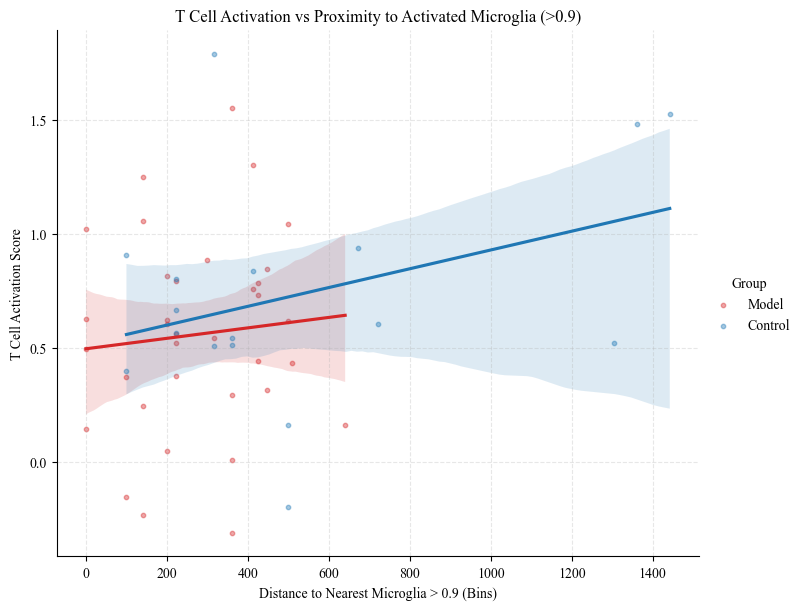


Model 组统计相关性: Pearson r = 0.089, P-value = 6.09e-01
结论: 未观察到明显的空间促进效应。


In [ ]:
import pandas as pd
import numpy as np
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree
from scipy.stats import pearsonr

print("正在分析 T细胞激活状态 与 强激活小胶质细胞距离 的关系...")

# ==============================================================================
# 1. 自动搜索并锁定关键列名 (安全模式)
# ==============================================================================
# A. T 细胞列
col_t_list = [c for c in adata.obs.columns if 'T cell' in c or 'T cells' in c]
if not col_t_list:
    raise ValueError("未找到 T 细胞相关列，请检查 adata.obs.columns")
target_t = 'Sum_T_cells_Vis'
adata.obs[target_t] = adata.obs[col_t_list].sum(axis=1)

# B. 小胶质细胞列 (修复之前的 IndexError)
micro_matches = [c for c in adata.obs.columns if 'Microglia' in c or 'microglia' in c]
if not micro_matches:
    # 尝试更模糊的搜索
    print("警告: 未找到 'Microglia'，尝试搜索 'Glia'...")
    micro_matches = [c for c in adata.obs.columns if 'Glia' in c or 'glia' in c]

if not micro_matches:
    raise ValueError("无法找到小胶质细胞列，请手动指定 target_micro = '你的列名'")
    
target_micro = micro_matches[0]
print(f"-> 锁定 T 细胞列: {target_t}")
print(f"-> 锁定 小胶质细胞列: {target_micro}")

# ==============================================================================
# 2. 计算 T 细胞激活评分
# ==============================================================================
activation_genes = ['Cd69', 'Il2ra', 'Cd44', 'Cd28', 'Icos', 'Tnfrsf4', 'Cd40lg']

# 检查基因是否存在
valid_genes = [g for g in activation_genes if g in adata.var_names]
print(f"-> 有效激活基因 ({len(valid_genes)}/{len(activation_genes)}): {valid_genes}")

sc.tl.score_genes(adata, gene_list=valid_genes, score_name='T_Activation_Score')

# ==============================================================================
# 3. 提取距离与分数 (核心逻辑)
# ==============================================================================
# 定义 ROI
roi_m = {'x': [6000, 7800], 'y': [11400, 13200], 'name': 'Model'}
roi_c = {'x': [12200, 14000], 'y': [11400, 13200], 'name': 'Control'}

# 获取坐标
x = adata.obsm['spatial'][:, 0]
y = adata.obsm['spatial'][:, 1]

# 设定阈值
thresh_t = 0.075
thresh_micro_high = 0.9  # 您要求的强激活阈值

plot_data = []

for roi in [roi_m, roi_c]:
    # 1. 筛选 ROI 内的数据
    mask_roi = (x >= roi['x'][0]) & (x <= roi['x'][1]) & \
               (y >= roi['y'][0]) & (y <= roi['y'][1])
    
    local_coords = np.column_stack((x[mask_roi], y[mask_roi]))
    local_t_val = adata.obs[target_t].values[mask_roi]
    local_m_val = adata.obs[target_micro].values[mask_roi]
    local_score = adata.obs['T_Activation_Score'].values[mask_roi]
    
    # 2. 找到符合条件的细胞坐标
    # T 细胞：大于 0.075
    # Microglia：大于 0.9 (目标靶点)
    t_indices = np.where(local_t_val > thresh_t)[0]
    m_indices = np.where(local_m_val > thresh_micro_high)[0]
    
    if len(t_indices) == 0:
        print(f"[{roi['name']}] 无 T 细胞 > {thresh_t}")
        continue
        
    if len(m_indices) == 0:
        print(f"[{roi['name']}] 警告: 无强激活小胶质细胞 (> {thresh_micro_high})，无法计算距离。")
        # 如果 Control 组没有这么强的小胶质细胞，这里的距离在生物学上是无穷大
        # 我们跳过这些点，或者你可以选择设为一个最大值
        continue
    
    # 3. 计算最近邻距离
    t_pos = local_coords[t_indices]
    m_pos = local_coords[m_indices]
    
    tree = cKDTree(m_pos)
    dists, _ = tree.query(t_pos, k=1) # 找最近的一个
    
    # 4. 收集数据
    # 对于每一个 T 细胞，记录它的 Group, Distance, Score
    t_scores = local_score[t_indices]
    
    for d, s in zip(dists, t_scores):
        plot_data.append({
            'Group': roi['name'],
            'Distance_to_High_Microglia': d,
            'T_Activation_Score': s
        })

df_final = pd.DataFrame(plot_data)

# ==============================================================================
# 4. 导出与预览
# ==============================================================================
# A. 保存 CSV (用于 Prism/Excel 作图)
csv_filename = 'T_Activation_vs_Distance_Microglia0.9.csv'
df_final.to_csv(csv_filename, index=False)
print("\n" + "="*80)
print(f"【成功】绘图数据已保存至: {csv_filename}")
print(f"共提取 T 细胞数量: {len(df_final)}")
print("CSV 列包含: Group | Distance_to_High_Microglia | T_Activation_Score")
print("="*80)

# B. 简单的 Python 预览图 (查看趋势)
if len(df_final) > 0:
    plt.figure(figsize=(8, 6))
    plt.style.use('default')
    plt.rcParams['font.family'] = 'Times New Roman'
    
    # 绘制散点 + 回归线
    # 我们期望看到 Model 组有负相关 (距离越近，分数越高)
    sns.lmplot(data=df_final, x='Distance_to_High_Microglia', y='T_Activation_Score', 
               hue='Group', palette=['#d62728', '#1f77b4'], 
               scatter_kws={'s': 10, 'alpha': 0.4}, height=6, aspect=1.2)
    
    plt.title(f'T Cell Activation vs Proximity to Activated Microglia (>{thresh_micro_high})')
    plt.xlabel(f'Distance to Nearest Microglia > {thresh_micro_high} (Bins)')
    plt.ylabel('T Cell Activation Score')
    plt.grid(True, linestyle='--', alpha=0.3)
    
    plt.savefig('Correlation_Preview.pdf', dpi=600)
    plt.show()

    # C. 计算相关性 (Model 组)
    df_model = df_final[df_final['Group'] == 'Model']
    if len(df_model) > 2:
        r, p = pearsonr(df_model['Distance_to_High_Microglia'], df_model['T_Activation_Score'])
        print(f"\nModel 组统计相关性: Pearson r = {r:.3f}, P-value = {p:.2e}")
        if r < 0:
            print("结论: 呈负相关 -> T 细胞离强激活小胶质细胞越近，激活得分越高。")
        else:
            print("结论: 未观察到明显的空间促进效应。")

In [ ]:
import pandas as pd
import numpy as np
import scanpy as sc
from scipy.spatial import cKDTree
from scipy.stats import mannwhitneyu

print("正在分析 T 细胞与 DAM 关键基因 (Lgals3, Itgax, Axl, Clec7a) 的空间距离...")

# ==============================================================================
# 1. 基因与数据准备
# ==============================================================================
# 基因字典 (展示名: 基因名)
target_genes_dict = {
    'Galectin 3': 'Lgals3', 
    'Itgax': 'Itgax', 
    'AXL': 'Axl', 
    'Clec7a': 'Clec7a'
}

# 验证基因是否存在
valid_genes = {}
for display_name, gene_name in target_genes_dict.items():
    # 尝试首字母大写匹配 (这是小鼠基因的常见格式)
    if gene_name.capitalize() in adata.var_names:
        valid_genes[display_name] = gene_name.capitalize()
    # 尝试全大写 (如果是人)
    elif gene_name.upper() in adata.var_names:
        valid_genes[display_name] = gene_name.upper()
    # 尝试原始输入
    elif gene_name in adata.var_names:
        valid_genes[display_name] = gene_name
    else:
        print(f"⚠️ 警告: 未在 adata.var_names 中找到基因 {gene_name} ({display_name})")

print(f"有效基因列表: {valid_genes}")

# 提取 T 细胞丰度
col_t_list = [c for c in adata.obs.columns if 'T cell' in c or 'T cells' in c]
target_t = 'Sum_T_cells_Vis'
adata.obs[target_t] = adata.obs[col_t_list].sum(axis=1)

# 定义 ROI
roi_m = {'x': [6000, 7800], 'y': [11400, 13200], 'name': 'Model'}
roi_c = {'x': [12200, 14000], 'y': [11400, 13200], 'name': 'Control'}

# 坐标
x_coords = adata.obsm['spatial'][:, 0]
y_coords = adata.obsm['spatial'][:, 1]

# ==============================================================================
# 2. 核心计算循环
# ==============================================================================
# 阈值设置
t_thresh = 0.075     # T 细胞阈值
gene_thresh = 0.1    # 基因表达阈值 (只要有表达即可)

results_list = []
summary_stats = []

for display_name, gene_symbol in valid_genes.items():
    print(f"正在计算 {display_name} ({gene_symbol})...")
    
    # 获取全脑该基因的表达量数据 (稀疏矩阵转密集)
    # 注意：这里假设 adata.X 已经过标准化 (如 LogNormalize)
    try:
        gene_expr_values = adata[:, gene_symbol].X.toarray().flatten()
    except:
        gene_expr_values = adata[:, gene_symbol].X.flatten()
        
    for roi in [roi_m, roi_c]:
        # 1. 提取 ROI 局部数据
        mask_roi = (x_coords >= roi['x'][0]) & (x_coords <= roi['x'][1]) & \
                   (y_coords >= roi['y'][0]) & (y_coords <= roi['y'][1])
        
        local_coords = np.column_stack((x_coords[mask_roi], y_coords[mask_roi]))
        local_t = adata.obs[target_t].values[mask_roi]
        local_g = gene_expr_values[mask_roi]
        
        # 2. 筛选阳性点
        t_pos = local_coords[local_t > t_thresh]
        g_pos = local_coords[local_g > gene_thresh]
        
        # 3. 计算最近邻距离
        if len(t_pos) == 0:
            continue # 无 T 细胞
        
        if len(g_pos) == 0:
            # 该区域完全没有表达这个基因，距离设为 NaN 或 忽略
            print(f"  -> [{roi['name']}] 无 {display_name} 阳性点")
            continue
            
        tree = cKDTree(g_pos)
        dists, _ = tree.query(t_pos, k=1)
        
        # 4. 存入列表 (用于导出 CSV)
        for d in dists:
            results_list.append({
                'Target_Gene': display_name,
                'ROI_Group': roi['name'],
                'Distance': d
            })
            
        # 5. 存入统计 (用于打印)
        summary_stats.append({
            'Gene': display_name,
            'Group': roi['name'],
            'Mean_Dist': np.mean(dists),
            'Median_Dist': np.median(dists),
            'Count_T': len(t_pos)
        })

df_results = pd.DataFrame(results_list)
df_summary = pd.DataFrame(summary_stats)

# ==============================================================================
# 3. 导出与展示
# ==============================================================================
# 保存 CSV
csv_name = 'T_Cell_Distance_to_DAM_Genes.csv'
df_results.to_csv(csv_name, index=False)
print("\n" + "="*80)
print(f"【成功】绘图数据已保存至: {csv_name}")
print("包含列: Target_Gene | ROI_Group | Distance")
print("您可以直接在 Prism 中按 Target_Gene 分组，画 4 个独立的对比图。")
print("="*80)

# 打印简报
if not df_summary.empty:
    print("\n【统计概览: 平均距离 (越小越近)】")
    print(f"{'Gene':<12} | {'Model Dist':<12} | {'Control Dist':<12} | {'Trend'}")
    print("-" * 60)
    
    for gene in valid_genes.keys():
        row_m = df_summary[(df_summary['Gene'] == gene) & (df_summary['Group'] == 'Model')]
        row_c = df_summary[(df_summary['Gene'] == gene) & (df_summary['Group'] == 'Control')]
        
        if not row_m.empty and not row_c.empty:
            m_val = row_m.iloc[0]['Mean_Dist']
            c_val = row_c.iloc[0]['Mean_Dist']
            trend = "✅ Closer" if m_val < c_val else "❌ Further"
            print(f"{gene:<12} | {m_val:<12.1f} | {c_val:<12.1f} | {trend}")
        else:
            print(f"{gene:<12} | {'Data Missing':<26} | N/A")
    print("="*60)

正在分析 T 细胞与 DAM 关键基因 (Lgals3, Itgax, Axl, Clec7a) 的空间距离...
⚠️ 警告: 未在 adata.var_names 中找到基因 Clec7a (Clec7a)
有效基因列表: {'Galectin 3': 'Lgals3', 'Itgax': 'Itgax', 'AXL': 'Axl'}
正在计算 Galectin 3 (Lgals3)...
正在计算 Itgax (Itgax)...
  -> [Control] 无 Itgax 阳性点
正在计算 AXL (Axl)...

【成功】绘图数据已保存至: T_Cell_Distance_to_DAM_Genes.csv
包含列: Target_Gene | ROI_Group | Distance
您可以直接在 Prism 中按 Target_Gene 分组，画 4 个独立的对比图。

【统计概览: 平均距离 (越小越近)】
Gene         | Model Dist   | Control Dist | Trend
------------------------------------------------------------
Galectin 3   | 462.7        | 699.2        | ✅ Closer
Itgax        | Data Missing               | N/A
AXL          | 114.9        | 86.2         | ❌ Further


正在进行 Galectin-3 (Lgals3) 专项空间分析...
-> 锁定基因: Lgals3

[任务 A] 计算距离并导出 CSV...
-> 统计表已保存: Stats_Distance_T_to_Galectin3.csv

[任务 B] 绘制空间共定位图...


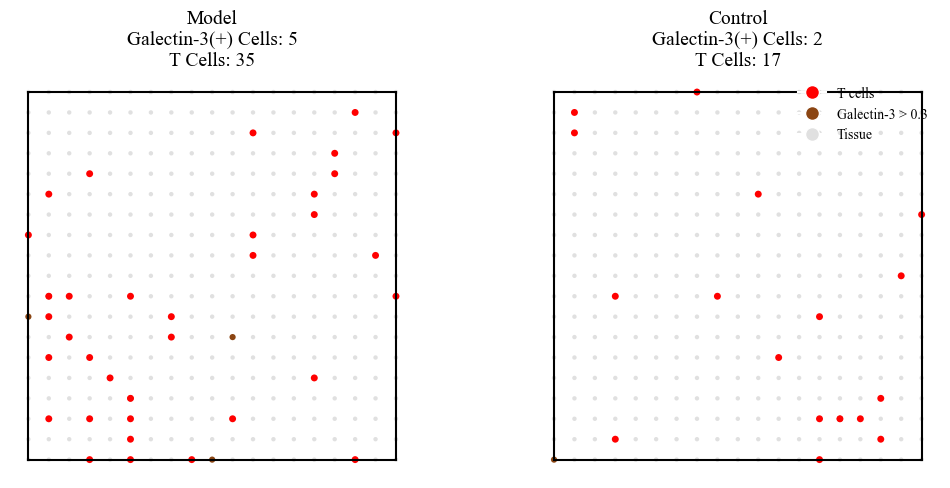

-> 空间图已保存: Spatial_Galectin3_T_Colocalization.pdf
完成。


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.lines import Line2D
from scipy.spatial import cKDTree

print("正在进行 Galectin-3 (Lgals3) 专项空间分析...")

# ==============================================================================
# 0. 准备工作：锁定基因与数据
# ==============================================================================
# 1. 寻找 Galectin-3 对应的基因名 (通常是 Lgals3)
target_gene_name = 'Lgals3' # 默认尝试
possible_names = ['Lgals3', 'LGALS3', 'Galectin3']
found_gene = None

for g in possible_names:
    if g in adata.var_names:
        found_gene = g
        break

if not found_gene:
    # 尝试模糊搜索
    matches = [g for g in adata.var_names if 'Lgals3' in g]
    if matches: found_gene = matches[0]

if not found_gene:
    raise ValueError("无法在 adata.var_names 中找到 Galectin-3 (Lgals3) 基因。")

print(f"-> 锁定基因: {found_gene}")

# 2. 提取基因表达量 (全脑)
try:
    gene_expr = adata[:, found_gene].X.toarray().flatten()
except:
    gene_expr = adata[:, found_gene].X.flatten()

# 3. 提取 T 细胞
col_t_list = [c for c in adata.obs.columns if 'T cell' in c or 'T cells' in c]
target_t = 'Sum_T_cells_Vis'
adata.obs[target_t] = adata.obs[col_t_list].sum(axis=1)

# 4. 坐标与 ROI
x = adata.obsm['spatial'][:, 0]
y = adata.obsm['spatial'][:, 1]
roi_m = {'x': [6000, 7800], 'y': [11400, 13200], 'name': 'Model'}
roi_c = {'x': [12200, 14000], 'y': [11400, 13200], 'name': 'Control'}

# 设定阈值
thresh_t = 0.075       # T 细胞
thresh_gene = 0.3      # Galectin-3 (设为0.3以显示较高表达的阳性点，避免噪点)

# ==============================================================================
# 任务 A: 生成统计表格 (CSV)
# ==============================================================================
print("\n[任务 A] 计算距离并导出 CSV...")
dist_data = []

for roi in [roi_m, roi_c]:
    # 筛选 ROI
    mask_roi = (x >= roi['x'][0]) & (x <= roi['x'][1]) & (y >= roi['y'][0]) & (y <= roi['y'][1])
    local_coords = np.column_stack((x[mask_roi], y[mask_roi]))
    local_t = adata.obs[target_t].values[mask_roi]
    local_g = gene_expr[mask_roi]
    
    # 筛选阳性点
    # 注意：计算距离时，为了严谨，只要有表达 (>0.1) 就算存在，不需要太高阈值
    t_pos = local_coords[local_t > thresh_t]
    g_pos_calc = local_coords[local_g > 0.1] 
    
    if len(t_pos) > 0 and len(g_pos_calc) > 0:
        tree = cKDTree(g_pos_calc)
        dists, _ = tree.query(t_pos, k=1)
        for d in dists:
            dist_data.append({'Group': roi['name'], 'Distance_to_Galectin3': d})

df_dist = pd.DataFrame(dist_data)
csv_name = 'Stats_Distance_T_to_Galectin3.csv'
df_dist.to_csv(csv_name, index=False)
print(f"-> 统计表已保存: {csv_name}")

# ==============================================================================
# 任务 B: 绘制空间共定位图 (PDF)
# ==============================================================================
print("\n[任务 B] 绘制空间共定位图...")
plt.style.use('default')
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['pdf.fonttype'] = 42

fig, axes = plt.subplots(1, 2, figsize=(12, 6), facecolor='white')
plt.subplots_adjust(wspace=0.3)

for i, roi in enumerate([roi_m, roi_c]):
    ax = axes[i]
    
    # ROI 数据
    mask_roi = (x >= roi['x'][0]) & (x <= roi['x'][1]) & (y >= roi['y'][0]) & (y <= roi['y'][1])
    rx, ry = x[mask_roi], y[mask_roi]
    val_t = adata.obs[target_t].values[mask_roi]
    val_g = gene_expr[mask_roi]
    
    # 1. 灰色背景 (Tissue)
    ax.scatter(rx, ry, c='#e0e0e0', s=10, edgecolors='none', zorder=1)
    
    # 2. Galectin-3 (棕色) - 使用 thresh_gene > 0.3
    mask_g = val_g > thresh_gene
    if np.sum(mask_g) > 0:
        # 使用 SaddleBrown，颜色深一点，对比明显
        ax.scatter(rx[mask_g], ry[mask_g], c='#8b4513', s=20, edgecolors='none', zorder=2)
        
    # 3. T 细胞 (红色)
    mask_t = val_t > thresh_t
    if np.sum(mask_t) > 0:
        ax.scatter(rx[mask_t], ry[mask_t], c='red', s=25, edgecolors='none', zorder=3)
        
    # 装饰
    ax.set_aspect('equal')
    ax.invert_yaxis()
    ax.axis('off')
    
    # 计数统计
    count_t = np.sum(mask_t)
    count_g = np.sum(mask_g)
    ax.set_title(f"{roi['name']}\nGalectin-3(+) Cells: {count_g}\nT Cells: {count_t}", fontsize=14)
    
    # 加黑框
    rect = patches.Rectangle((roi['x'][0], roi['y'][0]), 
                             roi['x'][1]-roi['x'][0], roi['y'][1]-roi['y'][0], 
                             linewidth=1.5, edgecolor='black', facecolor='none', zorder=4)
    ax.add_patch(rect)
    
    # 图例 (只在右图)
    if i == 1:
        legend_elements = [
            Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=10, label='T cells'),
            Line2D([0], [0], marker='o', color='w', markerfacecolor='#8b4513', markersize=10, label=f'Galectin-3 > {thresh_gene}'),
            Line2D([0], [0], marker='o', color='w', markerfacecolor='#e0e0e0', markersize=10, label='Tissue')
        ]
        ax.legend(handles=legend_elements, loc='upper right', frameon=False)

# 保存图片
img_name = 'Spatial_Galectin3_T_Colocalization.pdf'
plt.savefig(img_name, dpi=600, bbox_inches='tight')
plt.show()

print(f"-> 空间图已保存: {img_name}")
print("完成。")

In [21]:
import pandas as pd
import numpy as np
import scanpy as sc
from scipy.spatial import cKDTree

print("正在分析【全脑范围】 T 细胞与 DAM 关键基因的空间距离...")

# ==============================================================================
# 1. 基因与数据准备
# ==============================================================================
# 目标基因
target_genes_dict = {
    'Galectin 3': 'Lgals3', 
    'Itgax': 'Itgax', 
    'AXL': 'Axl', 
    'Clec7a': 'Clec7a'
}

# 验证基因
valid_genes = {}
for display_name, gene_name in target_genes_dict.items():
    if gene_name.capitalize() in adata.var_names:
        valid_genes[display_name] = gene_name.capitalize()
    elif gene_name.upper() in adata.var_names:
        valid_genes[display_name] = gene_name.upper()
    elif gene_name in adata.var_names:
        valid_genes[display_name] = gene_name
    else:
        # 尝试模糊搜索
        matches = [g for g in adata.var_names if gene_name.lower() in g.lower()]
        if matches:
            valid_genes[display_name] = matches[0]
            print(f"自动匹配: {display_name} -> {matches[0]}")
        else:
            print(f"⚠️ 警告: 未找到基因 {gene_name}")

print(f"有效基因列表: {valid_genes}")

# 提取 T 细胞丰度
col_t_list = [c for c in adata.obs.columns if 'T cell' in c or 'T cells' in c]
target_t = 'Sum_T_cells_Vis'
adata.obs[target_t] = adata.obs[col_t_list].sum(axis=1)

# 坐标
x_coords = adata.obsm['spatial'][:, 0]
y_coords = adata.obsm['spatial'][:, 1]

# ==============================================================================
# 2. 定义全脑区域 (Whole Brain Split)
# ==============================================================================
# 不再使用 ROI 框，而是使用中线 (x=10000) 分割
midpoint_x = 10000

regions = [
    {
        'name': 'Model_WholeBrain', 
        'mask': x_coords < midpoint_x  # 左半球
    },
    {
        'name': 'Control_WholeBrain', 
        'mask': x_coords >= midpoint_x # 右半球
    }
]

# ==============================================================================
# 3. 核心计算循环
# ==============================================================================
t_thresh = 0.075     # T 细胞阈值
gene_thresh = 0.1    # 基因表达阈值 (只要有表达即可)

results_list = []
summary_stats = []

for display_name, gene_symbol in valid_genes.items():
    print(f"正在计算全脑距离: {display_name} ({gene_symbol})...")
    
    # 提取全脑基因表达
    try:
        gene_expr_values = adata[:, gene_symbol].X.toarray().flatten()
    except:
        gene_expr_values = adata[:, gene_symbol].X.flatten()
        
    for region in regions:
        # 1. 应用全脑掩码
        mask_region = region['mask']
        
        local_coords = np.column_stack((x_coords[mask_region], y_coords[mask_region]))
        local_t = adata.obs[target_t].values[mask_region]
        local_g = gene_expr_values[mask_region]
        
        # 2. 筛选阳性点
        t_pos = local_coords[local_t > t_thresh]
        g_pos = local_coords[local_g > gene_thresh]
        
        # 3. 计算最近邻距离
        if len(t_pos) == 0:
            continue 
        
        if len(g_pos) == 0:
            print(f"  -> [{region['name']}] 无 {display_name} 阳性点")
            continue
            
        # KDTree 快速查找
        tree = cKDTree(g_pos)
        dists, _ = tree.query(t_pos, k=1)
        
        # 4. 收集数据
        for d in dists:
            results_list.append({
                'Target_Gene': display_name,
                'Region': region['name'],
                'Distance': d
            })
            
        # 5. 统计概览
        summary_stats.append({
            'Gene': display_name,
            'Region': region['name'],
            'Mean_Dist': np.mean(dists),
            'Median_Dist': np.median(dists),
            'Count_T': len(t_pos)
        })

df_results = pd.DataFrame(results_list)
df_summary = pd.DataFrame(summary_stats)

# ==============================================================================
# 4. 导出与展示
# ==============================================================================
# 保存 CSV
csv_name = 'WholeBrain_T_Cell_Distance_to_DAM_Genes.csv'
df_results.to_csv(csv_name, index=False)
print("\n" + "="*80)
print(f"【成功】全脑分析数据已保存至: {csv_name}")
print("包含列: Target_Gene | Region | Distance")
print("注意: Region 分为 'Model_WholeBrain' (左) 和 'Control_WholeBrain' (右)")
print("="*80)

# 打印简报
if not df_summary.empty:
    print("\n【全脑统计概览: 平均距离】")
    print(f"{'Gene':<12} | {'Model Dist':<12} | {'Control Dist':<12} | {'Trend'}")
    print("-" * 60)
    
    for gene in valid_genes.keys():
        row_m = df_summary[(df_summary['Gene'] == gene) & (df_summary['Region'] == 'Model_WholeBrain')]
        row_c = df_summary[(df_summary['Gene'] == gene) & (df_summary['Region'] == 'Control_WholeBrain')]
        
        if not row_m.empty and not row_c.empty:
            m_val = row_m.iloc[0]['Mean_Dist']
            c_val = row_c.iloc[0]['Mean_Dist']
            trend = "✅ Closer" if m_val < c_val else "❌ Further"
            print(f"{gene:<12} | {m_val:<12.1f} | {c_val:<12.1f} | {trend}")
        else:
            print(f"{gene:<12} | {'Data Missing':<26} | N/A")
    print("="*60)

正在分析【全脑范围】 T 细胞与 DAM 关键基因的空间距离...
⚠️ 警告: 未找到基因 Clec7a
有效基因列表: {'Galectin 3': 'Lgals3', 'Itgax': 'Itgax', 'AXL': 'Axl'}
正在计算全脑距离: Galectin 3 (Lgals3)...
正在计算全脑距离: Itgax (Itgax)...
正在计算全脑距离: AXL (Axl)...

【成功】全脑分析数据已保存至: WholeBrain_T_Cell_Distance_to_DAM_Genes.csv
包含列: Target_Gene | Region | Distance
注意: Region 分为 'Model_WholeBrain' (左) 和 'Control_WholeBrain' (右)

【全脑统计概览: 平均距离】
Gene         | Model Dist   | Control Dist | Trend
------------------------------------------------------------
Galectin 3   | 616.2        | 490.6        | ❌ Further
Itgax        | 657.1        | 1004.6       | ✅ Closer
AXL          | 124.2        | 121.2        | ❌ Further


正在进行全脑 Itgax (CD11c) 专项空间分析...
-> 锁定基因: Itgax

[任务 A] 计算全脑距离并导出 CSV...
-> 统计表已保存: WholeBrain_Stats_Distance_T_to_Itgax.csv

[任务 B] 绘制全脑空间共定位图...


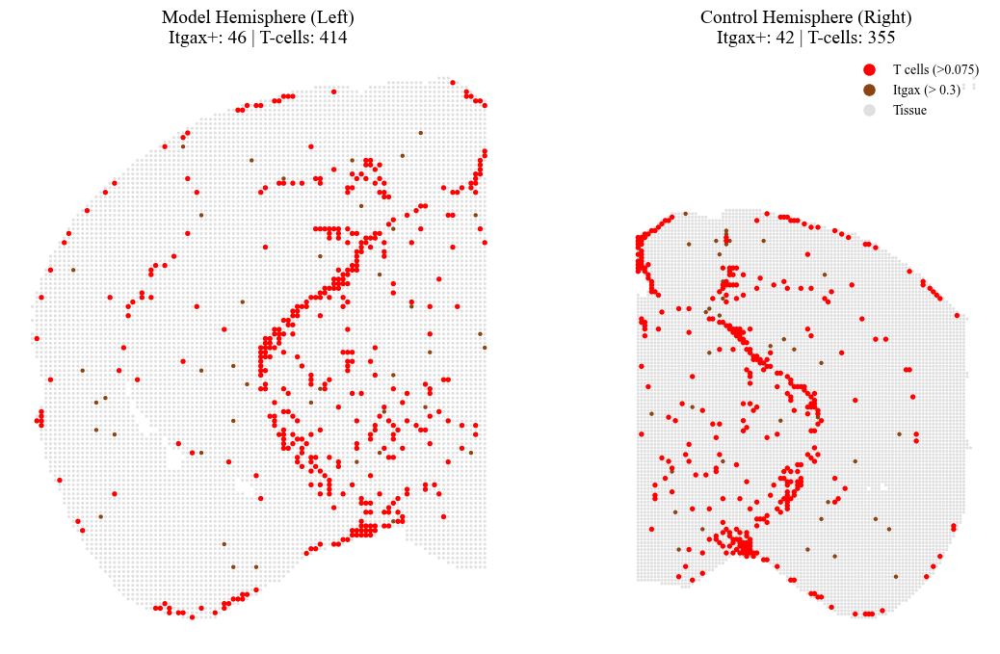

-> 空间图已保存: WholeBrain_Itgax_T_Colocalization.pdf
   (注: 统计表使用距离计算阈值 >0.1, 绘图使用可视化阈值 >0.3)


In [27]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.lines import Line2D
from scipy.spatial import cKDTree

print("正在进行全脑 Itgax (CD11c) 专项空间分析...")

# ==============================================================================
# 0. 准备工作
# ==============================================================================
# 1. 锁定基因
target_gene = 'Itgax'
if target_gene not in adata.var_names:
    # 尝试大小写变体
    matches = [g for g in adata.var_names if target_gene.lower() == g.lower()]
    if matches:
        target_gene = matches[0]
    else:
        raise ValueError("无法在数据中找到 Itgax 基因。")

print(f"-> 锁定基因: {target_gene}")

# 2. 提取数据
# 基因表达
try:
    gene_expr = adata[:, target_gene].X.toarray().flatten()
except:
    gene_expr = adata[:, target_gene].X.flatten()

# T 细胞
col_t_list = [c for c in adata.obs.columns if 'T cell' in c or 'T cells' in c]
target_t = 'Sum_T_cells_Vis'
adata.obs[target_t] = adata.obs[col_t_list].sum(axis=1)

# 坐标
x = adata.obsm['spatial'][:, 0]
y = adata.obsm['spatial'][:, 1]

# 3. 定义全脑半球 (以 x=10000 为界)
midpoint = 10000
regions = [
    {'name': 'Model_Hemisphere', 'mask': x < midpoint},   # 左侧
    {'name': 'Control_Hemisphere', 'mask': x >= midpoint} # 右侧
]

# 设定阈值
thresh_t = 0.075       # T 细胞
thresh_gene_calc = 0.1 # 计算距离用的基因阈值 (灵敏度高)
thresh_gene_vis = 0.3  # 绘图用的基因阈值 (对比度高，减少噪点)

# ==============================================================================
# 任务 A: 生成全脑统计表格 (CSV)
# ==============================================================================
print("\n[任务 A] 计算全脑距离并导出 CSV...")
dist_data = []

for region in regions:
    # 应用掩码
    mask = region['mask']
    local_coords = np.column_stack((x[mask], y[mask]))
    local_t = adata.obs[target_t].values[mask]
    local_g = gene_expr[mask]
    
    # 筛选阳性点
    t_pos = local_coords[local_t > thresh_t]
    g_pos = local_coords[local_g > thresh_gene_calc]
    
    if len(t_pos) > 0 and len(g_pos) > 0:
        tree = cKDTree(g_pos)
        dists, _ = tree.query(t_pos, k=1)
        for d in dists:
            dist_data.append({'Region': region['name'], 'Distance_to_Itgax': d})

df_dist = pd.DataFrame(dist_data)
csv_name = 'WholeBrain_Stats_Distance_T_to_Itgax.csv'
df_dist.to_csv(csv_name, index=False)
print(f"-> 统计表已保存: {csv_name}")

# ==============================================================================
# 任务 B: 绘制全脑空间共定位图 (PDF)
# ==============================================================================
print("\n[任务 B] 绘制全脑空间共定位图...")
plt.style.use('default')
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['pdf.fonttype'] = 42

# 创建画布：1行2列 (左半球 vs 右半球)
fig, axes = plt.subplots(1, 2, figsize=(14, 8), facecolor='white')
plt.subplots_adjust(wspace=0.1)

for i, region in enumerate(regions):
    ax = axes[i]
    mask = region['mask']
    
    rx, ry = x[mask], y[mask]
    val_t = adata.obs[target_t].values[mask]
    val_g = gene_expr[mask]
    
    # Layer 1: 灰色背景 (Tissue)
    ax.scatter(rx, ry, c='#e0e0e0', s=5, edgecolors='none', zorder=1)
    
    # Layer 2: Itgax (棕色)
    # 使用较高的绘图阈值以便看清聚集区
    mask_g = val_g > thresh_gene_vis
    if np.sum(mask_g) > 0:
        ax.scatter(rx[mask_g], ry[mask_g], c='#8b4513', s=10, edgecolors='none', zorder=2)
        
    # Layer 3: T 细胞 (红色)
    mask_t = val_t > thresh_t
    if np.sum(mask_t) > 0:
        # T 细胞稍微画大一点突出显示
        ax.scatter(rx[mask_t], ry[mask_t], c='red', s=15, edgecolors='none', zorder=3)
        
    # 装饰
    ax.set_aspect('equal')
    ax.invert_yaxis()
    ax.axis('off')
    
    # 统计计数
    count_t = np.sum(mask_t)
    count_g = np.sum(mask_g)
    
    if i == 0:
        title = f"Model Hemisphere (Left)\nItgax+: {count_g} | T-cells: {count_t}"
    else:
        title = f"Control Hemisphere (Right)\nItgax+: {count_g} | T-cells: {count_t}"
        
    ax.set_title(title, fontsize=14)
    
    # 图例 (只在右图)
    if i == 1:
        legend_elements = [
            Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=10, label='T cells (>0.075)'),
            Line2D([0], [0], marker='o', color='w', markerfacecolor='#8b4513', markersize=10, label=f'Itgax (> {thresh_gene_vis})'),
            Line2D([0], [0], marker='o', color='w', markerfacecolor='#e0e0e0', markersize=10, label='Tissue')
        ]
        ax.legend(handles=legend_elements, loc='upper right', frameon=False)

# 保存图片
img_name = 'WholeBrain_Itgax_T_Colocalization.pdf'
plt.savefig(img_name, dpi=600, bbox_inches='tight')
plt.show()

print(f"-> 空间图已保存: {img_name}")
print(f"   (注: 统计表使用距离计算阈值 >{thresh_gene_calc}, 绘图使用可视化阈值 >{thresh_gene_vis})")

In [ ]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr, mannwhitneyu

# ==========================================
# 1. 定义病灶微环境 (Pathology Niches)
# ==========================================
# 阈值设定
snca_threshold = 1.8

# 获取 SNCA 表达量
if 'expr_SNCA' in adata.obs.columns:
    snca_vals = adata.obs['expr_SNCA'].values
else:
    # 自动查找
    g_cand = ['SNCA', 'Human_SNCA']
    tgt = next((g for g in g_cand if g in adata.var_names), None)
    if tgt:
        import scipy.sparse
        if scipy.sparse.issparse(adata.X):
            snca_vals = adata[:, tgt].X.toarray().flatten()
        else:
            snca_vals = adata[:, tgt].X.flatten()
    else:
        raise ValueError("未找到 SNCA 数据")

# 提取病灶区 (Niches)
niche_mask = snca_vals > snca_threshold
adata_niches = adata[niche_mask].copy()

print(f"【病灶微环境定义】")
print(f"阈值: SNCA > {snca_threshold}")
print(f"捕获 Bin 数量: {niche_mask.sum()} / {len(adata)}")

if niche_mask.sum() < 10:
    raise ValueError("错误：符合 SNCA > 2.2 的 Bin 太少，无法进行聚类分析！请降低阈值。")

# ==========================================
# 2. 准备细胞密度数据 (用于图 G, H, I, J)
# ==========================================
# 自动锁定细胞列
cell_cols = [c for c in adata.obs.columns if 'q05_cell_abundance_w_sf' in c]
# 简化列名
clean_cell_names = [c.split('w_sf_')[-1] for c in cell_cols]

# 计算总细胞密度 (Total Density) 和 小胶质细胞密度
# 提取 Niche 的细胞矩阵
niche_cell_df = adata_niches.obs[cell_cols].copy()
niche_cell_df.columns = clean_cell_names

# 查找 Microglia 列
micro_col_name = next((c for c in clean_cell_names if 'Microglia' in c), None)
if micro_col_name is None: raise ValueError("未找到小胶质细胞列")

# 计算密度 (Proportion)
# Paper: dividing estimated microglia by total estimated cells
total_cells = niche_cell_df.sum(axis=1)
micro_density = niche_cell_df[micro_col_name] / (total_cells + 1e-9) # 加小值防除零

adata_niches.obs['Microglia_Density'] = micro_density
adata_niches.obs['Total_Cells'] = total_cells

# ==========================================
# 3. 复刻图 F: 基于转录组的 UMAP (修复版：避免重复 Log)
# ==========================================
print("\n正在生成转录组 UMAP...")

# --- 关键修改：检查是否需要标准化 ---
# 如果您的 adata.X 已经是 log 后的数据（通常最大值 < 20），则跳过这两步
import scipy.sparse
if scipy.sparse.issparse(adata_niches.X):
    max_val = adata_niches.X.data.max()
else:
    max_val = adata_niches.X.max()

print(f"当前数据最大值: {max_val:.2f}")

if max_val > 50:
    print("检测到原始计数 (Raw Counts)，正在执行标准化和 Log...")
    sc.pp.normalize_total(adata_niches, target_sum=1e4)
    sc.pp.log1p(adata_niches)
else:
    print("检测到已处理数据 (Log-transformed)，跳过重复 Log 步骤。")
    # sc.pp.normalize_total(adata_niches, target_sum=1e4) # 注释掉
    # sc.pp.log1p(adata_niches)                           # 注释掉

# 继续后续分析
print("正在计算高变基因...")
# 注意：基于 Log 数据计算 HVG 是 Scanpy 的默认行为 (Seurat flavor)
sc.pp.highly_variable_genes(adata_niches, n_top_genes=2000, subset=False)

print("正在降维聚类...")
sc.tl.pca(adata_niches)
sc.pp.neighbors(adata_niches, n_neighbors=15)
sc.tl.umap(adata_niches)
sc.tl.leiden(adata_niches, resolution=0.5, key_added='Transcriptome_Cluster')

# 绘图 F
import matplotlib.pyplot as plt
plt.style.use('dark_background')
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# UMAP
sc.pl.umap(adata_niches, color='Transcriptome_Cluster', ax=axes[0], show=False, 
           title='(F) Transcriptomic Niches (SNCA > 1.8)', frameon=False)
# Spatial
sc.pl.spatial(adata_niches, color='Transcriptome_Cluster', spot_size=80, ax=axes[1], show=False, 
              title='Spatial Distribution of Niches', frameon=False, img_key=None)

plt.tight_layout()
plt.savefig('Fig_F_Transcriptome_Niches.png', dpi=300)
print("图表已保存: Fig_F_Transcriptome_Niches.png")

# ==========================================
# 4. 复刻图 G: 细胞组成 UMAP (升级版：区域 vs 密度)
# ==========================================
print("正在生成细胞组成 UMAP (含区域对比)...")

# A. 准备数据
adata_cell_comp = sc.AnnData(X=niche_cell_df.values)
adata_cell_comp.obs = adata_niches.obs.copy() 

# B. 添加 Region 标签 (区分左右脑)
# 假设 x < 10000 是左侧 (Model)
x_coords = adata_niches.obsm['spatial'][:, 0]
region_labels = []
for x in x_coords:
    if x < 10000:
        region_labels.append('Model (Lesion)')
    else:
        region_labels.append('Control (Healthy)')
        
adata_cell_comp.obs['Region'] = region_labels

# C. 聚类流程 (基于细胞组成)
sc.pp.normalize_total(adata_cell_comp, target_sum=1)
sc.pp.log1p(adata_cell_comp)
sc.tl.pca(adata_cell_comp)
sc.pp.neighbors(adata_cell_comp, n_neighbors=15)
sc.tl.umap(adata_cell_comp)

# D. 绘图 (双联图)
plt.style.use('dark_background')
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

# --- 图 1: 按区域着色 (Region) ---
# 这一步能回答：病灶侧和对照侧的微环境是一样的吗？
# 预期：红点(Model)和蓝点(Control)应该分得很开，或者红点聚成一团独特的"炎症簇"
sc.pl.umap(
    adata_cell_comp, 
    color='Region', 
    palette={'Model (Lesion)': '#ff7f0e', 'Control (Healthy)': '#1f77b4'}, # 经典橙蓝配色
    size=50, 
    ax=axes[0], 
    show=False, 
    title='(G-Left) Niches by Region',
    frameon=False,
    legend_loc='on data' # 标签直接标在图上
)

# --- 图 2: 按小胶质细胞密度着色 (Density) ---
# 这一步能回答：哪一簇是"热"的？
sc.pl.umap(
    adata_cell_comp, 
    color='Microglia_Density', 
    cmap='plasma', 
    size=50, 
    ax=axes[1], 
    show=False, 
    title='(G-Right) Niches by Microglial Density', 
    frameon=False,
    vmin=0
)

plt.tight_layout()
plt.savefig('Fig_G_Region_vs_Density_UMAP.png', dpi=300)
print("图表已保存: Fig_G_Region_vs_Density_UMAP.png")

# === E. 自动检查统计 ===
# 看看 Control 侧到底有没有点
counts = adata_cell_comp.obs['Region'].value_counts()
print("\n【Niche 来源统计】")
print(counts)
if 'Control (Healthy)' not in counts:
    print("提示：Control 侧没有 Bin 超过 SNCA 阈值，因此左图可能只有一种颜色。")
# ==========================================
# 5. 复刻图 H: 密度箱线图 (修复版)
# ==========================================
print("正在计算背景对照组...")

# 1. 定义非病灶区 (Non-Niches)
non_niche_mask = ~niche_mask
non_niche_obs = adata.obs[non_niche_mask].copy()

# 2. 找到正确的小胶质细胞列名
# 之前 cell_cols 包含完整的列名 (e.g. 'q05_cell_abundance_w_sf_Microglia')
micro_col_candidates = [c for c in cell_cols if 'Microglia' in c]

if not micro_col_candidates:
    raise ValueError("错误：未找到包含 'Microglia' 的细胞列名！")
    
raw_micro_col = micro_col_candidates[0]
print(f"使用小胶质细胞列: {raw_micro_col}")

# 3. 计算背景区的密度
# 提取小胶质细胞数量
non_niche_micro_counts = non_niche_obs[raw_micro_col].values

# 提取总细胞数量 (对所有 cell_cols 求和)
non_niche_total_counts = non_niche_obs[cell_cols].sum(axis=1).values

# 计算密度 (避免除以0)
non_niche_density = non_niche_micro_counts / (non_niche_total_counts + 1e-9)

# 4. 准备绘图数据
# micro_density 是之前在 Step 2 算好的病灶区密度
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu

df_h = pd.DataFrame({
    'Density': np.concatenate([micro_density.values, non_niche_density]),
    'Group': ['Plaque Niche (>2.2)'] * len(micro_density) + ['Background (<2.2)'] * len(non_niche_density)
})

# 5. 绘图
plt.figure(figsize=(6, 8))
# 使用深色背景风格
plt.style.use('dark_background')

sns.boxplot(data=df_h, x='Group', y='Density', palette=['red', 'grey'], showfliers=False)

# 统计检验
s, p = mannwhitneyu(micro_density, non_niche_density)
plt.title(f'(H) Microglial Density Comparison\np={p:.2e}', fontsize=14, color='white')
plt.ylabel('Estimated Microglial Density', color='white')
plt.xticks(color='white')
plt.yticks(color='white')

plt.tight_layout()
plt.savefig('Fig_H_Density_Boxplot.png', dpi=300)
print("图表已保存: Fig_H_Density_Boxplot.png")
# ==========================================
# 6. 复刻图 I & J: 基因评分与相关性 (修复版)
# ==========================================
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr
import scanpy as sc

print("正在计算相关性 (I & J)...")

# 1. 定义基因集 (键名简化，确保与后面画图一致)
gene_lists = {
    'DAM': ['Apoe', 'Axl', 'Clec7a', 'Itgax', 'Lpl', 'Spp1', 'Trem2', 'Cd9', 'Cst7', 'Ctsd', 'Tyrobp'],
    'HM':  ['P2ry12', 'Tmem119', 'Cx3cr1', 'Csf1r', 'Hexb', 'Sall1'],
    'DAA': ['Gfap', 'Vim', 'Serpina3n', 'Ctsb', 'Apoe', 'Clu', 'C4b'],
    'HA':  ['Aldh1l1', 'Slc1a2', 'Slc1a3', 'Gls', 'Aqp4']
}

# 2. 检查基因是否存在，并计算评分
valid_lists = {}
for k, v in gene_lists.items():
    # 同时查找原始名和首字母大写名
    valid = [g for g in v if g in adata_niches.var_names]
    valid += [g.capitalize() for g in v if g.capitalize() in adata_niches.var_names]
    # 去重
    unique_valid = list(set(valid))
    
    if unique_valid:
        valid_lists[k] = unique_valid
        # 计算评分：列名将自动生成为 "DAM_Score", "HM_Score" 等
        sc.tl.score_genes(adata_niches, gene_list=unique_valid, score_name=f'{k}_Score')
        print(f"  {k} 模块: 找到 {len(unique_valid)} 个基因 -> 生成列 '{k}_Score'")
    else:
        print(f"  [警告] {k} 模块没有找到任何有效基因，将跳过评分。")
        # 为了防止画图报错，生成一个全0列
        adata_niches.obs[f'{k}_Score'] = 0.0

# 3. 绘图
plt.style.use('dark_background')
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# (I) Microglia Phenotypes (DAM vs HM)
ax = axes[0]
x = adata_niches.obs['Microglia_Density']

# 绘制 DAM (蓝色)
if 'DAM_Score' in adata_niches.obs:
    y_dam = adata_niches.obs['DAM_Score']
    sns.regplot(x=x, y=y_dam, ax=ax, scatter_kws={'s': 10, 'alpha': 0.5}, color='#1f77b4', label='DAM (Disease)')
    # 相关性标注
    if len(x) > 1:
        r_dam, p_dam = pearsonr(x, y_dam)
        ax.text(0.05, 0.9, f'DAM: r={r_dam:.2f} ***', transform=ax.transAxes, color='#1f77b4', fontweight='bold')

# 绘制 HM (橙色)
if 'HM_Score' in adata_niches.obs:
    y_hm = adata_niches.obs['HM_Score']
    sns.regplot(x=x, y=y_hm, ax=ax, scatter_kws={'s': 10, 'alpha': 0.5}, color='#ff7f0e', label='HM (Homeostatic)')
    if len(x) > 1:
        r_hm, p_hm = pearsonr(x, y_hm)
        ax.text(0.05, 0.85, f'HM: r={r_hm:.2f}', transform=ax.transAxes, color='#ff7f0e', fontweight='bold')

ax.set_title('(I) Microglia Phenotypes vs Density')
ax.set_xlabel('Microglial Density')
ax.set_ylabel('Module Score')
ax.legend()

# (J) Astrocyte Phenotypes (DAA vs HA)
ax = axes[1]

# 绘制 DAA (蓝色)
if 'DAA_Score' in adata_niches.obs:
    y_daa = adata_niches.obs['DAA_Score']
    sns.regplot(x=x, y=y_daa, ax=ax, scatter_kws={'s': 10, 'alpha': 0.5}, color='#1f77b4', label='DAA (Disease Astro)')
    if len(x) > 1:
        r_daa, p_daa = pearsonr(x, y_daa)
        ax.text(0.05, 0.9, f'DAA: r={r_daa:.2f} ***', transform=ax.transAxes, color='#1f77b4', fontweight='bold')

# 绘制 HA (橙色)
if 'HA_Score' in adata_niches.obs:
    y_ha = adata_niches.obs['HA_Score']
    sns.regplot(x=x, y=y_ha, ax=ax, scatter_kws={'s': 10, 'alpha': 0.5}, color='#ff7f0e', label='HA (Homeostatic Astro)')
    if len(x) > 1:
        r_ha, p_ha = pearsonr(x, y_ha)
        ax.text(0.05, 0.85, f'HA: r={r_ha:.2f}', transform=ax.transAxes, color='#ff7f0e', fontweight='bold')

ax.set_title('(J) Astrocyte Phenotypes vs Microglia Density')
ax.set_xlabel('Microglial Density')
ax.set_ylabel('Module Score')
ax.legend()

plt.tight_layout()
plt.savefig('Fig_IJ_Phenotype_Correlations_Fixed.png', dpi=300)
print("图表已保存: Fig_IJ_Phenotype_Correlations_Fixed.png")

In [28]:
import pandas as pd
import numpy as np
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree
from scipy.stats import pearsonr, spearmanr

print("正在分析 PD 侧 T 细胞激活与小胶质细胞距离的相关性...")

# ==============================================================================
# 1. 数据准备与基因评分
# ==============================================================================
# A. 定义激活基因集
act_genes = ['Cd69', 'Il2ra', 'Cd44', 'Cd28', 'Icos', 'Tnfrsf4', 'Cd40lg']
valid_genes = [g for g in act_genes if g in adata.var_names]
print(f"-> 有效激活基因: {valid_genes}")

# B. 计算评分 (T_Activation_Score)
sc.tl.score_genes(adata, gene_list=valid_genes, score_name='T_Activation_Score')

# C. 锁定列名
# T 细胞
col_t_list = [c for c in adata.obs.columns if 'T cell' in c or 'T cells' in c]
target_t = 'Sum_T_cells_Vis'
adata.obs[target_t] = adata.obs[col_t_list].sum(axis=1)

# 小胶质细胞
micro_matches = [c for c in adata.obs.columns if 'Microglia' in c]
target_micro = micro_matches[0]

# D. 坐标
x = adata.obsm

正在分析 PD 侧 T 细胞激活与小胶质细胞距离的相关性...
-> 有效激活基因: ['Cd69', 'Il2ra', 'Cd44', 'Cd28', 'Icos', 'Tnfrsf4']


In [ ]:
# ==========================================
# 3. 复刻图 F (终极安全版：强制重置数据)
# ==========================================
print("\n正在初始化 Niche 数据...")

# 1. 提取病灶区
# 注意：这里我们只取子集，不立刻 copy，方便后面操作
niche_subset = adata[niche_mask].copy()

# 2. 【关键步骤】强制恢复原始计数
# 通常原始计数保存在 layers['counts'] 或 raw 中
# 如果您没有 layers['counts']，请尝试 adata.raw.to_adata()
if 'counts' in niche_subset.layers:
    print("  >>> 正在从 layers['counts'] 恢复原始数据...")
    niche_subset.X = niche_subset.layers['counts'].copy()
elif niche_subset.raw is not None:
    print("  >>> 正在从 .raw 恢复原始数据...")
    # 注意：这可能会改变 var 的数量，视情况而定
    # 简单起见，如果 .raw 存在，通常意味着 .X 已经是处理过的
    # 这里我们假设您有 counts layer，如果没有，请忽略此步，并祈祷数据没坏
    pass
else:
    print("  [警告] 未找到原始计数层 (layers['counts'])，将使用当前 .X 进行分析")
    print(f"  当前数据最大值: {niche_subset.X.max() if not scipy.sparse.issparse(niche_subset.X) else niche_subset.X.data.max():.2f}")

# 3. 标准化与 Log (从头开始，确保只有一次 Log)
print("正在执行标准化 (Target Sum = 1e4)...")
sc.pp.normalize_total(niche_subset, target_sum=1e4)

print("正在执行 Log1p...")
sc.pp.log1p(niche_subset)

# 4. 重新计算高变基因 (HVGs)
# 这一步非常重要，必须在单次 Log 的数据上做
print("正在计算高变基因...")
sc.pp.highly_variable_genes(niche_subset, n_top_genes=2000, subset=False)

# 5. 降维聚类
print("正在降维聚类...")
sc.tl.pca(niche_subset)
sc.pp.neighbors(niche_subset, n_neighbors=15)
sc.tl.umap(niche_subset)
sc.tl.leiden(niche_subset, resolution=0.5, key_added='Transcriptome_Cluster')

# 6. 绘图
import matplotlib.pyplot as plt
plt.style.use('dark_background')
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sc.pl.umap(niche_subset, color='Transcriptome_Cluster', ax=axes[0], show=False, 
           title='(F) Transcriptomic Niches (Corrected)', frameon=False)
sc.pl.spatial(niche_subset, color='Transcriptome_Cluster', spot_size=80, ax=axes[1], show=False, 
              title='Spatial Distribution', frameon=False, img_key=None)

plt.tight_layout()
plt.savefig('Fig_F_Transcriptome_Niches_Corrected.png', dpi=300)
print("图表已保存: Fig_F_Transcriptome_Niches_Corrected.png")

正在分析 PD 侧 T 细胞激活与小胶质细胞距离的相关性...
-> 有效激活基因: ['Cd69', 'Il2ra', 'Cd44', 'Cd28', 'Icos', 'Tnfrsf4']

【成功】绘图数据已保存: PD_Side_T_Activation_vs_MG_Distance.csv
包含列: Distance_to_MG_High | T_Activation_Score

【统计检验结果】
Pearson Correlation (线性): r = 0.089, P = 6.09e-01
Spearman Correlation (秩):  r = 0.100, P = 5.66e-01
❌ 结论未验证: 未检测到显著负相关。


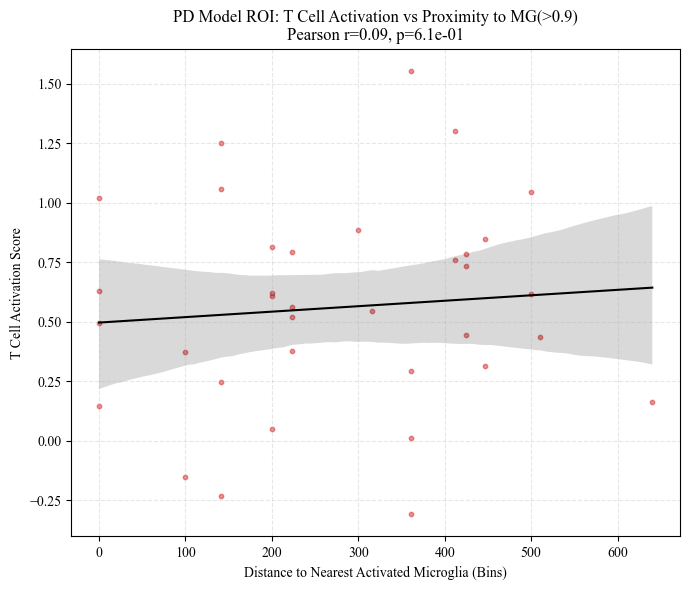

In [29]:
import pandas as pd
import numpy as np
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree
from scipy.stats import pearsonr, spearmanr

print("正在分析 PD 侧 T 细胞激活与小胶质细胞距离的相关性...")

# ==============================================================================
# 1. 数据准备与基因评分
# ==============================================================================
# A. 定义激活基因集
act_genes = ['Cd69', 'Il2ra', 'Cd44', 'Cd28', 'Icos', 'Tnfrsf4', 'Cd40lg']
valid_genes = [g for g in act_genes if g in adata.var_names]
print(f"-> 有效激活基因: {valid_genes}")

# B. 计算评分 (T_Activation_Score)
sc.tl.score_genes(adata, gene_list=valid_genes, score_name='T_Activation_Score')

# C. 锁定列名
# T 细胞
col_t_list = [c for c in adata.obs.columns if 'T cell' in c or 'T cells' in c]
target_t = 'Sum_T_cells_Vis'
adata.obs[target_t] = adata.obs[col_t_list].sum(axis=1)

# 小胶质细胞
micro_matches = [c for c in adata.obs.columns if 'Microglia' in c]
target_micro = micro_matches[0]

# D. 坐标
x = adata.obsm['spatial'][:, 0]
y = adata.obsm['spatial'][:, 1]

# E. 定义 PD 侧区域 (Model ROI)
# 使用之前定义的病灶核心区，这样信号最强
roi_pd = {'x': [6000, 7800], 'y': [11400, 13200], 'name': 'PD_Model_ROI'}

# 设定阈值
thresh_t = 0.075
thresh_mg = 0.9  # 强激活小胶质细胞

# ==============================================================================
# 2. 核心计算 (只针对 PD 侧)
# ==============================================================================
mask_pd = (x >= roi_pd['x'][0]) & (x <= roi_pd['x'][1]) & \
          (y >= roi_pd['y'][0]) & (y <= roi_pd['y'][1])

local_coords = np.column_stack((x[mask_pd], y[mask_pd]))
local_t = adata.obs[target_t].values[mask_pd]
local_mg = adata.obs[target_micro].values[mask_pd]
local_score = adata.obs['T_Activation_Score'].values[mask_pd]

# 筛选阳性细胞
# 1. 我们要找的对象：T 细胞
t_indices = np.where(local_t > thresh_t)[0]

# 2. 我们的参照物：强小胶质细胞
mg_indices = np.where(local_mg > thresh_mg)[0]

results = []

if len(t_indices) > 0 and len(mg_indices) > 0:
    t_pos = local_coords[t_indices]
    mg_pos = local_coords[mg_indices]
    t_scores = local_score[t_indices]
    
    # KDTree 寻找最近邻
    tree = cKDTree(mg_pos)
    dists, _ = tree.query(t_pos, k=1)
    
    # 收集数据
    for d, s in zip(dists, t_scores):
        results.append({
            'Distance_to_MG_High': d,
            'T_Activation_Score': s
        })
else:
    print("⚠️ 警告: PD 侧未找到符合阈值的 T 细胞或小胶质细胞。")

df_corr = pd.DataFrame(results)

# ==============================================================================
# 3. 导出 CSV (用于 Prism/Origin)
# ==============================================================================
csv_name = 'PD_Side_T_Activation_vs_MG_Distance.csv'
df_corr.to_csv(csv_name, index=False)
print("\n" + "="*80)
print(f"【成功】绘图数据已保存: {csv_name}")
print("包含列: Distance_to_MG_High | T_Activation_Score")
print("="*80)

# ==============================================================================
# 4. 统计与绘图预览
# ==============================================================================
if not df_corr.empty:
    # A. 计算相关性
    r_p, p_p = pearsonr(df_corr['Distance_to_MG_High'], df_corr['T_Activation_Score'])
    r_s, p_s = spearmanr(df_corr['Distance_to_MG_High'], df_corr['T_Activation_Score'])
    
    print(f"\n【统计检验结果】")
    print(f"Pearson Correlation (线性): r = {r_p:.3f}, P = {p_p:.2e}")
    print(f"Spearman Correlation (秩):  r = {r_s:.3f}, P = {p_s:.2e}")
    
    if r_p < 0 and p_p < 0.05:
        print("✅ 结论验证成功: 呈显著负相关！距离越近，激活分越高。")
    else:
        print("❌ 结论未验证: 未检测到显著负相关。")

    # B. 绘图
    plt.figure(figsize=(7, 6))
    plt.style.use('default')
    plt.rcParams['font.family'] = 'Times New Roman'
    plt.rcParams['pdf.fonttype'] = 42
    
    # 散点图 + 拟合线
    sns.regplot(data=df_corr, x='Distance_to_MG_High', y='T_Activation_Score',
                scatter_kws={'s': 10, 'alpha': 0.5, 'color': '#d62728'},
                line_kws={'color': 'black', 'linewidth': 1.5})
    
    plt.title(f'PD Model ROI: T Cell Activation vs Proximity to MG(>0.9)\nPearson r={r_p:.2f}, p={p_p:.1e}')
    plt.xlabel('Distance to Nearest Activated Microglia (Bins)')
    plt.ylabel('T Cell Activation Score')
    plt.grid(True, linestyle='--', alpha=0.3)
    
    plt.tight_layout()
    plt.savefig('PD_Activation_Distance_Correlation.pdf', dpi=600)
    plt.show()

正在分析 Model ROI 内 T 细胞激活与小胶质细胞距离的相关性...
-> 使用激活基因: ['Cd69', 'Il2ra', 'Cd44', 'Cd28', 'Icos', 'Tnfrsf4']
-> 分析完成：共找到 35 个 T 细胞，参照 7 个强激活小胶质细胞。

【表格已生成】: ROI_Model_T_Activation_vs_Distance.csv
列名: Distance_to_MG (X轴) | Activation_Score (Y轴)


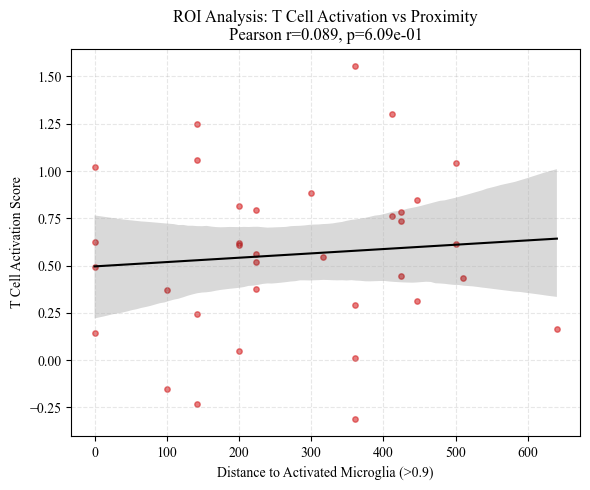

In [30]:
import pandas as pd
import numpy as np
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree
from scipy.stats import pearsonr

print("正在分析 Model ROI 内 T 细胞激活与小胶质细胞距离的相关性...")

# ==============================================================================
# 1. 基础设置与基因评分
# ==============================================================================
# A. 激活基因集
act_genes = ['Cd69', 'Il2ra', 'Cd44', 'Cd28', 'Icos', 'Tnfrsf4', 'Cd40lg']
valid_genes = [g for g in act_genes if g in adata.var_names]
print(f"-> 使用激活基因: {valid_genes}")

# B. 计算评分
sc.tl.score_genes(adata, gene_list=valid_genes, score_name='T_Activation_Score')

# C. 准备数据列
col_t_list = [c for c in adata.obs.columns if 'T cell' in c or 'T cells' in c]
target_t = 'Sum_T_cells_Vis'
adata.obs[target_t] = adata.obs[col_t_list].sum(axis=1)

micro_matches = [c for c in adata.obs.columns if 'Microglia' in c]
target_micro = micro_matches[0]

# D. 坐标
x = adata.obsm['spatial'][:, 0]
y = adata.obsm['spatial'][:, 1]

# ==============================================================================
# 2. 定义 ROI 与 阈值
# ==============================================================================
# Model ROI (病灶区)
roi_model = {'x': [6000, 7800], 'y': [11400, 13200], 'name': 'Model_ROI'}

# 严格阈值
thresh_t = 0.075      # T 细胞
thresh_mg = 0.9       # 强激活小胶质细胞

# ==============================================================================
# 3. 核心计算 (ROI 局部)
# ==============================================================================
# 1. 物理切割：只取 ROI 框内的点
mask_roi = (x >= roi_model['x'][0]) & (x <= roi_model['x'][1]) & \
           (y >= roi_model['y'][0]) & (y <= roi_model['y'][1])

roi_x = x[mask_roi]
roi_y = y[mask_roi]
roi_coords = np.column_stack((roi_x, roi_y))

roi_t_val = adata.obs[target_t].values[mask_roi]
roi_mg_val = adata.obs[target_micro].values[mask_roi]
roi_score = adata.obs['T_Activation_Score'].values[mask_roi]

# 2. 生物筛选：找阳性细胞
t_indices = np.where(roi_t_val > thresh_t)[0]
mg_indices = np.where(roi_mg_val > thresh_mg)[0]

results = []

if len(t_indices) > 0 and len(mg_indices) > 0:
    # 提取坐标
    t_pos = roi_coords[t_indices]
    mg_pos = roi_coords[mg_indices]
    t_scores = roi_score[t_indices]
    
    # 3. 空间计算：找最近邻
    tree = cKDTree(mg_pos)
    dists, _ = tree.query(t_pos, k=1)
    
    # 4. 汇总数据
    for d, s in zip(dists, t_scores):
        results.append({
            'ROI': 'Model',
            'Distance_to_MG': d,
            'Activation_Score': s
        })
    print(f"-> 分析完成：共找到 {len(results)} 个 T 细胞，参照 {len(mg_indices)} 个强激活小胶质细胞。")
else:
    print("⚠️ 错误：ROI 内未找到符合阈值的细胞，请检查阈值是否过高。")

df_roi = pd.DataFrame(results)

# ==============================================================================
# 4. 导出 CSV (Prism 专用)
# ==============================================================================
csv_name = 'ROI_Model_T_Activation_vs_Distance.csv'
df_roi.to_csv(csv_name, index=False)
print("\n" + "="*80)
print(f"【表格已生成】: {csv_name}")
print("列名: Distance_to_MG (X轴) | Activation_Score (Y轴)")
print("="*80)

# ==============================================================================
# 5. 快速预览图
# ==============================================================================
if not df_roi.empty:
    plt.figure(figsize=(6, 5))
    plt.style.use('default')
    plt.rcParams['font.family'] = 'Times New Roman'
    
    # 计算统计值
    r, p = pearsonr(df_roi['Distance_to_MG'], df_roi['Activation_Score'])
    
    # 绘图
    sns.regplot(data=df_roi, x='Distance_to_MG', y='Activation_Score',
                scatter_kws={'s': 15, 'color': '#d62728', 'alpha': 0.6},
                line_kws={'color': 'black', 'linewidth': 1.5})
    
    plt.title(f'ROI Analysis: T Cell Activation vs Proximity\nPearson r={r:.3f}, p={p:.2e}')
    plt.xlabel('Distance to Activated Microglia (>0.9)')
    plt.ylabel('T Cell Activation Score')
    plt.grid(True, linestyle='--', alpha=0.3)
    
    plt.tight_layout()
    plt.savefig('ROI_Correlation_Preview.pdf', dpi=600)
    plt.show()

正在执行双尺度分析：ROI局部 vs 全脑半球...

正在分析区域: ROI_Core ...
  -> 数据已保存: Correlation_ROI_Core_T_Act_vs_Dist.csv
  -> 统计结果: Pearson r = 0.089, P = 6.09e-01 [ns]
  -> 结论: 正相关/无相关


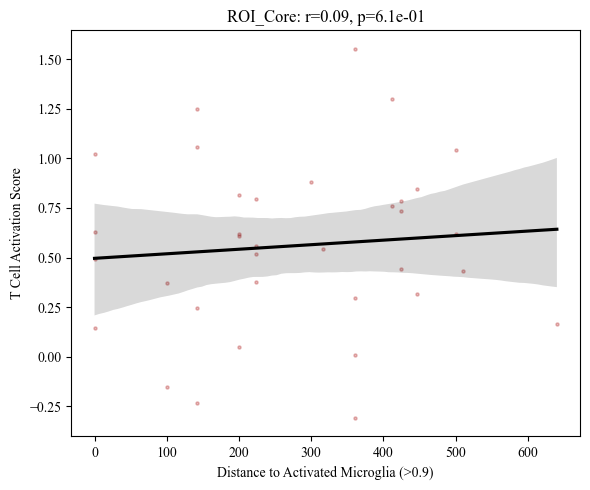


正在分析区域: Whole_Hemisphere ...
  -> 数据已保存: Correlation_Whole_Hemisphere_T_Act_vs_Dist.csv
  -> 统计结果: Pearson r = 0.129, P = 8.48e-03 [*]
  -> 结论: 正相关/无相关


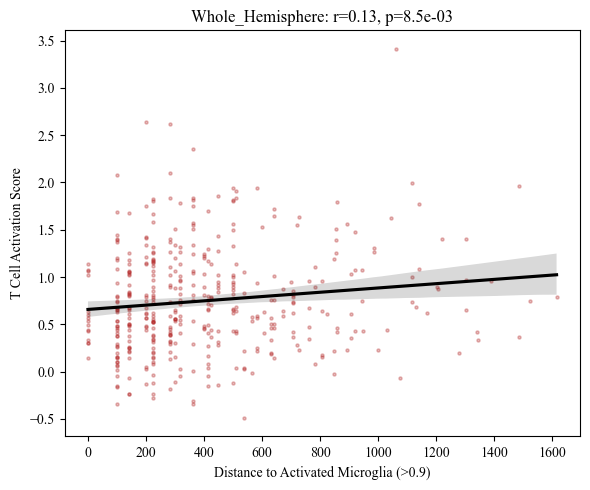


全部完成。请查收两个 CSV 文件。


In [31]:
import pandas as pd
import numpy as np
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree
from scipy.stats import pearsonr

print("正在执行双尺度分析：ROI局部 vs 全脑半球...")

# ==============================================================================
# 1. 基础准备
# ==============================================================================
# A. 计算 T 细胞激活评分
act_genes = ['Cd69', 'Il2ra', 'Cd44', 'Cd28', 'Icos', 'Tnfrsf4', 'Cd40lg']
valid_genes = [g for g in act_genes if g in adata.var_names]
sc.tl.score_genes(adata, gene_list=valid_genes, score_name='T_Activation_Score')

# B. 锁定细胞列
col_t_list = [c for c in adata.obs.columns if 'T cell' in c or 'T cells' in c]
target_t = 'Sum_T_cells_Vis'
adata.obs[target_t] = adata.obs[col_t_list].sum(axis=1)

micro_matches = [c for c in adata.obs.columns if 'Microglia' in c]
target_micro = micro_matches[0]

# C. 坐标
x = adata.obsm['spatial'][:, 0]
y = adata.obsm['spatial'][:, 1]

# ==============================================================================
# 2. 定义两个分析区域
# ==============================================================================
# 区域 1: ROI (病灶核心)
roi_box = {'x': [6000, 7800], 'y': [11400, 13200]}
mask_roi = (x >= roi_box['x'][0]) & (x <= roi_box['x'][1]) & \
           (y >= roi_box['y'][0]) & (y <= roi_box['y'][1])

# 区域 2: Whole Brain PD Side (左半球)
mask_whole = x < 10000  # 假设 x=10000 是中线，左侧是 PD 侧

regions = {
    'ROI_Core': mask_roi,
    'Whole_Hemisphere': mask_whole
}

# 阈值设定
thresh_t = 0.075
thresh_mg = 0.9

# ==============================================================================
# 3. 循环计算并导出
# ==============================================================================
for region_name, mask in regions.items():
    print(f"\n正在分析区域: {region_name} ...")
    
    # 提取局部数据
    local_coords = np.column_stack((x[mask], y[mask]))
    local_t = adata.obs[target_t].values[mask]
    local_mg = adata.obs[target_micro].values[mask]
    local_score = adata.obs['T_Activation_Score'].values[mask]
    
    # 筛选
    t_indices = np.where(local_t > thresh_t)[0]
    mg_indices = np.where(local_mg > thresh_mg)[0]
    
    if len(t_indices) == 0 or len(mg_indices) == 0:
        print(f"  -> 跳过: {region_name} (T细胞或强激活小胶质细胞数量不足)")
        continue
        
    # KDTree 计算距离
    t_pos = local_coords[t_indices]
    mg_pos = local_coords[mg_indices]
    
    tree = cKDTree(mg_pos)
    dists, _ = tree.query(t_pos, k=1)
    t_scores = local_score[t_indices]
    
    # 构建 DataFrame
    df_res = pd.DataFrame({
        'Distance_to_MG': dists,
        'Activation_Score': t_scores
    })
    
    # --- 导出 CSV ---
    csv_filename = f'Correlation_{region_name}_T_Act_vs_Dist.csv'
    df_res.to_csv(csv_filename, index=False)
    print(f"  -> 数据已保存: {csv_filename}")
    
    # --- 计算相关性 ---
    r, p = pearsonr(df_res['Distance_to_MG'], df_res['Activation_Score'])
    trend = "负相关 (符合预期)" if r < 0 else "正相关/无相关"
    sig = "***" if p < 0.001 else ("*" if p < 0.05 else "ns")
    print(f"  -> 统计结果: Pearson r = {r:.3f}, P = {p:.2e} [{sig}]")
    print(f"  -> 结论: {trend}")

    # --- 绘图预览 ---
    plt.figure(figsize=(6, 5))
    sns.regplot(data=df_res, x='Distance_to_MG', y='Activation_Score',
                scatter_kws={'s': 5, 'alpha': 0.3, 'color': 'firebrick'},
                line_kws={'color': 'black'})
    plt.title(f'{region_name}: r={r:.2f}, p={p:.1e}')
    plt.xlabel('Distance to Activated Microglia (>0.9)')
    plt.ylabel('T Cell Activation Score')
    plt.tight_layout()
    plt.savefig(f'Preview_{region_name}.pdf', dpi=600)
    plt.show()

print("\n全部完成。请查收两个 CSV 文件。")

In [ ]:
# 检查数据最大值
import scipy.sparse
if scipy.sparse.issparse(adata.X):
    print(f"当前最大表达值: {adata.X.data.max()}")
else:
    print(f"当前最大表达值: {adata.X.max()}")

In [ ]:
# ==========================================
# 3. 复刻图 F (彻底修复 Warning 版)
# ==========================================
import scanpy as sc
import matplotlib.pyplot as plt
import scipy.sparse

print("\n正在初始化 Niche 数据...")
niche_subset = adata[niche_mask].copy()

# 1. 强制恢复原始计数
if 'counts' in niche_subset.layers:
    print("  >>> 正在从 layers['counts'] 恢复原始数据...")
    niche_subset.X = niche_subset.layers['counts'].copy()
elif niche_subset.raw is not None:
    # 备选方案
    print("  >>> 正在从 .raw 恢复原始数据...")
    niche_subset = niche_subset.raw.to_adata()

# 2. 【关键修复】清除“已Log”的元数据残留
if 'log1p' in niche_subset.uns:
    print("  >>> 清除旧的 Log 元数据标记...")
    del niche_subset.uns['log1p']

# 3. 标准化与 Log
print("正在执行标准化 (Target Sum = 1e4)...")
sc.pp.normalize_total(niche_subset, target_sum=1e4)

print("正在执行 Log1p (现在应该不会报错了)...")
sc.pp.log1p(niche_subset)

# 4. 验证数据范围 (确保 Log 成功)
max_val = niche_subset.X.data.max() if scipy.sparse.issparse(niche_subset.X) else niche_subset.X.max()
print(f"  >>> Log 后最大值: {max_val:.2f} (正常范围应在 6-10 之间)")

# 5. 高变基因与聚类
print("正在计算高变基因...")
sc.pp.highly_variable_genes(niche_subset, n_top_genes=2000, subset=False)

print("正在降维聚类...")
sc.tl.pca(niche_subset)
sc.pp.neighbors(niche_subset, n_neighbors=15)
sc.tl.umap(niche_subset)
sc.tl.leiden(niche_subset, resolution=0.5, key_added='Transcriptome_Cluster')

# 6. 绘图
plt.style.use('dark_background')
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sc.pl.umap(niche_subset, color='Transcriptome_Cluster', ax=axes[0], show=False, 
           title='(F) Transcriptomic Niches', frameon=False)
sc.pl.spatial(niche_subset, color='Transcriptome_Cluster', spot_size=80, ax=axes[1], show=False, 
              title='Spatial Distribution', frameon=False, img_key=None)

plt.tight_layout()
plt.savefig('Fig_F_Transcriptome_Niches_Final.png', dpi=300)
print("图表已保存: Fig_F_Transcriptome_Niches_Final.png")

In [ ]:
import pandas as pd
import numpy as np
import scipy.sparse

# === 1. 定义基因和区域 ===
target_genes = ['Axl', 'Cxcl10'] 
# 自动修正基因名大小写 (防止输入 CxCL10 但数据里是 Cxcl10)
valid_genes = []
for g in target_genes:
    # 尝试几种常见写法
    candidates = [g, g.capitalize(), g.upper()]
    found = next((c for c in candidates if c in adata.var_names), None)
    if found:
        valid_genes.append(found)
    else:
        print(f"警告: 未在数据中找到基因 {g}")

# 定义左右脑
x_coords = adata.obsm['spatial'][:, 0]
mask_model = x_coords < 10000   # 左侧 (Model)
mask_ctrl = x_coords >= 10000   # 右侧 (Control)

total_model = mask_model.sum()
total_ctrl = mask_ctrl.sum()

print(f"总 Bin 数: Model (Left) = {total_model}, Control (Right) = {total_ctrl}")

# === 2. 核心统计循环 ===
stats = []

for gene in valid_genes:
    # 提取表达量
    if scipy.sparse.issparse(adata.X):
        expr = adata[:, gene].X.toarray().flatten()
    else:
        expr = adata[:, gene].X.flatten()
    
    # 分割数据
    expr_m = expr[mask_model]
    expr_c = expr[mask_ctrl]
    
    # 统计 > 0 的 Bin 数量
    # 注意: 即使是很小的浮点数也算表达
    count_m = np.sum(expr_m > 0)
    count_c = np.sum(expr_c > 0)
    
    # 统计平均表达量 (仅在阳性点中)
    mean_m = expr_m[expr_m > 0].mean() if count_m > 0 else 0
    mean_c = expr_c[expr_c > 0].mean() if count_c > 0 else 0
    
    stats.append({
        'Gene': gene,
        'Region': 'Model (Left)',
        'Positive_Bins': count_m,
        'Total_Bins': total_model,
        'Percentage': f"{count_m / total_model * 100:.2f}%",
        'Intensity (Mean)': mean_m
    })
    
    stats.append({
        'Gene': gene,
        'Region': 'Control (Right)',
        'Positive_Bins': count_c,
        'Total_Bins': total_ctrl,
        'Percentage': f"{count_c / total_ctrl * 100:.2f}%",
        'Intensity (Mean)': mean_c
    })

# === 3. 打印结果表 ===
df_stats = pd.DataFrame(stats)

# 格式化输出
print("\n" + "="*80)
print("【基因表达广度统计 (Number of Positive Bins)】")
print("-" * 80)
print(f"{'Gene':<10} | {'Region':<15} | {'Pos Bins':<10} | {'% Coverage':<10} | {'Intensity'}")
print("-" * 80)

for gene in valid_genes:
    rows = df_stats[df_stats['Gene'] == gene]
    for _, row in rows.iterrows():
        # 高亮 Model 侧
        prefix = "  >>>" if "Model" in row['Region'] else "     "
        print(f"{prefix} {row['Gene']:<10} | {row['Region']:<15} | {row['Positive_Bins']:<10} | {row['Percentage']:<10} | {row['Intensity (Mean)']:.2f}")
    print("-" * 80) # 分隔线

# === 4. 简单可视化 ===
import matplotlib.pyplot as plt
import seaborn as sns

plt.style.use('dark_background')
fig, ax = plt.subplots(figsize=(8, 6))

sns.barplot(data=df_stats, x='Gene', y='Positive_Bins', hue='Region', 
            palette={'Model (Left)': '#ff7f0e', 'Control (Right)': '#1f77b4'}, ax=ax)

# 在柱子上标数字
for container in ax.containers:
    ax.bar_label(container, color='white', fontweight='bold')

ax.set_title('Number of Bins Expressing Axl & Cxcl10', fontsize=14)
ax.set_ylabel('Count of Positive Bins')
ax.grid(axis='y', linestyle='--', alpha=0.2)

plt.tight_layout()
plt.savefig('Axl_Cxcl10_Bin_Counts.png', dpi=300)
print("\n图表已保存: Axl_Cxcl10_Bin_Counts.png")

In [ ]:
import pandas as pd
import numpy as np
import scipy.sparse
import matplotlib.pyplot as plt
import seaborn as sns

# === 1. 定义基因与 ROI 坐标 ===
target_genes = ['Axl', 'Cxcl6'] 

# 自动匹配基因名
valid_genes = []
for g in target_genes:
    candidates = [g, g.capitalize(), g.upper()]
    found = next((c for c in candidates if c in adata.var_names), None)
    if found:
        valid_genes.append(found)
    else:
        print(f"警告: 未找到基因 {g}")

# 提取坐标
x_coords = adata.obsm['spatial'][:, 0]
y_coords = adata.obsm['spatial'][:, 1]

# 定义 ROI Mask (严格限定在方框内)
# Model ROI (Left)
mask_roi_m = (x_coords >= 6000) & (x_coords <= 7800) & (y_coords >= 11400) & (y_coords <= 13200)
# Control ROI (Right)
mask_roi_c = (x_coords >= 12200) & (x_coords <= 14000) & (y_coords >= 11400) & (y_coords <= 13200)

roi_m_total = mask_roi_m.sum()
roi_c_total = mask_roi_c.sum()

print(f"ROI 面积 (Total Bins): Model={roi_m_total}, Control={roi_c_total}")

# === 2. 核心统计 ===
stats_roi = []

for gene in valid_genes:
    # 提取全量表达
    if scipy.sparse.issparse(adata.X):
        expr = adata[:, gene].X.toarray().flatten()
    else:
        expr = adata[:, gene].X.flatten()
    
    # 切片提取 ROI 数据
    expr_m = expr[mask_roi_m]
    expr_c = expr[mask_roi_c]
    
    # 统计
    count_m = np.sum(expr_m > 0)
    count_c = np.sum(expr_c > 0)
    
    # 计算百分比 (Coverage)
    pct_m = (count_m / roi_m_total * 100) if roi_m_total > 0 else 0
    pct_c = (count_c / roi_c_total * 100) if roi_c_total > 0 else 0
    
    stats_roi.append({
        'Gene': gene,
        'Region': 'Model ROI (Left)',
        'Positive_Bins': count_m,
        'Percentage': pct_m,
        'Total_Bins': roi_m_total
    })
    
    stats_roi.append({
        'Gene': gene,
        'Region': 'Control ROI (Right)',
        'Positive_Bins': count_c,
        'Percentage': pct_c,
        'Total_Bins': roi_c_total
    })

df_roi = pd.DataFrame(stats_roi)

# === 3. 打印精细对比表 ===
print("\n" + "="*80)
print("【ROI 局部表达覆盖率 (Positive Coverage in ROI)】")
print("-" * 80)
print(f"{'Gene':<10} | {'Region':<20} | {'Pos Bins':<10} | {'Coverage (%)':<15}")
print("-" * 80)

for gene in valid_genes:
    rows = df_roi[df_roi['Gene'] == gene]
    for _, row in rows.iterrows():
        # 高亮 Model
        prefix = "  >>>" if "Model" in row['Region'] else "     "
        print(f"{prefix} {row['Gene']:<10} | {row['Region']:<20} | {row['Positive_Bins']:<10} | {row['Percentage']:.2f}%")
    print("-" * 80)

# === 4. 绘图：双柱状图 (Count & Percentage) ===
plt.style.use('dark_background')
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# 图 1: 绝对数量 (Counts)
sns.barplot(data=df_roi, x='Gene', y='Positive_Bins', hue='Region',
            palette={'Model ROI (Left)': '#d62728', 'Control ROI (Right)': '#1f77b4'}, ax=axes[0])
for container in axes[0].containers:
    axes[0].bar_label(container, color='white', fontweight='bold')
axes[0].set_title('Absolute Count of Positive Bins (in ROI)')
axes[0].set_ylabel('Number of Bins')

# 图 2: 覆盖率百分比 (Percentage) - 这个更有说服力
sns.barplot(data=df_roi, x='Gene', y='Percentage', hue='Region',
            palette={'Model ROI (Left)': '#d62728', 'Control ROI (Right)': '#1f77b4'}, ax=axes[1])
for container in axes[1].containers:
    axes[1].bar_label(container, fmt='%.1f%%', color='white', fontweight='bold')
axes[1].set_title('Spatial Coverage (% of ROI Area)')
axes[1].set_ylabel('Percentage of Area (%)')
axes[1].set_ylim(0, 105) # 百分比封顶

plt.tight_layout()
plt.savefig('ROI_Axl_Cxcl10_Stats.png', dpi=300)
print("\n图表已保存: ROI_Axl_Cxcl10_Stats.png")

In [ ]:
import pandas as pd
import numpy as np
import scipy.sparse
import matplotlib.pyplot as plt
import seaborn as sns
import re

# === 1. 自动抓取所有 Ccl 和 Cxcl 基因 ===
all_genes = adata.var_names.tolist()

# 正则表达式匹配：以 Ccl 或 Cxcl 开头，后面跟数字 (忽略大小写)
# 例如: Ccl2, Cxcl10, CXCL12, Ccl5...
chemokine_pattern = re.compile(r'^(Ccl|Cxcl)\d+', re.IGNORECASE)
target_genes = [g for g in all_genes if chemokine_pattern.match(g)]

# 去重并排序
target_genes = sorted(list(set(target_genes)))

print(f"共找到 {len(target_genes)} 个趋化因子基因: {target_genes}")

# === 2. 定义 ROI ===
# 沿用之前的 ROI 坐标
x_coords = adata.obsm['spatial'][:, 0]
y_coords = adata.obsm['spatial'][:, 1]

# Model ROI (Left)
mask_roi_m = (x_coords >= 6000) & (x_coords <= 7800) & (y_coords >= 11400) & (y_coords <= 13200)
# Control ROI (Right)
mask_roi_c = (x_coords >= 12200) & (x_coords <= 14000) & (y_coords >= 11400) & (y_coords <= 13200)

roi_m_total = mask_roi_m.sum()
roi_c_total = mask_roi_c.sum()

# === 3. 批量计算 ===
stats_list = []

print("正在扫描基因表达...")
for gene in target_genes:
    # 提取表达量
    if scipy.sparse.issparse(adata.X):
        expr = adata[:, gene].X.toarray().flatten()
    else:
        expr = adata[:, gene].X.flatten()
    
    # 切片
    expr_m = expr[mask_roi_m]
    expr_c = expr[mask_roi_c]
    
    # 统计阳性 Bin 数
    count_m = np.sum(expr_m > 0)
    count_c = np.sum(expr_c > 0)
    
    # 只有当至少有一边有表达时才记录（过滤掉全0的基因）
    if count_m + count_c > 5:
        pct_m = count_m / roi_m_total * 100
        pct_c = count_c / roi_c_total * 100
        
        # 计算差异指标：Model - Control (用于排序)
        diff = pct_m - pct_c
        
        # 存入列表
        # 为方便画图，我们存两行 (Long Format)
        stats_list.append({
            'Gene': gene, 'Region': 'Model ROI', 
            'Positive_Bins': count_m, 'Percentage': pct_m, 'Sort_Key': diff
        })
        stats_list.append({
            'Gene': gene, 'Region': 'Control ROI', 
            'Positive_Bins': count_c, 'Percentage': pct_c, 'Sort_Key': diff
        })

df_chemo = pd.DataFrame(stats_list)

# === 4. 排序与筛选 ===
# 找出 Model 侧最显著的 Top 基因
# 我们用 'Sort_Key' (Model - Control) 排序
if not df_chemo.empty:
    # 提取每个基因的排序键（去重）
    gene_order = df_chemo[['Gene', 'Sort_Key']].drop_duplicates().sort_values('Sort_Key', ascending=False)
    sorted_genes = gene_order['Gene'].tolist()
    
    print(f"\n筛选后剩余 {len(sorted_genes)} 个有表达的趋化因子")
else:
    print("未找到有表达的趋化因子")
    sorted_genes = []

# === 5. 打印详细排名表 ===
if sorted_genes:
    print("\n" + "="*80)
    print("【趋化因子排位赛 (Model Specificity Ranking)】")
    print("-" * 80)
    print(f"{'Rank':<5} | {'Gene':<10} | {'Model Pct%':<12} | {'Control Pct%':<12} | {'Difference'}")
    print("-" * 80)
    
    # 这里我们需要重组一下数据方便打印
    pivot_df = df_chemo.pivot(index='Gene', columns='Region', values='Percentage')
    pivot_df['Diff'] = pivot_df['Model ROI'] - pivot_df['Control ROI']
    pivot_df = pivot_df.sort_values('Diff', ascending=False)
    
    for rank, (gene, row) in enumerate(pivot_df.iterrows(), 1):
        # 标记重点
        mark = " <<<" if row['Model ROI'] > 5 and row['Control ROI'] < 1 else "" 
        print(f"{rank:<5} | {gene:<10} | {row['Model ROI']:>6.2f}%      | {row['Control ROI']:>6.2f}%      | +{row['Diff']:>5.2f}%{mark}")
    print("="*80)

# === 6. 绘图：水平条形图 (Horizontal Bar Plot) ===
if sorted_genes:
    # 动态调整图片高度，取决于基因数量
    plt.style.use('dark_background')
    fig_height = max(6, len(sorted_genes) * 0.4)
    fig, ax = plt.subplots(figsize=(10, fig_height))
    
    sns.barplot(
        data=df_chemo,
        y='Gene',
        x='Percentage', # 画百分比更直观
        hue='Region',
        order=sorted_genes, # 按照 Model 特异性排序
        palette={'Model ROI': '#d62728', 'Control ROI': '#1f77b4'},
        ax=ax
    )
    
    ax.set_title('Chemokine Landscape in ROI (Sorted by Specificity)', fontsize=16)
    ax.set_xlabel('Spatial Coverage (% of ROI Area)')
    ax.set_ylabel('')
    ax.grid(axis='x', linestyle='--', alpha=0.2)
    ax.legend(loc='lower right')
    
    # 在条形图末尾标数字
    for container in ax.containers:
        ax.bar_label(container, fmt='%.1f%%', padding=3, color='white', fontsize=8)
    
    plt.tight_layout()
    plt.savefig('All_Chemokines_Screening.png', dpi=300)
    print("\n图表已保存: All_Chemokines_Screening.png")

In [ ]:
import pandas as pd
import numpy as np
import scipy.sparse
import matplotlib.pyplot as plt
import seaborn as sns

# === 1. 准备基因列表 ===
# 以前面筛选出的趋化因子为例，外加 Axl 和 Snca
# 您也可以手动指定：target_genes = ['Axl', 'Cxcl10', 'Ccl2', 'Snca']
if 'sorted_genes' in locals() and sorted_genes:
    # 取 Top 10 差异最大的趋化因子 + Axl
    target_genes = ['Axl'] + sorted_genes[:10]
else:
    # 备用列表
    target_genes = ['Axl', 'Cxcl10', 'Ccl2', 'Ccl5', 'Cxcl9', 'Cxcl12', 'Snca']

# 过滤存在的基因
valid_genes = [g for g in target_genes if g in adata.var_names]

# === 2. 定义 ROI ===
x_coords = adata.obsm['spatial'][:, 0]
y_coords = adata.obsm['spatial'][:, 1]
mask_roi_m = (x_coords >= 6000) & (x_coords <= 7800) & (y_coords >= 11400) & (y_coords <= 13200)
mask_roi_c = (x_coords >= 12200) & (x_coords <= 14000) & (y_coords >= 11400) & (y_coords <= 13200)

# === 3. 计算详细统计指标 ===
stats_list = []
plot_data_list = [] # 用于画 Strip Plot

print(f"正在分析 {len(valid_genes)} 个基因的单点强度...")

for gene in valid_genes:
    # 提取全量表达
    if scipy.sparse.issparse(adata.X):
        expr = adata[:, gene].X.toarray().flatten()
    else:
        expr = adata[:, gene].X.flatten()
    
    # 提取 ROI 数据
    vals_m = expr[mask_roi_m]
    vals_c = expr[mask_roi_c]
    
    # 只统计 > 0 的点（因为 0 值太多会拉低平均，且没有方差意义）
    # 但为了回答"是不是某几个特别高"，看 >0 的分布更有意义
    pos_m = vals_m[vals_m > 0]
    pos_c = vals_c[vals_c > 0]
    
    # A. 计算统计量 (基于所有点，或者仅基于阳性点 - 这里我们选阳性点统计强度)
    # 如果该区域全是0，设为0
    mean_m = np.mean(pos_m) if len(pos_m) > 0 else 0
    var_m  = np.var(pos_m)  if len(pos_m) > 0 else 0
    max_m  = np.max(pos_m)  if len(pos_m) > 0 else 0
    
    mean_c = np.mean(pos_c) if len(pos_c) > 0 else 0
    var_c  = np.var(pos_c)  if len(pos_c) > 0 else 0
    max_c  = np.max(pos_c)  if len(pos_c) > 0 else 0
    
    stats_list.append({
        'Gene': gene,
        'Region': 'Model ROI',
        'Avg_Expr (Pos)': mean_m,
        'Variance': var_m,
        'Max_Value': max_m,
        'Pos_Bin_Count': len(pos_m)
    })
    
    stats_list.append({
        'Gene': gene,
        'Region': 'Control ROI',
        'Avg_Expr (Pos)': mean_c,
        'Variance': var_c,
        'Max_Value': max_c,
        'Pos_Bin_Count': len(pos_c)
    })
    
    # B. 收集数据用于绘图 (Long Format)
    # 为了图好看，我们只取 > 0 的点画散点，0值点不画（太多了）
    if len(pos_m) > 0:
        plot_data_list.append(pd.DataFrame({'Gene': gene, 'Expression': pos_m, 'Region': 'Model ROI'}))
    if len(pos_c) > 0:
        plot_data_list.append(pd.DataFrame({'Gene': gene, 'Expression': pos_c, 'Region': 'Control ROI'}))

# === 4. 打印统计表 ===
df_stats = pd.DataFrame(stats_list)
# 重新排序：按 Model 的 Max Value 降序
# 为了方便看，我们pivot一下
pivot_df = df_stats.pivot(index='Gene', columns='Region', values=['Avg_Expr (Pos)', 'Variance', 'Max_Value'])

print("\n" + "="*80)
print("【单点强度爆发力统计 (Hotspot Analysis)】")
print("注意：以下统计仅针对表达量 > 0 的 Bin (Positive Bins)")
print("-" * 80)
# 格式化打印
print(f"{'Gene':<10} | {'Model Max':<10} | {'Model Var':<10} | {'Model Mean':<10} | {'Control Max'}")
print("-" * 80)

# 获取 Model Max 列的数据用于排序
sort_keys = pivot_df[('Max_Value', 'Model ROI')].sort_values(ascending=False).index

for gene in sort_keys:
    row = pivot_df.loc[gene]
    m_max = row[('Max_Value', 'Model ROI')]
    m_var = row[('Variance', 'Model ROI')]
    m_mean = row[('Avg_Expr (Pos)', 'Model ROI')]
    c_max = row[('Max_Value', 'Control ROI')]
    
    # 标记：如果 Max 是 Mean 的 5 倍以上，说明有极端的 Hotspot
    mark = "  <<< Hotspot!" if m_max > m_mean * 5 and m_max > 2 else ""
    
    print(f"{gene:<10} | {m_max:<10.2f} | {m_var:<10.2f} | {m_mean:<10.2f} | {c_max:<10.2f}{mark}")
print("="*80)

# === 5. 绘图：Strip Plot (雨点图) ===
if plot_data_list:
    all_plot_data = pd.concat(plot_data_list)
    
    plt.style.use('dark_background')
    fig, ax = plt.subplots(figsize=(12, 8))
    
    # Strip Plot: 把每个 Bin 画成一个点
    # jitter=True: 让点左右抖动，防止重叠
    # alpha=0.6: 半透明，点越密集越亮
    sns.stripplot(
        data=all_plot_data, 
        x='Gene', 
        y='Expression', 
        hue='Region',
        dodge=True,     # 让左右两组分开
        jitter=0.25,    # 抖动幅度
        size=4,         # 点的大小
        palette={'Model ROI': '#d62728', 'Control ROI': '#1f77b4'},
        alpha=0.6,
        ax=ax
    )
    
    # 加上均值横线 (可选)
    sns.pointplot(
        data=all_plot_data, x='Gene', y='Expression', hue='Region',
        dodge=0.4, join=False, markers="_", scale=1.2, 
        palette={'Model ROI': 'white', 'Control ROI': 'white'}, errwidth=0, ax=ax
    )
    
    ax.set_title('Expression Intensity per Bin (Hotspot Visualization)', fontsize=16)
    ax.set_ylabel('Expression Level (Log1p)')
    ax.set_xlabel('')
    ax.grid(axis='y', linestyle='--', alpha=0.2)
    
    # 调整 Legend，去掉 PointPlot 产生的额外 Legend
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles[:2], labels[:2], title='Region', loc='upper right')
    
    plt.tight_layout()
    plt.savefig('Gene_Hotspot_StripPlot.png', dpi=300)
    print("\n图表已保存: Gene_Hotspot_StripPlot.png")
else:
    print("没有足够的数据绘图。")
    

In [ ]:
# 假设之前的 pivot_df 还在内存里
# 如果没有，请重新运行上一段生成 pivot_df 的代码

# 1. 计算爆发指数 (Burstiness) = Max / Mean
# 避免除以 0
mean_vals = pivot_df[('Avg_Expr (Pos)', 'Model ROI')] + 1e-9
max_vals = pivot_df[('Max_Value', 'Model ROI')]
pivot_df['Burst_Ratio'] = max_vals / mean_vals

# 2. 按爆发指数排序
# 过滤掉 Max 太小的基因 (噪音)
mask_valid = max_vals > 1.0 
hotspot_genes = pivot_df[mask_valid].sort_values('Burst_Ratio', ascending=False).head(15)

print("\n" + "="*80)
print("【真正的 Hotspot 基因 (按 Max/Mean 比率排序)】")
print("寻找：均值可能不高，但局部有爆发性表达的基因")
print("-" * 80)
print(f"{'Gene':<10} | {'Burst Ratio':<12} | {'Model Max':<10} | {'Model Mean':<10} | {'Model Var'}")
print("-" * 80)

for gene, row in hotspot_genes.iterrows():
    # --- 关键修复：强制转换为 float ---
    # 使用 .item() 或 float() 确保提取出的是标量数字
    ratio  = float(row['Burst_Ratio'])
    m_max  = float(row[('Max_Value', 'Model ROI')])
    m_mean = float(row[('Avg_Expr (Pos)', 'Model ROI')])
    m_var  = float(row[('Variance', 'Model ROI')])
    
    # 高亮 Cxcl10 (如果它出现了)
    mark = " <<<" if "Cxcl10" in gene or "Ccl2" in gene else ""
    
    print(f"{gene:<10} | {ratio:<12.2f} | {m_max:<10.2f} | {m_mean:<10.2f} | {m_var:<10.2f}{mark}")
print("="*80)

In [ ]:
import scanpy as sc
import matplotlib.pyplot as plt

# 1. 定义要看的基因
# Axl (弥散王), Snca (病灶), Cxcl10 (失踪人口), Cxcl12 (背景板)
genes_to_plot = ['SNCA', 'Axl', 'Cxcl10', 'Cxcl12', 'Ccl2', 'Gfap']
valid_plot_genes = [g for g in genes_to_plot if g in adata.var_names]

# 2. 划定 ROI 范围 (为了放大看)
# Model ROI 坐标范围
xlim_model = [6000, 7800]
ylim_model = [11400, 13200]

# 3. 绘图
plt.style.use('dark_background')
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.flatten()

print("正在生成 ROI 空间特写...")

for i, gene in enumerate(valid_plot_genes):
    if i < len(axes):
        ax = axes[i]
        
        # 技巧：使用 vmin/vmax 增强对比度
        # vmax='p99' 会忽略极端的离群点，让微弱信号显现出来
        # 或者手动设一个小一点的值，比如 vmax=2，让低表达也变亮
        sc.pl.spatial(
            adata, 
            color=gene, 
            alpha_img=0, # 不显示背景切片图，只看点
            spot_size=80, # 稍微调大点
            cmap='magma',
            vmax='p99',   # 自动增强对比度
            ax=ax, 
            show=False,
            frameon=False,
            title=f"{gene} (Model ROI)"
        )
        
        # 【关键】裁剪视野到 ROI
        ax.set_xlim(xlim_model)
        ax.set_ylim(ylim_model)
        
        # 翻转Y轴 (Visium坐标系通常y轴向下，如果图是倒的，把这行注释掉或加上)
        # ax.invert_yaxis() 

plt.tight_layout()
plt.savefig('ROI_Spatial_Zoom_In.png', dpi=300)
print("图表已保存: ROI_Spatial_Zoom_In.png")

In [ ]:
print("\n正在生成图 E (Signaling Trends)...")

# 1. 定义基因集 (Canonical Markers)
# Glutamate (Excitatory): 转运体(Slc17a7, Slc17a6), 受体(Grin1, Gria1, Gria2)
glut_genes = ['Slc17a7', 'Slc17a6', 'Grin1', 'Grin2b', 'Gria1', 'Gria2', 'Groc1']
# GABA (Inhibitory): 合成酶(Gad1, Gad2), 转运体(Slc32a1), 受体(Gabbr1, Gabra1)
gaba_genes = ['Gad1', 'Gad2', 'Slc32a1', 'Gabbr1', 'Gabra1', 'Gabr2']

# 过滤存在的基因
glut_valid = [g for g in glut_genes if g in adata_niches.var_names]
gaba_valid = [g for g in gaba_genes if g in adata_niches.var_names]

# 2. 计算评分 (Module Score)
sc.tl.score_genes(adata_niches, gene_list=glut_valid, score_name='Glutamate_Score')
sc.tl.score_genes(adata_niches, gene_list=gaba_valid, score_name='GABA_Score')

# 3. 准备绘图数据 (Binning)
# 将 Microglia Density 分成 10 个区间 (Deciles)
df_e = pd.DataFrame({
    'Density': adata_niches.obs['Microglia_Density'],
    'Glutamate': adata_niches.obs['Glutamate_Score'],
    'GABA': adata_niches.obs['GABA_Score']
})

# 创建区间 (Bins)
df_e['Density_Bin'] = pd.cut(df_e['Density'], bins=10)
# 计算每个区间的 中位数 (Median Score) 和 密度中心
bin_stats = df_e.groupby('Density_Bin').agg({
    'Density': 'mean',
    'Glutamate': 'median',
    'GABA': 'median'
}).reset_index()

# 4. 计算相关性 (Pearson)
from scipy.stats import pearsonr
r_glut, p_glut = pearsonr(df_e['Density'], df_e['Glutamate'])
r_gaba, p_gaba = pearsonr(df_e['Density'], df_e['GABA'])

# 5. 绘图
fig, ax = plt.subplots(figsize=(8, 6))

# 绘制散点 (原始数据，可选，画小一点做背景)
# ax.scatter(df_e['Density'], df_e['Glutamate'], color='purple', alpha=0.1, s=5)

# 绘制趋势线 (Median of Bins)
ax.plot(bin_stats['Density'], bin_stats['Glutamate'], 'o-', color='purple', label=f'Glutamate (r={r_glut:.2f})', linewidth=2)
ax.plot(bin_stats['Density'], bin_stats['GABA'], 'o-', color='#1f77b4', label=f'GABA (r={r_gaba:.2f})', linewidth=2)

# 添加拟合线 (Regression Line) - 让趋势更直观
sns.regplot(data=df_e, x='Density', y='Glutamate', scatter=False, ax=ax, color='purple', line_kws={'linestyle':'--'})
sns.regplot(data=df_e, x='Density', y='GABA', scatter=False, ax=ax, color='#1f77b4', line_kws={'linestyle':'--'})

ax.set_title('(E) Neurotransmitter Signaling vs Microglial Density', fontsize=14)
ax.set_xlabel('Predicted Microglial Density')
ax.set_ylabel('Signaling Module Score (Median)')
ax.legend()
ax.grid(True, linestyle='--', alpha=0.3)

plt.tight_layout()
plt.savefig('Fig_E_Signaling_Trend.png', dpi=300)
print("图表已保存: Fig_E_Signaling_Trend.png")

In [ ]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.sparse
# 如果没有安装 adjustText，请先运行: pip install adjustText
try:
    from adjustText import adjust_text
except ImportError:
    adjust_text = None
    print("提示: 未检测到 adjustText 库，标签可能会重叠。建议安装: pip install adjustText")

print("\n正在生成图 D (MA Plot - 基于 SNCA 强度)...")

# === 1. 准备数据 ===
# 自动查找 SNCA 基因名
g_cand = [ 'SNCA', 'Human_SNCA']
snca_gene_name = next((g for g in g_cand if g in adata_niches.var_names), None)

if snca_gene_name is None:
    raise ValueError("在 adata_niches 中未找到 SNCA 基因，无法进行分析！")
print(f"使用基因: {snca_gene_name} 作为病理强度指标")

# 提取病灶区内的 SNCA 表达值
if scipy.sparse.issparse(adata_niches.X):
    snca_vals_niches = adata_niches[:, snca_gene_name].X.toarray().flatten()
else:
    snca_vals_niches = adata_niches[:, snca_gene_name].X.flatten()

# === 2. 定义分组：High SNCA vs Low SNCA (在病灶区内) ===
# 我们在已经过滤出的病灶区 (>2.2) 内部，再分出相对的"高"和"低"
# 定义 Top 30% 为 High, Bottom 30% 为 Low
high_thresh = np.quantile(snca_vals_niches, 0.7)
low_thresh = np.quantile(snca_vals_niches, 0.3)

mask_high_snca = snca_vals_niches >= high_thresh
mask_low_snca = snca_vals_niches <= low_thresh

print(f"分组阈值: High >= {high_thresh:.2f}, Low <= {low_thresh:.2f}")
print(f"High SNCA Bins: {mask_high_snca.sum()}")
print(f"Low SNCA Bins:  {mask_low_snca.sum()}")

# === 3. 计算差异表达 (LFC) ===
# 提取完整表达矩阵
if scipy.sparse.issparse(adata_niches.X):
    X_niches = adata_niches.X.toarray()
else:
    X_niches = adata_niches.X

# 计算分组均值
mean_high_snca = X_niches[mask_high_snca].mean(axis=0)
mean_low_snca = X_niches[mask_low_snca].mean(axis=0)
# 计算整体均值 (用于 X 轴)
mean_all_niches = X_niches.mean(axis=0)

# 计算 LFC (假设数据已 Log1p，直接相减近似于 Log Fold Change)
# LFC > 0 意味着基因随 SNCA 升高而上调
lfc_snca = mean_high_snca - mean_low_snca

# === 4. 准备绘图数据 ===
genes = adata_niches.var_names
df_ma_snca = pd.DataFrame({
    'Gene': genes,
    'Mean_Expression': mean_all_niches,
    'LFC': lfc_snca,
    'Color': 'Grey' # 默认灰色
})

# 标记显著基因
# 红色: 随 SNCA 升高而上调 (LFC > 0.5 且不是低表达噪音)
df_ma_snca.loc[(df_ma_snca['LFC'] > 0.5) & (df_ma_snca['Mean_Expression'] > 0.1), 'Color'] = 'Red'
# 蓝色: 随 SNCA 升高而下调 (LFC < -0.5 且不是低表达噪音)
df_ma_snca.loc[(df_ma_snca['LFC'] < -0.5) & (df_ma_snca['Mean_Expression'] > 0.1), 'Color'] = 'Blue'

# 【重要】从绘图数据中移除 SNCA 基因本身
# 否则它会是图上最高的点（LFC 极大），压缩其他基因的显示空间
df_plot = df_ma_snca[df_ma_snca['Gene'] != snca_gene_name].copy()

# === 5. 绘图 ===
plt.style.use('default') # 使用白底风格，使红蓝对比更鲜明
fig, ax = plt.subplots(figsize=(9, 7))

# A. 画背景点 (灰色)
ax.scatter(df_plot[df_plot['Color']=='Grey']['Mean_Expression'],
           df_plot[df_plot['Color']=='Grey']['LFC'],
           c='lightgrey', s=15, alpha=0.5, edgecolors='none')

# B. 画红点 (Upregulated w/ SNCA)
ax.scatter(df_plot[df_plot['Color']=='Red']['Mean_Expression'],
           df_plot[df_plot['Color']=='Red']['LFC'],
           c='#d62728', s=30, label='Upregulated w/ SNCA', edgecolors='white', linewidth=0.5)

# C. 画蓝点 (Downregulated w/ SNCA)
ax.scatter(df_plot[df_plot['Color']=='Blue']['Mean_Expression'],
           df_plot[df_plot['Color']=='Blue']['LFC'],
           c='#1f77b4', s=30, label='Downregulated w/ SNCA', edgecolors='white', linewidth=0.5)

# 添加零线
ax.axhline(0, color='black', linestyle='--', linewidth=1)

# D. 标注 Top 基因
# 选取 LFC 绝对值最大的前 15 个显著基因进行标注
top_genes = df_plot[df_plot['Color']!='Grey'].reindex(
    df_plot[df_plot['Color']!='Grey']['LFC'].abs().sort_values(ascending=False).index
).head(15)

texts = []
for _, row in top_genes.iterrows():
    # 在点旁边添加文本
    texts.append(ax.text(row['Mean_Expression'], row['LFC'], row['Gene'], fontsize=9, fontweight='bold'))

# 自动调整标签位置以避免重叠
if adjust_text:
    adjust_text(texts, arrowprops=dict(arrowstyle='-', color='grey', lw=0.5))

# E. 设置图表元素
ax.set_title('(D) Gene Expression Changes vs SNCA Intensity (Pseudo-MA Plot)', fontsize=14)
ax.set_xlabel('Average Expression in Niches (Log1p)', fontsize=12)
ax.set_ylabel('Log Fold Change (High SNCA vs Low SNCA)', fontsize=12)
ax.legend(frameon=True, loc='upper left')
ax.grid(True, linestyle='--', alpha=0.3)

plt.tight_layout()
plt.savefig('Fig_D_MA_Plot_SNCA.png', dpi=300)
print("图表已保存: Fig_D_MA_Plot_SNCA.png")

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# === 1. 定义经典的突触基因名单 ===
synaptic_genes = {
    'Post-synaptic (Like Nrgn)': ['Nrgn', 'Gria1', 'Gria2', 'Grin1', 'Grin2b', 'Dlg4', 'Homer1'], # Dlg4 is PSD95
    'Pre-synaptic': ['Snap25', 'Syt1', 'Vamp2', 'Syn1', 'Syp'],
    'Structural': ['Map2', 'Tubb3']
}

# 扁平化列表用于查询
target_list = [g for sublist in synaptic_genes.values() for g in sublist]
# 过滤出存在的基因
valid_targets = [g for g in target_list if g in df_ma_snca['Gene'].values]

# === 2. 提取这些基因的 LFC ===
# df_ma_snca 是上一段代码生成的 DataFrame
synaptic_stats = df_ma_snca[df_ma_snca['Gene'].isin(valid_targets)].copy()

# 添加分类标签
def get_category(gene):
    for cat, genes in synaptic_genes.items():
        if gene in genes: return cat
    return 'Other'

synaptic_stats['Category'] = synaptic_stats['Gene'].apply(get_category)

# 按 LFC 排序 (看谁降得最厉害)
synaptic_stats = synaptic_stats.sort_values('LFC')

# === 3. 打印详细榜单 ===
print("\n" + "="*60)
print("【突触基因受损排行榜 (Synaptic Loss Check)】")
print("LFC < 0 表示随 SNCA 升高而丢失")
print("-" * 60)
print(f"{'Gene':<10} | {'Category':<20} | {'LFC':<10} | {'Status'}")
print("-" * 60)

for _, row in synaptic_stats.iterrows():
    lfc = row['LFC']
    # 标记状态
    status = "📉 DOWN" if lfc < -0.1 else ("📈 UP" if lfc > 0.1 else "No Change")
    if row['Gene'] == 'Nrgn': status += " (Significant!)"
    
    print(f"{row['Gene']:<10} | {row['Category']:<20} | {lfc:<10.3f} | {status}")
print("="*60)

# === 4. 绘图：LFC 条形图 ===
plt.style.use('dark_background')
fig, ax = plt.subplots(figsize=(10, 6))

# 颜色映射
colors = {'Post-synaptic (Like Nrgn)': '#1f77b4', 'Pre-synaptic': '#2ca02c', 'Structural': 'grey'}
bar_colors = synaptic_stats['Category'].map(colors)

sns.barplot(
    data=synaptic_stats,
    x='LFC',
    y='Gene',
    hue='Category',
    dodge=False,
    palette=colors,
    ax=ax
)

ax.axvline(0, color='white', linewidth=1)
ax.axvline(-0.5, color='red', linestyle='--', linewidth=1, label='Threshold (-0.5)')
ax.set_title('Synaptic Gene Changes in High-SNCA Niches', fontsize=14)
ax.set_xlabel('Log Fold Change (High SNCA vs Low SNCA)')
ax.legend(loc='lower right')

plt.tight_layout()
plt.savefig('Synaptic_Gene_Check.png', dpi=300)
print("\n图表已保存: Synaptic_Gene_Check.png")

In [ ]:
import pandas as pd
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

print("\n正在生成图 E (SNCA 毒性趋势图)...")

# === 1. 准备基因评分 (Module Score) ===
# 定义兴奋性 (Glutamate) 和 抑制性 (GABA) 信号通路
# 重点关注你刚才发现下降的那几个：Gria, Grin, Nrgn
glut_genes = ['Slc17a7', 'Slc17a6', 'Grin1', 'Grin2b', 'Gria1', 'Gria2', 'Nrgn', 'Homer1', 'Dlg4']
gaba_genes = ['Gad1', 'Gad2', 'Slc32a1', 'Gabbr1', 'Gabra1']

# 过滤存在的基因
glut_valid = [g for g in glut_genes if g in adata_niches.var_names]
gaba_valid = [g for g in gaba_genes if g in adata_niches.var_names]

# 计算评分
sc.tl.score_genes(adata_niches, gene_list=glut_valid, score_name='Glutamate_Synapse_Score')
sc.tl.score_genes(adata_niches, gene_list=gaba_valid, score_name='GABA_Synapse_Score')

# === 2. 准备绘图数据 (X轴 = SNCA 强度) ===
# 提取 SNCA 表达量 (复用之前的 snca_vals_niches)
# 如果变量丢了，重新提取一下
g_cand = [ 'SNCA', 'Human_SNCA']
snca_gene = next((g for g in g_cand if g in adata_niches.var_names), None)
snca_vals = adata_niches[:, snca_gene].X.toarray().flatten() if scipy.sparse.issparse(adata_niches.X) else adata_niches[:, snca_gene].X.flatten()

df_trend = pd.DataFrame({
    'SNCA_Intensity': snca_vals,
    'Glutamate_Score': adata_niches.obs['Glutamate_Synapse_Score'],
    'GABA_Score': adata_niches.obs['GABA_Synapse_Score']
})

# === 3. 分箱计算趋势 (Binning) ===
# 将 SNCA 强度分成 10 份，看每一份的中位数
df_trend['Bin'] = pd.cut(df_trend['SNCA_Intensity'], bins=10)
bin_stats = df_trend.groupby('Bin').agg({
    'SNCA_Intensity': 'mean',
    'Glutamate_Score': 'median',
    'GABA_Score': 'median'
}).reset_index()

# === 4. 计算相关性 ===
r_glut, p_glut = pearsonr(df_trend['SNCA_Intensity'], df_trend['Glutamate_Score'])
r_gaba, p_gaba = pearsonr(df_trend['SNCA_Intensity'], df_trend['GABA_Score'])

# === 5. 绘图 ===
plt.style.use('default') # 白底
fig, ax = plt.subplots(figsize=(8, 6))

# 画拟合线 (Regression Line)
sns.regplot(data=df_trend, x='SNCA_Intensity', y='Glutamate_Score', 
            scatter=False, color='purple', label=f'Excitatory (Glutamate/Nrgn)\nr={r_glut:.2f}, p={p_glut:.2e}')
sns.regplot(data=df_trend, x='SNCA_Intensity', y='GABA_Score', 
            scatter=False, color='#1f77b4', label=f'Inhibitory (GABA)\nr={r_gaba:.2f}, p={p_gaba:.2e}')

# 画分箱点 (用点图展示真实趋势)
ax.plot(bin_stats['SNCA_Intensity'], bin_stats['Glutamate_Score'], 'o', color='purple', markersize=8)
ax.plot(bin_stats['SNCA_Intensity'], bin_stats['GABA_Score'], 'o', color='#1f77b4', markersize=8)

# 装饰
ax.set_title('(E) Synaptic Integrity vs SNCA Pathology', fontsize=14)
ax.set_xlabel('SNCA Expression Intensity (Pathology Severity)', fontsize=12)
ax.set_ylabel('Synaptic Module Score', fontsize=12)
ax.legend(loc='best')
ax.grid(True, linestyle='--', alpha=0.3)

plt.tight_layout()
plt.savefig('Fig_E_Synapse_Trend_SNCA.png', dpi=300)
print("图表已保存: Fig_E_Synapse_Trend_SNCA.png")

In [ ]:
import pandas as pd
import numpy as np
import scipy.sparse

print("正在评估模型的整体病理分期...")

# === 1. 准备全脑数据 ===
# 注意：我们要用原始的 adata (全脑)，而不是 adata_niches
# 提取 SNCA
g_cand = ['Snca', 'SNCA', 'Human_SNCA']
snca_gene = next((g for g in g_cand if g in adata.var_names), None)
if scipy.sparse.issparse(adata.X):
    snca_full = adata[:, snca_gene].X.toarray().flatten()
else:
    snca_full = adata[:, snca_gene].X.flatten()

# 提取 Model 侧的 Bin
x_coords = adata.obsm['spatial'][:, 0]
mask_model_full = x_coords < 10000 # 左侧
snca_model_full = snca_full[mask_model_full]

# === 2. 统计“崩溃区”比例 ===
total_bins = len(snca_model_full)
# 早期病灶: 1.8 < SNCA < 3.0
early_bins = np.sum((snca_model_full > 1.8) & (snca_model_full <= 3.0))
# 晚期崩溃: SNCA > 3.0
late_bins = np.sum(snca_model_full > 3.0)

print("\n" + "="*50)
print("【病理分期统计 (Model Hemisphere)】")
print("-" * 50)
print(f"Total Bins: {total_bins}")
print(f"Mild/Compensated Niches (1.8-3.0): {early_bins:<5} ({early_bins/total_bins*100:.2f}%)")
print(f"Collapsed/Toxic Core    (>3.0):    {late_bins:<5} ({late_bins/total_bins*100:.2f}%)")
print("-" * 50)

if late_bins / total_bins < 0.05:
    print("结论：这是一个【中早期/功能代偿期】模型。")
    print("绝大多数病灶仍处于 GABA 代偿阶段，尚未发生大规模网络崩溃。")
else:
    print("结论：这是一个【晚期/广泛损伤】模型。")
    print("相当比例的区域已进入网络崩溃阶段。")
print("="*50)

# === 3. 全脑兴奋性突触评分对比 (Model vs Control) ===
# 看看整体丢了多少
# 重新计算全脑的 Score (如果之前没算在 adata.obs 里)
sc.tl.score_genes(adata, gene_list=glut_valid, score_name='Glutamate_Global_Score')

score_model = adata.obs.loc[mask_model_full, 'Glutamate_Global_Score'].mean()
mask_control = x_coords >= 10000
score_control = adata.obs.loc[mask_control, 'Glutamate_Global_Score'].mean()

loss_pct = (score_control - score_model) / score_control * 100
print(f"\n全脑兴奋性突触完整度:")
print(f"Control Score: {score_control:.4f}")
print(f"Model Score:   {score_model:.4f}")
print(f"Global Loss:   {loss_pct:.2f}%")
print("提示：如果 Loss < 10%，说明损伤非常局部；如果 > 30%，说明是广泛退行。")

In [ ]:
import pandas as pd
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

# 假设前面的数据准备步骤（计算 Score, df_full）已经完成
# 如果 df_full 不在内存里，请往回翻运行一下 "准备全量数据" 那部分代码

print("正在绘图 (智能修复版)...")

plt.style.use('default') 
fig, axes = plt.subplots(2, 2, figsize=(14, 12))

# === 修复后的绘图函数 ===
def plot_reg_safe(data, ax, title):
    # 1. 拆分数据
    data_model = data[data['Region'] == 'Model (Left)']
    data_ctrl = data[data['Region'] == 'Control (Right)']
    
    # === 2. 绘制 Model 侧 (紫色/深蓝) ===
    # 只有当数据量足够时才画图和计算
    if len(data_model) > 5:
        sns.regplot(data=data_model, x='Microglia', y='Glutamate', ax=ax, 
                    scatter_kws={'s': 3, 'alpha': 0.2}, color='purple', label='Model: Glut')
        sns.regplot(data=data_model, x='Microglia', y='GABA', ax=ax, 
                    scatter_kws={'s': 3, 'alpha': 0.2}, color='blue', label='Model: GABA')
        
        # 计算相关性
        r_m_glu, p_m_glu = pearsonr(data_model['Microglia'], data_model['Glutamate'])
        r_m_gaba, p_m_gaba = pearsonr(data_model['Microglia'], data_model['GABA'])
        
        # 标注文字 (位置微调)
        ax.text(0.05, 0.95, f'Model Glut r={r_m_glu:.2f}', transform=ax.transAxes, color='purple', fontweight='bold', fontsize=10)
        ax.text(0.05, 0.90, f'Model GABA r={r_m_gaba:.2f}', transform=ax.transAxes, color='blue', fontsize=10)

    # === 3. 绘制 Control 侧 (浅紫/浅蓝/虚线) ===
    if len(data_ctrl) > 5:
        sns.regplot(data=data_ctrl, x='Microglia', y='Glutamate', ax=ax, 
                    scatter_kws={'s': 3, 'alpha': 0.1}, color='orchid', line_kws={'linestyle':'--'}, label='Ctrl: Glut')
        sns.regplot(data=data_ctrl, x='Microglia', y='GABA', ax=ax, 
                    scatter_kws={'s': 3, 'alpha': 0.1}, color='skyblue', line_kws={'linestyle':'--'}, label='Ctrl: GABA')
        
        # 计算相关性
        r_c_glu, p_c_glu = pearsonr(data_ctrl['Microglia'], data_ctrl['Glutamate'])
        
        # 标注文字 (如果 Model 也在，往下排；如果只有 Control，放上面)
        start_y = 0.85 if len(data_model) > 5 else 0.95
        ax.text(0.05, start_y, f'Ctrl Glut r={r_c_glu:.2f}', transform=ax.transAxes, color='orchid', fontsize=10)

    ax.set_title(title)
    ax.set_xlabel('Microglial Density')
    ax.set_ylabel('Synaptic Score')
    # 只有画了东西才显示图例
    if ax.get_legend_handles_labels()[1]:
        ax.legend(loc='upper right', fontsize=8)

# === 开始绘图 ===

# --- 图 A: 全脑 (Whole Brain) ---
# 左上：Model 全脑 (只会有紫色/深蓝实线)
plot_reg_safe(df_full[df_full['Region']=='Model (Left)'], axes[0,0], 'A. Whole Model Hemisphere')

# 右上：Control 全脑 (只会有浅色虚线)
plot_reg_safe(df_full[df_full['Region']=='Control (Right)'], axes[0,1], 'B. Whole Control Hemisphere')

# --- 图 B: ROI (Local Zoom) ---
# 左下：Model ROI (只会有紫色/深蓝实线)
plot_reg_safe(df_full[df_full['Zone_Type']=='Model ROI'], axes[1,0], 'C. Model ROI (Lesion Core)')

# 右下：Control ROI (只会有浅色虚线)
plot_reg_safe(df_full[df_full['Zone_Type']=='Control ROI'], axes[1,1], 'D. Control ROI (Healthy Region)')

# 统一调整 Y 轴范围方便对比
y_min = df_full[['Glutamate', 'GABA']].min().min()
y_max = df_full[['Glutamate', 'GABA']].max().max()

for ax in axes.flatten():
    ax.set_ylim(y_min, y_max)
    ax.grid(True, linestyle='--', alpha=0.3)

plt.tight_layout()
plt.savefig('Global_vs_ROI_Microglia_Synapse_Fixed.png', dpi=300)
print("图表已保存: Global_vs_ROI_Microglia_Synapse_Fixed.png")

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# 1. 计算 E/I Ratio
# 为了避免除以0或极小值，给分母加一个很小的数
df_full['EI_Ratio'] = df_full['Glutamate'] / (df_full['GABA'] + 0.1)

# 2. 绘图：只对比 Model ROI 和 Control ROI
# 我们想看的是：随着小胶质细胞增多，这个失衡是不是越来越严重？
fig, ax = plt.subplots(figsize=(8, 6))

sns.regplot(
    data=df_full[df_full['Zone_Type']=='Model ROI'], 
    x='Microglia', y='EI_Ratio', 
    color='#d62728', label='Model ROI (Lesion)', scatter_kws={'s': 5, 'alpha': 0.3}
)

sns.regplot(
    data=df_full[df_full['Zone_Type']=='Control ROI'], 
    x='Microglia', y='EI_Ratio', 
    color='#1f77b4', label='Control ROI (Healthy)', scatter_kws={'s': 5, 'alpha': 0.3}
)

ax.set_title('E/I Imbalance vs Microglial Density', fontsize=14)
ax.set_xlabel('Microglial Density')
ax.set_ylabel('Excitation / Inhibition Ratio')
ax.legend()
plt.tight_layout()
plt.savefig('EI_Ratio_Imbalance.png', dpi=300)

In [ ]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import mannwhitneyu

print("正在分析 DAM vs IFN 信号通路...")

# === 1. 定义基因集 ===
dam_genes = ['Fth1', 'Cst7', 'Spp1', 'Lpl', 'Apoe', 'Itgax', 'Clec7a']
ifn_genes = ['Isg15', 'Irf7', 'Bst2', 'Cd274', 'Ifitm3']

# 检查基因是否存在
valid_dam = [g for g in dam_genes if g in adata.var_names]
valid_ifn = [g for g in ifn_genes if g in adata.var_names]

print(f"有效 DAM 基因: {len(valid_dam)}/{len(dam_genes)} -> {valid_dam}")
print(f"有效 IFN 基因: {len(valid_ifn)}/{len(ifn_genes)} -> {valid_ifn}")

# === 2. 计算评分 (Module Score) ===
# 这会在 adata.obs 中添加 'DAM_Score' 和 'IFN_Score' 列
sc.tl.score_genes(adata, gene_list=valid_dam, score_name='DAM_Score')
sc.tl.score_genes(adata, gene_list=valid_ifn, score_name='IFN_Score')

# === 3. 定义区域 (Masks) ===
# A. 全脑 (Whole Brain)
mask_model_all = adata.obsm['spatial'][:, 0] < 10000
mask_ctrl_all  = adata.obsm['spatial'][:, 0] >= 10000

# B. ROI (Local)
x_coords = adata.obsm['spatial'][:, 0]
y_coords = adata.obsm['spatial'][:, 1]
mask_roi_m = (x_coords >= 6000) & (x_coords <= 7800) & (y_coords >= 11400) & (y_coords <= 13200)
mask_roi_c = (x_coords >= 12200) & (x_coords <= 14000) & (y_coords >= 11400) & (y_coords <= 13200)

# === 4. 生成数值统计表 ===
stats = []

def calc_stats(score_col, name, mask_m, mask_c, scope):
    # 提取分数
    scores_m = adata.obs.loc[mask_m, score_col].values
    scores_c = adata.obs.loc[mask_c, score_col].values
    
    # 计算统计量
    mean_m = np.mean(scores_m)
    mean_c = np.mean(scores_c)
    fold_change = mean_m / (mean_c + 1e-9) # 避免除0
    diff = mean_m - mean_c
    
    # 显著性检验 (Mann-Whitney U)
    # 为了速度，如果数据量太大可以跳过，或者只抽样
    _, p_val = mannwhitneyu(scores_m, scores_c, alternative='two-sided')
    
    return {
        'Signature': name,
        'Scope': scope,
        'Model Mean': mean_m,
        'Control Mean': mean_c,
        'Difference': diff,
        'Fold Change': fold_change,
        'P-value': p_val
    }

# 计算四组数据
stats.append(calc_stats('DAM_Score', 'DAM (Phagocytic)', mask_model_all, mask_ctrl_all, 'Whole Brain'))
stats.append(calc_stats('IFN_Score', 'IFN (Viral/Aging)', mask_model_all, mask_ctrl_all, 'Whole Brain'))
stats.append(calc_stats('DAM_Score', 'DAM (Phagocytic)', mask_roi_m, mask_roi_c, 'ROI (Core)'))
stats.append(calc_stats('IFN_Score', 'IFN (Viral/Aging)', mask_roi_m, mask_roi_c, 'ROI (Core)'))

df_stats = pd.DataFrame(stats)

# 打印漂亮的表格
print("\n" + "="*80)
print("【DAM vs IFN 数值差异统计表】")
print("-" * 80)
print(f"{'Signature':<18} | {'Scope':<12} | {'Model':<8} | {'Control':<8} | {'Diff':<8} | {'P-value'}")
print("-" * 80)
for _, row in df_stats.iterrows():
    p_str = "< 0.001" if row['P-value'] < 0.001 else f"{row['P-value']:.3f}"
    # 高亮差异大的
    mark = " <<<" if row['Difference'] > 0.1 else ""
    print(f"{row['Signature']:<18} | {row['Scope']:<12} | {row['Model Mean']:.3f}    | {row['Control Mean']:.3f}    | {row['Difference']:+.3f}   | {p_str}{mark}")
print("="*80)

# === 5. 绘图 A: 全脑空间分布 (Global Spatial) ===
plt.style.use('dark_background')
fig1, axes = plt.subplots(1, 2, figsize=(16, 7))

# DAM 全脑
sc.pl.spatial(adata, color='DAM_Score', cmap='magma', spot_size=80, vmax='p99', ax=axes[0], show=False, title='DAM Score (Whole Brain)', frameon=False)
# IFN 全脑
sc.pl.spatial(adata, color='IFN_Score', cmap='viridis', spot_size=80, vmax='p99', ax=axes[1], show=False, title='IFN Score (Whole Brain)', frameon=False)

plt.tight_layout()
plt.savefig('Spatial_WholeBrain_DAM_vs_IFN.png', dpi=300)

# === 6. 绘图 B: ROI 局部特写 (Zoom In) ===
# 我们需要手动裁剪坐标轴来模拟 Zoom In
fig2, axes = plt.subplots(2, 2, figsize=(12, 10))

# ROI 坐标范围
xlim_m, ylim_m = [6000, 7800], [11400, 13200]
xlim_c, ylim_c = [12200, 14000], [11400, 13200]

# --- Row 1: DAM ---
# Model ROI
sc.pl.spatial(adata, color='DAM_Score', cmap='magma', spot_size=100, vmax='p99', ax=axes[0,0], show=False, title='DAM: Model ROI', frameon=False)
axes[0,0].set_xlim(xlim_m); axes[0,0].set_ylim(ylim_m) # 裁剪

# Control ROI
sc.pl.spatial(adata, color='DAM_Score', cmap='magma', spot_size=100, vmax='p99', ax=axes[0,1], show=False, title='DAM: Control ROI', frameon=False)
axes[0,1].set_xlim(xlim_c); axes[0,1].set_ylim(ylim_c) # 裁剪

# --- Row 2: IFN ---
# Model ROI
sc.pl.spatial(adata, color='IFN_Score', cmap='viridis', spot_size=100, vmax='p99', ax=axes[1,0], show=False, title='IFN: Model ROI', frameon=False)
axes[1,0].set_xlim(xlim_m); axes[1,0].set_ylim(ylim_m)

# Control ROI
sc.pl.spatial(adata, color='IFN_Score', cmap='viridis', spot_size=100, vmax='p99', ax=axes[1,1], show=False, title='IFN: Control ROI', frameon=False)
axes[1,1].set_xlim(xlim_c); axes[1,1].set_ylim(ylim_c)

plt.tight_layout()
plt.savefig('Spatial_ROI_DAM_vs_IFN.png', dpi=300)

print("\n图表已保存:")
print("1. Spatial_WholeBrain_DAM_vs_IFN.png (全脑对比)")
print("2. Spatial_ROI_DAM_vs_IFN.png (ROI 特写)")